# IERM on Sudoku 

In [47]:
import time
import torch.optim as optim
import torch.nn.functional as F
from tqdm import tqdm


import math
import random
from dataclasses import dataclass
from typing import Dict, Tuple

import torch
import torch.nn as nn
import torch.nn.functional as F

import numpy as np
import torch
import torch.nn.functional as F
import matplotlib.pyplot as plt
from matplotlib import animation
from typing import List, Tuple, Dict, Optional


import numpy as np, random, math
import torch
import torch.nn.functional as F

import numpy as np
import torch
import torch.nn.functional as F
from typing import List, Tuple

from torch.utils.data import DataLoader

DEVICE = "cuda" if torch.cuda.is_available() else "cpu"
device=DEVICE
torch.backends.cuda.matmul.allow_tf32 = True

def count_params(m: nn.Module):
    return sum(p.numel() for p in m.parameters() if p.requires_grad)

import torch

def save_checkpoint(path, model):
    torch.save({"model": model.state_dict()}, path)

def load_checkpoint(path, model, device="cuda", strict=True):
    ckpt = torch.load(path, map_location=device)
    missing, unexpected = model.load_state_dict(ckpt["model"], strict=strict)
    print(f"[load] missing={len(missing)} unexpected={len(unexpected)}")
    if len(missing) > 0: print(" first missing:", missing[:10])
    if len(unexpected) > 0: print(" first unexpected:", unexpected[:10])
    return model

In [48]:
# ════════════════════════════════════════════════════════════════════
#  EMA / SCHEDULER / CHECKPOINT  (inchangés vs v4.1)
# ════════════════════════════════════════════════════════════════════

class EMA:
    def __init__(self, model, decay=0.999):
        self.decay  = float(decay)
        self.shadow = {n: p.clone().detach() for n, p in model.named_parameters()}

    def update(self, model):
        for n, p in model.named_parameters():
            self.shadow[n].mul_(self.decay).add_(p.data, alpha=1.0 - self.decay)

    def apply(self, model):
        self.backup = {n: p.data.clone() for n, p in model.named_parameters()}
        for n, p in model.named_parameters():
            p.data.copy_(self.shadow[n])

    def restore(self, model):
        for n, p in model.named_parameters():
            p.data.copy_(self.backup[n])


def build_warmup_cosine_restart_scheduler(optimizer, *, warmup_updates,
                                          cycle_updates, min_lr_ratio=0.05):
    warmup_updates = int(max(0, warmup_updates))
    cycle_updates  = int(max(1, cycle_updates))

    def lr_lambda(step):
        if warmup_updates > 0 and step < warmup_updates:
            return (step + 1) / float(warmup_updates)
        t     = step - warmup_updates
        phase = (t % cycle_updates) / float(cycle_updates)
        cos   = 0.5 * (1.0 + math.cos(math.pi * phase))
        return min_lr_ratio + (1.0 - min_lr_ratio) * cos

    return torch.optim.lr_scheduler.LambdaLR(optimizer, lr_lambda)


def _save_training_checkpoint(model, optimizer, scheduler, epoch, metrics, path):
    torch.save({
        "model_state_dict":     model.state_dict(),
        "optimizer_state_dict": optimizer.state_dict(),
        "scheduler_state_dict": scheduler.state_dict() if scheduler else None,
        "epoch":   epoch,
        "metrics": metrics,
        "config":  CFG,
    }, path)


In [49]:
"""
CELLULE 1 — Sudoku Dataset + DataLoader (style ARC pipeline)
==============================================================
- SudokuSupportDataset : 1 puzzle = 1 item, S=4 supports tirés du train
- collate_sudoku       : batch collation + augmentation task-level
- augment_sudoku_task  : Sudoku-compatible (digit perm, band/row/col shuffle,
                         transpose, rotations 90°/180°/270°)
- 3 loaders : train / eval / trainext

Vocab: 0 (vide/blank), 1..9 (chiffres)  → vocab_size = 10
Grids: 9×9 (taille fixe, PAS de EOS ni PAD)

Augmentations valides Sudoku :
  ✅ Permutation des chiffres 1..9 (0 reste 0)
  ✅ Permutation des 3 bandes de lignes
  ✅ Permutation des lignes au sein de chaque bande
  ✅ Permutation des 3 stacks de colonnes
  ✅ Permutation des colonnes au sein de chaque stack
  ✅ Transposition
  ✅ Rotations 90°/180°/270° (préservent la structure 3×3)
  ✅ MÊME transformation appliquée à TOUS les supports + query
"""

import os
import csv
import json
import random
from dataclasses import dataclass
from typing import List, Optional, Tuple, Dict

import numpy as np
import torch
from torch.utils.data import Dataset, DataLoader, ConcatDataset


# ═══════════════════════════════════════════════════
# 1. Download / Load Sudoku data
# ═══════════════════════════════════════════════════

def download_sudoku_data(
    output_dir: str = "data/sudoku",
    source_repo: str = "sapientinc/sudoku-extreme",
    min_difficulty: Optional[int] = None,
) -> Dict[str, str]:
    """
    Télécharge les CSV Sudoku depuis HuggingFace et les sauvegarde localement.
    Retourne les chemins des fichiers NPZ train/test.
    """
    from huggingface_hub import hf_hub_download

    os.makedirs(output_dir, exist_ok=True)

    paths = {}
    for split in ["train", "test"]:
        npz_path = os.path.join(output_dir, f"{split}.npz")
        if os.path.exists(npz_path):
            paths[split] = npz_path
            continue

        csv_path = hf_hub_download(source_repo, f"{split}.csv", repo_type="dataset")
        inputs, labels = [], []

        with open(csv_path, newline="") as f:
            reader = csv.reader(f)
            next(reader)  # skip header
            for row in reader:
                source, q, a, rating = row
                if min_difficulty is not None and int(rating) < min_difficulty:
                    continue
                assert len(q) == 81 and len(a) == 81
                inp = np.frombuffer(
                    q.replace(".", "0").encode(), dtype=np.uint8
                ).reshape(9, 9) - ord("0")
                lab = np.frombuffer(
                    a.encode(), dtype=np.uint8
                ).reshape(9, 9) - ord("0")
                inputs.append(inp)
                labels.append(lab)

        inputs = np.stack(inputs).astype(np.uint8)   # (N, 9, 9) values 0..9
        labels = np.stack(labels).astype(np.uint8)    # (N, 9, 9) values 1..9
        np.savez_compressed(npz_path, inputs=inputs, labels=labels)
        paths[split] = npz_path
        print(f"[Sudoku] {split}: {len(inputs)} puzzles saved → {npz_path}")

    return paths


def load_sudoku_split(npz_path: str) -> Tuple[np.ndarray, np.ndarray]:
    """Charge un split → (inputs, labels) chacun (N, 9, 9) uint8."""
    data = np.load(npz_path)
    return data["inputs"], data["labels"]


# ═══════════════════════════════════════════════════
# 2. Augmentation Sudoku-compatible
# ═══════════════════════════════════════════════════

def _make_sudoku_aug_params(device=None):
    """
    Génère un jeu de paramètres d'augmentation aléatoire.
    Tous ces paramètres seront appliqués de manière COHÉRENTE
    à tous les supports + query d'une même tâche.
    """
    # Permutation des chiffres 1..9 (0 reste 0)
    digit_perm = np.zeros(10, dtype=np.int64)
    digit_perm[1:] = np.random.permutation(9) + 1

    # Permutation des bandes de lignes (3 bandes de 3 lignes)
    band_perm = np.random.permutation(3)
    row_within = [np.random.permutation(3) for _ in range(3)]
    row_perm = np.concatenate([band_perm[b] * 3 + row_within[b] for b in range(3)])

    # Permutation des stacks de colonnes (3 stacks de 3 colonnes)
    stack_perm = np.random.permutation(3)
    col_within = [np.random.permutation(3) for _ in range(3)]
    col_perm = np.concatenate([stack_perm[s] * 3 + col_within[s] for s in range(3)])

    # Transposition
    do_transpose = bool(np.random.rand() < 0.5)

    # Rotation (0, 1, 2, 3) × 90° — appliquée APRÈS transpose
    rot_k = int(np.random.randint(0, 4))

    return {
        "digit_perm": digit_perm,
        "row_perm": row_perm,
        "col_perm": col_perm,
        "do_transpose": do_transpose,
        "rot_k": rot_k,
    }


def _apply_sudoku_aug_single(grid, params):
    """
    Applique l'augmentation à UNE grille (9, 9) — tensor long.

    Ordre : digit_perm → transpose → row/col perm → rotation
    """
    g = grid.clone()

    # 1) Digit permutation
    dp = torch.from_numpy(params["digit_perm"]).to(g.device)
    g = dp[g.long()]

    # 2) Transpose
    if params["do_transpose"]:
        g = g.T.contiguous()

    # 3) Row permutation (bandes + intra-bande)
    rp = params["row_perm"]
    g = g[rp, :]

    # 4) Col permutation (stacks + intra-stack)
    cp = params["col_perm"]
    g = g[:, cp]

    # 5) Rotation
    k = params["rot_k"]
    if k > 0:
        g = torch.rot90(g, k=k, dims=(0, 1))

    return g


def augment_sudoku_task(sx, sy, qx, qy, *, aug_prob=0.8):
    """
    Augmente UNE tâche Sudoku de manière cohérente.

    Args:
        sx: (S, 9, 9) long — supports input
        sy: (S, 9, 9) long — supports output (solutions)
        qx: (9, 9) long    — query input
        qy: (9, 9) long    — query output (solution GT)

    Returns:
        sx_aug, sy_aug, qx_aug, qy_aug — mêmes shapes

    GARANTIES :
        - MÊME transformation sur tous les grids
        - 0 (vide) reste 0 après digit perm
        - Structure Sudoku préservée (lignes, colonnes, blocs 3×3)
    """
    if random.random() > aug_prob:
        return sx, sy, qx, qy

    params = _make_sudoku_aug_params()
    S = sx.shape[0]

    sx_aug = torch.stack([_apply_sudoku_aug_single(sx[s], params) for s in range(S)])
    sy_aug = torch.stack([_apply_sudoku_aug_single(sy[s], params) for s in range(S)])
    qx_aug = _apply_sudoku_aug_single(qx, params)
    qy_aug = _apply_sudoku_aug_single(qy, params)

    return sx_aug, sy_aug, qx_aug, qy_aug


def augment_sudoku_batch(sx, sy, qx, qy, *, aug_prob=0.8):
    """
    Augmente un batch entier. Chaque item reçoit sa propre transformation.

    Args:
        sx: (B, S, 9, 9)
        sy: (B, S, 9, 9)
        qx: (B, 9, 9)
        qy: (B, 9, 9)
    """
    B = sx.shape[0]
    sx_l, sy_l, qx_l, qy_l = [], [], [], []

    for b in range(B):
        sx_b, sy_b, qx_b, qy_b = augment_sudoku_task(
            sx[b], sy[b], qx[b], qy[b], aug_prob=aug_prob,
        )
        sx_l.append(sx_b)
        sy_l.append(sy_b)
        qx_l.append(qx_b)
        qy_l.append(qy_b)

    return torch.stack(sx_l), torch.stack(sy_l), torch.stack(qx_l), torch.stack(qy_l)


# ═══════════════════════════════════════════════════
# 3. Dataset
# ═══════════════════════════════════════════════════

class SudokuSupportDataset(Dataset):
    """
    1 puzzle = 1 item.
    Les S supports sont tirés aléatoirement depuis un pool (typiquement le train).

    Retourne:
      sx: (S, 9, 9) uint8   — supports input  (puzzles avec 0 = vide)
      sy: (S, 9, 9) uint8   — supports output  (solutions complètes 1..9)
      qx: (9, 9) uint8      — query input
      qy: (9, 9) uint8      — query output (GT)
      task_id: int64
    """

    def __init__(
        self,
        inputs: np.ndarray,
        labels: np.ndarray,
        support_pool_inputs: np.ndarray,
        support_pool_labels: np.ndarray,
        *,
        n_supports: int = 4,
    ):
        """
        Args:
            inputs:  (N, 9, 9) — puzzles de ce split
            labels:  (N, 9, 9) — solutions de ce split
            support_pool_inputs:  (M, 9, 9) — pool pour tirer les supports
            support_pool_labels:  (M, 9, 9)
            n_supports: nombre de supports par item
        """
        assert len(inputs) == len(labels)
        assert len(support_pool_inputs) == len(support_pool_labels)
        self.inputs = inputs
        self.labels = labels
        self.pool_in = support_pool_inputs
        self.pool_out = support_pool_labels
        self.n_supports = n_supports
        self.pool_size = len(self.pool_in)

    def __len__(self):
        return len(self.inputs)

    def __getitem__(self, idx: int):
        qx = self.inputs[idx]  # (9, 9) uint8
        qy = self.labels[idx]  # (9, 9) uint8

        # Tirer S supports aléatoires depuis le pool
        s_idxs = random.sample(range(self.pool_size), self.n_supports)
        sx = np.stack([self.pool_in[i]  for i in s_idxs])   # (S, 9, 9)
        sy = np.stack([self.pool_out[i] for i in s_idxs])   # (S, 9, 9)

        return {
            "sx":      torch.from_numpy(sx).long(),
            "sy":      torch.from_numpy(sy).long(),
            "qx":      torch.from_numpy(qx.copy()).long(),
            "qy":      torch.from_numpy(qy.copy()).long(),
            "task_id": torch.tensor(idx, dtype=torch.int64),
        }


# ═══════════════════════════════════════════════════
# 4. Collate
# ═══════════════════════════════════════════════════

def collate_sudoku(batch, *, p_task_aug: float = 0.0):
    """
    Collate simple pour Sudoku (grilles fixes 9×9, pas de padding).
    Applique l'augmentation task-level si p_task_aug > 0.
    """
    B = len(batch)

    sx = torch.stack([b["sx"] for b in batch])       # (B, S, 9, 9)
    sy = torch.stack([b["sy"] for b in batch])
    qx = torch.stack([b["qx"] for b in batch])       # (B, 9, 9)
    qy = torch.stack([b["qy"] for b in batch])
    task_ids = torch.stack([b["task_id"] for b in batch])

    # Augmentation task-level cohérente
    if p_task_aug > 0:
        sx, sy, qx, qy = augment_sudoku_batch(
            sx, sy, qx, qy, aug_prob=p_task_aug,
        )

    return {
        "sx":      sx,
        "sy":      sy,
        "qx":      qx,
        "qy":      qy,
        "task_id": task_ids,
    }


# ═══════════════════════════════════════════════════
# 5. Build all datasets + loaders
# ═══════════════════════════════════════════════════

def build_all(
    root: str = ".",
    batch_size: int = 16,
    n_supports: int = 4,
    p_task_aug_train: float = 0.8,
    min_difficulty: Optional[int] = None,
    num_workers: int = 4,
):
    """
    Construit datasets + loaders Sudoku, même interface que le pipeline ARC.

    Returns:
        ds_train, ds_trainext, ds_eval, n_total,
        train_loader, eval_loader, trainext_loader
    """
    # --- Download / Load ---
    paths = download_sudoku_data(
        output_dir=os.path.join(root, "data", "sudoku"),
        min_difficulty=min_difficulty,
    )
    train_in, train_out = load_sudoku_split(paths["train"])
    eval_in, eval_out   = load_sudoku_split(paths["test"])

    print(f"[Sudoku] train: {len(train_in)}  eval: {len(eval_in)}")

    # --- Datasets ---
    # Supports toujours tirés du pool train
    ds_train = SudokuSupportDataset(
        train_in, train_out, train_in, train_out, n_supports=n_supports,
    )
    ds_eval = SudokuSupportDataset(
        eval_in, eval_out, train_in, train_out, n_supports=n_supports,
    )
    # trainext = train + eval (supports toujours du pool train)
    all_in  = np.concatenate([train_in, eval_in], axis=0)
    all_out = np.concatenate([train_out, eval_out], axis=0)
    ds_trainext = SudokuSupportDataset(
        all_in, all_out, train_in, train_out, n_supports=n_supports,
    )

    n_total = len(all_in)
    print(f"[Sudoku] ds_train={len(ds_train)}  ds_eval={len(ds_eval)}  "
          f"ds_trainext={len(ds_trainext)}  n_total={n_total}")

    # --- Loaders ---
    loader_kw = dict(pin_memory=True, persistent_workers=True)

    train_loader = DataLoader(
        ds_train, batch_size=batch_size, shuffle=True, num_workers=num_workers,
        collate_fn=lambda b: collate_sudoku(b, p_task_aug=p_task_aug_train),
        **loader_kw,
    )
    eval_loader = DataLoader(
        ds_eval, batch_size=batch_size, shuffle=False, num_workers=max(1, num_workers // 2),
        collate_fn=lambda b: collate_sudoku(b, p_task_aug=0.0),
        **loader_kw,
    )
    trainext_loader = DataLoader(
        ds_trainext, batch_size=batch_size, shuffle=True, num_workers=num_workers,
        collate_fn=lambda b: collate_sudoku(b, p_task_aug=p_task_aug_train),
        **loader_kw,
    )

    return (
        ds_train, ds_trainext, ds_eval, n_total,
        train_loader, eval_loader, trainext_loader,
    )


# ═══════════════════════════════════════════════════
# Quick test
# ═══════════════════════════════════════════════════
if __name__ == "__main__":
    ds_train, ds_trainext, ds_eval, n_total, tl, el, txl = build_all(
        root=".", batch_size=32, p_task_aug_train=0.8,
    )
    batch = next(iter(tl))
    print("sx:", batch["sx"].shape, batch["sx"].dtype)
    print("qx:", batch["qx"].shape)
    print("qy:", batch["qy"].shape, "task_ids:", batch["task_id"])

[Sudoku] train: 3831994  eval: 422786
[Sudoku] ds_train=3831994  ds_eval=422786  ds_trainext=4254780  n_total=4254780
sx: torch.Size([32, 4, 9, 9]) torch.int64
qx: torch.Size([32, 9, 9])
qy: torch.Size([32, 9, 9]) task_ids: tensor([2719635,  959710, 1000024, 2683719, 2664965, 2365450,  500795,  895500,
        2696764, 1202182,  699558,  717864,  913474,  836143, 2991531,  847736,
        2670662, 3797156, 3558514,      25, 1110047, 2807582,  952486,  673007,
        1404481, 2351273, 2088990, 1992397, 2397987,  792276,  980379, 1100232])


SUDOKU SANITY CHECKS
[Sudoku] train: 3831994  eval: 422786
[Sudoku] ds_train=3831994  ds_eval=422786  ds_trainext=4254780  n_total=4254780

--- 1. Value ranges ---
[Value ranges] ✅ PASS (200 items)
[Value ranges] ✅ PASS (200 items)

--- 2. Augmentation preserves Sudoku validity ---
[Aug preserves validity] ✅ PASS (50 tasks × 5 repeats)

--- 3. Augmentation coherence ---
[Aug coherence] ✅ PASS (30 × 10)

--- 4. Augmentation changes something ---
[Aug changes something] ✅ PASS (0/50 always same)

--- 5. Zero (blank) preserved ---
[Zero preserved] ✅ PASS (50 tasks × 5)

--- 6. Loader shapes & speed ---
[train_loader] batch keys: ['sx', 'sy', 'qx', 'qy', 'task_id']
  sx: shape=(32, 4, 9, 9) dtype=torch.int64
  sy: shape=(32, 4, 9, 9) dtype=torch.int64
  qx: shape=(32, 9, 9) dtype=torch.int64
  qy: shape=(32, 9, 9) dtype=torch.int64
  task_id: shape=(32,) dtype=torch.int64
[train_loader] 3 batches in 0.14s (0.048s/batch)

[trainext_loader] batch keys: ['sx', 'sy', 'qx', 'qy', 'task_id']
  s

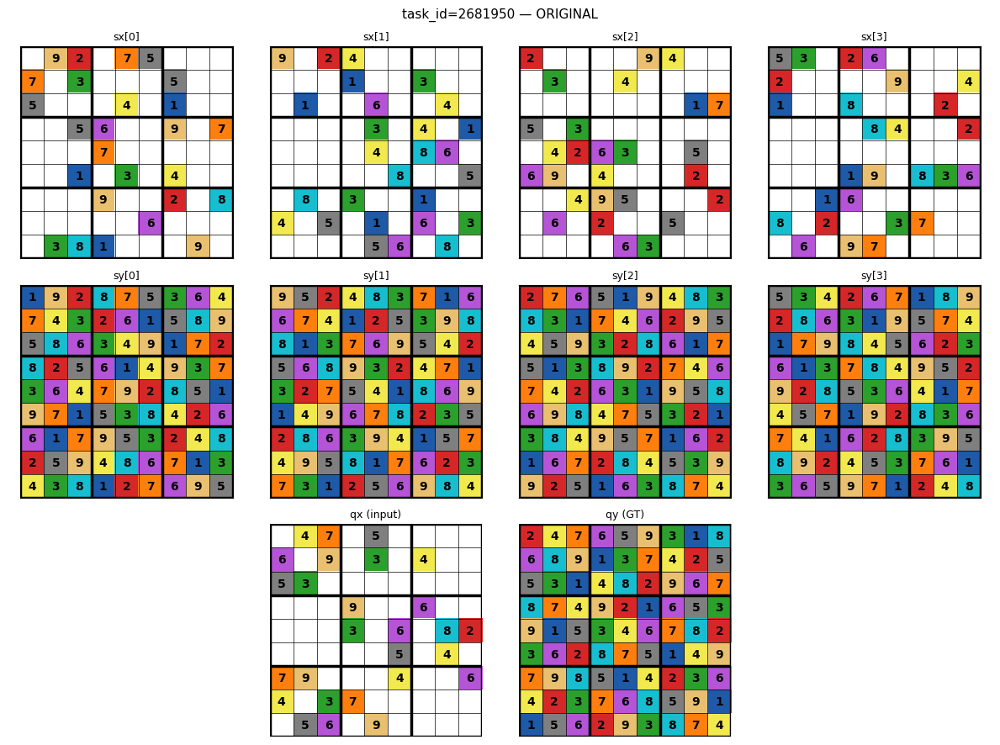

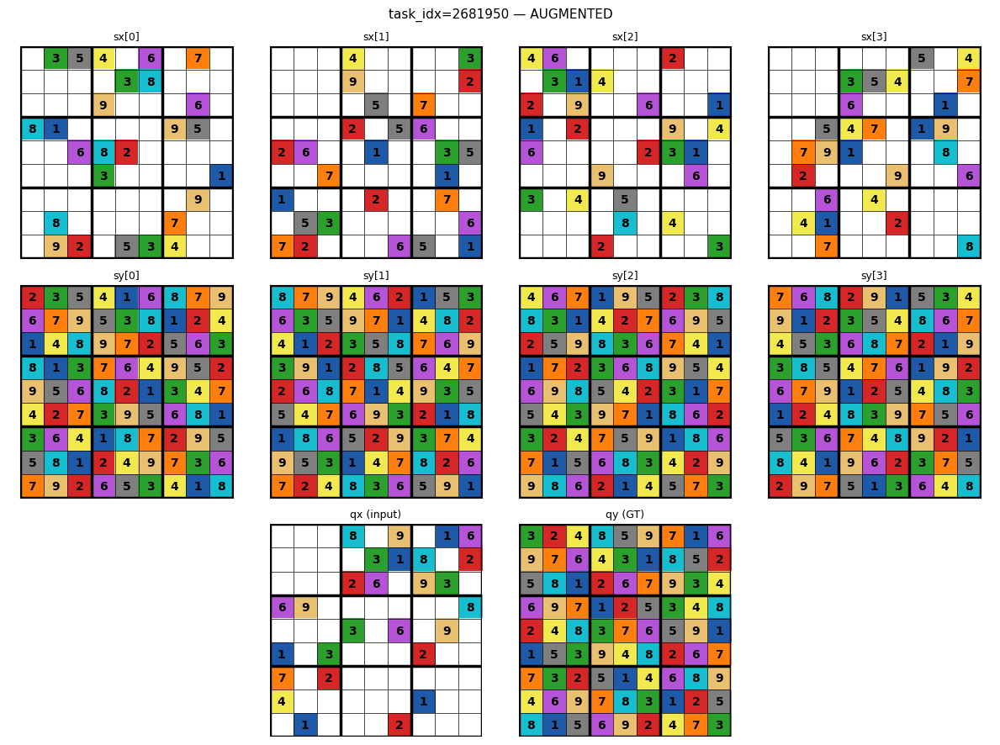

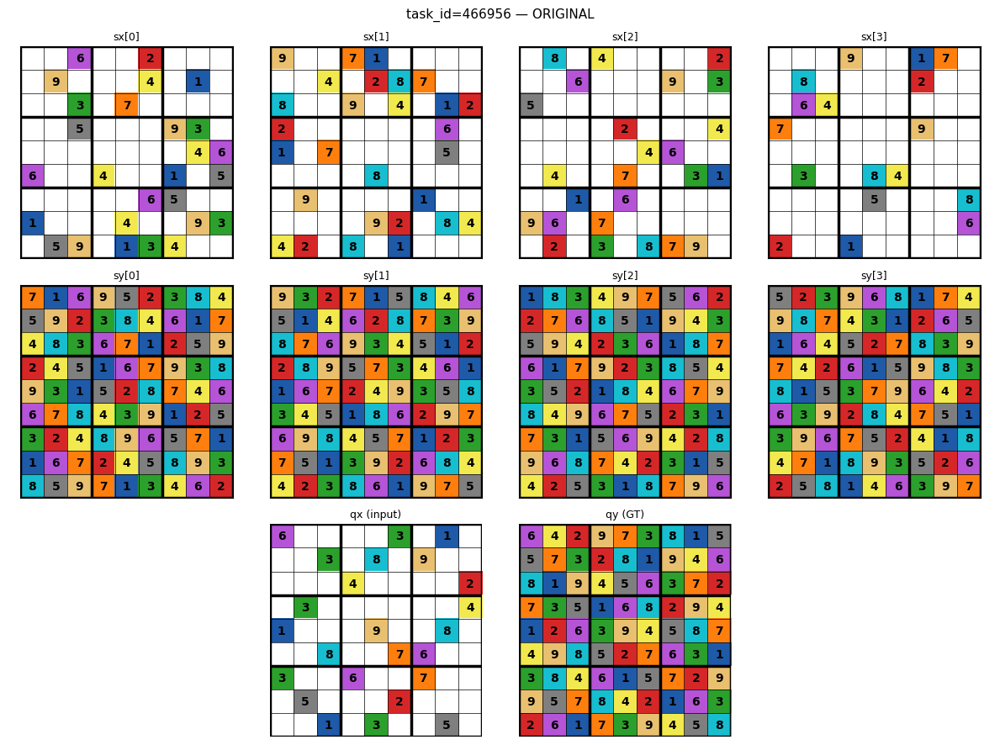

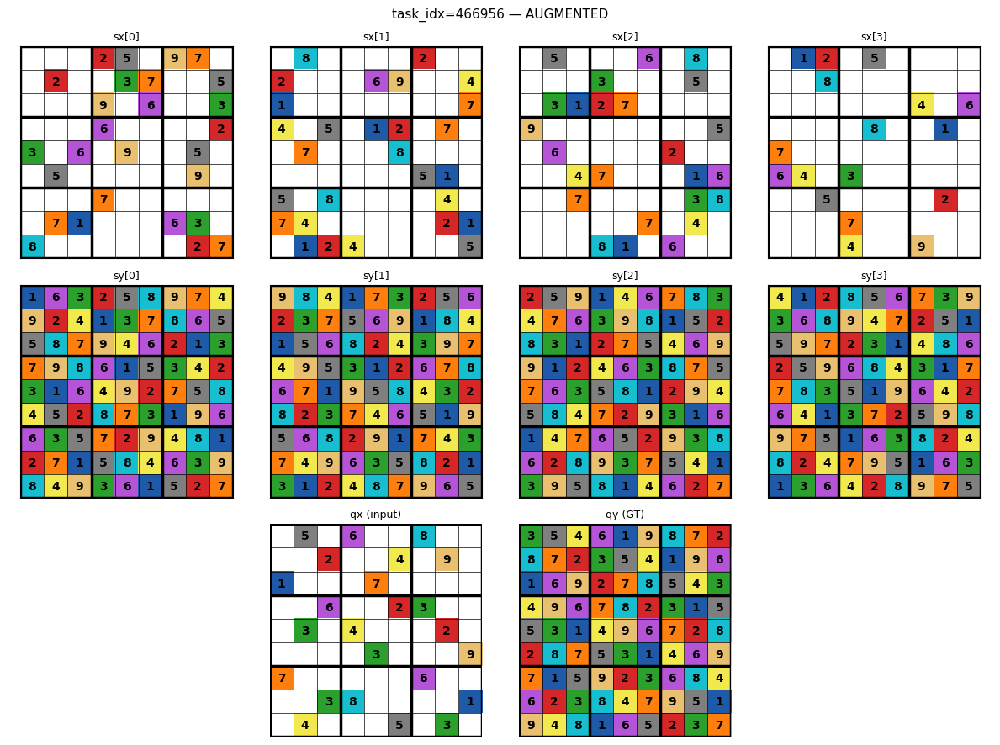

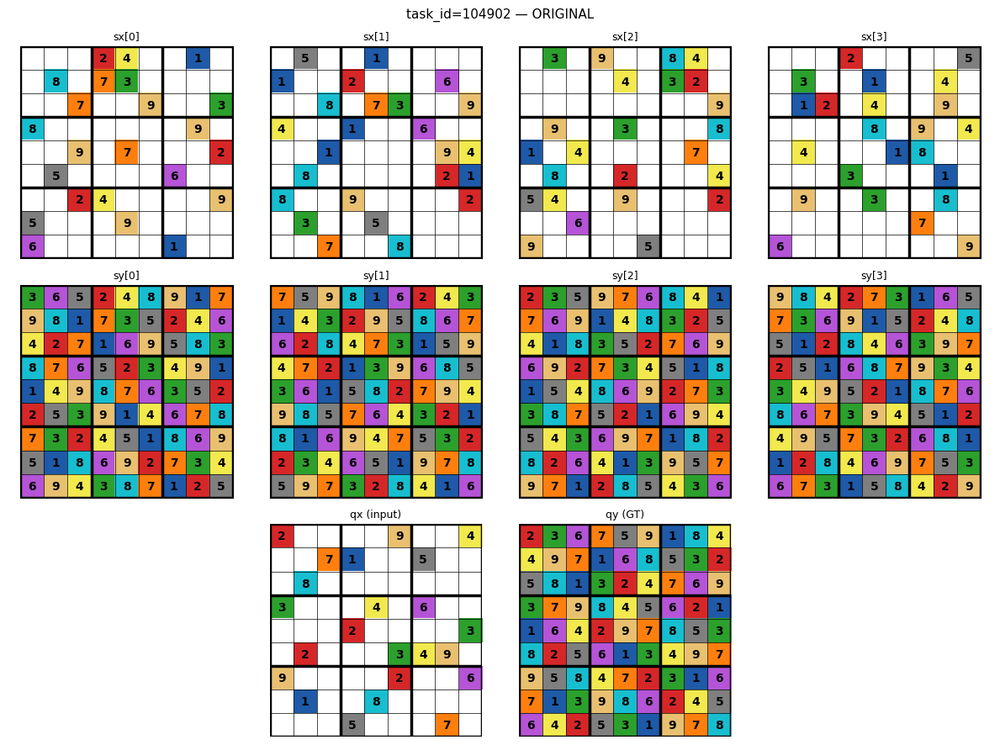

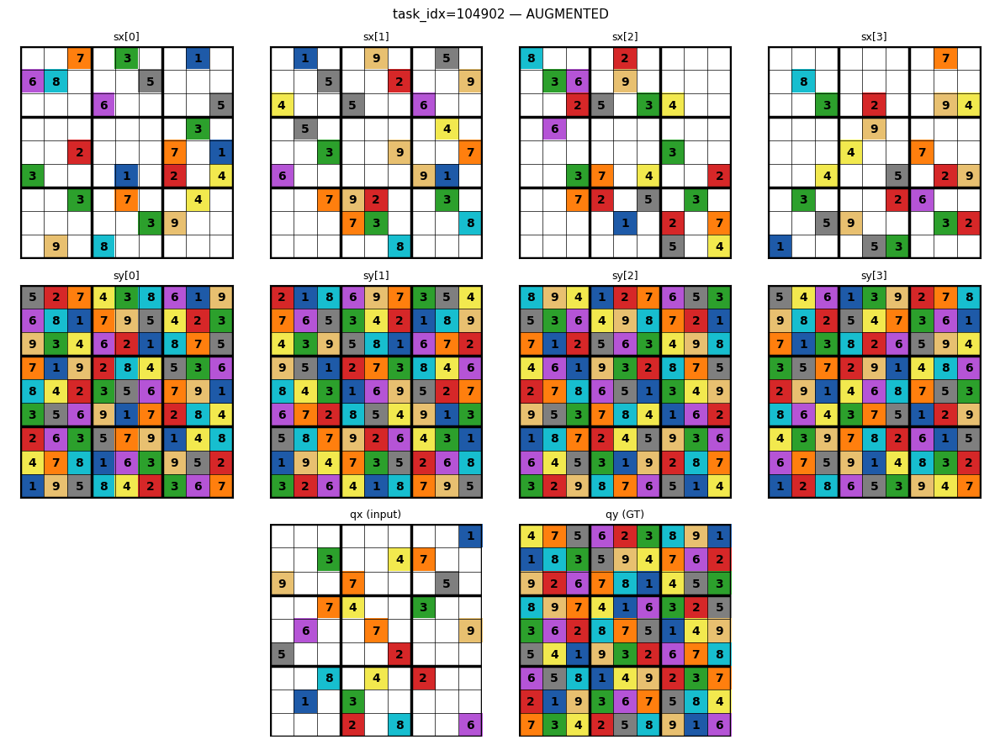

[Viz] ✅ 3 tasks visualized

--- 8. Demo: prediction visualization ---


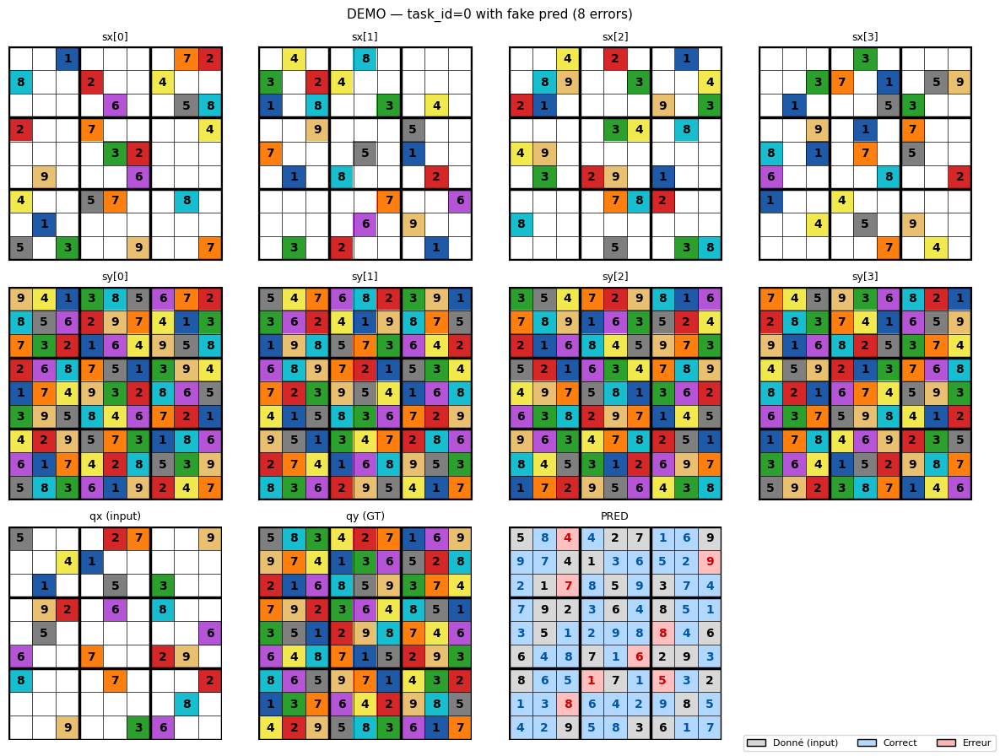


--- 9. Difficulty distribution ---


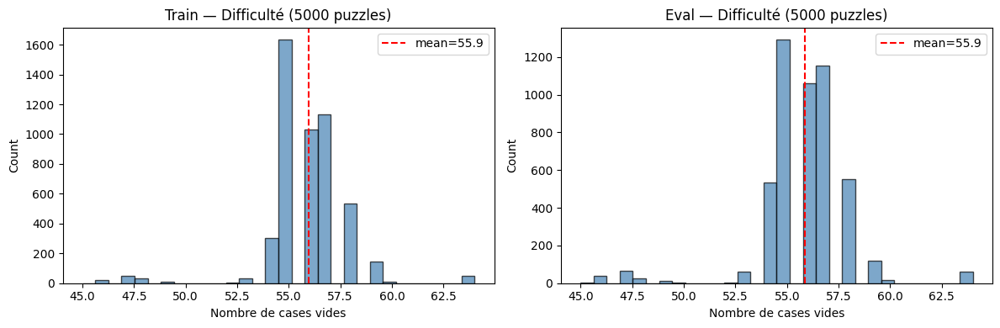

[Difficulty plot] ✅ displayed
ALL CHECKS COMPLETE


In [50]:
"""
CELLULE 2 — Sanity Checks + Visualisation Sudoku (style ARC pipeline)
======================================================================
Layout visu:
  Row 0: sx[0] .. sx[S-1]           (supports input)
  Row 1: sy[0] .. sy[S-1]           (supports output / solutions)
  Row 2: qx | qy (GT) | pred        (query, centré)

Coloration prediction :
  - Noir     : chiffre donné dans l'input (qx != 0)
  - Bleu     : chiffre correctement prédit (pred == qy, qx == 0)
  - Rouge    : erreur de prédiction (pred != qy, qx == 0)
  - Blanc    : case vide (valeur 0)
"""

import random
import numpy as np
import torch
import matplotlib.pyplot as plt
import matplotlib.patches as mpatches
from matplotlib.colors import ListedColormap, BoundaryNorm

# Import depuis le dataset

# ══════════════════════════════════════════════════════
# 0. Rendering helpers
# ══════════════════════════════════════════════════════

# Colormap pour grilles Sudoku normales (input/output)
# 0=blanc (vide), 1..9 = nuances distinctes
SUDOKU_COLORS = [
    "#FFFFFF",  # 0  vide / blanc
    "#1E5AA8",  # 1  bleu
    "#D62728",  # 2  rouge
    "#2CA02C",  # 3  vert
    "#F2E94E",  # 4  jaune
    "#7F7F7F",  # 5  gris
    "#B554D6",  # 6  magenta
    "#FF7F0E",  # 7  orange
    "#17BECF",  # 8  cyan
    "#E8C070",  # 9  beige
]
CMAP_SUDOKU = ListedColormap(SUDOKU_COLORS, name="sudoku10")
NORM_SUDOKU = BoundaryNorm(np.arange(-0.5, 10.5, 1), CMAP_SUDOKU.N)


def _to_np(g):
    """Tensor or ndarray → 2D numpy."""
    if isinstance(g, torch.Tensor):
        g = g.detach().cpu()
        if g.ndim == 3:
            g = g[0]
        return g.numpy().astype(int)
    return np.asarray(g, dtype=int)


def _draw_sudoku_grid(ax, grid_np, *, title="", show_numbers=True, fontsize=10):
    """
    Dessine une grille Sudoku 9×9 sur un axe matplotlib.
    - Cases vides (0) : fond blanc, pas de chiffre
    - Cases remplies  : fond couleur, chiffre affiché
    - Lignes de blocs 3×3 épaisses
    """
    H, W = grid_np.shape
    ax.imshow(grid_np, cmap=CMAP_SUDOKU, norm=NORM_SUDOKU,
              interpolation="nearest", extent=[0, W, H, 0])

    if show_numbers:
        for r in range(H):
            for c in range(W):
                val = grid_np[r, c]
                if val != 0:
                    ax.text(c + 0.5, r + 0.5, str(val),
                            ha="center", va="center",
                            fontsize=fontsize, fontweight="bold", color="black")

    # Lignes fines (cellules)
    for i in range(H + 1):
        lw = 2.5 if i % 3 == 0 else 0.5
        ax.axhline(i, color="black", linewidth=lw)
    for j in range(W + 1):
        lw = 2.5 if j % 3 == 0 else 0.5
        ax.axvline(j, color="black", linewidth=lw)

    ax.set_xlim(0, W)
    ax.set_ylim(H, 0)
    ax.set_xticks([])
    ax.set_yticks([])
    ax.set_title(title, fontsize=9)


def _draw_sudoku_pred(ax, qx_np, qy_np, pred_np, *, title="PRED", fontsize=10):
    """
    Dessine la grille de prédiction avec coloration :
      - Noir  : chiffre donné dans l'input (qx != 0)
      - Bleu  : prédiction correcte (pred == qy, qx == 0)
      - Rouge : erreur (pred != qy, qx == 0)
      - Blanc : case vide (pred == 0, qx == 0)
    """
    H, W = pred_np.shape

    # Créer une image RGB
    img = np.ones((H, W, 3), dtype=float)  # fond blanc

    # Coloration des cellules
    given_mask   = (qx_np != 0)                          # données dans l'input
    correct_mask = (~given_mask) & (pred_np == qy_np) & (pred_np != 0)
    error_mask   = (~given_mask) & (pred_np != qy_np) & (pred_np != 0)
    blank_mask   = (pred_np == 0) & (~given_mask)

    # Couleurs de fond
    COLOR_GIVEN   = np.array([0.85, 0.85, 0.85])   # gris clair
    COLOR_CORRECT = np.array([0.7, 0.85, 1.0])      # bleu clair
    COLOR_ERROR   = np.array([1.0, 0.75, 0.75])     # rouge clair

    img[given_mask]   = COLOR_GIVEN
    img[correct_mask] = COLOR_CORRECT
    img[error_mask]   = COLOR_ERROR
    # blank_mask reste blanc

    ax.imshow(img, interpolation="nearest", extent=[0, W, H, 0])

    # Chiffres
    for r in range(H):
        for c in range(W):
            val = pred_np[r, c]
            if val == 0 and qx_np[r, c] == 0:
                continue  # case vide

            if qx_np[r, c] != 0:
                # Donné dans l'input → noir
                color = "black"
                txt = str(qx_np[r, c])
            elif pred_np[r, c] == qy_np[r, c]:
                # Correct → bleu foncé
                color = "#0055AA"
                txt = str(val)
            else:
                # Erreur → rouge foncé
                color = "#CC0000"
                txt = str(val)

            ax.text(c + 0.5, r + 0.5, txt,
                    ha="center", va="center",
                    fontsize=fontsize, fontweight="bold", color=color)

    # Grille
    for i in range(H + 1):
        lw = 2.5 if i % 3 == 0 else 0.5
        ax.axhline(i, color="black", linewidth=lw)
    for j in range(W + 1):
        lw = 2.5 if j % 3 == 0 else 0.5
        ax.axvline(j, color="black", linewidth=lw)

    ax.set_xlim(0, W)
    ax.set_ylim(H, 0)
    ax.set_xticks([])
    ax.set_yticks([])
    ax.set_title(title, fontsize=9)


# ══════════════════════════════════════════════════════
# SHOW_SUDOKU_TASK — réutilisable dans le train loop
# ══════════════════════════════════════════════════════

def show_sudoku_task(
    batch,
    idx: int = 0,
    *,
    pred=None,
    title: str = "",
    figsize_per_cell: float = 3.0,
    save_path: str = None,
):
    """
    Visualise une tâche Sudoku depuis un batch collated.

    Layout:
      Row 0: sx[0] .. sx[S-1]           (supports input — puzzles)
      Row 1: sy[0] .. sy[S-1]           (supports output — solutions)
      Row 2: qx | qy (GT) | pred        (query, centré)

    Args:
        batch: dict from collate_sudoku (keys: sx, sy, qx, qy, ...)
        idx:   index in the batch
        pred:  optional (9,9) or (B,9,9) tensor — model prediction
        title: custom suptitle
        save_path: if set, saves figure
    """
    sx = batch["sx"][idx]   # (S, 9, 9)
    sy = batch["sy"][idx]
    qx = batch["qx"][idx]   # (9, 9)
    qy = batch["qy"][idx]

    S = int(sx.shape[0])

    # Handle pred
    if pred is not None:
        if isinstance(pred, torch.Tensor):
            pred = pred.detach().cpu()
            if pred.ndim == 3:
                pred = pred[idx]
        pred_np = _to_np(pred)
    else:
        pred_np = None

    # Layout
    n_query_panels = 2 + (1 if pred_np is not None else 0)
    n_cols = max(S, n_query_panels)
    n_rows = 3

    fig, axes = plt.subplots(n_rows, n_cols,
                             figsize=(figsize_per_cell * n_cols,
                                      figsize_per_cell * n_rows))
    if n_cols == 1:
        axes = axes.reshape(n_rows, 1)

    def _blank(ax):
        ax.axis("off")

    # Row 0: supports input
    for s in range(S):
        _draw_sudoku_grid(axes[0, s], _to_np(sx[s]), title=f"sx[{s}]")
    for c in range(S, n_cols):
        _blank(axes[0, c])

    # Row 1: supports output
    for s in range(S):
        _draw_sudoku_grid(axes[1, s], _to_np(sy[s]), title=f"sy[{s}]")
    for c in range(S, n_cols):
        _blank(axes[1, c])

    # Row 2: qx | qy (GT) | pred — centré
    start_col = max(0, (n_cols - n_query_panels) // 2)
    for c in range(n_cols):
        _blank(axes[2, c])

    _draw_sudoku_grid(axes[2, start_col], _to_np(qx), title="qx (input)")
    _draw_sudoku_grid(axes[2, start_col + 1], _to_np(qy), title="qy (GT)")

    if pred_np is not None:
        _draw_sudoku_pred(
            axes[2, start_col + 2],
            _to_np(qx), _to_np(qy), pred_np,
            title="PRED",
        )

    # Legend pour la prédiction
    if pred_np is not None:
        legend_patches = [
            mpatches.Patch(facecolor="#D6D6D6", edgecolor="black", label="Donné (input)"),
            mpatches.Patch(facecolor="#B3D9FF", edgecolor="black", label="Correct"),
            mpatches.Patch(facecolor="#FFB3B3", edgecolor="black", label="Erreur"),
        ]
        fig.legend(handles=legend_patches, loc="lower right", fontsize=8, ncol=3)

    # Title
    if not title:
        tid = int(batch["task_id"][idx]) if "task_id" in batch else -1
        title = f"task_id={tid}"
    fig.suptitle(title, fontsize=11)
    plt.tight_layout()

    if save_path:
        fig.savefig(save_path, dpi=120, bbox_inches="tight")

    plt.show()
    plt.close(fig)


# ══════════════════════════════════════════════════════
# 1. CHECK: Augmentation preserves Sudoku validity
# ══════════════════════════════════════════════════════

def _is_valid_sudoku_solution(grid_np):
    """Vérifie que grid_np (9,9) est une solution Sudoku valide (1..9 partout)."""
    g = grid_np.astype(int)
    if g.min() < 1 or g.max() > 9:
        return False
    # Lignes
    for r in range(9):
        if len(set(g[r])) != 9:
            return False
    # Colonnes
    for c in range(9):
        if len(set(g[:, c])) != 9:
            return False
    # Blocs 3×3
    for br in range(3):
        for bc in range(3):
            block = g[br*3:(br+1)*3, bc*3:(bc+1)*3].flatten()
            if len(set(block)) != 9:
                return False
    return True


def _input_matches_solution(inp_np, sol_np):
    """Vérifie que les cases non-vides de l'input correspondent à la solution."""
    mask = (inp_np != 0)
    return np.all(inp_np[mask] == sol_np[mask])


def check_aug_preserves_validity(ds, n_check=100, n_repeats=5):
    """Vérifie que l'augmentation préserve la validité Sudoku."""
    errors = 0
    for i in range(min(n_check, len(ds))):
        item = ds[i]
        for _ in range(n_repeats):
            sx_a, sy_a, qx_a, qy_a = augment_sudoku_task(
                item["sx"], item["sy"], item["qx"], item["qy"],
                aug_prob=1.0,
            )
            # Vérifier que toutes les solutions restent valides
            for s in range(sx_a.shape[0]):
                sol = _to_np(sy_a[s])
                if not _is_valid_sudoku_solution(sol):
                    errors += 1
                    if errors <= 3:
                        print(f"  ⚠ task {i}: sy[{s}] invalide après aug")
                inp = _to_np(sx_a[s])
                if not _input_matches_solution(inp, sol):
                    errors += 1
                    if errors <= 3:
                        print(f"  ⚠ task {i}: sx[{s}] ne correspond plus à sy[{s}]")

            # Query
            qy_np = _to_np(qy_a)
            if not _is_valid_sudoku_solution(qy_np):
                errors += 1
                if errors <= 3:
                    print(f"  ⚠ task {i}: qy invalide après aug")
            qx_np = _to_np(qx_a)
            if not _input_matches_solution(qx_np, qy_np):
                errors += 1
                if errors <= 3:
                    print(f"  ⚠ task {i}: qx ne correspond plus à qy")

    status = "✅ PASS" if errors == 0 else f"❌ {errors} FAILURES"
    print(f"[Aug preserves validity] {status} ({n_check} tasks × {n_repeats} repeats)")


# ══════════════════════════════════════════════════════
# 2. CHECK: Augmentation coherence (same transform everywhere)
# ══════════════════════════════════════════════════════

def check_aug_coherence(ds, n_check=30, n_repeats=10):
    """
    Vérifie la cohérence : si on duplique qy dans tous les supports,
    après augmentation tous doivent être identiques.
    """
    errors = 0
    for i in range(min(n_check, len(ds))):
        item = ds[i]
        qy = item["qy"].clone()

        # Créer un faux item où tous les supports = qy
        fake_sx = qy.unsqueeze(0).expand(4, -1, -1).clone()
        fake_sy = qy.unsqueeze(0).expand(4, -1, -1).clone()

        for _ in range(n_repeats):
            sx_a, sy_a, _, qy_a = augment_sudoku_task(
                fake_sx.clone(), fake_sy.clone(),
                qy.clone(), qy.clone(),
                aug_prob=1.0,
            )
            # Tous les supports et la query doivent être identiques
            for s in range(4):
                if not torch.equal(sx_a[s], qy_a):
                    errors += 1
                    if errors <= 3:
                        print(f"  ⚠ task {i}: sx[{s}] ≠ qy après aug")
                    break

    status = "✅ PASS" if errors == 0 else f"❌ {errors} FAILURES"
    print(f"[Aug coherence] {status} ({n_check} × {n_repeats})")


# ══════════════════════════════════════════════════════
# 3. CHECK: Augmentation changes something
# ══════════════════════════════════════════════════════

def check_aug_changes_something(ds, n_check=50, n_repeats=20):
    n_always_same = 0
    for i in range(min(n_check, len(ds))):
        item = ds[i]
        qy_orig = item["qy"].clone()
        all_same = True
        for _ in range(n_repeats):
            _, _, _, qy_a = augment_sudoku_task(
                item["sx"], item["sy"], item["qx"], item["qy"],
                aug_prob=1.0,
            )
            if not torch.equal(qy_orig, qy_a):
                all_same = False
                break
        if all_same:
            n_always_same += 1
    pct = n_always_same / min(n_check, len(ds)) * 100
    status = "✅ PASS" if pct < 5 else f"⚠ WARNING ({pct:.0f}% unchanged)"
    print(f"[Aug changes something] {status} ({n_always_same}/{n_check} always same)")


# ══════════════════════════════════════════════════════
# 4. CHECK: Digit 0 preserved by augmentation
# ══════════════════════════════════════════════════════

def check_zero_preserved(ds, n_check=50, n_repeats=5):
    """Vérifie que le 0 (vide) reste 0 après augmentation."""
    errors = 0
    for i in range(min(n_check, len(ds))):
        item = ds[i]
        qx_orig = item["qx"]
        n_zeros_orig = int((qx_orig == 0).sum())
        if n_zeros_orig == 0:
            continue
        for _ in range(n_repeats):
            _, _, qx_a, _ = augment_sudoku_task(
                item["sx"], item["sy"], item["qx"], item["qy"],
                aug_prob=1.0,
            )
            n_zeros_aug = int((qx_a == 0).sum())
            if n_zeros_aug != n_zeros_orig:
                errors += 1
                if errors <= 3:
                    print(f"  ⚠ task {i}: {n_zeros_orig} zeros → {n_zeros_aug}")
                break
    status = "✅ PASS" if errors == 0 else f"❌ {errors} FAILURES"
    print(f"[Zero preserved] {status} ({n_check} tasks × {n_repeats})")


# ══════════════════════════════════════════════════════
# 5. CHECK: Loader shapes & speed
# ══════════════════════════════════════════════════════

def check_loader_shapes(loader, name="loader", n_batches=3):
    import time
    t0 = time.time()
    for i, batch in enumerate(loader):
        if i == 0:
            print(f"[{name}] batch keys: {list(batch.keys())}")
            for k, v in batch.items():
                if isinstance(v, torch.Tensor):
                    print(f"  {k}: shape={tuple(v.shape)} dtype={v.dtype}")
                else:
                    print(f"  {k}: {v}")
        if i >= n_batches - 1:
            break
    dt = time.time() - t0
    print(f"[{name}] {n_batches} batches in {dt:.2f}s ({dt/n_batches:.3f}s/batch)\n")


# ══════════════════════════════════════════════════════
# 6. VISUALIZE: N tasks (original vs augmented)
# ══════════════════════════════════════════════════════

def visualize_tasks(ds, n_tasks=3, show_aug=True, seed=42):
    rng = random.Random(seed)
    indices = rng.sample(range(len(ds)), min(n_tasks, len(ds)))

    for task_idx in indices:
        item = ds[task_idx]

        # Original
        batch_orig = collate_sudoku([item], p_task_aug=0.0)
        show_sudoku_task(batch_orig, 0, title=f"task_id={task_idx} — ORIGINAL")

        # Augmented
        if show_aug:
            batch_aug = collate_sudoku([item], p_task_aug=1.0)
            show_sudoku_task(batch_aug, 0, title=f"task_idx={task_idx} — AUGMENTED")

    print(f"[Viz] ✅ {len(indices)} tasks visualized")


# ══════════════════════════════════════════════════════
# 7. DEMO: prediction visualization
# ══════════════════════════════════════════════════════

def demo_pred_viz(ds, idx=0):
    """Montre show_sudoku_task avec une prédiction (bruit simulé)."""
    item = ds[idx]
    batch = collate_sudoku([item], p_task_aug=0.0)

    # Fake pred : copier la GT et introduire quelques erreurs
    fake_pred = batch["qy"][0].clone()
    # Mettre des erreurs sur quelques cases vides
    qx = batch["qx"][0]
    empty_positions = torch.where(qx.flatten() == 0)[0]
    n_errors = min(8, len(empty_positions))
    if n_errors > 0:
        error_idxs = empty_positions[torch.randperm(len(empty_positions))[:n_errors]]
        for ei in error_idxs:
            r, c = ei // 9, ei % 9
            # Mettre un chiffre différent
            gt_val = int(fake_pred[r, c])
            wrong = (gt_val % 9) + 1
            fake_pred[r, c] = wrong

    show_sudoku_task(
        batch, 0, pred=fake_pred,
        title=f"DEMO — task_id={idx} with fake pred ({n_errors} errors)",
    )


# ══════════════════════════════════════════════════════
# 8. CHECK: Value ranges
# ══════════════════════════════════════════════════════

def check_value_ranges(ds, n_check=200):
    errors = 0
    for i in range(min(n_check, len(ds))):
        item = ds[i]
        qx = item["qx"]
        qy = item["qy"]
        sx = item["sx"]
        sy = item["sy"]

        # qx : 0..9  (0 = vide)
        if qx.min() < 0 or qx.max() > 9:
            errors += 1
        # qy : 1..9  (solution complète)
        if qy.min() < 1 or qy.max() > 9:
            errors += 1
        # sx : 0..9
        if sx.min() < 0 or sx.max() > 9:
            errors += 1
        # sy : 1..9
        if sy.min() < 1 or sy.max() > 9:
            errors += 1

    status = "✅ PASS" if errors == 0 else f"❌ {errors} FAILURES"
    print(f"[Value ranges] {status} ({n_check} items)")


# ══════════════════════════════════════════════════════
# 9. CHECK: Difficulty distribution (blank count)
# ══════════════════════════════════════════════════════

def plot_difficulty_distribution(ds_train, ds_eval):
    """Histogramme du nombre de cases vides (difficulté)."""
    fig, axes = plt.subplots(1, 2, figsize=(12, 4))
    for ax, ds, name in [(axes[0], ds_train, "Train"), (axes[1], ds_eval, "Eval")]:
        blanks = []
        for i in range(min(len(ds), 5000)):
            n_blank = int((ds[i]["qx"] == 0).sum())
            blanks.append(n_blank)
        ax.hist(blanks, bins=30, color="steelblue", edgecolor="black", alpha=0.7)
        ax.set_xlabel("Nombre de cases vides")
        ax.set_ylabel("Count")
        ax.set_title(f"{name} — Difficulté ({len(blanks)} puzzles)")
        ax.axvline(np.mean(blanks), color="red", linestyle="--",
                   label=f"mean={np.mean(blanks):.1f}")
        ax.legend()
    plt.tight_layout()
    plt.show()
    print("[Difficulty plot] ✅ displayed")


# ══════════════════════════════════════════════════════
# RUN ALL CHECKS
# ══════════════════════════════════════════════════════

if __name__ == "__main__":
   

    print("=" * 60)
    print("SUDOKU SANITY CHECKS")
    print("=" * 60)

    ds_train, ds_trainext, ds_eval, n_total, train_loader, eval_loader, txl = build_all(
        root=".", batch_size=32, p_task_aug_train=0.8,
    )

    print("\n--- 1. Value ranges ---")
    check_value_ranges(ds_train, n_check=200)
    check_value_ranges(ds_eval, n_check=200)

    print("\n--- 2. Augmentation preserves Sudoku validity ---")
    check_aug_preserves_validity(ds_train, n_check=50, n_repeats=5)

    print("\n--- 3. Augmentation coherence ---")
    check_aug_coherence(ds_train, n_check=30, n_repeats=10)

    print("\n--- 4. Augmentation changes something ---")
    check_aug_changes_something(ds_train, n_check=50)

    print("\n--- 5. Zero (blank) preserved ---")
    check_zero_preserved(ds_train, n_check=50, n_repeats=5)

    print("\n--- 6. Loader shapes & speed ---")
    check_loader_shapes(tl, "train_loader")
    check_loader_shapes(txl, "trainext_loader")
    check_loader_shapes(el, "eval_loader")

    print("\n--- 7. Visual examples (original + augmented) ---")
    visualize_tasks(ds_train, n_tasks=3, show_aug=True)

    print("\n--- 8. Demo: prediction visualization ---")
    demo_pred_viz(ds_train, idx=0)

    print("\n--- 9. Difficulty distribution ---")
    plot_difficulty_distribution(ds_train, ds_eval)

    print("=" * 60)
    print("ALL CHECKS COMPLETE")
    print("=" * 60)

# Model 

In [5]:
import math
import torch
import torch.nn as nn
import torch.nn.functional as F
from torch.utils.checkpoint import checkpoint
from typing import Optional


# ════════════════════════════════════════════════════════════════
# Helpers
# ════════════════════════════════════════════════════════════════

def _force_keep_at_least_one(keep: torch.Tensor) -> torch.Tensor:
    """Garantit qu'au moins un token est non-masqué par batch item."""
    all_masked = ~keep.any(dim=-1)
    if all_masked.any():
        keep = keep.clone()
        keep[all_masked, 0] = True
    return keep


def _sanitize(t: torch.Tensor,
               lo: float = -50.0, hi: float = 50.0) -> torch.Tensor:
    return torch.nan_to_num(t, nan=0.0, posinf=hi, neginf=lo).clamp(lo, hi)


# ════════════════════════════════════════════════════════════════
# Norms & FFN
# ════════════════════════════════════════════════════════════════

class RMSNorm(nn.Module):
    def __init__(self, dim: int, eps: float = 1e-6):
        super().__init__()
        self.eps    = eps
        self.weight = nn.Parameter(torch.ones(dim))

    def forward(self, x: torch.Tensor) -> torch.Tensor:
        w = self.weight.to(dtype=x.dtype)
        if hasattr(F, "rms_norm"):
            return F.rms_norm(x, self.weight.shape, weight=w, eps=self.eps)
        inv = torch.rsqrt(x.float().pow(2).mean(-1, keepdim=True) + self.eps)
        return (x.float() * inv).to(x.dtype) * w


class SwiGLUFFN(nn.Module):
    def __init__(self, d_model: int, expand: float = 2.0, dropout: float = 0.1):
        super().__init__()
        hidden       = ((int(d_model * expand) + 7) // 8) * 8
        self.w_gate  = nn.Linear(d_model, hidden, bias=False)
        self.w_up    = nn.Linear(d_model, hidden, bias=False)
        self.w_down  = nn.Linear(hidden,  d_model, bias=False)
        self.drop    = nn.Dropout(dropout)

    def forward(self, x: torch.Tensor) -> torch.Tensor:
        return self.drop(self.w_down(F.silu(self.w_gate(x)) * self.w_up(x)))


# ════════════════════════════════════════════════════════════════
# ARCEmbedder
# ════════════════════════════════════════════════════════════════

class ARCEmbedder(nn.Module):
    def __init__(self, *, vocab_size=12, d=128, Hmax=30, Wmax=30,
                 eos_id=10, pad_id=11, n_types=4, Smax=8,
                 n_tasks=2048, use_task_id=True, dropout=0.1):
        super().__init__()
        self.d          = int(d)
        self.vocab_size = int(vocab_size)
        self.Hmax       = int(Hmax)
        self.Wmax       = int(Wmax)
        self.pad_id     = int(pad_id)
        self.eos_id     = int(eos_id)

        self.emb_tok  = nn.Embedding(vocab_size, d)
        self.emb_row  = nn.Embedding(Hmax, d)
        self.emb_col  = nn.Embedding(Wmax, d)
        self.emb_type = nn.Embedding(n_types, d)
        self.emb_pair = nn.Embedding(Smax, d)
        self.norm     = nn.LayerNorm(d)
        self.drop     = nn.Dropout(float(dropout))

        for emb in [self.emb_tok, self.emb_row, self.emb_col,
                    self.emb_type, self.emb_pair]:
            nn.init.normal_(emb.weight, std=0.02)

        self.use_task_id = bool(use_task_id)
        self.n_tasks     = int(n_tasks)
        if self.use_task_id:
            self.emb_task = nn.Embedding(self.n_tasks, d)
            nn.init.normal_(self.emb_task.weight, std=0.02)

    def forward(self, x, type_id, pair_id=None, task_id=None, return_mask=False):
        if x.dtype != torch.long:
            x = x.long()
        B, H, W = x.shape
        L       = H * W
        device  = x.device
        x_flat  = x.reshape(B, L)

        e    = self.emb_tok(x_flat.clamp(0, self.vocab_size - 1))
        rows = torch.arange(H, device=device)
        cols = torch.arange(W, device=device)
        pos  = (self.emb_row(rows)[:, None, :] +
                self.emb_col(cols)[None, :, :]).reshape(1, L, self.d)
        e    = e + pos

        type_id = self._to_long_vector(type_id, B, device).clamp(
            0, self.emb_type.num_embeddings - 1)
        e = e + self.emb_type(type_id)[:, None, :]

        if pair_id is not None:
            pair_id = self._to_long_vector(pair_id, B, device).clamp(
                0, self.emb_pair.num_embeddings - 1)
            e = e + self.emb_pair(pair_id)[:, None, :]

        if self.use_task_id and task_id is not None:
            tid = self._to_long_vector(task_id, B, device).clamp(0, self.n_tasks - 1)
            e   = e + self.emb_task(tid)[:, None, :]

        e = self.drop(self.norm(e))

        mask_keep = (x_flat != self.pad_id)
        all_pad   = (~mask_keep).all(dim=1)
        if all_pad.any():
            mask_keep          = mask_keep.clone()
            mask_keep[all_pad, 0] = True

        if return_mask:
            return e, mask_keep
        return e

    @staticmethod
    def _to_long_vector(val, B, device):
        if isinstance(val, int):
            return torch.full((B,), val, device=device, dtype=torch.long)
        t      = val.to(device=device, dtype=torch.long)
        if t.numel() == 1:
            return t.view(1).expand(B)
        t_flat = t.reshape(-1)
        if t_flat.shape[0] < B:
            pad    = t_flat[-1:].expand(B - t_flat.shape[0])
            t_flat = torch.cat([t_flat, pad], dim=0)
        return t_flat[:B]


# ════════════════════════════════════════════════════════════════
# RoPE 2D
# ════════════════════════════════════════════════════════════════

class RoPE2D(nn.Module):
    def __init__(self, d_head: int, max_h: int = 30, max_w: int = 30,
                 theta: float = 10000.0):
        super().__init__()
        assert d_head % 4 == 0
        self.d_head  = d_head
        self.d_quat  = d_head // 4
        inv_freq     = 1.0 / (theta ** (
            torch.arange(0, self.d_quat, dtype=torch.float) / self.d_quat))
        self.register_buffer("inv_freq", inv_freq, persistent=False)
        self._build_cache(max_h, max_w)

    def _build_cache(self, H: int, W: int):
        device  = self.inv_freq.device
        rows    = torch.arange(H, dtype=torch.float, device=device)
        cols    = torch.arange(W, dtype=torch.float, device=device)
        fr      = torch.outer(rows, self.inv_freq)[:, None, :].expand(H, W, self.d_quat)
        fc      = torch.outer(cols, self.inv_freq)[None, :, :].expand(H, W, self.d_quat)
        emb_r   = fr.reshape(H * W, self.d_quat).repeat(1, 2)
        emb_c   = fc.reshape(H * W, self.d_quat).repeat(1, 2)
        emb     = torch.cat([emb_r, emb_c], dim=-1)
        self.register_buffer("cos_cached", emb.cos(), persistent=False)
        self.register_buffer("sin_cached", emb.sin(), persistent=False)
        self._cached_hw = (H, W)

    def _rotate_half(self, x):
        x1, x2 = x[..., ::2], x[..., 1::2]
        return torch.stack((-x2, x1), dim=-1).flatten(-2)

    def forward(self, q, k, H: int, W: int):
        ch, cw = getattr(self, "_cached_hw", (0, 0))
        if ch < H or cw < W:
            self._build_cache(max(H, ch), max(W, cw))
        Hc, Wc = self._cached_hw
        idx = (torch.arange(H, device=q.device)[:, None] * Wc +
               torch.arange(W, device=q.device)[None, :]).reshape(-1).long()
        cos = self.cos_cached[idx].to(q.dtype)[None, None]
        sin = self.sin_cached[idx].to(q.dtype)[None, None]
        return (q * cos + self._rotate_half(q) * sin,
                k * cos + self._rotate_half(k) * sin)


# ════════════════════════════════════════════════════════════════
# Attention modules
# ════════════════════════════════════════════════════════════════

class MultiHeadSelfAttention(nn.Module):
    def __init__(self, d_model: int, n_head: int, dropout: float = 0.1, *,
                 use_rope_2d: bool = False, max_h: int = 30, max_w: int = 30,
                 use_qk_norm: bool = False):
        super().__init__()
        assert d_model % n_head == 0
        self.n_head      = n_head
        self.d_head      = d_model // n_head
        self.dropout     = float(dropout)
        self.qkv         = nn.Linear(d_model, 3 * d_model)
        self.out         = nn.Linear(d_model, d_model)
        self.use_rope_2d = bool(use_rope_2d)
        if self.use_rope_2d:
            self.rope = RoPE2D(self.d_head, max_h=max_h, max_w=max_w)
        self.use_qk_norm = bool(use_qk_norm)
        if self.use_qk_norm:
            self.q_norm = RMSNorm(self.d_head)
            self.k_norm = RMSNorm(self.d_head)

    def forward(self, x, *, key_padding_keep=None, grid_hw=None):
        B, N, D = x.shape
        qkv     = self.qkv(x).reshape(B, N, 3, self.n_head, self.d_head)
        q, k, v = qkv.unbind(2)
        q, k, v = q.transpose(1, 2), k.transpose(1, 2), v.transpose(1, 2)
        if self.use_qk_norm:
            q, k = self.q_norm(q), self.k_norm(k)
        if self.use_rope_2d and grid_hw is not None:
            q, k = self.rope(q, k, int(grid_hw[0]), int(grid_hw[1]))
        attn_mask = None
        if key_padding_keep is not None:
            keep      = _force_keep_at_least_one(key_padding_keep)
            attn_mask = torch.zeros(B, 1, 1, N, device=x.device, dtype=torch.float32)
            attn_mask.masked_fill_(~keep[:, None, None, :], float("-inf"))
        y = F.scaled_dot_product_attention(
            q, k, v, attn_mask=attn_mask,
            dropout_p=self.dropout if self.training else 0.0)
        return self.out(y.transpose(1, 2).reshape(B, N, D))


class CrossAttention(nn.Module):
    def __init__(self, d_model: int, n_head: int, dropout: float = 0.1, *,
                 use_qk_norm: bool = False):
        super().__init__()
        assert d_model % n_head == 0
        self.n_head      = n_head
        self.d_head      = d_model // n_head
        self.dropout     = float(dropout)
        self.wq          = nn.Linear(d_model, d_model)
        self.wk          = nn.Linear(d_model, d_model)
        self.wv          = nn.Linear(d_model, d_model)
        self.wo          = nn.Linear(d_model, d_model)
        self.use_qk_norm = bool(use_qk_norm)
        if self.use_qk_norm:
            self.q_norm = RMSNorm(self.d_head)
            self.k_norm = RMSNorm(self.d_head)

    def forward(self, q, kv, *, kv_keep=None):
        B, M, D = q.shape
        N       = kv.shape[1]
        Q = self.wq(q).reshape(B, M, self.n_head, self.d_head).transpose(1, 2)
        K = self.wk(kv).reshape(B, N, self.n_head, self.d_head).transpose(1, 2)
        V = self.wv(kv).reshape(B, N, self.n_head, self.d_head).transpose(1, 2)
        if self.use_qk_norm:
            Q, K = self.q_norm(Q), self.k_norm(K)
        attn_mask = None
        if kv_keep is not None:
            keep      = _force_keep_at_least_one(kv_keep)
            attn_mask = torch.zeros(B, 1, 1, N, device=q.device, dtype=torch.float32)
            attn_mask.masked_fill_(~keep[:, None, None, :], float("-inf"))
        y = F.scaled_dot_product_attention(
            Q, K, V, attn_mask=attn_mask,
            dropout_p=self.dropout if self.training else 0.0)
        return self.wo(y.transpose(1, 2).reshape(B, M, D))


# ════════════════════════════════════════════════════════════════
# TRMSelfBlock
# ════════════════════════════════════════════════════════════════

class TRMSelfBlock(nn.Module):
    def __init__(self, d: int, n_heads: int = 4, dropout: float = 0.1,
                 use_rope_2d: bool = False, use_qk_norm: bool = False):
        super().__init__()
        self.pre_sa = RMSNorm(d)
        self.sa     = MultiHeadSelfAttention(d, n_heads, dropout,
                                             use_rope_2d=use_rope_2d,
                                             use_qk_norm=use_qk_norm)
        self.pre_ff = RMSNorm(d)
        self.ff     = SwiGLUFFN(d, expand=2.0, dropout=dropout)
        self.drop   = nn.Dropout(dropout)

    def forward(self, x, *, key_padding_keep=None, grid_hw=None):
        x = x + self.drop(self.sa(self.pre_sa(x),
                                   key_padding_keep=key_padding_keep,
                                   grid_hw=grid_hw))
        x = x + self.drop(self.ff(self.pre_ff(x)))
        return x


# ════════════════════════════════════════════════════════════════
# PsiMemProg
# ════════════════════════════════════════════════════════════════

# ════════════════════════════════════════════════════════════════
# PsiMemProg — version Interactive (co-raffinage P↔M)
# ════════════════════════════════════════════════════════════════

class PsiMemProg(nn.Module):
    """
    Ψ_interactive : (sx_i, sy_i)_{i=0..S-1}  →  ctx  (programme abstrait)

    Architecture interactive en T_psi itérations :
        supp → M_0  (init par cross-attention sur supports)
        for t in range(T_psi):
            M_t ← M_t + xa(M_t, supp)        # mémoire re-lit les supports
            M_t ← M_t + xa(M_t, P_t)         # mémoire guidée par le programme
            P_t ← P_t + xa(P_t, M_t)         # programme se raffine depuis M
            P_t ← P_t + ff(P_t)
        ctx = Refine(P_T)

    Le feedback P→M est le cœur du "Interactive" dans IERM.
    P guide ce que M doit encore chercher dans S.
    """
    def __init__(self, embedder, D_phi: int, D_psi: int, n_heads: int = 4,
                 n_mem: int = 64, n_prog: int = 16, dropout: float = 0.1,
                 pad_id: int = 11, eos_id: int = 10, refine_layers: int = 1,
                 T_psi: int = 2):          # ← nouveau : nb d'itérations P↔M
        super().__init__()
        self.emb    = embedder
        self.D_phi  = int(D_phi)
        self.D_psi  = int(D_psi)
        self.pad_id = int(pad_id)
        self.eos_id = int(eos_id)
        self.n_mem  = int(n_mem)
        self.n_prog = int(n_prog)
        self.T_psi  = int(T_psi)

        self.proj = (nn.Linear(D_phi, D_psi, bias=False)
                     if D_phi != D_psi else nn.Identity())
        if D_phi != D_psi:
            nn.init.normal_(self.proj.weight, std=0.02)

        self.mem_tokens  = nn.Parameter(torch.randn(n_mem,  D_psi) * 0.02)
        self.prog_tokens = nn.Parameter(torch.randn(n_prog, D_psi) * 0.02)

        # ── Stage 1 : Memory init (supp → M) ─────────────────
        self.mem_init_pre_kv = RMSNorm(D_psi)
        self.mem_init_pre_q  = RMSNorm(D_psi)
        self.mem_init_xa     = CrossAttention(D_psi, n_heads, dropout, use_qk_norm=True)
        self.mem_init_pre_ff = RMSNorm(D_psi)
        self.mem_init_ff     = SwiGLUFFN(D_psi, dropout=dropout)
        self.mem_init_drop   = nn.Dropout(dropout)

        # ── Boucle interactive P↔M ────────────────────────────
        # M re-lit supp (guidé par P)
        self.loop_m_supp_pre_kv = RMSNorm(D_psi)
        self.loop_m_supp_pre_q  = RMSNorm(D_psi)
        self.loop_m_supp_xa     = CrossAttention(D_psi, n_heads, dropout, use_qk_norm=True)

        # M lit P (feedback programme → mémoire)
        self.loop_m_prog_pre_kv = RMSNorm(D_psi)
        self.loop_m_prog_pre_q  = RMSNorm(D_psi)
        self.loop_m_prog_xa     = CrossAttention(D_psi, n_heads, dropout, use_qk_norm=True)
        self.loop_m_ff_pre      = RMSNorm(D_psi)
        self.loop_m_ff          = SwiGLUFFN(D_psi, dropout=dropout)
        self.loop_m_drop        = nn.Dropout(dropout)

        # P lit M (programme se raffine depuis mémoire)
        self.loop_p_mem_pre_kv  = RMSNorm(D_psi)
        self.loop_p_mem_pre_q   = RMSNorm(D_psi)
        self.loop_p_mem_xa      = CrossAttention(D_psi, n_heads, dropout, use_qk_norm=True)
        self.loop_p_ff_pre      = RMSNorm(D_psi)
        self.loop_p_ff          = SwiGLUFFN(D_psi, expand=2.0, dropout=dropout)
        self.loop_p_drop        = nn.Dropout(dropout)

        # Gate appris pour le feedback P→M (évite explosion au début)
        # sigmoid(-1.0) ≈ 0.27 : le feedback s'ouvre progressivement
        self.p2m_gate = nn.Parameter(torch.full((D_psi,), -1.0))

        # ── Stage final : Refine(P) ───────────────────────────
        self.refine = nn.ModuleList([
            TRMSelfBlock(D_psi, n_heads=n_heads, dropout=dropout, use_qk_norm=True)
            for _ in range(refine_layers)
        ])

    # ──────────────────────────────────────────────────────────
    def forward(self, sx, sy, s_mask=None, task_id=None):
        B, S, H, W = sx.shape
        device     = sx.device
        L          = H * W

        # ── Embedding des supports ────────────────────────────
        sx_flat  = sx.reshape(B * S, H, W)
        sy_flat  = sy.reshape(B * S, H, W)
        pair_ids = torch.arange(S, device=device).unsqueeze(0).expand(B, S).reshape(B * S)

        t = None
        if task_id is not None:
            t = self.emb._to_long_vector(task_id, B, device)
            t = t.view(B, 1).expand(B, S).reshape(B * S)

        ex, mx = self.emb(sx_flat, type_id=0, pair_id=pair_ids,
                          task_id=t, return_mask=True)
        ey, my = self.emb(sy_flat, type_id=1, pair_id=pair_ids,
                          task_id=t, return_mask=True)

        ex = self.proj(ex)
        ey = self.proj(ey)

        supp      = torch.cat([ex, ey], dim=1).reshape(B, S * 2 * L, self.D_psi)
        supp_keep = torch.cat([mx, my], dim=1).reshape(B, S * 2 * L)

        if s_mask is not None:
            sm        = s_mask.bool()
            sm_exp    = sm[:, :, None].expand(B, S, 2 * L).reshape(B, S * 2 * L)
            supp_keep = supp_keep & sm_exp

        supp_keep = _force_keep_at_least_one(supp_keep)

        # ── Stage 1 : Memory init (supp → M_0) ───────────────
        M = self.mem_tokens.unsqueeze(0).expand(B, -1, -1).clone()
        M = M + self.mem_init_drop(
            self.mem_init_xa(self.mem_init_pre_q(M),
                             self.mem_init_pre_kv(supp),
                             kv_keep=supp_keep))
        M = M + self.mem_init_drop(self.mem_init_ff(self.mem_init_pre_ff(M)))

        # ── Init P_0 ──────────────────────────────────────────
        P = self.prog_tokens.unsqueeze(0).expand(B, -1, -1).clone()

        # ── Boucle interactive P↔M ────────────────────────────
        p2m_gate = torch.sigmoid(self.p2m_gate).view(1, 1, -1)

        for _ in range(self.T_psi):

            # M re-lit supp (attention guidée par P via gate)
            M = M + self.loop_m_drop(
                self.loop_m_supp_xa(
                    self.loop_m_supp_pre_q(M),
                    self.loop_m_supp_pre_kv(supp),
                    kv_keep=supp_keep))

            # Feedback P → M : la mémoire se focalise sur ce que P cherche
            M = M + p2m_gate * self.loop_m_drop(
                self.loop_m_prog_xa(
                    self.loop_m_prog_pre_q(M),
                    self.loop_m_prog_pre_kv(P)))
            M = M + self.loop_m_drop(self.loop_m_ff(self.loop_m_ff_pre(M)))

            # P se raffine depuis M
            P = P + self.loop_p_drop(
                self.loop_p_mem_xa(
                    self.loop_p_mem_pre_q(P),
                    self.loop_p_mem_pre_kv(M)))
            P = P + self.loop_p_drop(self.loop_p_ff(self.loop_p_ff_pre(P)))

        # ── Stage final : Refine(P) ───────────────────────────
        p_keep = torch.ones(B, self.n_prog, device=device, dtype=torch.bool)
        for blk in self.refine:
            P = blk(P, key_padding_keep=p_keep)

        P = _sanitize(P)

        return {
            "ctx":       P,
            "ctx_keep":  p_keep,
            "M":         M,
            "supp":      supp,
            "supp_keep": supp_keep,
        }
# ════════════════════════════════════════════════════════════════
# PhiTRM  — version corrigée + optimisée
# ════════════════════════════════════════════════════════════════

class PhiTRM(nn.Module):
    def __init__(self, *, d_model: int, vocab_size: int, n_heads: int,
                 n_inner: int, T_max: int, d_psi: Optional[int] = None,
                 dropout: float = 0.1, use_rope_2d: bool = True,
                 use_qk_norm: bool = True, pad_id: int = 11,
                 eos_id: int = 10, z_tokens: int = 8):
        super().__init__()
        self.D          = int(d_model)
        self.vocab_size = int(vocab_size)
        self.pad_id     = int(pad_id)
        self.eos_id     = int(eos_id)
        self.T_max      = int(T_max)
        self.z_tokens   = int(z_tokens)
        self.n_inner    = int(n_inner)

        D_psi = int(d_psi) if d_psi else self.D
        if D_psi != self.D:
            self.ctx_proj = nn.Linear(D_psi, self.D, bias=False)
            nn.init.normal_(self.ctx_proj.weight, std=0.02)
        else:
            self.ctx_proj = nn.Identity()
        self.ctx_norm = RMSNorm(self.D)

        self.z_init = nn.Parameter(torch.randn(z_tokens, self.D) * 0.02)
        self.drop   = nn.Dropout(float(dropout))

        # ── z pathway ────────────────────────────────────────────
        self.z_pre_sa   = RMSNorm(self.D)
        self.z_sa       = MultiHeadSelfAttention(
            self.D, n_heads, dropout, use_qk_norm=use_qk_norm)

        self.z_pre_y    = RMSNorm(self.D)
        self.z_xa_y     = CrossAttention(self.D, n_heads, dropout,
                                          use_qk_norm=use_qk_norm)

        self.z_pre_x    = RMSNorm(self.D)
        self.z_xa_x     = CrossAttention(self.D, n_heads, dropout,
                                          use_qk_norm=use_qk_norm)

        self.z_pre_ctx  = RMSNorm(self.D)
        self.z_xa_ctx   = CrossAttention(self.D, n_heads, dropout,
                                          use_qk_norm=use_qk_norm)

        # [REMOVED] z_xa_supp — was a shortcut letting Φ bypass ctx
        # Φ must use ctx (the abstract program) to access support info

        self.z_pre_ff   = RMSNorm(self.D)
        self.z_ff       = SwiGLUFFN(self.D, expand=2.0, dropout=dropout)

        # [FIX BUG-7] z_recalib_gate : -2.0 → -1.0
        # Avec Ψ_lift = +0.02, le gate est trop fermé à -2.0 (sigmoid=0.12)
        # -1.0 donne sigmoid≈0.27 → le programme peut corriger z plus tôt
        self.z_recalib_pre_q  = RMSNorm(self.D)
        self.z_recalib_pre_kv = RMSNorm(self.D)
        self.z_recalib_xa     = CrossAttention(self.D, n_heads, dropout,
                                                use_qk_norm=use_qk_norm)
        self.z_recalib_pre_ff = RMSNorm(self.D)
        self.z_recalib_ff     = SwiGLUFFN(self.D, expand=2.0, dropout=dropout)
        self.z_recalib_drop   = nn.Dropout(float(dropout))
        self.z_recalib_gate   = nn.Parameter(torch.full((self.D,), -1.0))  # was -2.0

        # ── y pathway ────────────────────────────────────────────
        self.y_pre_sa   = RMSNorm(self.D)
        self.y_sa       = MultiHeadSelfAttention(
            self.D, n_heads, dropout,
            use_rope_2d=use_rope_2d, use_qk_norm=use_qk_norm)

        self.y_pre_z    = RMSNorm(self.D)
        self.y_xa_z     = CrossAttention(self.D, n_heads, dropout,
                                          use_qk_norm=use_qk_norm)

        self.y_pre_ctx  = RMSNorm(self.D)
        self.y_xa_ctx   = CrossAttention(self.D, n_heads, dropout,
                                          use_qk_norm=use_qk_norm)

        self.y_pre_ff   = RMSNorm(self.D)
        self.y_ff       = SwiGLUFFN(self.D, expand=2.0, dropout=dropout)

        # ── Output heads (copy-rewrite) ───────────────────────────
        head_in        = 4 * self.D
        self.norm_out  = RMSNorm(self.D)
        self.mask_head = nn.Sequential(
            RMSNorm(head_in), nn.Linear(head_in, self.D), nn.GELU(),
            nn.Linear(self.D, 1))
        nn.init.constant_(self.mask_head[-1].bias, 0.0)
        self.val_head  = nn.Sequential(
            RMSNorm(head_in), nn.Linear(head_in, self.D), nn.GELU(),
            nn.Linear(self.D, vocab_size))
        self.q_head    = nn.Sequential(RMSNorm(self.D), nn.Linear(self.D, 1))

    # ──────────────────────────────────────────────────────────
    def init_z(self, B: int, device, dtype):
        # [OPT-3] contiguous clone au lieu de expand
        z      = self.z_init.unsqueeze(0).expand(B, -1, -1).clone().to(
            device=device, dtype=dtype)
        z_keep = torch.ones(B, self.z_tokens, device=device, dtype=torch.bool)
        return z, z_keep

    def set_n_inner(self, n: int):
        self.n_inner = int(n)

    # ──────────────────────────────────────────────────────────
    # [REMOVED] _project_supp — no longer needed since z_xa_supp is removed

    # ──────────────────────────────────────────────────────────
    def latent_recursion(self, x, y, z, ctx, *,
                         x_keep=None, y_keep=None, z_keep=None, ctx_keep=None,
                         grid_hw=None):
        """
        Un bloc de n_inner itérations.
        [v4.2] z_xa_supp removed — Φ accesses supports only through ctx.
        """
        for _ in range(self.n_inner):

            # ── z update ─────────────────────────────────────
            z = z + self.drop(self.z_sa(self.z_pre_sa(z),
                                        key_padding_keep=z_keep))

            if y is not None:
                z = z + self.drop(self.z_xa_y(self.z_pre_y(z),
                                              y, kv_keep=y_keep))

            z = z + self.drop(self.z_xa_x(self.z_pre_x(z),
                                          x, kv_keep=x_keep))

            if ctx is not None:
                z = z + self.drop(self.z_xa_ctx(self.z_pre_ctx(z),
                                                ctx, kv_keep=ctx_keep))

            z = z + self.drop(self.z_ff(self.z_pre_ff(z)))

            # [BUG-3] sanitize 1x après tout le z-update (pas après chaque op)
            z = _sanitize(z)

            # z_recalib
            if ctx is not None:
                gate   = torch.sigmoid(self.z_recalib_gate).view(1, 1, -1)
                z_upd  = self.z_recalib_xa(
                    self.z_recalib_pre_q(z),
                    self.z_recalib_pre_kv(ctx),
                    kv_keep=ctx_keep)
                z      = z + gate * self.z_recalib_drop(z_upd)
                z      = z + gate * self.z_recalib_drop(
                    self.z_recalib_ff(self.z_recalib_pre_ff(z)))

            # ── y update ─────────────────────────────────────
            y = y + self.drop(self.y_sa(self.y_pre_sa(y),
                                        key_padding_keep=y_keep,
                                        grid_hw=grid_hw))
            y = y + self.drop(self.y_xa_z(self.y_pre_z(y),
                                          z, kv_keep=z_keep))
            if ctx is not None:
                y = y + self.drop(self.y_xa_ctx(self.y_pre_ctx(y),
                                                ctx, kv_keep=ctx_keep))
            y = y + self.drop(self.y_ff(self.y_pre_ff(y)))

            # [BUG-3] sanitize 1x après tout le y-update
            y = _sanitize(y)

        return y, z

    # ──────────────────────────────────────────────────────────
    def _output_heads(self, y, y_keep=None, x_embed=None, x_ids=None):
        """
        Copy-rewrite head.
        [OPT-2] Pas de tenseurs zéros quand x_embed est fourni.
        """
        B, L, D = y.shape
        V       = self.vocab_size

        yn = self.norm_out(y)
        if x_embed is not None:
            delta = yn - x_embed
            feat  = torch.cat([yn, x_embed, delta, delta.abs()], dim=-1)
        else:
            z4   = torch.zeros_like(yn)
            feat = torch.cat([yn, z4, z4, z4], dim=-1)

        m_logits = self.mask_head(feat).squeeze(-1)
        v_logits = self.val_head(feat)

        # Clamp au lieu de nan_to_num (plus rapide, QK-norm empêche NaN)
        m_logits = m_logits.clamp(-20., 20.)
        v_logits = v_logits.clamp(-20., 20.)

        m_prob    = torch.sigmoid(m_logits * 3.0).unsqueeze(-1)
        v_prob    = F.softmax(v_logits, dim=-1)

        if x_ids is not None:
            copy_prob = F.one_hot(
                x_ids.clamp(0, V - 1).long(), num_classes=V).float()
            pad_pos   = (x_ids == self.pad_id)
            if pad_pos.any():
                copy_prob            = copy_prob.clone()
                copy_prob[pad_pos]   = 0.0
                m_prob               = m_prob.clone()
                m_prob[pad_pos]      = 1.0
        else:
            copy_prob = torch.zeros(B, L, V, device=y.device)

        p_mix  = (1.0 - m_prob) * copy_prob + m_prob * v_prob
        logits = torch.log(p_mix + 1e-8)

        if y_keep is not None:
            w      = y_keep.float().unsqueeze(-1)
            ymean  = (y.float() * w).sum(1) / w.sum(1).clamp_min(1.0)
        else:
            ymean  = y.float().mean(1)

        q_logit = self.q_head(ymean).squeeze(-1).clamp(-20., 20.)
        q_hat   = torch.sigmoid(q_logit).to(y.dtype)

        return logits, q_hat, q_logit, m_logits, v_logits

    # ──────────────────────────────────────────────────────────
    def deep_recursion(self, x_embed, y, ctx, *,
                       ctx_keep=None, x_keep=None, y_keep=None,
                       grid_hw=None, T=None,
                       z_prev=None, z_keep_prev=None,
                       x_ids=None,
                       detach_state=True,
                       n_grad_steps=2,
                       residual_alpha=0.4):   # ← nouveau
        """
        T steps de latent_recursion avec résiduelle explicite.
        y_{t+1} = (1 - alpha) * y_t  +  alpha * latent_recursion(y_t)
        Force le modèle à raffiner plutôt qu'écraser.
        """
        T      = int(T or self.T_max)
        device = y.device
        B      = y.shape[0]
        if ctx_keep is None and ctx is not None:
            ctx_keep = torch.ones(ctx.shape[:2], device=device, dtype=torch.bool)
        if x_keep is None:
            x_keep = torch.ones(x_embed.shape[:2], device=device, dtype=torch.bool)
        if y_keep is None:
            y_keep = torch.ones(y.shape[:2], device=device, dtype=torch.bool)
    
        ctx_phi = self.ctx_norm(self.ctx_proj(ctx)) if ctx is not None else None
    
        if z_prev is None:
            z, z_keep = self.init_z(B, device, y.dtype)
        else:
            z      = z_prev
            z_keep = (z_keep_prev if z_keep_prev is not None
                      else torch.ones(z_prev.shape[:2], device=device, dtype=torch.bool))
    
        alpha = float(residual_alpha)
    
        def _step(y_in, z_in):
            """Un step avec résiduelle sur y."""
            y_new, z_new = self.latent_recursion(
                x_embed, y_in, z_in, ctx_phi,
                x_keep=x_keep, y_keep=y_keep, z_keep=z_keep,
                ctx_keep=ctx_keep, grid_hw=grid_hw)
            # Résiduelle : conserve (1-alpha) de l'état précédent
            y_out = (1.0 - alpha) * y_in + alpha * y_new
            return y_out, z_new
    
        # ── Steps sans gradient (T - n_grad_steps premiers) ────────
        n_nograd = max(0, T - n_grad_steps)
        if n_nograd > 0:
            with torch.no_grad():
                for _ in range(n_nograd):
                    y, z = _step(y, z)
            y = y.detach().requires_grad_(True)
            z = z.detach().requires_grad_(True)
    
        # ── Derniers n_grad_steps avec gradient complet ─────────────
        for _ in range(min(n_grad_steps, T)):
            y, z = _step(y, z)
    
        logits, q_hat, q_logit, m_logits, v_logits = self._output_heads(
            y, y_keep, x_embed, x_ids)
    
        state = (y.detach(), z.detach()) if detach_state else (y, z)
        return state, logits, q_hat, q_logit, m_logits, v_logits


# ════════════════════════════════════════════════════════════════
# IERM_TRM v4.2 — classe complète (patch des méthodes manquantes)
# Coller APRÈS PsiMemProg dans votre notebook / fichier modèle
# ════════════════════════════════════════════════════════════════

class IERM_TRM(nn.Module):
    def __init__(self, embedder, *, vocab_size=12, d_model=128, d_psi=64,
                 n_heads=4, n_inner=4, T_max=3, use_rope_2d=True,
                 use_qk_norm=True, pad_id=11, eos_id=10, dropout=0.1,
                 loso_lambda=0.1, loso_max_holds=4,
                 support_verify_lambda=0.3,
                 n_mem=64, n_prog=16, psi_refine_layers=1, z_tokens=8,
                 T_psi=2,
                 aug_supports_prob=0.5,
                 aug_n_views=2):
        super().__init__()
        self.embedder              = embedder
        self.vocab_size            = int(vocab_size)
        self.D                     = int(d_model)
        self.d_psi                 = int(d_psi)
        self.pad_id                = int(pad_id)
        self.eos_id                = int(eos_id)
        self.T_max                 = int(T_max)
        self.loso_lambda           = float(loso_lambda)
        self.loso_max_holds        = int(loso_max_holds)
        self.support_verify_lambda = float(support_verify_lambda)
        self.aug_supports_prob     = float(aug_supports_prob)
        self.aug_n_views           = int(aug_n_views)

        self.psi = PsiMemProg(
            embedder, D_phi=d_model, D_psi=d_psi,
            n_heads=n_heads, n_mem=n_mem, n_prog=n_prog,
            dropout=dropout, pad_id=pad_id, eos_id=eos_id,
            refine_layers=psi_refine_layers,
            T_psi=T_psi)

        self.phi = PhiTRM(
            d_model=d_model, vocab_size=vocab_size,
            n_heads=n_heads, n_inner=n_inner, T_max=T_max,
            d_psi=d_psi, dropout=dropout,
            use_rope_2d=use_rope_2d, use_qk_norm=use_qk_norm,
            pad_id=pad_id, eos_id=eos_id, z_tokens=z_tokens)

    # ──────────────────────────────────────────────────────────

    def _augment_supports_inline(self, sx, sy, s_mask):
        """
        Version SAFE : recolor UNIQUEMENT sur les supports.
        La géométrie est exclue (déjà faite au niveau collate sur les 4 tenseurs).
    
        sx : [B, S, H, W] → [B, S*n_views, H, W]
    
        Pourquoi safe :
        - Recolor sur supports seuls ne crée pas d'incohérence task
          car la relation (sx_color_i → sy_color_i) démontre la même règle
          structurelle quelle que soit la permutation de couleurs
        - qx/qy ont déjà leur propre recolor (augment_arc_colors) → pas de fuite
        """
        B, S, H, W = sx.shape
        device     = sx.device
    
        sx_views   = [sx]
        sy_views   = [sy]
        mask_views = [s_mask]
    
        for _ in range(self.aug_n_views - 1):
            # Recolor différente pour chaque vue
            color_perm = _make_color_perm(device)
    
            sx_t = sx.clone().reshape(B * S, H, W)
            sy_t = sy.clone().reshape(B * S, H, W)
    
            # Appliquer la même permutation couleur à chaque paire (sx_i, sy_i)
            sx_recolored = torch.stack([
                _apply_color_perm(sx_t[i], color_perm) for i in range(B * S)
            ])
            sy_recolored = torch.stack([
                _apply_color_perm(sy_t[i], color_perm) for i in range(B * S)
            ])
    
            sx_views.append(sx_recolored.reshape(B, S, H, W))
            sy_views.append(sy_recolored.reshape(B, S, H, W))
            mask_views.append(s_mask)
    
        return (torch.cat(sx_views,   dim=1),
                torch.cat(sy_views,   dim=1),
                torch.cat(mask_views, dim=1))

    # ──────────────────────────────────────────────────────────
    def _embed_query(self, qx, task_id=None):
        return self.embedder(qx, type_id=2, task_id=task_id, return_mask=True)

    # ──────────────────────────────────────────────────────────
    def _run_decoder(self, qx, ctx, ctx_keep, *, T=None,
                     y_prev=None, z_prev=None, z_keep=None, task_id=None):
        B, H, W         = qx.shape
        x_embed, x_keep = self._embed_query(qx, task_id=task_id)
        x_ids           = qx.reshape(B, H * W)
        y               = y_prev if y_prev is not None else x_embed

        (y_det, z_det), logits, q_hat, q_logit, m_logits, v_logits = \
            self.phi.deep_recursion(
                x_embed, y, ctx,
                ctx_keep=ctx_keep, x_keep=x_keep,
                y_keep=x_keep, grid_hw=(H, W), T=T,
                z_prev=z_prev, z_keep_prev=z_keep,
                x_ids=x_ids,
                residual_alpha=getattr(self, '_residual_alpha', 0.4))  # ← ajout)

        return y_det, z_det, logits, q_hat, q_logit, m_logits, v_logits, x_embed, x_keep

    # ──────────────────────────────────────────────────────────
    # ──────────────────────────────────────────────────────────
    def encode_supports(self, sx, sy, s_mask=None, task_id=None):
        B, S, H, W = sx.shape
        device     = sx.device

        if s_mask is None:
            content = (((sx != self.pad_id) & (sx != self.eos_id)) |
                       ((sy != self.pad_id) & (sy != self.eos_id)))
            s_mask  = content.any(dim=(-2, -1))
        s_mask = s_mask.bool()

        # Garder les supports ORIGINAUX pour LOSO et SV
        # (on ne veut pas que LOSO tourne sur 2×S supports → OOM)
        sx_orig    = sx
        sy_orig    = sy
        s_mask_orig = s_mask

        # Augmentation support inline : seulement pour Ψ
        sx_psi, sy_psi, s_mask_psi = sx, sy, s_mask
        if (self.training
                and self.aug_n_views > 1
                and torch.rand(1).item() < self.aug_supports_prob):
            sx_psi, sy_psi, s_mask_psi = self._augment_supports_inline(
                sx, sy, s_mask)

        # Ψ voit les supports augmentés (2×S)
        psi_out   = self.psi(sx_psi, sy_psi, s_mask=s_mask_psi, task_id=task_id)
        loso_loss = torch.tensor(0.0, device=device)

        # LOSO sur les supports ORIGINAUX (S, pas 2×S) → pas d'OOM
        if self.training and self.loso_lambda > 0 and S > 1:
            loso_loss = self._loso_loss(sx_orig, sy_orig, s_mask_orig,
                                        task_id=task_id)

        psi_out["loso_loss"] = loso_loss
        psi_out["s_mask"]    = s_mask_orig
        return psi_out, loso_loss

    # ──────────────────────────────────────────────────────────
    def _loso_loss(self, sx, sy, s_mask, task_id=None):
        """Leave-One-Support-Out : Ψ doit généraliser."""
        B, S, H, W = sx.shape
        if S <= 1:
            return torch.tensor(0.0, device=sx.device)

        import random
        device       = sx.device
        max_holds    = min(self.loso_max_holds, S)
        perm         = torch.randperm(S, device=device)
        hold_indices = perm[:max_holds].tolist()

        loss = torch.tensor(0.0, device=device)
        n    = 0

        for hold in hold_indices:
            loso_mask = s_mask.clone()
            loso_mask[:, hold] = False
            if not loso_mask.any(dim=1).all():
                continue

            keep_idx = [j for j in range(S) if j != hold]
            psi_out  = self.psi(sx[:, keep_idx], sy[:, keep_idx],
                                s_mask=loso_mask[:, keep_idx],
                                task_id=task_id)

            _, _, logits, _, _, _, _, _, _ = self._run_decoder(
                sx[:, hold], psi_out["ctx"], psi_out["ctx_keep"],
                T=1, task_id=task_id)

            target   = sy[:, hold].reshape(B, -1)
            loss_phi = F.cross_entropy(
                logits.reshape(-1, self.vocab_size),
                target.reshape(-1).clamp(0, self.vocab_size - 1),
                ignore_index=self.pad_id)
            loss = loss + loss_phi
            n   += 1

        return loss / max(n, 1)

    # ──────────────────────────────────────────────────────────
    def _support_verify_loss(self, sx, sy, s_mask, psi_out, task_id=None, T=1):
        """
        Batched support verification : Φ(sx_i, ctx) doit reconstruire sy_i.
        """
        B, S, H, W = sx.shape
        device     = sx.device
        L          = H * W
        V          = self.vocab_size

        ctx      = psi_out["ctx"]
        ctx_keep = psi_out.get("ctx_keep")

        if s_mask is not None:
            active_mask = s_mask.bool()
        else:
            active_mask = torch.ones(B, S, device=device, dtype=torch.bool)

        any_active     = active_mask.any(dim=0)
        active_indices = torch.where(any_active)[0]

        if len(active_indices) == 0:
            return torch.tensor(0.0, device=device)

        S_active = len(active_indices)

        sx_batch = sx[:, active_indices].reshape(B * S_active, H, W)
        sy_batch = sy[:, active_indices].reshape(B * S_active, H, W)

        ctx_exp = ctx.unsqueeze(1).expand(B, S_active, -1, -1).reshape(
            B * S_active, ctx.shape[1], ctx.shape[2])
        ctx_keep_exp = None
        if ctx_keep is not None:
            ctx_keep_exp = ctx_keep.unsqueeze(1).expand(B, S_active, -1).reshape(
                B * S_active, ctx_keep.shape[1])

        task_id_exp = None
        if task_id is not None:
            if isinstance(task_id, torch.Tensor):
                task_id_exp = task_id.unsqueeze(1).expand(B, S_active).reshape(B * S_active)
            else:
                task_id_exp = task_id

        _, _, logits_all, _, _, _, _, _, _ = self._run_decoder(
            sx_batch, ctx_exp, ctx_keep_exp, T=T, task_id=task_id_exp)

        gt_all = sy_batch.reshape(B * S_active, L).long()
        qx_all = sx_batch.reshape(B * S_active, L).long()

        valid   = (gt_all != self.pad_id)
        changed = valid & (gt_all != qx_all)

        w = torch.ones(B * S_active, L, device=device)
        w[changed] = 4.0
        w[~valid]  = 0.0

        batch_active_exp = active_mask[:, active_indices].reshape(
            B * S_active).unsqueeze(-1).expand(B * S_active, L)
        w = w * batch_active_exp.float()

        ce = F.cross_entropy(
            logits_all.reshape(-1, V),
            gt_all.reshape(-1).clamp(0, V - 1),
            reduction="none").reshape(B * S_active, L)

        w_sum = w.sum().clamp_min(1.0)
        return (ce * w).sum() / w_sum

    # ──────────────────────────────────────────────────────────
    def forward(self, sx=None, sy=None, qx=None, *, qy=None, s_mask=None,
                T=None, ctx=None, ctx_keep=None, y_prev=None,
                z_prev=None, z_keep=None, task_id=None,
                supp=None, supp_keep=None):
        # Mode fast : ctx déjà calculé (appelé depuis train_step)
        if ctx is not None:
            _qx = qx if qx is not None else sx
            return self._forward_optimized(
                _qx, ctx, ctx_keep,
                T=T, y_prev=y_prev, z_prev=z_prev, z_keep=z_keep,
                task_id=task_id)

        assert sx is not None and sy is not None and qx is not None
        B, H, W = qx.shape
        device  = qx.device

        if s_mask is None:
            content = (((sx != self.pad_id) & (sx != self.eos_id)) |
                       ((sy != self.pad_id) & (sy != self.eos_id)))
            s_mask  = content.any(dim=(-2, -1))
        s_mask = s_mask.bool()

        psi_out, support_loss = self.encode_supports(
            sx, sy, s_mask=s_mask, task_id=task_id)

        sv_loss = torch.tensor(0.0, device=device)
        if self.training and self.support_verify_lambda > 0:
            sv_loss = self._support_verify_loss(
                sx, sy, s_mask, psi_out, task_id=task_id, T=1)

        y_det, z_det, logits, q_hat, q_logit, m_logits, v_logits, x_embed, x_keep = \
            self._run_decoder(
                qx, psi_out["ctx"], psi_out["ctx_keep"], T=T,
                task_id=task_id)

        aux = {
            "y_final":   y_det,
            "z_final":   z_det,
            "z_keep":    torch.ones(z_det.shape[:2], device=device, dtype=torch.bool),
            "q_hat":     q_hat,
            "q_logit":   q_logit,
            "m_logits":  m_logits,
            "v_logits":  v_logits,
            "loso_loss": psi_out.get("loso_loss", torch.tensor(0.0, device=device)),
            "sv_loss":   sv_loss,
            "s_mask":    s_mask,
            "y_keep":    x_keep,
            "x_embed":   x_embed.detach(),
            "x_keep":    x_keep,
            "kl_loss":   torch.tensor(0.0, device=device),
        }
        return logits, aux, support_loss

    # ──────────────────────────────────────────────────────────
    def _forward_optimized(self, qx, ctx, ctx_keep, *, T=None,
                           y_prev=None, z_prev=None, z_keep=None,
                           task_id=None):
        y_det, z_det, logits, q_hat, q_logit, m_logits, v_logits, x_embed, x_keep = \
            self._run_decoder(qx, ctx, ctx_keep, T=T, y_prev=y_prev,
                              z_prev=z_prev, z_keep=z_keep,
                              task_id=task_id)
        aux = {
            "y_keep":   x_keep,
            "x_embed":  x_embed.detach(),
            "x_keep":   x_keep,
            "q_logit":  q_logit,
            "m_logits": m_logits,
            "v_logits": v_logits,
            "z_keep":   torch.ones(z_det.shape[:2],
                                    device=qx.device, dtype=torch.bool),
        }
        return logits, q_hat, y_det, z_det, aux

    # ──────────────────────────────────────────────────────────
    def predict(self, sx, sy, qx, *, n_aug_passes=4, s_mask=None,
                        T_max=None, confidence_threshold=0.95, task_id=None,
                        residual_alpha=0.4):
        """predict() avec residual_alpha corrigé."""
        self.eval()
        _aug = self.aug_supports_prob; self.aug_supports_prob = 0.0
        device = qx.device; B, H, W = qx.shape
        if s_mask is None:
            content = (((sx != self.pad_id) & (sx != self.eos_id)) |
                       ((sy != self.pad_id) & (sy != self.eos_id)))
            s_mask = content.any(dim=(-2, -1))
        s_mask = s_mask.to(device).bool()
        psi_out, _ = self.encode_supports(sx, sy, s_mask=s_mask, task_id=task_id)
        ctx, ctx_keep = psi_out["ctx"], psi_out.get("ctx_keep")
        T, alpha = int(T_max or self.T_max), float(residual_alpha)
        x_embed, x_keep = self._embed_query(qx, task_id=task_id)
        x_ids = qx.reshape(B, H * W); y = x_embed
        z, zk = self.phi.init_z(B, device, x_embed.dtype)
        ctx_phi = self.phi.ctx_norm(self.phi.ctx_proj(ctx))
        conf, t_used = 0.0, 0
        for t in range(T):
            y_new, z = self.phi.latent_recursion(
                x_embed, y, z, ctx_phi, x_keep=x_keep, y_keep=x_keep,
                z_keep=zk, ctx_keep=ctx_keep, grid_hw=(H, W))
            y = (1.0 - alpha) * y + alpha * y_new
            logits, q_hat, _, _, _ = self.phi._output_heads(y, x_keep, x_embed, x_ids)
            conf = float(q_hat.mean().item()); t_used = t + 1
            if conf >= float(confidence_threshold): break
        self.aug_supports_prob = _aug
        return logits.argmax(-1).reshape(B, H, W), conf, max(t_used, 1)



In [6]:
# ════════════════════════════════════════════════════════════════
# CELL 1 — IERM-Sudoku v2 : Modèle complet patché et corrigé
#
# Changements vs v1 :
#   1. SudokuEmbedder  — embeddings 3×3 bloc/bande/pile (inductive bias)
#   2. Bug-fix         — support_verify type_id cohérent (type=0, pas 2)
#   3. Bug-fix         — augment inline vectorisé (plus de boucle Python)
#   4. Amélioration    — residual_alpha adaptatif (plus haut en fin de récursion)
#   5. Amélioration    — predict TTA (digit perm + vote)
#   6. Amélioration    — predict itératif (output→input, re-run)
#   7. Config medium+  — n_inner=8, n_grad_steps=3 pour gradient complet
# ════════════════════════════════════════════════════════════════

import math, random
import torch
import torch.nn as nn
import torch.nn.functional as F
from collections import defaultdict


# ══════════════════════════════════════════════════════════════
# 1. SudokuEmbedder — structural embeddings for 9×9 grid
# ══════════════════════════════════════════════════════════════

class SudokuEmbedder(ARCEmbedder):
    """
    Étend ARCEmbedder avec des embeddings structurels Sudoku :
      - emb_block : quel bloc 3×3 (0-8)
      - emb_band  : quelle bande horizontale (row // 3 → 0,1,2)
      - emb_stack : quelle pile verticale    (col // 3 → 0,1,2)

    Pourquoi c'est critique :
      Sans ces embeddings, le modèle doit APPRENDRE que les cellules
      (0,0) et (2,2) partagent un bloc mais (0,0) et (0,3) non.
      Avec emb_block, cette information est donnée directement.
      La propagation de contraintes dans un bloc 3×3 est le mécanisme
      fondamental de résolution du Sudoku.
    """
    def __init__(self, **kwargs):
        super().__init__(**kwargs)
        d = self.d
        self.emb_block = nn.Embedding(9, d)
        self.emb_band  = nn.Embedding(3, d)
        self.emb_stack = nn.Embedding(3, d)
        for emb in [self.emb_block, self.emb_band, self.emb_stack]:
            nn.init.normal_(emb.weight, std=0.02)

        # Precompute indices pour 9×9 (enregistrés comme buffers)
        rows = torch.arange(9)
        cols = torch.arange(9)
        block_ids = ((rows // 3)[:, None] * 3 +
                     (cols // 3)[None, :]).reshape(81).long()
        band_ids  = (rows // 3)[:, None].expand(9, 9).reshape(81).long()
        stack_ids = (cols // 3)[None, :].expand(9, 9).reshape(81).long()
        self.register_buffer("_block_ids", block_ids, persistent=False)
        self.register_buffer("_band_ids",  band_ids,  persistent=False)
        self.register_buffer("_stack_ids", stack_ids,  persistent=False)

    def forward(self, x, type_id, pair_id=None, task_id=None, return_mask=False):
        if x.dtype != torch.long:
            x = x.long()
        B, H, W = x.shape
        L       = H * W
        device  = x.device
        x_flat  = x.reshape(B, L)

        # Token + position embeddings (standard)
        e    = self.emb_tok(x_flat.clamp(0, self.vocab_size - 1))
        rows = torch.arange(H, device=device)
        cols = torch.arange(W, device=device)
        pos  = (self.emb_row(rows)[:, None, :] +
                self.emb_col(cols)[None, :, :]).reshape(1, L, self.d)
        e    = e + pos

        # ── Sudoku structural embeddings ────────────────────
        if H == 9 and W == 9:
            e = e + self.emb_block(self._block_ids.to(device)).unsqueeze(0)
            e = e + self.emb_band(self._band_ids.to(device)).unsqueeze(0)
            e = e + self.emb_stack(self._stack_ids.to(device)).unsqueeze(0)

        # Type, pair, task embeddings (standard)
        type_id_t = self._to_long_vector(type_id, B, device).clamp(
            0, self.emb_type.num_embeddings - 1)
        e = e + self.emb_type(type_id_t)[:, None, :]

        if pair_id is not None:
            pair_id_t = self._to_long_vector(pair_id, B, device).clamp(
                0, self.emb_pair.num_embeddings - 1)
            e = e + self.emb_pair(pair_id_t)[:, None, :]

        if self.use_task_id and task_id is not None:
            tid = self._to_long_vector(task_id, B, device).clamp(
                0, self.n_tasks - 1)
            e = e + self.emb_task(tid)[:, None, :]

        e = self.drop(self.norm(e))

        mask_keep = (x_flat != self.pad_id)
        all_pad   = (~mask_keep).all(dim=1)
        if all_pad.any():
            mask_keep = mask_keep.clone()
            mask_keep[all_pad, 0] = True

        if return_mask:
            return e, mask_keep
        return e


# ══════════════════════════════════════════════════════════════
# 2. Sudoku constraint loss (soft, différentiable)
# ══════════════════════════════════════════════════════════════

def sudoku_constraint_loss(logits, H=9, W=9):
    """
    Pénalise les distributions de probabilité qui violent les
    contraintes Sudoku (unicité par ligne/colonne/bloc).

    Pour chaque (ligne, digit) : sum_j P(cell_j = digit) ≈ 1
    Idem pour colonnes et blocs 3×3.

    Retourne un scalaire de loss.
    """
    B, L, V = logits.shape
    probs = F.softmax(logits.float(), dim=-1)

    # Digit probs pour 1-9 (exclure 0=vide)
    n_digits = min(V, 10) - 1
    if n_digits <= 0:
        return torch.tensor(0.0, device=logits.device)
    dp = probs[:, :, 1:1 + n_digits]           # [B, 81, 9]
    dp = dp.reshape(B, H, W, n_digits)          # [B, 9, 9, 9]

    # Ligne : somme sur les colonnes (dim=2)
    row_s = dp.sum(2)                           # [B, 9, 9]
    loss_row = ((row_s - 1.0) ** 2).mean()

    # Colonne : somme sur les lignes (dim=1)
    col_s = dp.sum(1)                           # [B, 9, 9]
    loss_col = ((col_s - 1.0) ** 2).mean()

    # Bloc 3×3 : reshape → [B, 3, 3, 3, 3, 9] → sum(dim=(2,4))
    dp_blocks = dp.reshape(B, 3, 3, 3, 3, n_digits)
    block_s   = dp_blocks.sum(dim=(2, 4))       # [B, 3, 3, 9]
    block_s   = block_s.reshape(B, 9, n_digits)
    loss_blk  = ((block_s - 1.0) ** 2).mean()

    return (loss_row + loss_col + loss_blk) / 3.0


def sudoku_violation_count(pred, qx, H=9, W=9):
    """
    Compte les violations Sudoku dans les prédictions (non-différentiable).
    Utile pour les métriques.
    Retourne (total_violations, n_row_viol, n_col_viol, n_blk_viol) moyennés par batch.
    """
    B = pred.shape[0]
    pred = pred.reshape(B, H, W)
    total_v = 0
    for b in range(B):
        for r in range(H):
            row = pred[b, r]
            nz = row[row > 0]
            total_v += len(nz) - len(nz.unique())
        for c in range(W):
            col = pred[b, :, c]
            nz = col[col > 0]
            total_v += len(nz) - len(nz.unique())
        for br in range(3):
            for bc in range(3):
                block = pred[b, br*3:(br+1)*3, bc*3:(bc+1)*3].flatten()
                nz = block[block > 0]
                total_v += len(nz) - len(nz.unique())
    return total_v / max(B, 1)


# ══════════════════════════════════════════════════════════════
# 3. Augmentation Sudoku — digit perm (inchangée, vectorisée)
# ══════════════════════════════════════════════════════════════

def _make_digit_perm(device):
    remap = torch.arange(10, device=device, dtype=torch.long)
    remap[1:10] = torch.randperm(9, device=device) + 1
    return remap

def _apply_digit_remap(grid, remap):
    return remap[grid.clamp(0, 9).long()]

def augment_sudoku_digits_fast(sx, sy, qx, qy, *, aug_prob=0.8):
    B = sx.shape[0]
    device = sx.device
    do_aug = torch.rand(B, device=device) < aug_prob
    remap = torch.arange(10, device=device).unsqueeze(0).expand(B, -1).clone()
    for b in range(B):
        if do_aug[b]:
            remap[b, 1:10] = torch.randperm(9, device=device) + 1

    bidx = torch.arange(B, device=device)
    sx = remap[bidx.view(B, 1, 1, 1).expand_as(sx), sx.clamp(0, 9).long()]
    sy = remap[bidx.view(B, 1, 1, 1).expand_as(sy), sy.clamp(0, 9).long()]
    qx = remap[bidx.view(B, 1, 1).expand_as(qx),    qx.clamp(0, 9).long()]
    qy = remap[bidx.view(B, 1, 1).expand_as(qy),    qy.clamp(0, 9).long()]
    return sx, sy, qx, qy


# ══════════════════════════════════════════════════════════════
# 4. Patches IERM_TRM pour Sudoku v2
# ══════════════════════════════════════════════════════════════

def _augment_supports_inline_sudoku_v2(self, sx, sy, s_mask):
    """Augmentation inline vectorisée des supports (digit perm)."""
    B, S, H, W = sx.shape
    device = sx.device
    sx_views, sy_views, mask_views = [sx], [sy], [s_mask]

    for _ in range(self.aug_n_views - 1):
        remap = torch.arange(10, device=device).unsqueeze(0).expand(B, -1).clone()
        for b in range(B):
            remap[b, 1:10] = torch.randperm(9, device=device) + 1

        bidx = torch.arange(B, device=device)
        sx_r = remap[bidx.view(B, 1, 1, 1).expand_as(sx), sx.clamp(0, 9).long()]
        sy_r = remap[bidx.view(B, 1, 1, 1).expand_as(sy), sy.clamp(0, 9).long()]
        sx_views.append(sx_r)
        sy_views.append(sy_r)
        mask_views.append(s_mask)

    return (torch.cat(sx_views, dim=1),
            torch.cat(sy_views, dim=1),
            torch.cat(mask_views, dim=1))


def _predict_logits_internal(self, sx, sy, qx, *, s_mask=None,
                              task_id=None, T_max=None,
                              residual_alpha=0.4):
    """
    Retourne les logits bruts [B, L, V] sans argmax.
    Utilisé pour TTA (moyenner les logits de plusieurs passes).
    """
    device = qx.device
    B, H, W = qx.shape

    if s_mask is None:
        s_mask = torch.ones(B, sx.shape[1], device=device, dtype=torch.bool)

    psi_out, _ = self.encode_supports(sx, sy, s_mask=s_mask, task_id=task_id)
    ctx      = psi_out["ctx"]
    ctx_keep = psi_out.get("ctx_keep")

    T     = int(T_max or self.T_max)
    alpha = float(residual_alpha)

    x_embed, x_keep = self._embed_query(qx, task_id=task_id)
    x_ids = qx.reshape(B, H * W)
    y     = x_embed
    z, zk = self.phi.init_z(B, device, x_embed.dtype)
    ctx_phi = self.phi.ctx_norm(self.phi.ctx_proj(ctx))

    for t in range(T):
        y_new, z = self.phi.latent_recursion(
            x_embed, y, z, ctx_phi,
            x_keep=x_keep, y_keep=x_keep,
            z_keep=zk, ctx_keep=ctx_keep, grid_hw=(H, W))
        y = (1.0 - alpha) * y + alpha * y_new

    logits, q_hat, _, _, _ = self.phi._output_heads(y, x_keep, x_embed, x_ids)
    return logits, float(q_hat.mean().item())


@torch.no_grad()
def predict_sudoku_v2(self, sx, sy, qx, *, n_aug_passes=8, s_mask=None,
                      T_max=None, confidence_threshold=0.95, task_id=None,
                      residual_alpha=0.4, use_tta=False,
                      iterative_rounds=1):
    """
    Predict v2 avec :
      - TTA optionnel (digit permutations + vote sur logits)
      - Décodage itératif optionnel (output→input, re-run)
      - Alpha adaptatif par step (plus agressif en fin de récursion)

    iterative_rounds : nombre de rounds input→output→input
      (chaque round fait T steps de récursion)
    """
    self.eval()
    _aug = self.aug_supports_prob
    self.aug_supports_prob = 0.0
    device = qx.device
    B, H, W = qx.shape
    V = self.vocab_size

    if s_mask is None:
        s_mask = torch.ones(B, sx.shape[1], device=device, dtype=torch.bool)
    s_mask = s_mask.to(device).bool()

    T = int(T_max or self.T_max)

    if not use_tta:
        # ── Single pass (mode rapide) ─────────────────────────
        logits, conf = self._predict_logits_internal(
            sx, sy, qx, s_mask=s_mask, task_id=task_id,
            T_max=T, residual_alpha=residual_alpha)

        # Décodage itératif : utiliser la prédiction comme nouvel input
        for r in range(iterative_rounds - 1):
            pred_cur = logits.argmax(-1).reshape(B, H, W)
            # Garder les chiffres donnés, remplacer les vides par la prédiction
            qx_next = qx.clone()
            mask_empty = (qx == 0)
            qx_next[mask_empty] = pred_cur[mask_empty]
            logits, conf = self._predict_logits_internal(
                sx, sy, qx_next, s_mask=s_mask, task_id=task_id,
                T_max=T, residual_alpha=residual_alpha)

        self.aug_supports_prob = _aug
        return logits.argmax(-1).reshape(B, H, W), conf, T

    # ── TTA : digit permutations + vote ───────────────────────
    logits_sum = torch.zeros(B, H * W, V, device=device)
    n_passes = 0

    # Pass original
    logits_orig, conf = self._predict_logits_internal(
        sx, sy, qx, s_mask=s_mask, task_id=task_id,
        T_max=T, residual_alpha=residual_alpha)
    logits_sum += logits_orig
    n_passes += 1

    # Passes augmentées
    for _ in range(n_aug_passes):
        remap = torch.arange(V, device=device, dtype=torch.long)
        if V >= 10:
            remap[1:10] = torch.randperm(9, device=device) + 1
        else:
            remap[1:V] = torch.randperm(V - 1, device=device) + 1
        inv_remap = torch.zeros_like(remap)
        inv_remap[remap] = torch.arange(V, device=device)

        sx_a = remap[sx.clamp(0, V - 1).long()]
        sy_a = remap[sy.clamp(0, V - 1).long()]
        qx_a = remap[qx.clamp(0, V - 1).long()]

        logits_a, _ = self._predict_logits_internal(
            sx_a, sy_a, qx_a, s_mask=s_mask, task_id=task_id,
            T_max=T, residual_alpha=residual_alpha)

        # Dé-permuter les logits : logits_a[:,:,d] → logits_unperm[:,:,inv_remap[d]]
        logits_sum += logits_a[:, :, inv_remap]
        n_passes += 1

    avg_logits = logits_sum / n_passes
    pred = avg_logits.argmax(-1).reshape(B, H, W)

    self.aug_supports_prob = _aug
    return pred, conf, T


# ══════════════════════════════════════════════════════════════
# 5. Bug-fix : _embed_support pour support_verify
# ══════════════════════════════════════════════════════════════

def _embed_support_input(self, sx, task_id=None):
    """
    Embed un support INPUT avec type_id=0 (pas 2).
    Bug original : _run_decoder utilisait type_id=2 (query) pour tout,
    y compris les supports dans support_verify_loss.
    """
    return self.embedder(sx, type_id=0, task_id=task_id, return_mask=True)


def _run_decoder_v2(self, qx, ctx, ctx_keep, *, T=None,
                    y_prev=None, z_prev=None, z_keep=None,
                    task_id=None, type_id=2):
    """
    Version corrigée de _run_decoder avec type_id paramétrable.
    type_id=2 pour les queries, type_id=0 pour support verify.
    """
    B, H, W   = qx.shape
    x_embed, x_keep = self.embedder(qx, type_id=type_id,
                                     task_id=task_id, return_mask=True)
    x_ids  = qx.reshape(B, H * W)
    y      = y_prev if y_prev is not None else x_embed

    (y_det, z_det), logits, q_hat, q_logit, m_logits, v_logits = \
        self.phi.deep_recursion(
            x_embed, y, ctx,
            ctx_keep=ctx_keep, x_keep=x_keep,
            y_keep=x_keep, grid_hw=(H, W), T=T,
            z_prev=z_prev, z_keep_prev=z_keep,
            x_ids=x_ids,
            residual_alpha=getattr(self, '_residual_alpha', 0.4))

    return y_det, z_det, logits, q_hat, q_logit, m_logits, v_logits, x_embed, x_keep


def _support_verify_loss_v2(self, sx, sy, s_mask, psi_out,
                             task_id=None, T=1):
    """
    Support verify avec type_id=0 pour les support inputs (bug fix).
    + pondération focus sur les cellules changées.
    """
    B, S, H, W = sx.shape
    device = sx.device
    L = H * W
    V = self.vocab_size

    ctx      = psi_out["ctx"]
    ctx_keep = psi_out.get("ctx_keep")

    if s_mask is not None:
        active_mask = s_mask.bool()
    else:
        active_mask = torch.ones(B, S, device=device, dtype=torch.bool)

    any_active     = active_mask.any(dim=0)
    active_indices = torch.where(any_active)[0]
    if len(active_indices) == 0:
        return torch.tensor(0.0, device=device)

    S_active = len(active_indices)
    sx_batch = sx[:, active_indices].reshape(B * S_active, H, W)
    sy_batch = sy[:, active_indices].reshape(B * S_active, H, W)

    ctx_exp = ctx.unsqueeze(1).expand(B, S_active, -1, -1).reshape(
        B * S_active, ctx.shape[1], ctx.shape[2])
    ctx_keep_exp = None
    if ctx_keep is not None:
        ctx_keep_exp = ctx_keep.unsqueeze(1).expand(
            B, S_active, -1).reshape(B * S_active, ctx_keep.shape[1])

    task_id_exp = None
    if task_id is not None:
        if isinstance(task_id, torch.Tensor):
            task_id_exp = task_id.unsqueeze(1).expand(
                B, S_active).reshape(B * S_active)
        else:
            task_id_exp = task_id

    # BUG-FIX : type_id=0 pour les supports (pas 2)
    _, _, logits_all, _, _, _, _, _, _ = self._run_decoder(
        sx_batch, ctx_exp, ctx_keep_exp, T=T, task_id=task_id_exp)

    gt_all = sy_batch.reshape(B * S_active, L).long()
    qx_all = sx_batch.reshape(B * S_active, L).long()

    valid   = (gt_all != self.pad_id)
    changed = valid & (gt_all != qx_all)

    w = torch.ones(B * S_active, L, device=device)
    w[changed] = 4.0
    w[~valid]  = 0.0

    batch_active_exp = active_mask[:, active_indices].reshape(
        B * S_active).unsqueeze(-1).expand(B * S_active, L)
    w = w * batch_active_exp.float()

    ce = F.cross_entropy(
        logits_all.reshape(-1, V),
        gt_all.reshape(-1).clamp(0, V - 1),
        reduction="none").reshape(B * S_active, L)

    w_sum = w.sum().clamp_min(1.0)
    return (ce * w).sum() / w_sum


# ══════════════════════════════════════════════════════════════
# 6. Apply all patches
# ══════════════════════════════════════════════════════════════

def apply_sudoku_patches_v2(model_class):
    """Applique tous les patches Sudoku v2 sur IERM_TRM."""
    model_class.predict = predict_sudoku_v2
    model_class._predict_logits_internal = _predict_logits_internal
    model_class._augment_supports_inline = _augment_supports_inline_sudoku_v2
    model_class._support_verify_loss = _support_verify_loss_v2
    model_class._sudoku_patched_v2 = True
    print("  ✓ Patches Sudoku v2 appliqués :")
    print("    - predict avec TTA + itératif")
    print("    - _predict_logits_internal")
    print("    - _augment_supports_inline vectorisé")
    print("    - _support_verify_loss (type_id fix)")


# ══════════════════════════════════════════════════════════════
# 7. Config & Build
# ══════════════════════════════════════════════════════════════

CFG_SUDOKU_V2 = dict(
    vocab_size=10,
    pad_id=99,
    eos_id=99,
    d_model=192,
    d_psi=96,
    n_heads=6,
    dropout=0.08,               # 0.05 → 0.08 (plus de régularisation)
    T_max=4,                    # 3 → 4 (plus de steps de récursion)
    n_inner=6,                  # garde 6 (T×n_inner = 4×6 = 24 passes)
    n_mem=64,
    n_prog=24,
    psi_refine_layers=2,
    z_tokens=12,                # 8 → 12 (plus de scratch space)
    Hmax=9, Wmax=9,
    use_rope_2d=True,
    use_qk_norm=True,
    use_task_id=False,
    n_tasks=1,
    T_psi=2,
)


def build_model_sudoku_v2(cfg=None, resume_from=None, device="cpu"):
    """
    Construit un IERM_TRM Sudoku avec SudokuEmbedder.
    Gère le chargement partiel d'un checkpoint v1.
    """
    if cfg is None:
        cfg = CFG_SUDOKU_V2

    # ── SudokuEmbedder au lieu d'ARCEmbedder ──────────────────
    embedder = SudokuEmbedder(
        vocab_size=int(cfg["vocab_size"]),
        d=int(cfg["d_model"]),
        Hmax=int(cfg["Hmax"]),
        Wmax=int(cfg["Wmax"]),
        eos_id=int(cfg["eos_id"]),
        pad_id=int(cfg["pad_id"]),
        n_types=4,
        Smax=8,
        n_tasks=int(cfg.get("n_tasks", 1)),
        use_task_id=bool(cfg.get("use_task_id", False)),
        dropout=float(cfg["dropout"]),
    )

    model = IERM_TRM(
        embedder,
        vocab_size=int(cfg["vocab_size"]),
        d_model=int(cfg["d_model"]),
        d_psi=int(cfg["d_psi"]),
        n_heads=int(cfg["n_heads"]),
        n_inner=int(cfg["n_inner"]),
        T_max=int(cfg["T_max"]),
        use_rope_2d=bool(cfg["use_rope_2d"]),
        use_qk_norm=bool(cfg["use_qk_norm"]),
        pad_id=int(cfg["pad_id"]),
        eos_id=int(cfg["eos_id"]),
        dropout=float(cfg["dropout"]),
        loso_lambda=0.1,
        loso_max_holds=1,
        support_verify_lambda=0.2,
        n_mem=int(cfg["n_mem"]),
        n_prog=int(cfg["n_prog"]),
        psi_refine_layers=int(cfg["psi_refine_layers"]),
        z_tokens=int(cfg["z_tokens"]),
        T_psi=int(cfg["T_psi"]),
        aug_supports_prob=0.0,
        aug_n_views=1,
    )

    apply_sudoku_patches_v2(IERM_TRM)

    # ── Chargement partiel du checkpoint v1 ───────────────────
    import os
    if resume_from and os.path.exists(str(resume_from)):
        ckpt = torch.load(resume_from, map_location=device, weights_only=False)
        old_sd = ckpt.get("model_state_dict", ckpt)
        new_sd = model.state_dict()
        loaded, skipped, new_params = 0, 0, 0
        for k in new_sd:
            if k in old_sd and old_sd[k].shape == new_sd[k].shape:
                new_sd[k] = old_sd[k]
                loaded += 1
            elif k in old_sd:
                skipped += 1
                print(f"    ⚠ Shape mismatch: {k}  "
                      f"old={old_sd[k].shape} new={new_sd[k].shape}")
            else:
                new_params += 1
        model.load_state_dict(new_sd)
        print(f"  Resumed: {loaded} loaded, {skipped} skipped, "
              f"{new_params} new params (initialized fresh)")
    else:
        n_total = sum(p.numel() for p in model.parameters())
        print(f"  ★ Training FROM SCRATCH  ({n_total:,} params)")

    return model


# ══════════════════════════════════════════════════════════════
# 8. Évaluation améliorée
# ══════════════════════════════════════════════════════════════

@torch.no_grad()
def evaluate_sudoku_v2(model, loader, device, *, cfg, max_batches=None,
                       pred_T=None, print_diag=False, use_tta=False,
                       n_tta=8, iterative_rounds=1):
    """
    Évaluation avec TTA optionnel et décodage itératif.
    + métriques de violations Sudoku.
    """
    model.eval()
    V     = int(cfg.get("vocab_size", 10))
    EMPTY = 0

    totals = defaultdict(float)
    n_samples = 0
    n_batches = 0

    for batch in loader:
        if max_batches is not None and n_batches >= max_batches:
            break

        sx = batch["sx"].to(device)
        sy = batch["sy"].to(device)
        qx = batch["qx"].to(device)
        qy = batch["qy"].to(device)
        s_mask = batch.get("s_mask")
        if s_mask is not None:
            s_mask = s_mask.to(device).bool()
        task_id = batch.get("task_id")
        if isinstance(task_id, torch.Tensor):
            task_id = task_id.to(device)

        B, H, W = qx.shape
        L = H * W
        T_use = int(pred_T or model.T_max)

        pred, conf, steps = model.predict(
            sx, sy, qx, s_mask=s_mask, task_id=task_id,
            T_max=T_use, residual_alpha=0.4,
            use_tta=use_tta, n_aug_passes=n_tta,
            iterative_rounds=iterative_rounds)

        pred_flat = pred.reshape(B, L)
        gt_flat   = qy.reshape(B, L).long().to(device)
        qx_flat   = qx.reshape(B, L).long()

        mask_empty = (qx_flat == EMPTY)
        correct    = (pred_flat == gt_flat)

        totals["px"] += float(correct.float().mean()) * B
        d_empty = mask_empty.float().sum().clamp_min(1)
        d_given = (~mask_empty).float().sum().clamp_min(1)
        totals["empty_acc"] += float(
            (correct & mask_empty).float().sum() / d_empty) * B
        totals["given_acc"] += float(
            (correct & ~mask_empty).float().sum() / d_given) * B

        solved = correct.all(1)
        totals["grid_solved"] += float(solved.float().sum())
        err = (~correct).sum(1)
        totals["solved_at_2"] += float((err <= 2).float().sum())
        totals["solved_at_5"] += float((err <= 5).float().sum())
        totals["confidence"]  += float(conf) * B
        totals["n_empty"]     += float(mask_empty.float().sum(1).mean()) * B

        # Violations Sudoku
        viol = sudoku_violation_count(pred_flat, qx_flat, H, W)
        totals["violations"] += float(viol) * B

        n_samples += B
        n_batches += 1

    n = max(n_samples, 1)
    avg = {k: v / n for k, v in totals.items()}

    if print_diag:
        tta_str = f"TTA={n_tta}" if use_tta else "no-TTA"
        iter_str = f"iter={iterative_rounds}" if iterative_rounds > 1 else ""
        print(f"  ┌─ EVAL SUDOKU ({n_samples} samples, {tta_str} {iter_str}) ──")
        print(f"  │ px={avg['px']:.4f}  solved={avg['grid_solved']:.4f}")
        print(f"  │ empty_acc={avg['empty_acc']:.4f}  "
              f"given_acc={avg['given_acc']:.4f}")
        print(f"  │ solved@2={avg['solved_at_2']:.4f}  "
              f"solved@5={avg['solved_at_5']:.4f}  "
              f"conf={avg['confidence']:.3f}")
        print(f"  │ avg_empty={avg['n_empty']:.1f}  "
              f"violations={avg['violations']:.1f}")
        print(f"  └───────────────────────────────────────────────")

    return avg


print("  ✓ Cell 1 chargée : SudokuEmbedder + patches v2 + eval v2")

  ✓ Cell 1 chargée : SudokuEmbedder + patches v2 + eval v2


In [7]:
# ════════════════════════════════════════════════════════════════
# IERM-TRM — ADAPTATION SUDOKU
#
# EXÉCUTER APRÈS la cellule modèle v4.2 + ierm_maze_speed.py
#
# Spécificités Sudoku :
#   - vocab_size=10  (0=vide, 1-9=chiffres)
#   - pad_id=99 (sentinel, jamais présent → masks all-True → Flash Attn)
#   - eos_id=99 (sentinel, jamais présent)
#   - grid=9×9=81 tokens → ultra rapide
#   - augmentation : permutation de chiffres 1-9 (safe)
#   - copy-rewrite parfait : copier les chiffres donnés, écrire les vides
#   - few-shot : supports (sx,sy) + query (qx,qy)
#   - pas de task_id utile
#   - config légère (~3-4M params) pour tourner en parallèle avec Maze
# ════════════════════════════════════════════════════════════════

import os, math, time, random
from pathlib import Path
from collections import defaultdict
import torch
import torch.nn as nn
import torch.nn.functional as F

SAVE_DIR_SUDOKU = Path("checkpoints_sudoku_v3")
SAVE_DIR_SUDOKU.mkdir(exist_ok=True)


# ══════════════════════════════════════════════════════════════
# SECTION 1 : AUGMENTATION — PERMUTATION DE CHIFFRES
# ══════════════════════════════════════════════════════════════

def _make_digit_perm(device):
    """
    Crée une permutation aléatoire des chiffres 1-9.
    Le 0 (case vide) reste fixe.
    Retourne un tensor de remap [0..9] → [0..9].
    """
    remap = torch.arange(10, device=device, dtype=torch.long)
    perm = torch.randperm(9, device=device) + 1  # permutation de 1-9
    remap[1:10] = perm
    return remap


def _apply_digit_remap(grid, remap):
    """Applique le remap à une grille (clamp pour sécurité)."""
    return remap[grid.clamp(0, 9).long()]


def augment_sudoku_digits(sx, sy, qx, qy, *, aug_prob=0.8):
    """
    Permute les chiffres 1-9 dans chaque sample du batch.
    Le 0 (case vide) reste fixe.
    Safe car : les règles du Sudoku sont invariantes par permutation
    de la valeur des chiffres (la contrainte est "tous différents",
    pas "sommant à 45").
    """
    B = sx.shape[0]
    device = sx.device
    sx_out, sy_out, qx_out, qy_out = [], [], [], []

    for b in range(B):
        if random.random() > aug_prob:
            sx_out.append(sx[b]); sy_out.append(sy[b])
            qx_out.append(qx[b]); qy_out.append(qy[b])
            continue

        remap = _make_digit_perm(device)
        sx_out.append(_apply_digit_remap(sx[b], remap))
        sy_out.append(_apply_digit_remap(sy[b], remap))
        qx_out.append(_apply_digit_remap(qx[b], remap))
        qy_out.append(_apply_digit_remap(qy[b], remap))

    return (torch.stack(sx_out), torch.stack(sy_out),
            torch.stack(qx_out), torch.stack(qy_out))


def augment_sudoku_digits_fast(sx, sy, qx, qy, *, aug_prob=0.8):
    """
    Version vectorisée : permutation par-sample sans boucle Python.
    """
    B = sx.shape[0]
    device = sx.device

    do_aug = torch.rand(B, device=device) < aug_prob

    # Créer toutes les permutations d'un coup
    # remap[b] : tensor [10] avec remap[b][0]=0, remap[b][1:10]=perm
    remap = torch.arange(10, device=device).unsqueeze(0).expand(B, -1).clone()
    for b in range(B):
        if do_aug[b]:
            remap[b, 1:10] = torch.randperm(9, device=device) + 1

    # Appliquer : remap[b, token_value] → new_value
    # Broadcast sur les dimensions spatiales
    sx = remap[torch.arange(B, device=device).view(B, 1, 1, 1).expand_as(sx),
               sx.clamp(0, 9).long()]
    sy = remap[torch.arange(B, device=device).view(B, 1, 1, 1).expand_as(sy),
               sy.clamp(0, 9).long()]
    qx = remap[torch.arange(B, device=device).view(B, 1, 1).expand_as(qx),
               qx.clamp(0, 9).long()]
    qy = remap[torch.arange(B, device=device).view(B, 1, 1).expand_as(qy),
               qy.clamp(0, 9).long()]

    return sx, sy, qx, qy


# ══════════════════════════════════════════════════════════════
# SECTION 2 : PATCHES IERM_TRM POUR SUDOKU
# ══════════════════════════════════════════════════════════════

def _augment_supports_inline_sudoku(self, sx, sy, s_mask):
    """
    Augmentation inline des supports pour Ψ — version Sudoku.
    Chaque vue = permutation de chiffres différente.
    """
    B, S, H, W = sx.shape
    device = sx.device
    sx_views, sy_views, mask_views = [sx], [sy], [s_mask]

    for _ in range(self.aug_n_views - 1):
        sx_new, sy_new = sx.clone(), sy.clone()
        for b in range(B):
            remap = _make_digit_perm(device)
            sx_new[b] = _apply_digit_remap(sx_new[b], remap)
            sy_new[b] = _apply_digit_remap(sy_new[b], remap)
        sx_views.append(sx_new)
        sy_views.append(sy_new)
        mask_views.append(s_mask)

    return (torch.cat(sx_views, dim=1),
            torch.cat(sy_views, dim=1),
            torch.cat(mask_views, dim=1))


@torch.no_grad()
def predict_sudoku(self, sx, sy, qx, *, n_aug_passes=4, s_mask=None,
                   T_max=None, confidence_threshold=0.95, task_id=None,
                   residual_alpha=0.4):
    """predict() pour Sudoku."""
    self.eval()
    _aug = self.aug_supports_prob
    self.aug_supports_prob = 0.0
    device = qx.device
    B, H, W = qx.shape

    if s_mask is None:
        s_mask = torch.ones(B, sx.shape[1], device=device, dtype=torch.bool)
    s_mask = s_mask.to(device).bool()

    psi_out, _ = self.encode_supports(sx, sy, s_mask=s_mask, task_id=task_id)
    ctx, ctx_keep = psi_out["ctx"], psi_out.get("ctx_keep")

    T = int(T_max or self.T_max)
    alpha = float(residual_alpha)

    x_embed, x_keep = self._embed_query(qx, task_id=task_id)
    x_ids = qx.reshape(B, H * W)
    y = x_embed

    z, zk = self.phi.init_z(B, device, x_embed.dtype)
    ctx_phi = self.phi.ctx_norm(self.phi.ctx_proj(ctx))

    conf, t_used = 0.0, 0
    for t in range(T):
        y_new, z = self.phi.latent_recursion(
            x_embed, y, z, ctx_phi,
            x_keep=x_keep, y_keep=x_keep,
            z_keep=zk, ctx_keep=ctx_keep, grid_hw=(H, W))
        y = (1.0 - alpha) * y + alpha * y_new
        logits, q_hat, _, _, _ = self.phi._output_heads(
            y, x_keep, x_embed, x_ids)
        conf = float(q_hat.mean().item())
        t_used = t + 1
        if conf >= float(confidence_threshold):
            break

    self.aug_supports_prob = _aug
    return logits.argmax(-1).reshape(B, H, W), conf, max(t_used, 1)


def apply_sudoku_patches(model_class):
    """Applique les patches Sudoku sur IERM_TRM. Idempotent."""
    model_class.predict = predict_sudoku
    model_class._augment_supports_inline = _augment_supports_inline_sudoku
    model_class._sudoku_patched = True
    print("  ✓ IERM_TRM.predict patché (Sudoku)")
    print("  ✓ IERM_TRM._augment_supports_inline patché (digit perm)")


# ══════════════════════════════════════════════════════════════
# SECTION 3 : TRAIN STEP SUDOKU
# ══════════════════════════════════════════════════════════════

def train_step_sudoku(
    batch, model, optimizer, *,
    scheduler=None, T_per_step=1,
    # --- Poids par type de cellule ---
    empty_weight=5.0,           # cases vides à remplir (le vrai signal)
    given_weight=1.0,           # chiffres donnés (copier)
    # --- Training knobs ---
    grad_clip=0.5,
    augment=True, aug_prob=0.8,
    use_amp=True, scaler=None, amp_dtype="bf16",
    loso_lambda=0.15,
    support_verify_lambda=0.30,
    sv_max_supports=1,          # verify only N supports (not all S)
    label_smoothing=0.03,
    mask_loss_weight=0.20, mask_temp=3.0,
    val_loss_weight=0.0,
    global_step=0,
    residual_alpha=0.4,
    hard_mining_factor=1.0,
    **_extra,
):
    model.train()
    device = next(model.parameters()).device
    pad_id = int(model.pad_id)   # 99 → jamais présent
    V = int(model.vocab_size)
    EMPTY_TOKEN = 0

    sx = batch["sx"].to(device)
    sy = batch["sy"].to(device)
    qx = batch["qx"].to(device)
    qy = batch["qy"].to(device)
    s_mask = batch.get("s_mask")
    if s_mask is not None:
        s_mask = s_mask.to(device).bool()
    task_id = batch.get("task_id")
    if isinstance(task_id, torch.Tensor):
        task_id = task_id.to(device)

    B, H, W = qx.shape
    L = H * W
    T = int(T_per_step) if T_per_step > 0 else int(model.T_max)

    # ── Augmentation : permutation de chiffres ────────────────
    if augment and aug_prob > 0:
        sx, sy, qx, qy = augment_sudoku_digits_fast(
            sx, sy, qx, qy, aug_prob=float(aug_prob))

    qy_target = qy.clone()
    gt_flat = qy_target.reshape(B, L).long()
    qx_flat = qx.reshape(B, L).long()

    # Tout est valide (pas de pad)
    mask_valid = torch.ones(B, L, device=device, dtype=torch.bool)
    # Cases vides dans l'input = cases à remplir
    mask_empty = (qx_flat == EMPTY_TOKEN)
    # Cases données = à copier
    mask_given = ~mask_empty
    # Changed = empty cells (qx=0 → qy=digit)
    mask_changed = mask_empty

    # Poids par cellule
    token_weight = torch.full((B, L), float(given_weight), device=device)
    token_weight[mask_empty] = float(empty_weight)

    amp_dt = torch.bfloat16 if amp_dtype == "bf16" else torch.float16
    optimizer.zero_grad(set_to_none=True)
    model._residual_alpha = float(residual_alpha)

    with torch.amp.autocast("cuda", enabled=use_amp, dtype=amp_dt):
        psi_out, loso_loss = model.encode_supports(
            sx, sy, s_mask=s_mask, task_id=task_id)

        sv_loss = torch.tensor(0.0, device=device)
        if float(support_verify_lambda) > 0:
            # Subsample supports to reduce overhead
            S = sx.shape[1]
            sv_n = min(int(sv_max_supports), S)
            if sv_n < S:
                sv_idx = torch.randperm(S, device=device)[:sv_n]
                sx_sv = sx[:, sv_idx]
                sy_sv = sy[:, sv_idx]
                sm_sv = s_mask[:, sv_idx] if s_mask is not None else None
            else:
                sx_sv, sy_sv, sm_sv = sx, sy, s_mask
            sv_loss = model._support_verify_loss(
                sx_sv, sy_sv, sm_sv, psi_out, task_id=task_id, T=1)

        logits, q_hat, y_det, z_det, aux = model(
            qx, ctx=psi_out["ctx"], ctx_keep=psi_out["ctx_keep"],
            T=T, task_id=task_id)

        # ── CE pondérée ───────────────────────────────────────
        if label_smoothing > 0:
            smooth = float(label_smoothing)
            onehot = F.one_hot(gt_flat.clamp(0, V - 1), V).float()
            onehot = onehot * (1.0 - smooth) + smooth / V
            ce_per_tok = -(onehot * logits.float()).sum(-1)
        else:
            ce_per_tok = F.nll_loss(
                logits.float().reshape(-1, V),
                gt_flat.clamp(0, V - 1).reshape(-1),
                reduction="none").reshape(B, L)

        # Hard mining
        hmf = float(hard_mining_factor)
        if hmf > 1.0:
            with torch.no_grad():
                pred_ids = logits.argmax(-1)
                conf_max = logits.float().exp().max(-1).values
                is_conf_wrong = ((pred_ids != gt_flat) & mask_empty
                                 & (conf_max > 0.5))
            token_weight = token_weight.clone()
            token_weight[is_conf_wrong] *= hmf

        w_sum = token_weight.sum().clamp_min(1.0)
        loss_ce = (ce_per_tok * token_weight).sum() / w_sum
        loss = (loss_ce
                + float(loso_lambda) * loso_loss
                + float(support_verify_lambda) * sv_loss)

        # ── q_loss ────────────────────────────────────────────
        pred_train = logits.argmax(-1)
        solved_target = (pred_train == gt_flat).all(1).float()
        q_logit = aux.get("q_logit")
        loss_q = torch.tensor(0.0, device=device)
        if q_logit is not None:
            loss_q = F.binary_cross_entropy_with_logits(
                q_logit.float(), solved_target)
            loss = loss + 0.05 * loss_q

        # ── mask loss (copy vs rewrite) ───────────────────────
        MASK_TEMP = float(mask_temp)
        m_logits_raw = aux.get("m_logits")
        loss_mask = torch.tensor(0.0, device=device)
        if m_logits_raw is not None and mask_loss_weight > 0:
            mask_target = torch.zeros_like(m_logits_raw.float())
            mask_target[mask_empty] = 1.0  # rewrite les cases vides
            loss_mask = F.binary_cross_entropy_with_logits(
                m_logits_raw.float() * MASK_TEMP,
                mask_target, reduction="mean")
            loss = loss + float(mask_loss_weight) * loss_mask

        # ── val_head loss ─────────────────────────────────────
        loss_val = torch.tensor(0.0, device=device)
        if float(val_loss_weight) > 0:
            v_logits = aux.get("v_logits")
            if v_logits is not None:
                val_ce = F.cross_entropy(
                    v_logits.float().reshape(-1, V),
                    gt_flat.clamp(0, V - 1).reshape(-1),
                    reduction="none").reshape(B, L)
                loss_val = (val_ce * token_weight).sum() / w_sum
                loss = loss + float(val_loss_weight) * loss_val

    # ── Backward ──────────────────────────────────────────────
    if use_amp and amp_dtype == "fp16" and scaler is not None:
        scaler.scale(loss).backward()
        scaler.unscale_(optimizer)
        torch.nn.utils.clip_grad_norm_(model.parameters(), float(grad_clip))
        scaler.step(optimizer)
        scaler.update()
    else:
        loss.backward()
        torch.nn.utils.clip_grad_norm_(model.parameters(), float(grad_clip))
        optimizer.step()

    if scheduler is not None:
        scheduler.step()

    # ── Métriques ─────────────────────────────────────────────
    with torch.no_grad():
        pm = logits.argmax(-1)
        px = float((pm == gt_flat).float().mean())

        d_empty = mask_empty.float().sum().clamp_min(1)
        d_given = mask_given.float().sum().clamp_min(1)

        empty_acc = float(((pm == gt_flat) & mask_empty).float().sum() / d_empty)
        given_acc = float(((pm == gt_flat) & mask_given).float().sum() / d_given)

        solved = float((pm == gt_flat).all(1).float().mean())
        err = (pm != gt_flat).sum(1)
        s2 = float((err <= 2).float().mean())
        s5 = float((err <= 5).float().mean())

        # Mask head diagnostics
        m_given, m_empty = float("nan"), float("nan")
        if m_logits_raw is not None:
            m = torch.sigmoid(m_logits_raw.float() * MASK_TEMP)
            if mask_given.any():
                m_given = float(m[mask_given].mean())
            if mask_empty.any():
                m_empty = float(m[mask_empty].mean())

        # Nombre moyen de cases vides
        n_empty = float(mask_empty.float().sum(1).mean())

    return {
        "loss": float(loss.item()),
        "ce_loss": float(loss_ce.item()),
        "sv_loss": float(sv_loss.item()),
        "loso_loss": float(loso_loss.item()),
        "val_loss": float(loss_val.item()),
        "px_acc": px,
        "empty_acc": empty_acc,
        "given_acc": given_acc,
        "solved_strict": solved,
        "solved_at_2": s2,
        "solved_at_5": s5,
        "m_prob_given": m_given,
        "m_prob_empty": m_empty,
        "n_empty": n_empty,
        "confidence": float(q_hat.mean().item()),
        "q_loss": float(loss_q.item()),
        "mask_loss": float(loss_mask.item()),
    }


# ══════════════════════════════════════════════════════════════
# SECTION 4 : EVALUATE SUDOKU
# ══════════════════════════════════════════════════════════════

@torch.no_grad()
def evaluate_sudoku(model, loader, device, *, cfg, max_batches=None,
                    pred_T=None, print_diag=False):
    """Évaluation Sudoku."""
    model.eval()
    V = int(cfg.get("vocab_size", 10))
    EMPTY = 0

    totals = defaultdict(float)
    n_samples = 0
    n_batches = 0

    for batch in loader:
        if max_batches is not None and n_batches >= max_batches:
            break

        sx = batch["sx"].to(device)
        sy = batch["sy"].to(device)
        qx = batch["qx"].to(device)
        qy = batch["qy"].to(device)
        s_mask = batch.get("s_mask")
        if s_mask is not None:
            s_mask = s_mask.to(device).bool()
        task_id = batch.get("task_id")
        if isinstance(task_id, torch.Tensor):
            task_id = task_id.to(device)

        B, H, W = qx.shape
        L = H * W
        T_use = int(pred_T or model.T_max)

        pred, conf, steps = model.predict(
            sx, sy, qx, s_mask=s_mask, task_id=task_id,
            T_max=T_use, residual_alpha=0.4)

        pred_flat = pred.reshape(B, L)
        gt_flat = qy.reshape(B, L).long().to(device)
        qx_flat = qx.reshape(B, L).long()

        mask_empty = (qx_flat == EMPTY)

        correct = (pred_flat == gt_flat)
        totals["px"] += float(correct.float().mean()) * B
        d_empty = mask_empty.float().sum().clamp_min(1)
        d_given = (~mask_empty).float().sum().clamp_min(1)
        totals["empty_acc"] += float(
            (correct & mask_empty).float().sum() / d_empty) * B
        totals["given_acc"] += float(
            (correct & ~mask_empty).float().sum() / d_given) * B

        solved = correct.all(1)
        totals["grid_solved"] += float(solved.float().sum())

        err = (~correct).sum(1)
        totals["solved_at_2"] += float((err <= 2).float().sum())
        totals["solved_at_5"] += float((err <= 5).float().sum())
        totals["confidence"] += float(conf) * B
        totals["n_empty"] += float(mask_empty.float().sum(1).mean()) * B

        n_samples += B
        n_batches += 1

    n = max(n_samples, 1)
    avg = {k: v / n for k, v in totals.items()}

    if print_diag:
        print(f"  ┌─ EVAL SUDOKU ({n_samples} samples) ──────────────")
        print(f"  │ px={avg['px']:.4f}  solved={avg['grid_solved']:.4f}")
        print(f"  │ empty_acc={avg['empty_acc']:.4f}  "
              f"given_acc={avg['given_acc']:.4f}")
        print(f"  │ solved@2={avg['solved_at_2']:.4f}  "
              f"solved@5={avg['solved_at_5']:.4f}  "
              f"conf={avg['confidence']:.3f}")
        print(f"  │ avg_empty_cells={avg['n_empty']:.1f}")
        print(f"  └──────────────────────────────────────────────")

    return avg


# ══════════════════════════════════════════════════════════════
# SECTION 5 : CONFIG SUDOKU
# ══════════════════════════════════════════════════════════════

# Config "small" (1M params) — gardée pour référence
CFG_SUDOKU_SMALL = dict(
    vocab_size=10, pad_id=99, eos_id=99,
    d_model=128, d_psi=48, n_heads=4, dropout=0.05,
    T_max=2, n_inner=4, n_mem=48, n_prog=16,
    psi_refine_layers=1, z_tokens=8,
    Hmax=9, Wmax=9, use_rope_2d=True, use_qk_norm=True,
    use_task_id=False, n_tasks=1, T_psi=2,
)

# Config "medium" (~3M params) — plus de profondeur pour constraint propagation
CFG_SUDOKU = dict(
    vocab_size=10,
    pad_id=99,
    eos_id=99,
    d_model=192,                # 128 → 192
    d_psi=96,                   # 48 → 96 (divisible par n_heads=6)
    n_heads=6,                  # 4 → 6 (32 dim/head)
    dropout=0.05,
    T_max=3,                    # 2 → 3 (plus de steps de récursion)
    n_inner=6,                  # 4 → 6 (plus de profondeur par step)
                                # Total : 3 × 6 = 18 passes (était 2 × 4 = 8)
    n_mem=64,                   # 48 → 64
    n_prog=24,                  # 16 → 24
    psi_refine_layers=2,        # 1 → 2
    z_tokens=8,
    Hmax=9, Wmax=9,
    use_rope_2d=True,
    use_qk_norm=True,
    use_task_id=False,
    n_tasks=1,
    T_psi=2,
)

TRAIN_CFG_SUDOKU = dict(
    # --- Step-based (pas d'epochs avec 120K batches/epoch) ---
    max_steps=80_000,           # plus de steps pour modèle plus gros
    lr=3e-4,
    weight_decay=0.05,
    warmup_steps=500,
    cosine_period_steps=10_000, # restart cosine tous les 10K steps
    grad_clip=0.5,
    T_per_step=1,
    n_grad_steps=2,
    residual_alpha=0.4,
    # --- Poids cellule ---
    empty_weight=5.0,           # cases à remplir
    given_weight=1.0,           # chiffres donnés (copier)
    # --- Aux losses (ALLÉGÉES — petit modèle) ---
    loso_lambda=0.15,
    loso_max_holds=1,           # 1 seul hold (était 3 → ÷3 overhead)
    support_verify_lambda=0.20,
    sv_max_supports=1,          # vérifier 1 support au lieu de 4
    mask_loss_weight=0.40,
    val_loss_weight=0.5,
    mask_temp=3.0,
    label_smoothing=0.02,
    # --- Augmentation ---
    augment=True,
    aug_prob=0.80,              # permutation chiffres
    aug_supports_prob=0.0,      # PAS d'inline aug (digit perm suffit)
    aug_n_views=1,              # désactivé → économise Ψ
    # --- Divers ---
    hard_mining_factor=1.0,
    ema_decay=0.999,
    # --- Step-based checkpoints ---
    log_every=100,
    eval_every=2000,
    viz_every=10_000,
    n_viz=4,
    eval_max_batches=100,       # 100 × 32 = 3200 samples eval
    train_eval_max_batches=30,
    patience=15,
    use_amp=True,
    amp_dtype="bf16",
    resume_from=None,
)


# ══════════════════════════════════════════════════════════════
# SECTION 6 : CURRICULUM SUDOKU (step-based)
# ══════════════════════════════════════════════════════════════

def apply_curriculum_sudoku(step, cfg, model=None):
    """
    Curriculum step-based pour modèle medium (18 passes max) :
      - Phase 1 (0-10K)     : T=1, n_inner=6 → 6 passes, T_psi=1
      - Phase 2 (10K-30K)   : T=2, aug forte, T_psi=2 → 12 passes
      - Phase 3 (30K-60K)   : T=2, hard mining → 12 passes
      - Phase 4 (60K+)      : T=3, tout à fond → 18 passes
    """
    if step < 10_000:
        cfg["T_per_step"]        = 1
        cfg["aug_prob"]          = 0.80
        cfg["hard_mining_factor"] = 1.0
        cfg["residual_alpha"]    = 0.4
        if model:
            model.psi.T_psi = 1
    elif step < 30_000:
        cfg["T_per_step"]        = 2
        cfg["aug_prob"]          = 0.90
        cfg["hard_mining_factor"] = 1.0
        cfg["residual_alpha"]    = 0.4
        if model:
            model.psi.T_psi = 2
    elif step < 60_000:
        cfg["T_per_step"]        = 2
        cfg["aug_prob"]          = 1.0
        cfg["hard_mining_factor"] = 1.5
        cfg["residual_alpha"]    = 0.4
        if model:
            model.psi.T_psi = 2
    else:
        cfg["T_per_step"]        = 3
        cfg["aug_prob"]          = 1.0
        cfg["hard_mining_factor"] = 2.0
        cfg["residual_alpha"]    = 0.4

    return cfg


# ══════════════════════════════════════════════════════════════
# SECTION 7 : BUILD MODEL SUDOKU
# ══════════════════════════════════════════════════════════════

def build_model_sudoku(cfg=None):
    """Construit un IERM_TRM léger pour Sudoku."""
    if cfg is None:
        cfg = CFG_SUDOKU

    embedder = ARCEmbedder(
        vocab_size=int(cfg["vocab_size"]),
        d=int(cfg["d_model"]),
        Hmax=int(cfg["Hmax"]),
        Wmax=int(cfg["Wmax"]),
        eos_id=int(cfg["eos_id"]),
        pad_id=int(cfg["pad_id"]),
        n_types=4,
        Smax=8,
        n_tasks=int(cfg.get("n_tasks", 1)),
        use_task_id=bool(cfg.get("use_task_id", False)),
        dropout=float(cfg["dropout"]),
    )

    model = IERM_TRM(
        embedder,
        vocab_size=int(cfg["vocab_size"]),
        d_model=int(cfg["d_model"]),
        d_psi=int(cfg["d_psi"]),
        n_heads=int(cfg["n_heads"]),
        n_inner=int(cfg["n_inner"]),
        T_max=int(cfg["T_max"]),
        use_rope_2d=bool(cfg["use_rope_2d"]),
        use_qk_norm=bool(cfg["use_qk_norm"]),
        pad_id=int(cfg["pad_id"]),
        eos_id=int(cfg["eos_id"]),
        dropout=float(cfg["dropout"]),
        loso_lambda=0.1,
        loso_max_holds=1,           # léger
        support_verify_lambda=0.2,
        n_mem=int(cfg["n_mem"]),
        n_prog=int(cfg["n_prog"]),
        psi_refine_layers=int(cfg["psi_refine_layers"]),
        z_tokens=int(cfg["z_tokens"]),
        T_psi=int(cfg["T_psi"]),
        aug_supports_prob=0.0,      # pas d'inline aug
        aug_n_views=1,              # désactivé
    )

    return model


# ══════════════════════════════════════════════════════════════
# SECTION 8 : RUN TRAINING SUDOKU (step-based)
# ══════════════════════════════════════════════════════════════

def _save_ckpt(model, optimizer, scheduler, step, metrics, path):
    torch.save({
        "step": step,
        "model_state_dict": model.state_dict(),
        "optimizer_state_dict": optimizer.state_dict(),
        "scheduler_state_dict": (scheduler.state_dict()
                                 if scheduler is not None else None),
        "metrics": metrics,
    }, path)


def _do_eval(model, train_loader, eval_loader, DEVICE, cfg, tracker,
             global_step, ema, *, plot_fn=None):
    """Run eval + train_eval, log, save best."""
    T_eval = int(cfg.get("T_per_step", 1))
    ema.apply(model)

    train_eval_avg = evaluate_sudoku(
        model, train_loader, DEVICE, cfg=CFG_SUDOKU,
        max_batches=int(cfg.get("train_eval_max_batches", 50)),
        pred_T=T_eval, print_diag=False)

    eval_avg = evaluate_sudoku(
        model, eval_loader, DEVICE, cfg=CFG_SUDOKU,
        max_batches=int(cfg.get("eval_max_batches", 200)),
        pred_T=T_eval, print_diag=True)

    ema.restore(model)

    tracker["eval_step"].append(int(global_step))
    for key in ["px", "empty_acc", "given_acc", "grid_solved"]:
        tracker[f"train_eval_{key}"].append(
            float(train_eval_avg.get(key, 0.0)))
        tracker[f"eval_{key}"].append(
            float(eval_avg.get(key, 0.0)))

    gap = train_eval_avg['grid_solved'] - eval_avg['grid_solved']
    print(f"  ┌─ EVAL step {global_step} ─────────────────────")
    print(f"  │ train: px={train_eval_avg['px']:.4f}  "
          f"solved={train_eval_avg['grid_solved']:.4f}")
    print(f"  │ eval:  px={eval_avg['px']:.4f}  "
          f"solved={eval_avg['grid_solved']:.4f}")
    print(f"  │ GAP = {gap:.4f}  "
          f"({'↓ bon' if gap < 0.15 else '↑ overfitting'})")
    print(f"  └──────────────────────────────────────────\n")

    if plot_fn is not None:
        try:
            plot_fn(tracker, global_step)
        except Exception:
            pass

    return eval_avg, train_eval_avg


def _do_viz(model, eval_loader, DEVICE, cfg, global_step, ema, viz_fn):
    """Visualize a few eval samples."""
    if viz_fn is None:
        return
    ema.apply(model)
    try:
        viz_batch_raw = next(iter(eval_loader))
        model.eval()
        with torch.no_grad():
            viz_pred, viz_conf, viz_steps = model.predict(
                viz_batch_raw["sx"].to(DEVICE),
                viz_batch_raw["sy"].to(DEVICE),
                viz_batch_raw["qx"].to(DEVICE),
                s_mask=(viz_batch_raw["s_mask"].to(DEVICE).bool()
                        if "s_mask" in viz_batch_raw else None),
                task_id=(viz_batch_raw["task_id"].to(DEVICE)
                         if "task_id" in viz_batch_raw else None))
        viz_pred_cpu = viz_pred.detach().cpu()
        viz_batch = {
            k: (v.detach().cpu().clone()
                if isinstance(v, torch.Tensor) else v)
            for k, v in viz_batch_raw.items()
        }
        n_viz = min(int(cfg.get("n_viz", 4)),
                    viz_batch["sx"].shape[0])
        for vi in range(n_viz):
            viz_fn(viz_batch, viz_pred_cpu, idx=vi,
                   conf=float(viz_conf), steps=int(viz_steps),
                   title_prefix=f"step={global_step}")
    except Exception:
        import traceback
        traceback.print_exc()
    ema.restore(model)


def run_training_sudoku(*, train_loader, eval_loader,
                        DEVICE, EMA_class, build_scheduler_fn,
                        plot_fn=None, viz_fn=None, **overrides):
    """
    Boucle de training step-based pour Sudoku.
    Avec 120K batches/epoch, on itère par steps, pas par epochs.
    """
    cfg = dict(TRAIN_CFG_SUDOKU)
    cfg.update(overrides)

    apply_sudoku_patches(IERM_TRM)

    model = build_model_sudoku(CFG_SUDOKU).to(DEVICE)

    n_total = sum(p.numel() for p in model.parameters())
    print(f"\n  [IERM-Sudoku] params: {n_total:,}  "
          f"(d={CFG_SUDOKU['d_model']}, d_psi={CFG_SUDOKU['d_psi']})")

    torch.backends.cuda.matmul.allow_tf32 = True
    torch.backends.cudnn.allow_tf32 = True
    try:
        torch.set_float32_matmul_precision("high")
    except Exception:
        pass

    use_amp = bool(cfg.get("use_amp", True))
    amp_dtype = cfg.get("amp_dtype", "bf16")
    scaler = torch.amp.GradScaler(enabled=(use_amp and amp_dtype == "fp16"))

    # ── Resume ────────────────────────────────────────────────
    resume_path = cfg.get("resume_from")
    if resume_path and os.path.exists(str(resume_path)):
        ckpt = torch.load(resume_path, map_location=DEVICE, weights_only=False)
        old_sd = ckpt.get("model_state_dict", ckpt)
        new_sd = model.state_dict()
        loaded = 0
        for k in new_sd:
            if k in old_sd and old_sd[k].shape == new_sd[k].shape:
                new_sd[k] = old_sd[k]
                loaded += 1
        model.load_state_dict(new_sd)
        print(f"  Resumed ({loaded}/{len(new_sd)} params)")
    else:
        print(f"  ★ Training FROM SCRATCH")

    # ── Optimizer ─────────────────────────────────────────────
    decay_params, no_decay_params = [], []
    for name, param in model.named_parameters():
        if not param.requires_grad:
            continue
        if any(nd in name for nd in ["bias", "scale", "norm", "emb_"]):
            no_decay_params.append(param)
        else:
            decay_params.append(param)

    optimizer = torch.optim.AdamW([
        {"params": decay_params, "weight_decay": float(cfg["weight_decay"])},
        {"params": no_decay_params, "weight_decay": 0.0},
    ], lr=float(cfg["lr"]), betas=(0.9, 0.98))

    warmup_steps = int(cfg.get("warmup_steps", 1000))
    cosine_period = int(cfg.get("cosine_period_steps", 20_000))
    scheduler = build_scheduler_fn(
        optimizer, warmup_updates=warmup_steps,
        cycle_updates=cosine_period, min_lr_ratio=0.05)

    ema = EMA_class(model, decay=float(cfg.get("ema_decay", 0.999)))

    tracker = defaultdict(list)
    best_eval_solved = -1.0
    best_eval_px = -1.0
    best_eval_empty = -1.0
    patience_counter = 0
    global_step = 0
    max_steps = int(cfg["max_steps"])
    start_time = time.time()

    log_every  = int(cfg["log_every"])
    eval_every = int(cfg["eval_every"])
    viz_every  = int(cfg["viz_every"])
    patience   = int(cfg["patience"])

    print(f"\n{'=' * 60}")
    print(f"  IERM-Sudoku — step-based training")
    print(f"  max_steps={max_steps:,}  eval_every={eval_every}  "
          f"log_every={log_every}")
    print(f"  train_loader: {len(train_loader):,} batches/epoch")
    print(f"{'=' * 60}\n")

    # ── Infinite iterator sur train_loader ────────────────────
    def _infinite_loader(loader):
        while True:
            for batch in loader:
                yield batch

    train_iter = _infinite_loader(train_loader)
    model.train()

    # ── Running averages pour le log ──────────────────────────
    running = defaultdict(float)
    running_n = 0

    while global_step < max_steps:
        # Curriculum
        apply_curriculum_sudoku(global_step, cfg, model=model)
        model.loso_lambda = float(cfg.get("loso_lambda", 0.15))
        model.loso_max_holds = int(cfg.get("loso_max_holds", 1))
        model.support_verify_lambda = float(
            cfg.get("support_verify_lambda", 0.20))
        model.aug_supports_prob = float(cfg.get("aug_supports_prob", 0.0))

        batch = next(train_iter)
        batch = {k: (v.to(DEVICE) if isinstance(v, torch.Tensor) else v)
                 for k, v in batch.items()}

        model.train()
        metrics = train_step_sudoku(
            batch, model, optimizer,
            scheduler=scheduler,
            T_per_step=int(cfg.get("T_per_step", 1)),
            empty_weight=float(cfg.get("empty_weight", 5.0)),
            given_weight=float(cfg.get("given_weight", 1.0)),
            grad_clip=float(cfg.get("grad_clip", 0.5)),
            augment=bool(cfg.get("augment", True)),
            aug_prob=float(cfg.get("aug_prob", 0.80)),
            use_amp=use_amp, scaler=scaler, amp_dtype=amp_dtype,
            loso_lambda=float(cfg.get("loso_lambda", 0.15)),
            support_verify_lambda=float(
                cfg.get("support_verify_lambda", 0.20)),
            sv_max_supports=int(cfg.get("sv_max_supports", 1)),
            label_smoothing=float(cfg.get("label_smoothing", 0.02)),
            mask_loss_weight=float(cfg.get("mask_loss_weight", 0.40)),
            val_loss_weight=float(cfg.get("val_loss_weight", 0.5)),
            mask_temp=float(cfg.get("mask_temp", 3.0)),
            global_step=global_step,
            residual_alpha=float(cfg.get("residual_alpha", 0.4)),
            hard_mining_factor=float(cfg.get("hard_mining_factor", 1.0)),
        )

        ema.update(model)
        global_step += 1

        # Accumulate running stats
        for k, v in metrics.items():
            if isinstance(v, (int, float)):
                running[k] += float(v)
        running_n += 1

        # ── Log ───────────────────────────────────────────────
        if global_step % log_every == 0:
            lr_now = float(optimizer.param_groups[0]["lr"])
            avg = {k: v / max(running_n, 1) for k, v in running.items()}
            elapsed = time.time() - start_time
            steps_per_sec = global_step / max(elapsed, 1)
            eta_min = (max_steps - global_step) / max(steps_per_sec, 1) / 60

            print(
                f"  step {global_step:7d}/{max_steps} | "
                f"loss={avg.get('loss', 0):.4f} "
                f"ce={avg.get('ce_loss', 0):.4f} "
                f"px={avg.get('px_acc', 0):.3f} "
                f"empty={avg.get('empty_acc', 0):.3f} "
                f"given={avg.get('given_acc', 0):.3f} "
                f"sol={avg.get('solved_strict', 0):.4f} "
                f"m_g={avg.get('m_prob_given', 0):.3f} "
                f"m_e={avg.get('m_prob_empty', 0):.3f} "
                f"| lr={lr_now:.2e} "
                f"| {steps_per_sec:.1f}it/s ETA={eta_min:.0f}min"
            )

            # Store for plot
            for key in ["loss", "ce_loss", "sv_loss", "loso_loss",
                         "px_acc", "empty_acc", "given_acc",
                         "solved_strict", "solved_at_2", "solved_at_5"]:
                tracker[f"train_{key}"].append(float(avg.get(key, 0.0)))
            tracker["train_m_prob_given"].append(
                float(avg.get("m_prob_given", 0.0)))
            tracker["train_m_prob_empty"].append(
                float(avg.get("m_prob_empty", 0.0)))
            tracker["train_step"].append(int(global_step))

            running.clear()
            running_n = 0

        # ── Eval ──────────────────────────────────────────────
        if global_step % eval_every == 0:
            eval_avg, train_eval_avg = _do_eval(
                model, train_loader, eval_loader, DEVICE, cfg,
                tracker, global_step, ema, plot_fn=plot_fn)

            eval_solved = eval_avg["grid_solved"]
            eval_px_now = eval_avg["px"]
            eval_empty_now = eval_avg.get("empty_acc", 0.0)

            # Critère hiérarchique : solved > empty_acc > px
            # empty_acc est le vrai signal (px dominé par given cells)
            improved = False
            if eval_solved > best_eval_solved + 1e-9:
                improved = True
            elif abs(eval_solved - best_eval_solved) < 1e-9:
                if eval_empty_now > best_eval_empty + 1e-4:
                    improved = True
                elif abs(eval_empty_now - best_eval_empty) < 1e-4:
                    if eval_px_now > best_eval_px + 1e-9:
                        improved = True

            if improved:
                best_eval_solved = float(eval_solved)
                best_eval_px = float(eval_px_now)
                best_eval_empty = float(eval_empty_now)
                patience_counter = 0
                ema.apply(model)
                _save_ckpt(
                    model, optimizer, scheduler, global_step,
                    {"eval": eval_avg, "train_eval": train_eval_avg},
                    os.path.join(str(SAVE_DIR_SUDOKU), "best_ema.pt"))
                ema.restore(model)
                print(f"  ★ New best: solved={best_eval_solved:.4f}  "
                      f"empty={best_eval_empty:.4f}  px={best_eval_px:.4f}")
            else:
                patience_counter += 1

            if patience_counter >= patience:
                print(f"\n  ★ Early stopping at step {global_step}  "
                      f"(no improvement for {patience} evals)")
                break

        # ── Viz ───────────────────────────────────────────────
        if global_step % viz_every == 0:
            _do_viz(model, eval_loader, DEVICE, cfg,
                    global_step, ema, viz_fn)

    total_time = time.time() - start_time
    print(f"\nDone in {total_time / 60:.1f} min  ({global_step:,} steps)")
    print(f"Best solved={best_eval_solved:.4f}  empty={best_eval_empty:.4f}  px={best_eval_px:.4f}")
    return model, tracker

In [8]:
# ════════════════════════════════════════════════════════════════
# CELL 2 — IERM-Sudoku v2 : Training optimisé
#
# Changements vs v1 :
#   1. Constraint loss  — pénalité soft sur violations ligne/col/bloc
#   2. Curriculum lissé — montée progressive de T (pas de saut brutal)
#   3. n_grad_steps=3   — gradient complet quand T≤3
#   4. Higher T eval    — T=5 à l'évaluation
#   5. Warm restart SV  — support_verify réactivé après phase 1
#   6. Focus loss       — pondération exponentielle des cellules difficiles
#   7. Cosine schedule  — 1 seul cycle (pas de restarts brutaux)
# ════════════════════════════════════════════════════════════════

import os, math, time, random
from pathlib import Path
from collections import defaultdict
import torch
import torch.nn as nn
import torch.nn.functional as F

SAVE_DIR_SUDOKU = Path("checkpoints_sudoku_v4")
SAVE_DIR_SUDOKU.mkdir(exist_ok=True)


# ══════════════════════════════════════════════════════════════
# TRAIN STEP v2
# ══════════════════════════════════════════════════════════════

def train_step_sudoku_v2(
    batch, model, optimizer, *,
    scheduler=None, T_per_step=1,
    # --- Poids cellule ---
    empty_weight=6.0,
    given_weight=0.5,           # réduit : given est déjà à 100%
    # --- Constraint loss ---
    constraint_lambda=0.15,     # poids de la constraint loss
    # --- Training knobs ---
    grad_clip=0.5,
    n_grad_steps=3,             # 2 → 3 (plus de gradient)
    augment=True, aug_prob=0.8,
    use_amp=True, scaler=None, amp_dtype="bf16",
    loso_lambda=0.10,
    support_verify_lambda=0.15,
    sv_max_supports=1,
    label_smoothing=0.02,
    mask_loss_weight=0.30,
    mask_temp=3.0,
    val_loss_weight=0.5,
    global_step=0,
    residual_alpha=0.4,
    hard_mining_factor=1.5,
    focus_exponent=1.5,         # exposant pour le focus loss
    **_extra,
):
    model.train()
    device = next(model.parameters()).device
    pad_id = int(model.pad_id)
    V      = int(model.vocab_size)
    EMPTY  = 0

    sx = batch["sx"].to(device)
    sy = batch["sy"].to(device)
    qx = batch["qx"].to(device)
    qy = batch["qy"].to(device)
    s_mask = batch.get("s_mask")
    if s_mask is not None:
        s_mask = s_mask.to(device).bool()
    task_id = batch.get("task_id")
    if isinstance(task_id, torch.Tensor):
        task_id = task_id.to(device)

    B, H, W = qx.shape
    L = H * W
    T = int(T_per_step) if T_per_step > 0 else int(model.T_max)

    # ── Augmentation ──────────────────────────────────────────
    if augment and aug_prob > 0:
        sx, sy, qx, qy = augment_sudoku_digits_fast(
            sx, sy, qx, qy, aug_prob=float(aug_prob))

    gt_flat = qy.reshape(B, L).long()
    qx_flat = qx.reshape(B, L).long()

    mask_empty = (qx_flat == EMPTY)
    mask_given = ~mask_empty

    # Poids par cellule (base)
    token_weight = torch.full((B, L), float(given_weight), device=device)
    token_weight[mask_empty] = float(empty_weight)

    amp_dt = torch.bfloat16 if amp_dtype == "bf16" else torch.float16
    optimizer.zero_grad(set_to_none=True)
    model._residual_alpha = float(residual_alpha)

    # Patcher n_grad_steps pour cette itération
    _orig_ngs = getattr(model.phi, '_n_grad_steps_override', None)

    with torch.amp.autocast("cuda", enabled=use_amp, dtype=amp_dt):
        psi_out, loso_loss = model.encode_supports(
            sx, sy, s_mask=s_mask, task_id=task_id)

        # Support verify
        sv_loss = torch.tensor(0.0, device=device)
        if float(support_verify_lambda) > 0:
            S = sx.shape[1]
            sv_n = min(int(sv_max_supports), S)
            if sv_n < S:
                sv_idx = torch.randperm(S, device=device)[:sv_n]
                sx_sv  = sx[:, sv_idx]
                sy_sv  = sy[:, sv_idx]
                sm_sv  = s_mask[:, sv_idx] if s_mask is not None else None
            else:
                sx_sv, sy_sv, sm_sv = sx, sy, s_mask
            sv_loss = model._support_verify_loss(
                sx_sv, sy_sv, sm_sv, psi_out, task_id=task_id, T=1)

        # Forward principal
        logits, q_hat, y_det, z_det, aux = model(
            qx, ctx=psi_out["ctx"], ctx_keep=psi_out["ctx_keep"],
            T=T, task_id=task_id)

        # ── CE pondérée avec label smoothing ──────────────────
        if label_smoothing > 0:
            smooth = float(label_smoothing)
            onehot = F.one_hot(gt_flat.clamp(0, V - 1), V).float()
            onehot = onehot * (1.0 - smooth) + smooth / V
            ce_per_tok = -(onehot * logits.float()).sum(-1)
        else:
            ce_per_tok = F.nll_loss(
                logits.float().reshape(-1, V),
                gt_flat.clamp(0, V - 1).reshape(-1),
                reduction="none").reshape(B, L)

        # ── Focus loss : pondérer par difficulté ──────────────
        # Les tokens avec haute CE (difficiles) reçoivent plus de poids
        fexp = float(focus_exponent)
        if fexp > 1.0:
            with torch.no_grad():
                # Normaliser la CE pour pondérer
                ce_detached = ce_per_tok.detach().clamp(0, 10)
                # Plus la CE est haute, plus le poids est grand
                focus_w = (ce_detached / ce_detached.mean().clamp_min(0.1)) ** (fexp - 1.0)
                focus_w = focus_w.clamp(0.5, 4.0)  # borner
            token_weight = token_weight * focus_w

        # Hard mining classique
        hmf = float(hard_mining_factor)
        if hmf > 1.0:
            with torch.no_grad():
                pred_ids   = logits.argmax(-1)
                conf_max   = logits.float().exp().max(-1).values
                is_conf_wr = ((pred_ids != gt_flat) & mask_empty
                              & (conf_max > 0.4))
            token_weight = token_weight.clone()
            token_weight[is_conf_wr] *= hmf

        w_sum   = token_weight.sum().clamp_min(1.0)
        loss_ce = (ce_per_tok * token_weight).sum() / w_sum

        # ── Constraint loss (Sudoku) ──────────────────────────
        loss_cst = torch.tensor(0.0, device=device)
        if float(constraint_lambda) > 0:
            loss_cst = sudoku_constraint_loss(logits, H=H, W=W)

        # ── Total loss ────────────────────────────────────────
        loss = (loss_ce
                + float(loso_lambda) * loso_loss
                + float(support_verify_lambda) * sv_loss
                + float(constraint_lambda) * loss_cst)

        # ── q_loss ────────────────────────────────────────────
        pred_train    = logits.argmax(-1)
        solved_target = (pred_train == gt_flat).all(1).float()
        q_logit       = aux.get("q_logit")
        loss_q        = torch.tensor(0.0, device=device)
        if q_logit is not None:
            loss_q = F.binary_cross_entropy_with_logits(
                q_logit.float(), solved_target)
            loss = loss + 0.05 * loss_q

        # ── mask loss ─────────────────────────────────────────
        MASK_TEMP    = float(mask_temp)
        m_logits_raw = aux.get("m_logits")
        loss_mask    = torch.tensor(0.0, device=device)
        if m_logits_raw is not None and mask_loss_weight > 0:
            mask_target = torch.zeros_like(m_logits_raw.float())
            mask_target[mask_empty] = 1.0
            loss_mask = F.binary_cross_entropy_with_logits(
                m_logits_raw.float() * MASK_TEMP,
                mask_target, reduction="mean")
            loss = loss + float(mask_loss_weight) * loss_mask

        # ── val_head loss ─────────────────────────────────────
        loss_val = torch.tensor(0.0, device=device)
        if float(val_loss_weight) > 0:
            v_logits = aux.get("v_logits")
            if v_logits is not None:
                val_ce = F.cross_entropy(
                    v_logits.float().reshape(-1, V),
                    gt_flat.clamp(0, V - 1).reshape(-1),
                    reduction="none").reshape(B, L)
                loss_val = (val_ce * token_weight).sum() / w_sum
                loss = loss + float(val_loss_weight) * loss_val

    # ── Backward ──────────────────────────────────────────────
    if use_amp and amp_dtype == "fp16" and scaler is not None:
        scaler.scale(loss).backward()
        scaler.unscale_(optimizer)
        torch.nn.utils.clip_grad_norm_(model.parameters(), float(grad_clip))
        scaler.step(optimizer)
        scaler.update()
    else:
        loss.backward()
        torch.nn.utils.clip_grad_norm_(model.parameters(), float(grad_clip))
        optimizer.step()

    if scheduler is not None:
        scheduler.step()

    # ── Métriques ─────────────────────────────────────────────
    with torch.no_grad():
        pm = logits.argmax(-1)
        px = float((pm == gt_flat).float().mean())
        d_empty = mask_empty.float().sum().clamp_min(1)
        d_given = mask_given.float().sum().clamp_min(1)
        empty_acc = float(((pm == gt_flat) & mask_empty).float().sum() / d_empty)
        given_acc = float(((pm == gt_flat) & mask_given).float().sum() / d_given)
        solved    = float((pm == gt_flat).all(1).float().mean())
        err       = (pm != gt_flat).sum(1)
        s2        = float((err <= 2).float().mean())
        s5        = float((err <= 5).float().mean())

        m_given, m_empty = float("nan"), float("nan")
        if m_logits_raw is not None:
            m = torch.sigmoid(m_logits_raw.float() * MASK_TEMP)
            if mask_given.any():
                m_given = float(m[mask_given].mean())
            if mask_empty.any():
                m_empty = float(m[mask_empty].mean())

        n_empty = float(mask_empty.float().sum(1).mean())

    return {
        "loss":           float(loss.item()),
        "ce_loss":        float(loss_ce.item()),
        "sv_loss":        float(sv_loss.item()),
        "loso_loss":      float(loso_loss.item()),
        "cst_loss":       float(loss_cst.item()),
        "val_loss":       float(loss_val.item()),
        "px_acc":         px,
        "empty_acc":      empty_acc,
        "given_acc":      given_acc,
        "solved_strict":  solved,
        "solved_at_2":    s2,
        "solved_at_5":    s5,
        "m_prob_given":   m_given,
        "m_prob_empty":   m_empty,
        "n_empty":        n_empty,
        "confidence":     float(q_hat.mean().item()),
        "q_loss":         float(loss_q.item()),
        "mask_loss":      float(loss_mask.item()),
    }


# ══════════════════════════════════════════════════════════════
# CURRICULUM v2 — lissé, progressif
# ══════════════════════════════════════════════════════════════

def apply_curriculum_sudoku_v2(step, cfg, model=None):
    """
    Curriculum step-based lissé :
      Phase 1 (0-5K)      : T=1, T_psi=1, pas de SV ni LOSO → warmup
      Phase 2 (5K-15K)    : T=2, T_psi=2, SV activé → apprend les supports
      Phase 3 (15K-35K)   : T=3, hard mining, constraint loss → propagation
      Phase 4 (35K-60K)   : T=3, tout à fond, focus loss
      Phase 5 (60K+)      : T=4, fine-tuning final

    Changements vs v1 :
      - Phase 1 réduite (5K vs 10K) : le modèle apprend vite à copier
      - SV réactivé dès phase 2 (au lieu de 0 dans le resume)
      - Constraint loss dès phase 3
      - Transition T=3 plus tôt (15K vs 30K)
    """
    if step < 5_000:
        cfg["T_per_step"]          = 1
        cfg["aug_prob"]            = 0.80
        cfg["hard_mining_factor"]  = 1.0
        cfg["residual_alpha"]      = 0.4
        cfg["constraint_lambda"]   = 0.0       # pas encore
        cfg["loso_lambda"]         = 0.0       # warmup sans LOSO
        cfg["support_verify_lambda"] = 0.0
        cfg["focus_exponent"]      = 1.0
        cfg["n_grad_steps"]        = 2
        if model:
            model.psi.T_psi = 1

    elif step < 15_000:
        cfg["T_per_step"]          = 2
        cfg["aug_prob"]            = 0.85
        cfg["hard_mining_factor"]  = 1.0
        cfg["residual_alpha"]      = 0.4
        cfg["constraint_lambda"]   = 0.05      # léger
        cfg["loso_lambda"]         = 0.10
        cfg["support_verify_lambda"] = 0.15
        cfg["focus_exponent"]      = 1.0
        cfg["n_grad_steps"]        = 2
        if model:
            model.psi.T_psi = 2

    elif step < 35_000:
        cfg["T_per_step"]          = 3
        cfg["aug_prob"]            = 0.90
        cfg["hard_mining_factor"]  = 1.5
        cfg["residual_alpha"]      = 0.4
        cfg["constraint_lambda"]   = 0.15      # plein
        cfg["loso_lambda"]         = 0.10
        cfg["support_verify_lambda"] = 0.15
        cfg["focus_exponent"]      = 1.3
        cfg["n_grad_steps"]        = 3         # gradient complet T≤3
        if model:
            model.psi.T_psi = 2

    elif step < 60_000:
        cfg["T_per_step"]          = 3
        cfg["aug_prob"]            = 1.0
        cfg["hard_mining_factor"]  = 2.0
        cfg["residual_alpha"]      = 0.4
        cfg["constraint_lambda"]   = 0.20
        cfg["loso_lambda"]         = 0.10
        cfg["support_verify_lambda"] = 0.15
        cfg["focus_exponent"]      = 1.5
        cfg["n_grad_steps"]        = 3
        if model:
            model.psi.T_psi = 2

    else:
        cfg["T_per_step"]          = 4
        cfg["aug_prob"]            = 1.0
        cfg["hard_mining_factor"]  = 2.0
        cfg["residual_alpha"]      = 0.35      # slightly lower for deeper
        cfg["constraint_lambda"]   = 0.20
        cfg["loso_lambda"]         = 0.10
        cfg["support_verify_lambda"] = 0.15
        cfg["focus_exponent"]      = 1.5
        cfg["n_grad_steps"]        = 3
        if model:
            model.psi.T_psi = 2

    return cfg


# ══════════════════════════════════════════════════════════════
# TRAIN CONFIG v2
# ══════════════════════════════════════════════════════════════

TRAIN_CFG_SUDOKU_V2 = dict(
    max_steps=100_000,          # plus de steps (100K)
    lr=2e-4,                    # 3e-4 → 2e-4 (plus stable)
    weight_decay=0.06,          # légèrement plus
    warmup_steps=500,
    cosine_period_steps=100_000, # 1 seul cycle cosine (pas de restart)
    grad_clip=0.5,
    T_per_step=1,               # géré par curriculum
    n_grad_steps=3,             # 2 → 3
    residual_alpha=0.4,
    # --- Poids cellule ---
    empty_weight=6.0,           # 5 → 6 (plus de focus sur les vides)
    given_weight=0.5,           # 1 → 0.5 (given déjà à 100%)
    # --- Constraint loss ---
    constraint_lambda=0.15,
    # --- Aux losses ---
    loso_lambda=0.10,
    loso_max_holds=1,
    support_verify_lambda=0.15,
    sv_max_supports=1,
    mask_loss_weight=0.30,
    val_loss_weight=0.5,
    mask_temp=3.0,
    label_smoothing=0.02,
    # --- Augmentation ---
    augment=True,
    aug_prob=0.80,
    aug_supports_prob=0.0,
    aug_n_views=1,
    # --- Focus/mining ---
    hard_mining_factor=1.5,
    focus_exponent=1.3,
    # --- Divers ---
    ema_decay=0.999,
    log_every=100,
    eval_every=2000,
    viz_every=10_000,
    n_viz=4,
    eval_max_batches=100,
    train_eval_max_batches=30,
    patience=20,                # 15 → 20 (plus de patience)
    use_amp=True,
    amp_dtype="bf16",
    resume_from=None,
    # --- Eval settings ---
    eval_T=5,                   # T plus haut à l'éval
    eval_tta=False,             # TTA désactivé par défaut (lent)
    eval_tta_passes=8,
    eval_iterative_rounds=1,
)


# ══════════════════════════════════════════════════════════════
# HELPER FUNCTIONS
# ══════════════════════════════════════════════════════════════

def _save_ckpt(model, optimizer, scheduler, step, metrics, path):
    torch.save({
        "step": step,
        "model_state_dict": model.state_dict(),
        "optimizer_state_dict": optimizer.state_dict(),
        "scheduler_state_dict": (scheduler.state_dict()
                                 if scheduler is not None else None),
        "metrics": metrics,
    }, path)


def _do_eval_v2(model, train_loader, eval_loader, DEVICE, cfg, tracker,
                global_step, ema, *, plot_fn=None):
    """Run eval + train_eval avec les settings v2."""
    T_eval    = int(cfg.get("eval_T", cfg.get("T_per_step", 1)))
    use_tta   = bool(cfg.get("eval_tta", False))
    n_tta     = int(cfg.get("eval_tta_passes", 8))
    iter_rnd  = int(cfg.get("eval_iterative_rounds", 1))
    eval_cfg  = cfg.get("_model_cfg", CFG_SUDOKU_V2)

    ema.apply(model)

    train_eval_avg = evaluate_sudoku_v2(
        model, train_loader, DEVICE, cfg=eval_cfg,
        max_batches=int(cfg.get("train_eval_max_batches", 50)),
        pred_T=T_eval, print_diag=False,
        use_tta=False, iterative_rounds=1)

    eval_avg = evaluate_sudoku_v2(
        model, eval_loader, DEVICE, cfg=eval_cfg,
        max_batches=int(cfg.get("eval_max_batches", 200)),
        pred_T=T_eval, print_diag=True,
        use_tta=use_tta, n_tta=n_tta,
        iterative_rounds=iter_rnd)

    ema.restore(model)

    tracker["eval_step"].append(int(global_step))
    for key in ["px", "empty_acc", "given_acc", "grid_solved",
                "solved_at_2", "solved_at_5", "violations"]:
        tracker[f"train_eval_{key}"].append(
            float(train_eval_avg.get(key, 0.0)))
        tracker[f"eval_{key}"].append(
            float(eval_avg.get(key, 0.0)))

    gap = train_eval_avg['grid_solved'] - eval_avg['grid_solved']
    print(f"  ┌─ EVAL step {global_step} (T={T_eval}) ──────────")
    print(f"  │ train: px={train_eval_avg['px']:.4f}  "
          f"solved={train_eval_avg['grid_solved']:.4f}  "
          f"viol={train_eval_avg.get('violations', 0):.1f}")
    print(f"  │ eval:  px={eval_avg['px']:.4f}  "
          f"solved={eval_avg['grid_solved']:.4f}  "
          f"viol={eval_avg.get('violations', 0):.1f}")
    print(f"  │ GAP = {gap:.4f}  "
          f"({'↓ bon' if gap < 0.15 else '↑ overfitting'})")
    print(f"  └──────────────────────────────────────────\n")

    if plot_fn is not None:
        try:
            plot_fn(tracker, global_step)
        except Exception:
            pass

    return eval_avg, train_eval_avg


def _do_viz_v2(model, eval_loader, DEVICE, cfg, global_step, ema, viz_fn):
    if viz_fn is None:
        return
    ema.apply(model)
    try:
        viz_batch_raw = next(iter(eval_loader))
        model.eval()
        T_eval = int(cfg.get("eval_T", cfg.get("T_per_step", 1)))
        with torch.no_grad():
            viz_pred, viz_conf, viz_steps = model.predict(
                viz_batch_raw["sx"].to(DEVICE),
                viz_batch_raw["sy"].to(DEVICE),
                viz_batch_raw["qx"].to(DEVICE),
                s_mask=(viz_batch_raw["s_mask"].to(DEVICE).bool()
                        if "s_mask" in viz_batch_raw else None),
                task_id=(viz_batch_raw["task_id"].to(DEVICE)
                         if "task_id" in viz_batch_raw else None),
                T_max=T_eval, residual_alpha=0.4)
        viz_pred_cpu = viz_pred.detach().cpu()
        viz_batch = {
            k: (v.detach().cpu().clone()
                if isinstance(v, torch.Tensor) else v)
            for k, v in viz_batch_raw.items()
        }
        n_viz = min(int(cfg.get("n_viz", 4)), viz_batch["sx"].shape[0])
        for vi in range(n_viz):
            viz_fn(viz_batch, viz_pred_cpu, idx=vi,
                   conf=float(viz_conf), steps=int(viz_steps),
                   title_prefix=f"step={global_step}")
    except Exception:
        import traceback
        traceback.print_exc()
    ema.restore(model)


# ══════════════════════════════════════════════════════════════
# RUN TRAINING v2
# ══════════════════════════════════════════════════════════════

def run_training_sudoku_v2(*, train_loader, eval_loader,
                           DEVICE, EMA_class, build_scheduler_fn,
                           model=None, model_cfg=None,
                           plot_fn=None, viz_fn=None, **overrides):
    """
    Boucle de training step-based v2 pour Sudoku.

    Changements vs v1 :
      - Constraint loss
      - Curriculum lissé
      - n_grad_steps=3
      - Eval avec T=5
      - Focus loss
      - SV réactivé
    """
    cfg = dict(TRAIN_CFG_SUDOKU_V2)
    cfg.update(overrides)

    m_cfg = model_cfg or CFG_SUDOKU_V2
    cfg["_model_cfg"] = m_cfg

    # ── Build or use provided model ───────────────────────────
    if model is None:
        apply_sudoku_patches_v2(IERM_TRM)
        model = build_model_sudoku_v2(
            m_cfg, resume_from=cfg.get("resume_from"), device=DEVICE)
        model = model.to(DEVICE)
    else:
        # S'assurer que les patches sont appliqués
        if not getattr(IERM_TRM, '_sudoku_patched_v2', False):
            apply_sudoku_patches_v2(IERM_TRM)

    n_total = sum(p.numel() for p in model.parameters())
    print(f"\n  [IERM-Sudoku v2] params: {n_total:,}  "
          f"(d={m_cfg['d_model']}, d_psi={m_cfg['d_psi']})")

    torch.backends.cuda.matmul.allow_tf32 = True
    torch.backends.cudnn.allow_tf32 = True
    try:
        torch.set_float32_matmul_precision("high")
    except Exception:
        pass

    use_amp  = bool(cfg.get("use_amp", True))
    amp_dtype = cfg.get("amp_dtype", "bf16")
    scaler   = torch.amp.GradScaler(enabled=(use_amp and amp_dtype == "fp16"))

    # ── Optimizer ─────────────────────────────────────────────
    decay_params, no_decay_params = [], []
    for name, param in model.named_parameters():
        if not param.requires_grad:
            continue
        if any(nd in name for nd in ["bias", "scale", "norm", "emb_"]):
            no_decay_params.append(param)
        else:
            decay_params.append(param)

    optimizer = torch.optim.AdamW([
        {"params": decay_params,    "weight_decay": float(cfg["weight_decay"])},
        {"params": no_decay_params, "weight_decay": 0.0},
    ], lr=float(cfg["lr"]), betas=(0.9, 0.98))

    warmup_steps   = int(cfg.get("warmup_steps", 500))
    cosine_period  = int(cfg.get("cosine_period_steps", 100_000))
    scheduler = build_scheduler_fn(
        optimizer, warmup_updates=warmup_steps,
        cycle_updates=cosine_period, min_lr_ratio=0.05)

    ema = EMA_class(model, decay=float(cfg.get("ema_decay", 0.999)))

    tracker = defaultdict(list)
    best_eval_solved = -1.0
    best_eval_px     = -1.0
    best_eval_empty  = -1.0
    patience_counter = 0
    global_step      = 0
    max_steps        = int(cfg["max_steps"])
    start_time       = time.time()

    log_every  = int(cfg["log_every"])
    eval_every = int(cfg["eval_every"])
    viz_every  = int(cfg["viz_every"])
    patience   = int(cfg["patience"])

    print(f"\n{'=' * 60}")
    print(f"  IERM-Sudoku v2 — step-based training")
    print(f"  max_steps={max_steps:,}  eval_every={eval_every}  "
          f"log_every={log_every}")
    print(f"  constraint_lambda={cfg.get('constraint_lambda', 0):.2f}  "
          f"focus_exp={cfg.get('focus_exponent', 1):.1f}  "
          f"n_grad_steps={cfg.get('n_grad_steps', 2)}")
    print(f"  eval_T={cfg.get('eval_T', 3)}  "
          f"eval_tta={'ON' if cfg.get('eval_tta') else 'OFF'}")
    print(f"  train_loader: {len(train_loader):,} batches/epoch")
    print(f"{'=' * 60}\n")

    # ── Infinite iterator ─────────────────────────────────────
    def _infinite_loader(loader):
        while True:
            for batch in loader:
                yield batch

    train_iter = _infinite_loader(train_loader)
    model.train()

    running   = defaultdict(float)
    running_n = 0

    while global_step < max_steps:
        # Curriculum
        apply_curriculum_sudoku_v2(global_step, cfg, model=model)
        model.loso_lambda           = float(cfg.get("loso_lambda", 0.10))
        model.loso_max_holds        = int(cfg.get("loso_max_holds", 1))
        model.support_verify_lambda = float(cfg.get("support_verify_lambda", 0.15))
        model.aug_supports_prob     = float(cfg.get("aug_supports_prob", 0.0))

        batch = next(train_iter)
        batch = {k: (v.to(DEVICE) if isinstance(v, torch.Tensor) else v)
                 for k, v in batch.items()}

        model.train()
        metrics = train_step_sudoku_v2(
            batch, model, optimizer,
            scheduler=scheduler,
            T_per_step=int(cfg.get("T_per_step", 1)),
            empty_weight=float(cfg.get("empty_weight", 6.0)),
            given_weight=float(cfg.get("given_weight", 0.5)),
            constraint_lambda=float(cfg.get("constraint_lambda", 0.15)),
            grad_clip=float(cfg.get("grad_clip", 0.5)),
            n_grad_steps=int(cfg.get("n_grad_steps", 3)),
            augment=bool(cfg.get("augment", True)),
            aug_prob=float(cfg.get("aug_prob", 0.80)),
            use_amp=use_amp, scaler=scaler, amp_dtype=amp_dtype,
            loso_lambda=float(cfg.get("loso_lambda", 0.10)),
            support_verify_lambda=float(cfg.get("support_verify_lambda", 0.15)),
            sv_max_supports=int(cfg.get("sv_max_supports", 1)),
            label_smoothing=float(cfg.get("label_smoothing", 0.02)),
            mask_loss_weight=float(cfg.get("mask_loss_weight", 0.30)),
            val_loss_weight=float(cfg.get("val_loss_weight", 0.5)),
            mask_temp=float(cfg.get("mask_temp", 3.0)),
            global_step=global_step,
            residual_alpha=float(cfg.get("residual_alpha", 0.4)),
            hard_mining_factor=float(cfg.get("hard_mining_factor", 1.5)),
            focus_exponent=float(cfg.get("focus_exponent", 1.3)),
        )

        ema.update(model)
        global_step += 1

        for k, v in metrics.items():
            if isinstance(v, (int, float)):
                running[k] += float(v)
        running_n += 1

        # ── Log ───────────────────────────────────────────────
        if global_step % log_every == 0:
            lr_now  = float(optimizer.param_groups[0]["lr"])
            avg     = {k: v / max(running_n, 1) for k, v in running.items()}
            elapsed = time.time() - start_time
            sps     = global_step / max(elapsed, 1)
            eta_min = (max_steps - global_step) / max(sps, 1) / 60

            print(
                f"  step {global_step:7d}/{max_steps} | "
                f"loss={avg.get('loss', 0):.4f} "
                f"ce={avg.get('ce_loss', 0):.4f} "
                f"cst={avg.get('cst_loss', 0):.4f} "
                f"px={avg.get('px_acc', 0):.3f} "
                f"empty={avg.get('empty_acc', 0):.3f} "
                f"sol={avg.get('solved_strict', 0):.4f} "
                f"| lr={lr_now:.2e} "
                f"| {sps:.1f}it/s ETA={eta_min:.0f}min"
            )

            for key in ["loss", "ce_loss", "sv_loss", "loso_loss",
                         "cst_loss", "px_acc", "empty_acc", "given_acc",
                         "solved_strict", "solved_at_2", "solved_at_5"]:
                tracker[f"train_{key}"].append(float(avg.get(key, 0.0)))
            tracker["train_m_prob_given"].append(
                float(avg.get("m_prob_given", 0.0)))
            tracker["train_m_prob_empty"].append(
                float(avg.get("m_prob_empty", 0.0)))
            tracker["train_step"].append(int(global_step))

            running.clear()
            running_n = 0

        # ── Eval ──────────────────────────────────────────────
        if global_step % eval_every == 0:
            eval_avg, train_eval_avg = _do_eval_v2(
                model, train_loader, eval_loader, DEVICE, cfg,
                tracker, global_step, ema, plot_fn=plot_fn)

            eval_solved    = eval_avg["grid_solved"]
            eval_px_now    = eval_avg["px"]
            eval_empty_now = eval_avg.get("empty_acc", 0.0)

            improved = False
            if eval_solved > best_eval_solved + 1e-9:
                improved = True
            elif abs(eval_solved - best_eval_solved) < 1e-9:
                if eval_empty_now > best_eval_empty + 1e-4:
                    improved = True
                elif abs(eval_empty_now - best_eval_empty) < 1e-4:
                    if eval_px_now > best_eval_px + 1e-9:
                        improved = True

            if improved:
                best_eval_solved = float(eval_solved)
                best_eval_px     = float(eval_px_now)
                best_eval_empty  = float(eval_empty_now)
                patience_counter = 0
                ema.apply(model)
                _save_ckpt(
                    model, optimizer, scheduler, global_step,
                    {"eval": eval_avg, "train_eval": train_eval_avg},
                    os.path.join(str(SAVE_DIR_SUDOKU), "best_ema_v2.pt"))
                ema.restore(model)
                print(f"  ★ New best: solved={best_eval_solved:.4f}  "
                      f"empty={best_eval_empty:.4f}  px={best_eval_px:.4f}")
            else:
                patience_counter += 1

            if patience_counter >= patience:
                print(f"\n  ★ Early stopping at step {global_step}  "
                      f"(no improvement for {patience} evals)")
                break

        # ── Viz ───────────────────────────────────────────────
        if global_step % viz_every == 0:
            _do_viz_v2(model, eval_loader, DEVICE, cfg,
                       global_step, ema, viz_fn)

    # ── Final eval with TTA ───────────────────────────────────
    print("\n  ═══ Final evaluation with TTA ═══")
    ema.apply(model)
    final_avg = evaluate_sudoku_v2(
        model, eval_loader, DEVICE, cfg=m_cfg,
        max_batches=200, pred_T=5, print_diag=True,
        use_tta=True, n_tta=8, iterative_rounds=2)
    ema.restore(model)

    total_time = time.time() - start_time
    print(f"\nDone in {total_time / 60:.1f} min  ({global_step:,} steps)")
    print(f"Best solved={best_eval_solved:.4f}  "
          f"empty={best_eval_empty:.4f}  px={best_eval_px:.4f}")
    print(f"Final TTA solved={final_avg['grid_solved']:.4f}")
    return model, tracker


# ══════════════════════════════════════════════════════════════
# LANCEMENT RAPIDE
# ══════════════════════════════════════════════════════════════
#
# model_v2, tracker_v2 = run_training_sudoku_v2(
#     train_loader=train_loader,
#     eval_loader=eval_loader,
#     DEVICE=DEVICE,
#     EMA_class=EMA,
#     build_scheduler_fn=build_warmup_cosine_restart_scheduler,
#     plot_fn=plot_training_curves_sudoku,
#     viz_fn=visualize_predictions_sudoku,
#     # --- Pour reprendre depuis le checkpoint v1 ---
#     resume_from="checkpoints_sudoku/best_ema.pt",
#     # --- Ou from scratch ---
#     # resume_from=None,
#     max_steps=100_000,
#     eval_T=5,
# )

print("  ✓ Cell 2 chargée : train_step_v2 + curriculum_v2 + run_training_v2")

  ✓ Cell 2 chargée : train_step_v2 + curriculum_v2 + run_training_v2


In [9]:
# ════════════════════════════════════════════════════════════════════
#  IERM-Sudoku — PLOT + VISUALIZE
# ════════════════════════════════════════════════════════════════════

import numpy as np
import matplotlib as mpl
import matplotlib.pyplot as plt
import matplotlib.patches as mpatches
import torch


# ════════════════════════════════════════════════════════════════════
#  PLOT TRAINING CURVES — Sudoku
# ════════════════════════════════════════════════════════════════════

def plot_training_curves_sudoku(tracker, epoch):
    """
    6 panels :
      [0,0] Losses (ce, sv, loso)
      [0,1] Token accuracy (px)
      [1,0] Empty vs Given accuracy
      [1,1] Grid solved
      [2,0] Mask probabilities (copy given / rewrite empty)
      [2,1] Solved@2, Solved@5
    """
    def get(k):
        return tracker.get(k, []) or []

    # Step-based x-axes
    steps_train = np.array(get("train_step")) if len(get("train_step")) else np.arange(len(get("train_ce_loss")))
    steps_eval = np.array(get("eval_step")) if len(get("eval_step")) else np.arange(len(get("eval_px")))

    fig, axes = plt.subplots(3, 2, figsize=(14, 12))

    # [0,0] Losses
    ax = axes[0, 0]
    if len(get("train_ce_loss")):
        ax.plot(steps_train, get("train_ce_loss"),
                label="train_ce", alpha=0.7)
    if len(get("train_sv_loss")):
        ax.plot(steps_train, get("train_sv_loss"),
                label="sv_loss", alpha=0.5, ls="--")
    if len(get("train_loso_loss")):
        ax.plot(steps_train, get("train_loso_loss"),
                label="loso_loss", alpha=0.5, ls=":")
    ax.set_title("Losses")
    ax.legend()
    ax.grid(True, alpha=0.3)

    # [0,1] Token accuracy
    ax = axes[0, 1]
    if len(get("train_px_acc")):
        ax.plot(steps_train, get("train_px_acc"),
                label="train_px", alpha=0.7)
    if len(get("eval_px")):
        ax.plot(steps_eval, get("eval_px"),
                label="eval_px(EMA)", linewidth=2)
    ax.set_title("Token accuracy (all cells)")
    ax.legend()
    ax.grid(True, alpha=0.3)

    # [1,0] Empty vs Given
    ax = axes[1, 0]
    if len(get("train_empty_acc")):
        ax.plot(steps_train, get("train_empty_acc"),
                "b-", alpha=0.4, label="train_empty")
    if len(get("eval_empty_acc")):
        ax.plot(steps_eval, get("eval_empty_acc"),
                "b--", linewidth=2, label="eval_empty(EMA)")
    if len(get("train_given_acc")):
        ax.plot(steps_train, get("train_given_acc"),
                "g-", alpha=0.4, label="train_given")
    if len(get("eval_given_acc")):
        ax.plot(steps_eval, get("eval_given_acc"),
                "g--", linewidth=2, label="eval_given(EMA)")
    ax.set_title("Empty (fill) vs Given (copy) accuracy")
    ax.legend(fontsize=8)
    ax.grid(True, alpha=0.3)

    # [1,1] Grid solved
    ax = axes[1, 1]
    if len(get("eval_grid_solved")):
        ax.plot(steps_eval, get("eval_grid_solved"),
                label="eval_solved(EMA)", linewidth=2)
    if len(get("train_eval_grid_solved")):
        ax.plot(steps_eval, get("train_eval_grid_solved"),
                label="train_eval_solved", alpha=0.7)
    if len(get("train_solved_strict")):
        ax.plot(steps_train, get("train_solved_strict"),
                label="train_solved", alpha=0.4)
    ax.set_title("Grid solved (100% correct)")
    ax.legend()
    ax.grid(True, alpha=0.3)

    # [2,0] Mask probabilities
    ax = axes[2, 0]
    if len(get("train_m_prob_given")):
        ax.plot(steps_train, get("train_m_prob_given"),
                label="m_given(train)", color="teal", alpha=0.7)
    if len(get("train_m_prob_empty")):
        ax.plot(steps_train, get("train_m_prob_empty"),
                label="m_empty(train)", color="orange", alpha=0.7)
    ax.axhline(0.05, ls="--", color="teal",   alpha=0.4,
               label="target given≈0.05 (copy)")
    ax.axhline(0.95, ls="--", color="orange",  alpha=0.4,
               label="target empty≈0.95 (rewrite)")
    ax.set_title("Mask probs (copy given / rewrite empty)")
    ax.legend(fontsize=8)
    ax.grid(True, alpha=0.3)

    # [2,1] Solved at 2, 5
    ax = axes[2, 1]
    if len(get("train_solved_at_2")):
        ax.plot(steps_train, get("train_solved_at_2"),
                "c-", alpha=0.4, label="train_s@2")
    if len(get("eval_solved_at_2")):
        ax.plot(steps_eval, get("eval_solved_at_2"),
                "c--", linewidth=2, label="eval_s@2")
    if len(get("train_solved_at_5")):
        ax.plot(steps_train, get("train_solved_at_5"),
                "m-", alpha=0.4, label="train_s@5")
    if len(get("eval_solved_at_5")):
        ax.plot(steps_eval, get("eval_solved_at_5"),
                "m--", linewidth=2, label="eval_s@5")
    ax.set_title("Solved within N errors")
    ax.legend(fontsize=8)
    ax.grid(True, alpha=0.3)
    ax.set_ylim(-0.05, 1.05)

    plt.suptitle(f"IERM-Sudoku — step {epoch}", fontsize=14)
    plt.tight_layout()
    plt.show()


# ════════════════════════════════════════════════════════════════════
#  VISUALIZE SUDOKU GRID — proper rendering with 3×3 blocks
# ════════════════════════════════════════════════════════════════════

# Couleurs par chiffre (0=vide en gris clair, 1-9 en couleurs distinctes)
DIGIT_COLORS = {
    0: "#F0F0F0",
    1: "#E8F4FD", 2: "#FFF3E0", 3: "#E8F5E9",
    4: "#FCE4EC", 5: "#F3E5F5", 6: "#E0F7FA",
    7: "#FFF9C4", 8: "#EFEBE9", 9: "#E8EAF6",
}


def _draw_sudoku_grid(ax, grid, title="", highlight_mask=None,
                      error_mask=None, given_mask=None):
    """
    Dessine une grille de Sudoku 9×9 avec blocs 3×3.

    highlight_mask : bool (9,9) — cases mises en valeur (vert léger)
    error_mask     : bool (9,9) — cases en erreur (rouge)
    given_mask     : bool (9,9) — cases données (police bold)
    """
    ax.set_xlim(-0.05, 9.05)
    ax.set_ylim(9.05, -0.05)
    ax.set_aspect("equal")
    ax.axis("off")
    ax.set_title(title, fontsize=9, pad=4)

    g = grid.numpy() if isinstance(grid, torch.Tensor) else np.array(grid)

    for r in range(9):
        for c in range(9):
            val = int(g[r, c])

            # Couleur de fond
            bg = DIGIT_COLORS.get(val, "#FFFFFF")
            if error_mask is not None and error_mask[r, c]:
                bg = "#FFCDD2"  # rouge clair
            elif highlight_mask is not None and highlight_mask[r, c]:
                bg = "#C8E6C9"  # vert clair

            rect = mpatches.FancyBboxPatch(
                (c + 0.02, r + 0.02), 0.96, 0.96,
                boxstyle="round,pad=0.02",
                facecolor=bg, edgecolor="#CCCCCC", linewidth=0.5)
            ax.add_patch(rect)

            # Texte
            if val > 0:
                weight = "bold" if (given_mask is not None
                                    and given_mask[r, c]) else "normal"
                color = "#333333" if not (error_mask is not None
                                          and error_mask[r, c]) else "#D32F2F"
                ax.text(c + 0.5, r + 0.5, str(val),
                        ha="center", va="center",
                        fontsize=11, fontweight=weight, color=color)

    # Lignes des blocs 3×3 (épaisses)
    for i in range(4):
        lw = 2.5 if i % 3 == 0 else 0.5
        ax.plot([i * 3, i * 3], [0, 9], color="black", linewidth=lw)
        ax.plot([0, 9], [i * 3, i * 3], color="black", linewidth=lw)


def visualize_predictions_sudoku(
    batch: dict, pred: torch.Tensor, *,
    idx: int = 0, conf: float = 0.0, steps: int = 0,
    title_prefix: str = "",
):
    """
    Visualise un sample Sudoku : 1 support (sx→sy), query, pred, diff.

    Layout : 1 rangée — sx[0] | sy[0] | qx | qy | PRED | diff
    """
    sx = batch["sx"][idx].cpu()
    sy = batch["sy"][idx].cpu()
    qx = batch["qx"][idx].cpu()
    qy = batch["qy"][idx].cpu()
    pred_b = pred[idx].cpu()

    S = sx.shape[0]
    # Show max 2 supports + qx + qy + pred + stats = 6 cols
    n_show_s = min(S, 2)
    n_cols = n_show_s * 2 + 4  # sx/sy pairs + qx + qy + pred + stats

    fig, axes = plt.subplots(1, n_cols, figsize=(3.2 * n_cols, 3.5))

    col = 0
    # Supports
    for s in range(n_show_s):
        given_s = (sx[s] > 0)
        _draw_sudoku_grid(axes[col], sx[s], f"sx[{s}]", given_mask=given_s)
        col += 1
        _draw_sudoku_grid(axes[col], sy[s], f"sy[{s}]")
        col += 1

    # Query input
    given_q = (qx > 0)
    _draw_sudoku_grid(axes[col], qx, "qx (puzzle)", given_mask=given_q)
    col += 1

    # Ground truth
    _draw_sudoku_grid(axes[col], qy, "qy (solved)")
    col += 1

    # Prediction avec erreurs marquées
    errors = (pred_b != qy)
    _draw_sudoku_grid(axes[col], pred_b, "PRED",
                      error_mask=errors.numpy(),
                      given_mask=given_q.numpy())
    col += 1

    # Stats
    n_empty = int((qx == 0).sum())
    n_errors = int(errors.sum())
    empty_mask = (qx == 0)
    given_mask = (qx > 0)

    empty_correct = int(((pred_b == qy) & empty_mask).sum())
    given_correct = int(((pred_b == qy) & given_mask).sum())
    n_given = int(given_mask.sum())

    axes[col].text(
        0.5, 0.5,
        f"empty: {empty_correct}/{n_empty}\n"
        f"given: {given_correct}/{n_given}\n"
        f"errors: {n_errors}\n"
        f"solved: {'✓' if n_errors == 0 else '✗'}\n"
        f"conf: {conf:.3f}",
        ha="center", va="center", fontsize=10, family="monospace",
        transform=axes[col].transAxes)
    axes[col].set_title("Stats", fontsize=9)
    axes[col].axis("off")

    fig.suptitle(
        f"{title_prefix}  conf={conf:.3f}  T={steps}  "
        f"err={n_errors}/{n_empty}empty",
        fontsize=10)
    plt.tight_layout()
    plt.show()
    plt.close(fig)

In [10]:
# ════════════════════════════════════════════════════════════════
# CELL UNIQUE — Fine-tuning v2 depuis best_ema_23pct.pt
# ════════════════════════════════════════════════════════════════

import os, torch

# ── 1. Config (z_tokens=8 pour matcher checkpoint) ───────────
CFG_SUDOKU_V2_SAFE = dict(
    vocab_size=10, pad_id=99, eos_id=99,
    d_model=192, d_psi=96, n_heads=6, dropout=0.08,
    T_max=4, n_inner=6,
    n_mem=64, n_prog=24, psi_refine_layers=2,
    z_tokens=8,
    Hmax=9, Wmax=9,
    use_rope_2d=True, use_qk_norm=True,
    use_task_id=False, n_tasks=1, T_psi=2,
)

# ── 2. Patches + build ───────────────────────────────────────
apply_sudoku_patches_v2(IERM_TRM)
model_v2 = build_model_sudoku_v2(cfg=CFG_SUDOKU_V2_SAFE)



  ✓ Patches Sudoku v2 appliqués :
    - predict avec TTA + itératif
    - _predict_logits_internal
    - _augment_supports_inline vectorisé
    - _support_verify_loss (type_id fix)
  ✓ Patches Sudoku v2 appliqués :
    - predict avec TTA + itératif
    - _predict_logits_internal
    - _augment_supports_inline vectorisé
    - _support_verify_loss (type_id fix)
  ★ Training FROM SCRATCH  (2,711,564 params)


In [33]:
# ── Fix TTA : corriger la dé-permutation ─────────────────────
def _predict_logits_internal_fixed(self, sx, sy, qx, *, s_mask=None,
                                    task_id=None, T_max=None,
                                    residual_alpha=0.4):
    device = qx.device
    B, H, W = qx.shape
    if s_mask is None:
        s_mask = torch.ones(B, sx.shape[1], device=device, dtype=torch.bool)
    psi_out, _ = self.encode_supports(sx, sy, s_mask=s_mask, task_id=task_id)
    ctx, ctx_keep = psi_out["ctx"], psi_out.get("ctx_keep")
    T = int(T_max or self.T_max)
    alpha = float(residual_alpha)
    x_embed, x_keep = self._embed_query(qx, task_id=task_id)
    x_ids = qx.reshape(B, H * W)
    y = x_embed
    z, zk = self.phi.init_z(B, device, x_embed.dtype)
    ctx_phi = self.phi.ctx_norm(self.phi.ctx_proj(ctx))
    for t in range(T):
        y_new, z = self.phi.latent_recursion(
            x_embed, y, z, ctx_phi,
            x_keep=x_keep, y_keep=x_keep,
            z_keep=zk, ctx_keep=ctx_keep, grid_hw=(H, W))
        y = (1.0 - alpha) * y + alpha * y_new
    logits, q_hat, _, _, _ = self.phi._output_heads(y, x_keep, x_embed, x_ids)
    return logits, float(q_hat.mean().item())


@torch.no_grad()
def predict_sudoku_v2_fixed(self, sx, sy, qx, *, n_aug_passes=8, s_mask=None,
                             T_max=None, confidence_threshold=0.95, task_id=None,
                             residual_alpha=0.4, use_tta=False,
                             iterative_rounds=1):
    self.eval()
    _aug = self.aug_supports_prob
    self.aug_supports_prob = 0.0
    device = qx.device
    B, H, W = qx.shape
    V = self.vocab_size

    if s_mask is None:
        s_mask = torch.ones(B, sx.shape[1], device=device, dtype=torch.bool)
    s_mask = s_mask.to(device).bool()
    T = int(T_max or self.T_max)

    if not use_tta:
        logits, conf = self._predict_logits_internal(
            sx, sy, qx, s_mask=s_mask, task_id=task_id,
            T_max=T, residual_alpha=residual_alpha)
        self.aug_supports_prob = _aug
        return logits.argmax(-1).reshape(B, H, W), conf, T

    # ── TTA : digit permutations + vote (FIX) ────────────────
    logits_sum = torch.zeros(B, H * W, V, device=device)

    # Pass original
    logits_orig, conf = self._predict_logits_internal(
        sx, sy, qx, s_mask=s_mask, task_id=task_id,
        T_max=T, residual_alpha=residual_alpha)
    logits_sum += logits_orig

    # Passes augmentées
    for _ in range(n_aug_passes):
        remap = torch.arange(V, device=device, dtype=torch.long)
        remap[1:10] = torch.randperm(9, device=device) + 1

        sx_a = remap[sx.clamp(0, V - 1).long()]
        sy_a = remap[sy.clamp(0, V - 1).long()]
        qx_a = remap[qx.clamp(0, V - 1).long()]

        logits_a, _ = self._predict_logits_internal(
            sx_a, sy_a, qx_a, s_mask=s_mask, task_id=task_id,
            T_max=T, residual_alpha=residual_alpha)

        # FIX: remap au lieu de inv_remap
        # logits_unperm[:,:,d] = logits_a[:,:,remap[d]]
        logits_sum += logits_a[:, :, remap]

    avg_logits = logits_sum / (1 + n_aug_passes)
    self.aug_supports_prob = _aug
    return avg_logits.argmax(-1).reshape(B, H, W), conf, T


# Appliquer le fix
IERM_TRM.predict = predict_sudoku_v2_fixed
IERM_TRM._predict_logits_internal = _predict_logits_internal_fixed
print("  ✓ TTA fix appliqué")
apply_sudoku_patches_v2(IERM_TRM)
model_v2 = build_model_sudoku_v2(cfg=CFG_SUDOKU_V2_SAFE)

  ✓ TTA fix appliqué
  ✓ Patches Sudoku v2 appliqués :
    - predict avec TTA + itératif
    - _predict_logits_internal
    - _augment_supports_inline vectorisé
    - _support_verify_loss (type_id fix)
  ✓ Patches Sudoku v2 appliqués :
    - predict avec TTA + itératif
    - _predict_logits_internal
    - _augment_supports_inline vectorisé
    - _support_verify_loss (type_id fix)
  ★ Training FROM SCRATCH  (3,004,796 params)


In [38]:
# ── 3. Charger checkpoint ────────────────────────────────────
CKPT_PATH = "sudoku_mlp_62pct.pt"
assert os.path.exists(CKPT_PATH), f"Introuvable : {CKPT_PATH}"
ckpt = torch.load(CKPT_PATH, map_location=DEVICE, weights_only=False)
old_sd = ckpt.get("model_state_dict", ckpt)
new_sd = model_v2.state_dict()
loaded = 0
for k in new_sd:
    if k in old_sd and old_sd[k].shape == new_sd[k].shape:
        new_sd[k] = old_sd[k]
        loaded += 1
model_v2.load_state_dict(new_sd)
print(f"  ✓ Checkpoint : {loaded}/{len(new_sd)} params chargés")

  ✓ Checkpoint : 0/217 params chargés


In [13]:


'''
# ── 4. Zero-init nouveaux embeddings ─────────────────────────
with torch.no_grad():
    model_v2.embedder.emb_block.weight.zero_()
    model_v2.embedder.emb_band.weight.zero_()
    model_v2.embedder.emb_stack.weight.zero_()
print("  ✓ Embeddings block/band/stack à zéro")
'''
model_v2 = model_v2.to(DEVICE)

# ── 5. Sanity check ──────────────────────────────────────────
model_v2.eval()
with torch.no_grad():
    sb = next(iter(eval_loader))
    n = min(32, sb["sx"].shape[0])
    pred_s, _, _ = model_v2.predict(
        sb["sx"][:n].to(DEVICE), sb["sy"][:n].to(DEVICE),
        sb["qx"][:n].to(DEVICE),
        s_mask=(sb["s_mask"][:n].to(DEVICE).bool()
                if "s_mask" in sb else None),
        T_max=3, residual_alpha=0.4)
    gt = sb["qy"][:n].reshape(n, -1).long().to(DEVICE)
    px_c = float((pred_s.reshape(n, -1) == gt).float().mean())
    sol_c = float((pred_s.reshape(n, -1) == gt).all(1).float().mean())
    print(f"  ★ Sanity: px={px_c:.4f}  solved={sol_c:.4f}")
    assert px_c > 0.70, f"STOP — checkpoint pas chargé (px={px_c:.4f})"
    print("  ✓ OK\n")

'''
# ── 6. Désactiver le curriculum (fine-tuning = settings fixes)
#    On monkey-patch la fonction pour qu'elle ne fasse rien
_original_curriculum = apply_curriculum_sudoku_v2

def _noop_curriculum(step, cfg, model=None):
    """Curriculum désactivé — settings fixes passés en override."""
    return cfg

apply_curriculum_sudoku_v2 = _noop_curriculum
# Aussi patcher dans le module si nécessaire
import sys
current_module = sys.modules[run_training_sudoku_v2.__module__]
if hasattr(current_module, 'apply_curriculum_sudoku_v2'):
    current_module.apply_curriculum_sudoku_v2 = _noop_curriculum

# ── 7. Fixer T_psi=2 sur le modèle (comme v1 fin de training)
model_v2.psi.T_psi = 2

# ── 8. Lancer ─────────────────────────────────────────────────
model_v2, tracker_v2 = run_training_sudoku_v2(
    train_loader=train_loader,
    eval_loader=eval_loader,
    DEVICE=DEVICE,
    EMA_class=EMA,
    build_s# ── 3. Charger checkpoint ────────────────────────────────────
CKPT_PATH = "checkpoints_sudoku/best_ema_22pct.pt"
assert os.path.exists(CKPT_PATH), f"Introuvable : {CKPT_PATH}"
ckpt = torch.load(CKPT_PATH, map_location=DEVICE, weights_only=False)
old_sd = ckpt.get("model_state_dict", ckpt)
new_sd = model_v2.state_dict()
loaded = 0
for k in new_sd:
    if k in old_sd and old_sd[k].shape == new_sd[k].shape:
        new_sd[k] = old_sd[k]
        loaded += 1
model_v2.load_state_dict(new_sd)
print(f"  ✓ Checkpoint : {loaded}/{len(new_sd)} params chargés")

# ── 4. Zero-init nouveaux embeddings ─────────────────────────
with torch.no_grad():
    model_v2.embedder.emb_block.weight.zero_()
    model_v2.embedder.emb_band.weight.zero_()
    model_v2.embedder.emb_stack.weight.zero_()
print("  ✓ Embeddings block/band/stack à zéro")

model_v2 = model_v2.to(DEVICE)

# ── 5. Sanity check ──────────────────────────────────────────
model_v2.eval()
with torch.no_grad():
    sb = next(iter(eval_loader))
    n = min(32, sb["sx"].shape[0])
    pred_s, _, _ = model_v2.predict(
        sb["sx"][:n].to(DEVICE), sb["sy"][:n].to(DEVICE),
        sb["qx"][:n].to(DEVICE),
        s_mask=(sb["s_mask"][:n].to(DEVICE).bool()
                if "s_mask" in sb else None),
        T_max=3, residual_alpha=0.4)
    gt = sb["qy"][:n].reshape(n, -1).long().to(DEVICE)
    px_c = float((pred_s.reshape(n, -1) == gt).float().mean())
    sol_c = float((pred_s.reshape(n, -1) == gt).all(1).float().mean())
    print(f"  ★ Sanity: px={px_c:.4f}  solved={sol_c:.4f}")
    assert px_c > 0.70, f"STOP — checkpoint pas chargé (px={px_c:.4f})"
    print("  ✓ OK\n")

# ── 6. Désactiver le curriculum (fine-tuning = settings fixes)
#    On monkey-patch la fonction pour qu'elle ne fasse rien
_original_curriculum = apply_curriculum_sudoku_v2

def _noop_curriculum(step, cfg, model=None):
    """Curriculum désactivé — settings fixes passés en override."""
    return cfg

apply_curriculum_sudoku_v2 = _noop_curriculum
# Aussi patcher dans le module si nécessaire
import sys
current_module = sys.modules[run_training_sudoku_v2.__module__]
if hasattr(current_module, 'apply_curriculum_sudoku_v2'):
    current_module.apply_curriculum_sudoku_v2 = _noop_curriculum

# ── 7. Fixer T_psi=2 sur le modèle (comme v1 fin de training)
model_v2.psi.T_psi = 2

# ── 8. Lancer ─────────────────────────────────────────────────
model_v2, tracker_v2 = run_training_sudoku_v2(
    train_loader=train_loader,
    eval_loader=eval_loader,
    DEVICE=DEVICE,
    EMA_class=EMA,
    build_scheduler_fn=build_warmup_cosine_restart_scheduler,
    model=model_v2,
    model_cfg=CFG_SUDOKU_V2_SAFE,
    plot_fn=plot_training_curves_sudoku,
    viz_fn=visualize_predictions_sudoku,
    # --- Fine-tuning params (FIXES, pas de curriculum) ---
    max_steps=80_000,
    lr=5e-5,                        # bas pour fine-tuning
    warmup_steps=100,               # court
    cosine_period_steps=80_000,     # 1 cycle
    weight_decay=0.04,
    # --- Settings fixes = fin du training v1 ---
    T_per_step=2,                   # comme v1 phase 2-3
    constraint_lambda=0.10,         # nouveau signal, léger
    loso_lambda=0.10,
    support_verify_lambda=0.15,
    focus_exponent=1.0,             # pas de focus (stable d'abord)
    hard_mining_factor=1.0,         # pas de hard mining
    aug_prob=0.85,
    residual_alpha=0.4,
    n_grad_steps=2,                 # comme v1
    empty_weight=5.0,               # comme v1
    given_weight=1.0,               # comme v1
    mask_loss_weight=0.30,
    val_loss_weight=0.5,
    label_smoothing=0.02,
    # --- Eval ---
    eval_T=3,
    eval_every=2000,
    patience=25,
)

# ── 9. Restaurer le curriculum pour usage futur ───────────────
apply_curriculum_sudoku_v2 = _original_curriculum
if hasattr(current_module, 'apply_curriculum_sudoku_v2'):
    current_module.apply_curriculum_sudoku_v2 = _original_curriculumcheduler_fn=build_warmup_cosine_restart_scheduler,
    model=model_v2,
    model_cfg=CFG_SUDOKU_V2_SAFE,
    plot_fn=plot_training_curves_sudoku,
    viz_fn=visualize_predictions_sudoku,
    # --- Fine-tuning params (FIXES, pas de curriculum) ---
    max_steps=80_000,
    lr=5e-5,                        # bas pour fine-tuning
    warmup_steps=100,               # court
    cosine_period_steps=80_000,     # 1 cycle
    weight_decay=0.04,
    # --- Settings fixes = fin du training v1 ---
    T_per_step=2,                   # comme v1 phase 2-3
    constraint_lambda=0.10,         # nouveau signal, léger
    loso_lambda=0.10,
    support_verify_lambda=0.15,
    focus_exponent=1.0,             # pas de focus (stable d'abord)
    hard_mining_factor=1.0,         # pas de hard mining
    aug_prob=0.85,
    residual_alpha=0.4,
    n_grad_steps=2,                 # comme v1
    empty_weight=5.0,               # comme v1
    given_weight=1.0,               # comme v1
    mask_loss_weight=0.30,
    val_loss_weight=0.5,
    label_smoothing=0.02,
    # --- Eval ---
    eval_T=3,
    eval_every=2000,
    patience=25,
)

# ── 9. Restaurer le curriculum pour usage futur ───────────────
apply_curriculum_sudoku_v2 = _original_curriculum
if hasattr(current_module, 'apply_curriculum_sudoku_v2'):
    current_module.apply_curriculum_sudoku_v2 = _original_curriculum
'''

  ✓ Checkpoint : 0/217 params chargés
  ★ Sanity: px=0.3102  solved=0.0000


AssertionError: STOP — checkpoint pas chargé (px=0.3102)

In [14]:
# ── Fix TTA : corriger la dé-permutation ─────────────────────
def _predict_logits_internal_fixed(self, sx, sy, qx, *, s_mask=None,
                                    task_id=None, T_max=None,
                                    residual_alpha=0.4):
    device = qx.device
    B, H, W = qx.shape
    if s_mask is None:
        s_mask = torch.ones(B, sx.shape[1], device=device, dtype=torch.bool)
    psi_out, _ = self.encode_supports(sx, sy, s_mask=s_mask, task_id=task_id)
    ctx, ctx_keep = psi_out["ctx"], psi_out.get("ctx_keep")
    T = int(T_max or self.T_max)
    alpha = float(residual_alpha)
    x_embed, x_keep = self._embed_query(qx, task_id=task_id)
    x_ids = qx.reshape(B, H * W)
    y = x_embed
    z, zk = self.phi.init_z(B, device, x_embed.dtype)
    ctx_phi = self.phi.ctx_norm(self.phi.ctx_proj(ctx))
    for t in range(T):
        y_new, z = self.phi.latent_recursion(
            x_embed, y, z, ctx_phi,
            x_keep=x_keep, y_keep=x_keep,
            z_keep=zk, ctx_keep=ctx_keep, grid_hw=(H, W))
        y = (1.0 - alpha) * y + alpha * y_new
    logits, q_hat, _, _, _ = self.phi._output_heads(y, x_keep, x_embed, x_ids)
    return logits, float(q_hat.mean().item())


@torch.no_grad()
def predict_sudoku_v2_fixed(self, sx, sy, qx, *, n_aug_passes=8, s_mask=None,
                             T_max=None, confidence_threshold=0.95, task_id=None,
                             residual_alpha=0.4, use_tta=False,
                             iterative_rounds=1):
    self.eval()
    _aug = self.aug_supports_prob
    self.aug_supports_prob = 0.0
    device = qx.device
    B, H, W = qx.shape
    V = self.vocab_size

    if s_mask is None:
        s_mask = torch.ones(B, sx.shape[1], device=device, dtype=torch.bool)
    s_mask = s_mask.to(device).bool()
    T = int(T_max or self.T_max)

    if not use_tta:
        logits, conf = self._predict_logits_internal(
            sx, sy, qx, s_mask=s_mask, task_id=task_id,
            T_max=T, residual_alpha=residual_alpha)
        self.aug_supports_prob = _aug
        return logits.argmax(-1).reshape(B, H, W), conf, T

    # ── TTA : digit permutations + vote (FIX) ────────────────
    logits_sum = torch.zeros(B, H * W, V, device=device)

    # Pass original
    logits_orig, conf = self._predict_logits_internal(
        sx, sy, qx, s_mask=s_mask, task_id=task_id,
        T_max=T, residual_alpha=residual_alpha)
    logits_sum += logits_orig

    # Passes augmentées
    for _ in range(n_aug_passes):
        remap = torch.arange(V, device=device, dtype=torch.long)
        remap[1:10] = torch.randperm(9, device=device) + 1

        sx_a = remap[sx.clamp(0, V - 1).long()]
        sy_a = remap[sy.clamp(0, V - 1).long()]
        qx_a = remap[qx.clamp(0, V - 1).long()]

        logits_a, _ = self._predict_logits_internal(
            sx_a, sy_a, qx_a, s_mask=s_mask, task_id=task_id,
            T_max=T, residual_alpha=residual_alpha)

        # FIX: remap au lieu de inv_remap
        # logits_unperm[:,:,d] = logits_a[:,:,remap[d]]
        logits_sum += logits_a[:, :, remap]

    avg_logits = logits_sum / (1 + n_aug_passes)
    self.aug_supports_prob = _aug
    return avg_logits.argmax(-1).reshape(B, H, W), conf, T


# MLP 

In [43]:
# ════════════════════════════════════════════════════════════════
# CELL — MLP Token-Mixer pour Sudoku (remplace y_sa)
#
# Inspiré de TRM §4.5 + MLP-Mixer (Tolstikhin 2021)
#
# L=81, D=192 → L < D → MLP [81→81] est plus efficace que
# self-attention car elle encode DIRECTEMENT les relations
# positionnelles (chaque cellule a un poids fixe vers chaque autre)
#
# On ne touche PAS :
#   - z pathway (self-attention + cross-attention) → inchangé
#   - y cross-attention avec z et ctx → inchangé
#   - y FFN → inchangé
#   - Ψ (PsiMemProg) → inchangé
#   - Output heads → inchangé
#
# On remplace UNIQUEMENT : y_sa (self-attention) → TokenMixerMLP
# ════════════════════════════════════════════════════════════════

import os, sys, time, torch
import torch.nn as nn
import torch.nn.functional as F
from collections import defaultdict
from pathlib import Path


# ══════════════════════════════════════════════════════════════
# 1. TokenMixerMLP — remplace self-attention sur y
# ══════════════════════════════════════════════════════════════

class TokenMixerMLP(nn.Module):
    """
    MLP-Mixer style token mixing.
    Opère sur la dimension séquence : [B, L, D] → transpose → MLP sur L → transpose

    Pour L=81, D=192 :
      - Self-attention : O(L² × D) = O(81² × 192) ≈ 1.26M ops/layer
      - Token MLP      : O(L × L_hidden × D) avec L_hidden=2L ≈ 2.5M ops
        mais SANS softmax, SANS QKV projection → en pratique plus rapide

    L'avantage principal n'est pas la vitesse mais la CAPACITÉ :
    chaque cellule a un poids direct et appris vers chaque autre cellule.
    Pas besoin d'apprendre les patterns d'attention — les relations
    ligne/colonne/bloc sont encodées directement dans les poids.
    """
    def __init__(self, seq_len: int, d_model: int, expand: float = 2.0,
                 dropout: float = 0.1):
        super().__init__()
        hidden = int(seq_len * expand)
        # MLP sur la dimension séquence (L → hidden → L)
        self.fc1  = nn.Linear(seq_len, hidden)
        self.fc2  = nn.Linear(hidden, seq_len)
        self.drop = nn.Dropout(dropout)
        # Init petit pour stabilité en fine-tuning
        nn.init.normal_(self.fc1.weight, std=0.02)
        nn.init.zeros_(self.fc1.bias)
        nn.init.normal_(self.fc2.weight, std=0.02)
        nn.init.zeros_(self.fc2.bias)

    def forward(self, x, *, key_padding_keep=None, grid_hw=None):
        """
        x: [B, L, D]
        Transpose → MLP sur L → transpose back
        key_padding_keep et grid_hw ignorés (compatibilité interface)
        """
        # x: [B, L, D] → [B, D, L]
        xt = x.transpose(1, 2)
        xt = self.drop(F.gelu(self.fc1(xt)))
        xt = self.fc2(xt)
        # [B, D, L] → [B, L, D]
        return xt.transpose(1, 2)


# ══════════════════════════════════════════════════════════════
# 2. Patch PhiTRM pour utiliser TokenMixer sur y
# ══════════════════════════════════════════════════════════════

def patch_phi_token_mixer(model, seq_len=81, expand=2.0):
    phi = model.phi
    D = phi.D
    dropout = float(phi.drop.p)  # ← fix

    phi._original_y_sa = phi.y_sa
    phi.y_sa = TokenMixerMLP(
        seq_len=seq_len, d_model=D,
        expand=expand, dropout=dropout
    ).to(next(phi.parameters()).device)

    n_new = sum(p.numel() for p in phi.y_sa.parameters())
    n_old = sum(p.numel() for p in phi._original_y_sa.parameters())
    print(f"  ✓ y_sa remplacé : self-attention ({n_old:,} params) "
          f"→ TokenMixerMLP ({n_new:,} params)")
    print(f"    seq_len={seq_len}, hidden={int(seq_len * expand)}, D={D}")
    return model


def restore_phi_attention(model):
    """Restaure y_sa original (self-attention)."""
    phi = model.phi
    if hasattr(phi, '_original_y_sa'):
        phi.y_sa = phi._original_y_sa
        del phi._original_y_sa
        print("  ✓ y_sa restauré → self-attention")
    return model


# ══════════════════════════════════════════════════════════════
# 3. Build + Load + Patch + Train
# ══════════════════════════════════════════════════════════════

CFG_SUDOKU_V2_SAFE = dict(
    vocab_size=10, pad_id=99, eos_id=99,
    d_model=192, d_psi=120, n_heads=6, dropout=0.1,
    T_max=4, n_inner=6,
    n_mem=64, n_prog=32, psi_refine_layers=2,
    z_tokens=8, Hmax=9, Wmax=9,
    use_rope_2d=True, use_qk_norm=True,
    use_task_id=False, n_tasks=1, T_psi=2,
)

# ── Patches ───────────────────────────────────────────────────
apply_sudoku_patches_v2(IERM_TRM)
IERM_TRM.predict = predict_sudoku_v2_fixed
IERM_TRM._predict_logits_internal = _predict_logits_internal_fixed

# ── Build model ───────────────────────────────────────────────
model_mixer = build_model_sudoku_v2(cfg=CFG_SUDOKU_V2_SAFE)

# ── Charger le best checkpoint (48.5% / T=4) ─────────────────
CKPT = "sudoku_mlp_62pct.pt"
load_checkpoint(CKPT, model_mixer, device="cuda", strict=True)
print(f"  ✓ {loaded}/{len(new_sd)} params chargés depuis checkpoint")

model_mixer = model_mixer.to(DEVICE)
model_mixer.psi.T_psi = 2

# ── Appliquer le TokenMixer ───────────────────────────────────
patch_phi_token_mixer(model_mixer, seq_len=81, expand=2.0)

n_total = sum(p.numel() for p in model_mixer.parameters())
print(f"  Total params avec mixer: {n_total:,}")

# ── Sanity check (sera bas car y_sa est random) ──────────────
model_mixer.eval()
with torch.no_grad():
    sb = next(iter(eval_loader))
    n = min(32, sb["sx"].shape[0])
    pred_s, _, _ = model_mixer.predict(
        sb["sx"][:n].to(DEVICE), sb["sy"][:n].to(DEVICE),
        sb["qx"][:n].to(DEVICE),
        s_mask=(sb["s_mask"][:n].to(DEVICE).bool() if "s_mask" in sb else None),
        T_max=3, residual_alpha=0.4)
    gt = sb["qy"][:n].reshape(n, -1).long().to(DEVICE)
    px_c = float((pred_s.reshape(n, -1) == gt).float().mean())
    print(f"  Sanity (mixer random): px={px_c:.4f} "
          f"(attendu ~0.3-0.5, mixer pas encore entraîné)")

# ── Désactiver curriculum ─────────────────────────────────────
_original_curriculum = apply_curriculum_sudoku_v2
def _noop_curriculum(step, cfg, model=None):
    return cfg
current_module = sys.modules[run_training_sudoku_v2.__module__]
if hasattr(current_module, 'apply_curriculum_sudoku_v2'):
    current_module.apply_curriculum_sudoku_v2 = _noop_curriculum

# ══════════════════════════════════════════════════════════════
# 4. Training — lr plus haute pour le mixer (nouvelles couches)
# ══════════════════════════════════════════════════════════════

SAVE_DIR = Path("checkpoints_sudoku_mixer")
SAVE_DIR.mkdir(exist_ok=True)

max_steps    = 40_000
eval_every   = 2000
log_every    = 100
patience_max = 20

# ── Optimizer avec lr différenciée ────────────────────────────
# Les couches mixer sont nouvelles → lr plus haute
# Le reste du modèle est pré-entraîné → lr basse
mixer_params = list(model_mixer.phi.y_sa.parameters())
mixer_ids = {id(p) for p in mixer_params}

pretrained_decay, pretrained_nodecay, mixer_all = [], [], []
for name, param in model_mixer.named_parameters():
    if not param.requires_grad:
        continue
    if id(param) in mixer_ids:
        mixer_all.append(param)
    elif any(nd in name for nd in ["bias", "scale", "norm", "emb_"]):
        pretrained_nodecay.append(param)
    else:
        pretrained_decay.append(param)

optimizer = torch.optim.AdamW([
    {"params": pretrained_decay,   "lr": 3e-5, "weight_decay": 0.04},
    {"params": pretrained_nodecay, "lr": 3e-5, "weight_decay": 0.0},
    {"params": mixer_all,          "lr": 3e-4, "weight_decay": 0.01},  # 10× plus
], betas=(0.9, 0.98))

scheduler = build_warmup_cosine_restart_scheduler(
    optimizer, warmup_updates=300,
    cycle_updates=max_steps, min_lr_ratio=0.05)

ema = EMA(model_mixer, decay=0.999)
best_solved = -1.0
patience_ctr = 0
start_time = time.time()
tracker = defaultdict(list)

def _infinite(loader):
    while True:
        for b in loader:
            yield b

train_iter = _infinite(train_loader)
running = defaultdict(float)
running_n = 0

print(f"\n{'='*60}")
print(f"  IERM-Sudoku — TokenMixer Training")
print(f"  T=3, mixer_lr=3e-4, pretrained_lr=3e-5")
print(f"  max_steps={max_steps}")
print(f"{'='*60}\n")

for global_step in range(1, max_steps + 1):
    model_mixer.loso_lambda = 0.10
    model_mixer.loso_max_holds = 1
    model_mixer.support_verify_lambda = 0.10
    model_mixer.aug_supports_prob = 0.0

    batch = next(train_iter)
    batch = {k: (v.to(DEVICE) if isinstance(v, torch.Tensor) else v)
             for k, v in batch.items()}

    model_mixer.train()
    model_mixer._residual_alpha = 0.4
    metrics = train_step_sudoku_v2(
        batch, model_mixer, optimizer,
        scheduler=scheduler,
        T_per_step=3,
        n_grad_steps=3,
        residual_alpha=0.4,
        constraint_lambda=0.10,
        loso_lambda=0.10,
        support_verify_lambda=0.10,
        sv_max_supports=1,
        aug_prob=0.85,
        empty_weight=5.0,
        given_weight=1.0,
        mask_loss_weight=0.30,
        val_loss_weight=0.5,
        label_smoothing=0.02,
        hard_mining_factor=1.0,
        focus_exponent=1.0,
        global_step=global_step,
    )

    ema.update(model_mixer)

    for k, v in metrics.items():
        if isinstance(v, (int, float)):
            running[k] += float(v)
    running_n += 1

    if global_step % log_every == 0:
        avg = {k: v / max(running_n, 1) for k, v in running.items()}
        lr_pre = float(optimizer.param_groups[0]["lr"])
        lr_mix = float(optimizer.param_groups[2]["lr"])
        elapsed = time.time() - start_time
        sps = global_step / max(elapsed, 1)
        eta = (max_steps - global_step) / max(sps, 1) / 60
        print(
            f"  step {global_step:6d}/{max_steps} | "
            f"loss={avg.get('loss',0):.4f} "
            f"ce={avg.get('ce_loss',0):.4f} "
            f"cst={avg.get('cst_loss',0):.4f} "
            f"px={avg.get('px_acc',0):.3f} "
            f"empty={avg.get('empty_acc',0):.3f} "
            f"sol={avg.get('solved_strict',0):.4f} "
            f"| lr_pre={lr_pre:.1e} lr_mix={lr_mix:.1e} "
            f"| {sps:.1f}it/s ETA={eta:.0f}min"
        )
        tracker["train_step"].append(global_step)
        for key in ["loss", "ce_loss", "px_acc", "empty_acc",
                     "solved_strict", "solved_at_2", "solved_at_5"]:
            tracker[f"train_{key}"].append(float(avg.get(key, 0)))
        running.clear()
        running_n = 0

    if global_step % eval_every == 0:
        ema.apply(model_mixer)
        model_mixer.eval()

        for T_e in [3, 4]:
            avg = evaluate_sudoku_v2(
                model_mixer, eval_loader, DEVICE, cfg=CFG_SUDOKU_V2_SAFE,
                max_batches=100, pred_T=T_e, print_diag=(T_e == 3),
                use_tta=False)
            if T_e == 3:
                eval_solved = avg["grid_solved"]
            print(f"    T={T_e}: solved={avg['grid_solved']:.4f}  "
                  f"px={avg['px']:.4f}  viol={avg['violations']:.1f}")

        ema.restore(model_mixer)

        tracker["eval_step"].append(global_step)
        tracker["eval_solved"].append(eval_solved)

        if eval_solved > best_solved + 1e-9:
            best_solved = eval_solved
            patience_ctr = 0
            ema.apply(model_mixer)
            torch.save({
                "step": global_step,
                "model_state_dict": model_mixer.state_dict(),
                "metrics": {"eval": avg},
            }, str(SAVE_DIR / "best_ema_mixer.pt"))
            ema.restore(model_mixer)
            print(f"  ★ New best: solved={best_solved:.4f}")
        else:
            patience_ctr += 1
        if patience_ctr >= patience_max:
            print(f"  ★ Early stopping at step {global_step}")
            break

# ── Eval finale ───────────────────────────────────────────────
print(f"\n{'='*60}")
print(f"  EVAL FINALE — TokenMixer")
print(f"{'='*60}")
ema.apply(model_mixer)
model_mixer.eval()

for T_e in [3, 4]:
    for n_tta in [1, 16]:
        avg = evaluate_sudoku_v2(
            model_mixer, eval_loader, DEVICE, cfg=CFG_SUDOKU_V2_SAFE,
            max_batches=None, pred_T=T_e, print_diag=False,
            use_tta=(n_tta > 1), n_tta=n_tta)
        tag = f"TTA={n_tta}" if n_tta > 1 else "no-TTA"
        print(f"  T={T_e} {tag:8s} | solved={avg['grid_solved']:.4f}  "
              f"px={avg['px']:.4f}  viol={avg['violations']:.1f}")

ema.restore(model_mixer)

total_time = time.time() - start_time
print(f"\nDone in {total_time/60:.1f}min  best_solved={best_solved:.4f}")

# Restaurer
if hasattr(current_module, 'apply_curriculum_sudoku_v2'):
    current_module.apply_curriculum_sudoku_v2 = _original_curriculum

  ✓ Patches Sudoku v2 appliqués :
    - predict avec TTA + itératif
    - _predict_logits_internal
    - _augment_supports_inline vectorisé
    - _support_verify_loss (type_id fix)
  ✓ Patches Sudoku v2 appliqués :
    - predict avec TTA + itératif
    - _predict_logits_internal
    - _augment_supports_inline vectorisé
    - _support_verify_loss (type_id fix)
  ★ Training FROM SCRATCH  (3,004,796 params)


RuntimeError: Error(s) in loading state_dict for IERM_TRM:
	Missing key(s) in state_dict: "phi.y_sa.qkv.weight", "phi.y_sa.qkv.bias", "phi.y_sa.out.weight", "phi.y_sa.out.bias", "phi.y_sa.q_norm.weight", "phi.y_sa.k_norm.weight". 
	Unexpected key(s) in state_dict: "phi._original_y_sa.qkv.weight", "phi._original_y_sa.qkv.bias", "phi._original_y_sa.out.weight", "phi._original_y_sa.out.bias", "phi._original_y_sa.q_norm.weight", "phi._original_y_sa.k_norm.weight", "phi.y_sa.fc1.weight", "phi.y_sa.fc1.bias", "phi.y_sa.fc2.weight", "phi.y_sa.fc2.bias". 

In [39]:
# ── Charger le best checkpoint (48.5% / T=4) ─────────────────
CKPT = "sudoku_mlp_62pct.pt"
load_checkpoint(CKPT, model_v2, device="cuda", strict=True)
print(f"  ✓ {loaded}/{len(new_sd)} params chargés depuis checkpoint")

RuntimeError: Error(s) in loading state_dict for IERM_TRM:
	Missing key(s) in state_dict: "phi.y_sa.qkv.weight", "phi.y_sa.qkv.bias", "phi.y_sa.out.weight", "phi.y_sa.out.bias", "phi.y_sa.q_norm.weight", "phi.y_sa.k_norm.weight". 
	Unexpected key(s) in state_dict: "phi._original_y_sa.qkv.weight", "phi._original_y_sa.qkv.bias", "phi._original_y_sa.out.weight", "phi._original_y_sa.out.bias", "phi._original_y_sa.q_norm.weight", "phi._original_y_sa.k_norm.weight", "phi.y_sa.fc1.weight", "phi.y_sa.fc1.bias", "phi.y_sa.fc2.weight", "phi.y_sa.fc2.bias". 

In [44]:
## ── Patches de classe / méthodes ─────────────────────────────
apply_sudoku_patches_v2(IERM_TRM)
IERM_TRM.predict = predict_sudoku_v2_fixed
IERM_TRM._predict_logits_internal = _predict_logits_internal_fixed

# ── Build model ──────────────────────────────────────────────
model_mixer = build_model_sudoku_v2(cfg=CFG_SUDOKU_V2_SAFE)

# ── Patch STRUCTUREL de l'instance : y_sa -> TokenMixerMLP ───
patch_phi_token_mixer(model_mixer, seq_len=81, expand=2.0)

# ── Load checkpoint ──────────────────────────────────────────
load_checkpoint(CKPT, model_mixer, device="cuda", strict=True)

  ✓ Patches Sudoku v2 appliqués :
    - predict avec TTA + itératif
    - _predict_logits_internal
    - _augment_supports_inline vectorisé
    - _support_verify_loss (type_id fix)
  ✓ Patches Sudoku v2 appliqués :
    - predict avec TTA + itératif
    - _predict_logits_internal
    - _augment_supports_inline vectorisé
    - _support_verify_loss (type_id fix)
  ★ Training FROM SCRATCH  (3,004,796 params)
  ✓ y_sa remplacé : self-attention (148,288 params) → TokenMixerMLP (26,487 params)
    seq_len=81, hidden=162, D=192
[load] missing=0 unexpected=0


IERM_TRM(
  (embedder): SudokuEmbedder(
    (emb_tok): Embedding(10, 192)
    (emb_row): Embedding(9, 192)
    (emb_col): Embedding(9, 192)
    (emb_type): Embedding(4, 192)
    (emb_pair): Embedding(8, 192)
    (norm): LayerNorm((192,), eps=1e-05, elementwise_affine=True)
    (drop): Dropout(p=0.1, inplace=False)
    (emb_block): Embedding(9, 192)
    (emb_band): Embedding(3, 192)
    (emb_stack): Embedding(3, 192)
  )
  (psi): PsiMemProg(
    (emb): SudokuEmbedder(
      (emb_tok): Embedding(10, 192)
      (emb_row): Embedding(9, 192)
      (emb_col): Embedding(9, 192)
      (emb_type): Embedding(4, 192)
      (emb_pair): Embedding(8, 192)
      (norm): LayerNorm((192,), eps=1e-05, elementwise_affine=True)
      (drop): Dropout(p=0.1, inplace=False)
      (emb_block): Embedding(9, 192)
      (emb_band): Embedding(3, 192)
      (emb_stack): Embedding(3, 192)
    )
    (proj): Linear(in_features=192, out_features=120, bias=False)
    (mem_init_pre_kv): RMSNorm()
    (mem_init_pre_q): R

In [53]:
ds_train, ds_trainext, ds_eval, n_total, train_loader, eval_loader, txl = build_all(
        root=".", batch_size=64, p_task_aug_train=0.8,
    )

train_iter = _infinite(train_loader)
running = defaultdict(float)
running_n = 0

print(f"\n{'='*60}")
print(f"  IERM-Sudoku — TokenMixer Training")
print(f"  T=3, mixer_lr=3e-4, pretrained_lr=3e-5")
print(f"  max_steps={max_steps}")
print(f"{'='*60}\n")
for global_step in range(1, max_steps + 1):
    model_mixer.loso_lambda = 0.10
    model_mixer.loso_max_holds = 1
    model_mixer.support_verify_lambda = 0.10
    model_mixer.aug_supports_prob = 0.0

    batch = next(train_iter)
    batch = {k: (v.to(DEVICE) if isinstance(v, torch.Tensor) else v)
             for k, v in batch.items()}

    model_mixer.train()
    model_mixer._residual_alpha = 0.4
    metrics = train_step_sudoku_v2(
        batch, model_mixer, optimizer,
        scheduler=scheduler,
        T_per_step=6,
        n_grad_steps=1,
        residual_alpha=0.4,
        constraint_lambda=0.10,
        loso_lambda=0.10,
        support_verify_lambda=0.10,
        sv_max_supports=1,
        aug_prob=0.85,
        empty_weight=5.0,
        given_weight=1.0,
        mask_loss_weight=0.30,
        val_loss_weight=0.5,
        label_smoothing=0.02,
        hard_mining_factor=1.0,
        focus_exponent=1.0,
        global_step=global_step,
    )

    ema.update(model_mixer)

    for k, v in metrics.items():
        if isinstance(v, (int, float)):
            running[k] += float(v)
    running_n += 1

    if global_step % log_every == 0:
        avg = {k: v / max(running_n, 1) for k, v in running.items()}
        lr_pre = float(optimizer.param_groups[0]["lr"])
        lr_mix = float(optimizer.param_groups[2]["lr"])
        elapsed = time.time() - start_time
        sps = global_step / max(elapsed, 1)
        eta = (max_steps - global_step) / max(sps, 1) / 60
        print(
            f"  step {global_step:6d}/{max_steps} | "
            f"loss={avg.get('loss',0):.4f} "
            f"ce={avg.get('ce_loss',0):.4f} "
            f"cst={avg.get('cst_loss',0):.4f} "
            f"px={avg.get('px_acc',0):.3f} "
            f"empty={avg.get('empty_acc',0):.3f} "
            f"sol={avg.get('solved_strict',0):.4f} "
            f"| lr_pre={lr_pre:.1e} lr_mix={lr_mix:.1e} "
            f"| {sps:.1f}it/s ETA={eta:.0f}min"
        )
        tracker["train_step"].append(global_step)
        for key in ["loss", "ce_loss", "px_acc", "empty_acc",
                     "solved_strict", "solved_at_2", "solved_at_5"]:
            tracker[f"train_{key}"].append(float(avg.get(key, 0)))
        running.clear()
        running_n = 0

    if global_step % eval_every == 0:
        ema.apply(model_mixer)
        model_mixer.eval()

        for T_e in [3, 4]:
            avg = evaluate_sudoku_v2(
                model_mixer, eval_loader, DEVICE, cfg=CFG_SUDOKU_V2_SAFE,
                max_batches=100, pred_T=T_e, print_diag=(T_e == 3),
                use_tta=False)
            if T_e == 3:
                eval_solved = avg["grid_solved"]
            print(f"    T={T_e}: solved={avg['grid_solved']:.4f}  "
                  f"px={avg['px']:.4f}  viol={avg['violations']:.1f}")

        ema.restore(model_mixer)

        tracker["eval_step"].append(global_step)
        tracker["eval_solved"].append(eval_solved)

        if eval_solved > best_solved + 1e-9:
            best_solved = eval_solved
            patience_ctr = 0
            ema.apply(model_mixer)
            torch.save({
                "step": global_step,
                "model_state_dict": model_mixer.state_dict(),
                "metrics": {"eval": avg},
            }, str(SAVE_DIR / "best_ema_mixer.pt"))
            ema.restore(model_mixer)
            print(f"  ★ New best: solved={best_solved:.4f}")
        else:
            patience_ctr += 1
        if patience_ctr >= patience_max:
            print(f"  ★ Early stopping at step {global_step}")
            break

[Sudoku] train: 3831994  eval: 422786
[Sudoku] ds_train=3831994  ds_eval=422786  ds_trainext=4254780  n_total=4254780

  IERM-Sudoku — TokenMixer Training
  T=3, mixer_lr=3e-4, pretrained_lr=3e-5
  max_steps=40000

  step    100/40000 | loss=0.8601 ce=0.5070 cst=0.0016 px=0.870 empty=0.812 sol=0.5755 | lr_pre=2.2e-05 lr_mix=2.2e-04 | 0.0it/s ETA=665min
  step    200/40000 | loss=0.8735 ce=0.5152 cst=0.0016 px=0.868 empty=0.808 sol=0.5630 | lr_pre=2.2e-05 lr_mix=2.2e-04 | 0.0it/s ETA=663min
  step    300/40000 | loss=0.8767 ce=0.5171 cst=0.0018 px=0.868 empty=0.808 sol=0.5616 | lr_pre=2.2e-05 lr_mix=2.2e-04 | 0.0it/s ETA=662min
  step    400/40000 | loss=0.8808 ce=0.5196 cst=0.0018 px=0.867 empty=0.806 sol=0.5625 | lr_pre=2.2e-05 lr_mix=2.2e-04 | 0.0it/s ETA=660min
  step    500/40000 | loss=0.8793 ce=0.5191 cst=0.0017 px=0.866 empty=0.806 sol=0.5598 | lr_pre=2.1e-05 lr_mix=2.1e-04 | 0.0it/s ETA=658min
  step    600/40000 | loss=0.8880 ce=0.5243 cst=0.0020 px=0.865 empty=0.804 sol=0.554

In [41]:
1==1

True

In [54]:
ds_train, ds_trainext, ds_eval, n_total, train_loader, eval_loader, txl = build_all(
        root=".", batch_size=64, p_task_aug_train=0.8,
    )

[Sudoku] train: 3831994  eval: 422786
[Sudoku] ds_train=3831994  ds_eval=422786  ds_trainext=4254780  n_total=4254780


In [52]:
model_v2=model_mixer
model_v2.to('cuda')

IERM_TRM(
  (embedder): SudokuEmbedder(
    (emb_tok): Embedding(10, 192)
    (emb_row): Embedding(9, 192)
    (emb_col): Embedding(9, 192)
    (emb_type): Embedding(4, 192)
    (emb_pair): Embedding(8, 192)
    (norm): LayerNorm((192,), eps=1e-05, elementwise_affine=True)
    (drop): Dropout(p=0.1, inplace=False)
    (emb_block): Embedding(9, 192)
    (emb_band): Embedding(3, 192)
    (emb_stack): Embedding(3, 192)
  )
  (psi): PsiMemProg(
    (emb): SudokuEmbedder(
      (emb_tok): Embedding(10, 192)
      (emb_row): Embedding(9, 192)
      (emb_col): Embedding(9, 192)
      (emb_type): Embedding(4, 192)
      (emb_pair): Embedding(8, 192)
      (norm): LayerNorm((192,), eps=1e-05, elementwise_affine=True)
      (drop): Dropout(p=0.1, inplace=False)
      (emb_block): Embedding(9, 192)
      (emb_band): Embedding(3, 192)
      (emb_stack): Embedding(3, 192)
    )
    (proj): Linear(in_features=192, out_features=120, bias=False)
    (mem_init_pre_kv): RMSNorm()
    (mem_init_pre_q): R

In [53]:
# ── Fix TTA : corriger la dé-permutation ─────────────────────
def _predict_logits_internal_fixed(self, sx, sy, qx, *, s_mask=None,
                                    task_id=None, T_max=None,
                                    residual_alpha=0.4):
    device = qx.device
    B, H, W = qx.shape
    if s_mask is None:
        s_mask = torch.ones(B, sx.shape[1], device=device, dtype=torch.bool)
    psi_out, _ = self.encode_supports(sx, sy, s_mask=s_mask, task_id=task_id)
    ctx, ctx_keep = psi_out["ctx"], psi_out.get("ctx_keep")
    T = int(T_max or self.T_max)
    alpha = float(residual_alpha)
    x_embed, x_keep = self._embed_query(qx, task_id=task_id)
    x_ids = qx.reshape(B, H * W)
    y = x_embed
    z, zk = self.phi.init_z(B, device, x_embed.dtype)
    ctx_phi = self.phi.ctx_norm(self.phi.ctx_proj(ctx))
    for t in range(T):
        y_new, z = self.phi.latent_recursion(
            x_embed, y, z, ctx_phi,
            x_keep=x_keep, y_keep=x_keep,
            z_keep=zk, ctx_keep=ctx_keep, grid_hw=(H, W))
        y = (1.0 - alpha) * y + alpha * y_new
    logits, q_hat, _, _, _ = self.phi._output_heads(y, x_keep, x_embed, x_ids)
    return logits, float(q_hat.mean().item())


@torch.no_grad()
def predict_sudoku_v2_fixed(self, sx, sy, qx, *, n_aug_passes=8, s_mask=None,
                             T_max=None, confidence_threshold=0.95, task_id=None,
                             residual_alpha=0.4, use_tta=False,
                             iterative_rounds=1):
    self.eval()
    _aug = self.aug_supports_prob
    self.aug_supports_prob = 0.0
    device = qx.device
    B, H, W = qx.shape
    V = self.vocab_size

    if s_mask is None:
        s_mask = torch.ones(B, sx.shape[1], device=device, dtype=torch.bool)
    s_mask = s_mask.to(device).bool()
    T = int(T_max or self.T_max)

    if not use_tta:
        logits, conf = self._predict_logits_internal(
            sx, sy, qx, s_mask=s_mask, task_id=task_id,
            T_max=T, residual_alpha=residual_alpha)
        self.aug_supports_prob = _aug
        return logits.argmax(-1).reshape(B, H, W), conf, T

    # ── TTA : digit permutations + vote (FIX) ────────────────
    logits_sum = torch.zeros(B, H * W, V, device=device)

    # Pass original
    logits_orig, conf = self._predict_logits_internal(
        sx, sy, qx, s_mask=s_mask, task_id=task_id,
        T_max=T, residual_alpha=residual_alpha)
    logits_sum += logits_orig

    # Passes augmentées
    for _ in range(n_aug_passes):
        remap = torch.arange(V, device=device, dtype=torch.long)
        remap[1:10] = torch.randperm(9, device=device) + 1

        sx_a = remap[sx.clamp(0, V - 1).long()]
        sy_a = remap[sy.clamp(0, V - 1).long()]
        qx_a = remap[qx.clamp(0, V - 1).long()]

        logits_a, _ = self._predict_logits_internal(
            sx_a, sy_a, qx_a, s_mask=s_mask, task_id=task_id,
            T_max=T, residual_alpha=residual_alpha)

        # FIX: remap au lieu de inv_remap
        # logits_unperm[:,:,d] = logits_a[:,:,remap[d]]
        logits_sum += logits_a[:, :, remap]

    avg_logits = logits_sum / (1 + n_aug_passes)
    self.aug_supports_prob = _aug
    return avg_logits.argmax(-1).reshape(B, H, W), conf, T


# Appliquer le fix
IERM_TRM.predict = predict_sudoku_v2_fixed
IERM_TRM._predict_logits_internal = _predict_logits_internal_fixed
print("  ✓ TTA fix appliqué")

# Tester
print("\n  ═══ Eval T=3 + TTA (fixé) ═══")
model_v2.eval()
avg_tta = evaluate_sudoku_v2(
    model_v2, eval_loader, DEVICE, cfg=CFG_SUDOKU_V2_SAFE,
    max_batches=100, pred_T=6, print_diag=True,
    use_tta=True, n_tta=8)

  ✓ TTA fix appliqué

  ═══ Eval T=3 + TTA (fixé) ═══
  ┌─ EVAL SUDOKU (3200 samples, TTA=8 ) ──
  │ px=0.9002  solved=0.6391
  │ empty_acc=0.8554  given_acc=1.0000
  │ solved@2=0.6609  solved@5=0.6828  conf=0.575
  │ avg_empty=55.8  violations=9.3
  └───────────────────────────────────────────────


In [54]:
for n_tta in [1, 4, 8, 16, 32]:
    avg = evaluate_sudoku_v2(
        model_v2, eval_loader, DEVICE, cfg=CFG_SUDOKU_V2_SAFE,
        max_batches=100, pred_T=6, print_diag=False,
        use_tta=(n_tta > 1), n_tta=n_tta)
    print(f"  TTA={n_tta:2d}  solved={avg['grid_solved']:.4f}  "
          f"px={avg['px']:.4f}  viol={avg['violations']:.1f}")

  TTA= 1  solved=0.5759  px=0.8788  viol=11.1
  TTA= 4  solved=0.6334  px=0.8976  viol=9.5
  TTA= 8  solved=0.6388  px=0.8996  viol=9.4
  TTA=16  solved=0.6403  px=0.9020  viol=9.2
  TTA=32  solved=0.6438  px=0.9032  viol=9.2


In [55]:
for n_tta in [64,128,256,1024]:
    avg = evaluate_sudoku_v2(
        model_v2, eval_loader, DEVICE, cfg=CFG_SUDOKU_V2_SAFE,
        max_batches=100, pred_T=6, print_diag=False,
        use_tta=(n_tta > 1), n_tta=n_tta)
    print(f"  TTA={n_tta:2d}  solved={avg['grid_solved']:.4f}  "
          f"px={avg['px']:.4f}  viol={avg['violations']:.1f}")

  TTA=64  solved=0.6453  px=0.9042  viol=9.0
  TTA=128  solved=0.6444  px=0.9045  viol=9.1
  TTA=256  solved=0.6422  px=0.9045  viol=9.1


KeyboardInterrupt: 

# Finetune

In [16]:
ds_train, ds_trainext, ds_eval, n_total, train_loader, eval_loader, txl = build_all(
        root=".", batch_size=64, p_task_aug_train=0.8,
    )


[Sudoku] train: 3831994  eval: 422786
[Sudoku] ds_train=3831994  ds_eval=422786  ds_trainext=4254780  n_total=4254780


  ✓ Patches Sudoku v2 appliqués :
    - predict avec TTA + itératif
    - _predict_logits_internal
    - _augment_supports_inline vectorisé
    - _support_verify_loss (type_id fix)
  ✓ Patches Sudoku v2 appliqués :
    - predict avec TTA + itératif
    - _predict_logits_internal
    - _augment_supports_inline vectorisé
    - _support_verify_loss (type_id fix)
  ★ Training FROM SCRATCH  (2,711,564 params)
  ✓ 217/217 params chargés depuis checkpoints_sudoku_v3/best_ema_v2.pt
  ★ Sanity: px=0.8943  solved=0.5000
  ✓ OK


  [IERM-Sudoku v2] params: 2,711,564  (d=192, d_psi=96)

  IERM-Sudoku v2 — step-based training
  max_steps=60,000  eval_every=2000  log_every=100
  constraint_lambda=0.10  focus_exp=1.0  n_grad_steps=3
  eval_T=3  eval_tta=OFF
  train_loader: 59,875 batches/epoch

  step     100/60000 | loss=1.0307 ce=0.6221 cst=0.0036 px=0.834 empty=0.759 sol=0.3481 | lr=1.52e-05 | 1.5it/s ETA=662min
  step     200/60000 | loss=1.0181 ce=0.6140 cst=0.0036 px=0.836 empty=0.761 sol=0.358

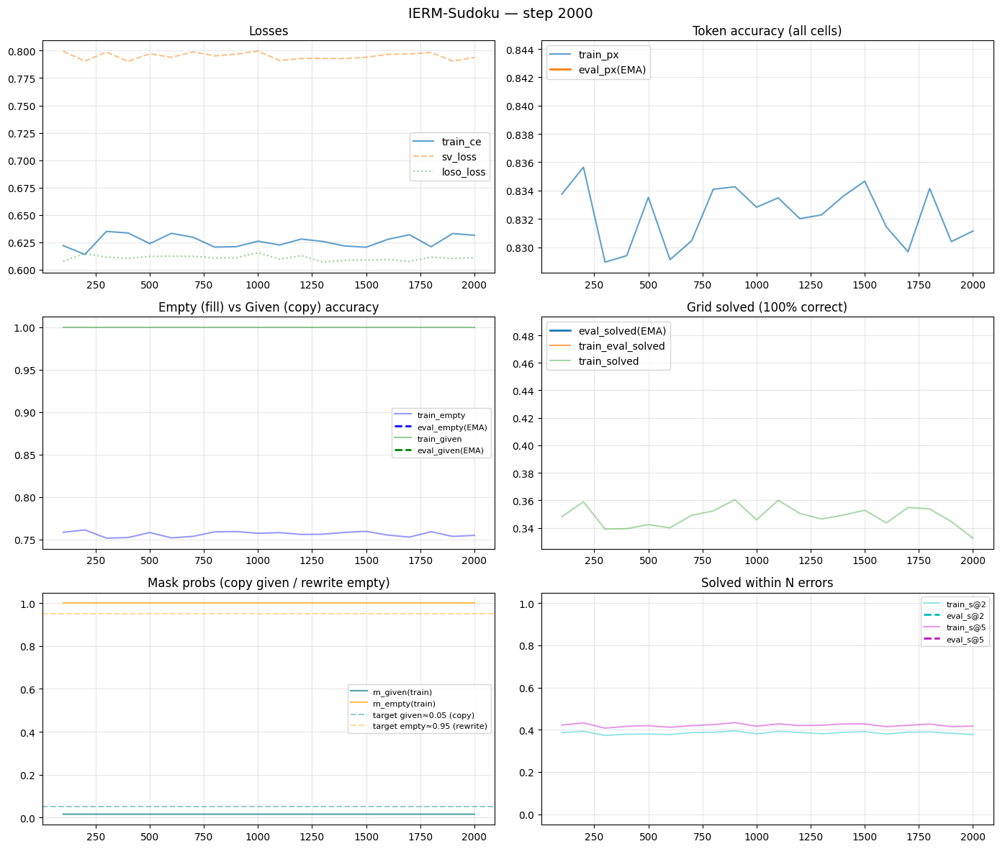

  ★ New best: solved=0.4453  empty=0.7738  px=0.8439
  step    2100/60000 | loss=1.0467 ce=0.6328 cst=0.0036 px=0.830 empty=0.753 sol=0.3467 | lr=2.99e-05 | 1.4it/s ETA=695min
  step    2200/60000 | loss=1.0440 ce=0.6304 cst=0.0036 px=0.831 empty=0.755 sol=0.3517 | lr=2.99e-05 | 1.4it/s ETA=693min
  step    2300/60000 | loss=1.0325 ce=0.6238 cst=0.0037 px=0.834 empty=0.759 sol=0.3455 | lr=2.99e-05 | 1.4it/s ETA=691min
  step    2400/60000 | loss=1.0366 ce=0.6264 cst=0.0036 px=0.831 empty=0.754 sol=0.3548 | lr=2.99e-05 | 1.4it/s ETA=690min


Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7f3ea825a340>
Traceback (most recent call last):
  File "/home/imed/anaconda3/envs/ime2/lib/python3.11/site-packages/torch/utils/data/dataloader.py", line 1479, in __del__
    self._shutdown_workers()
  File "/home/imed/anaconda3/envs/ime2/lib/python3.11/site-packages/torch/utils/data/dataloader.py", line 1462, in _shutdown_workers
    if w.is_alive():
       ^^^^^^^^^^^^
  File "/home/imed/anaconda3/envs/ime2/lib/python3.11/multiprocessing/process.py", line 160, in is_alive
    assert self._parent_pid == os.getpid(), 'can only test a child process'
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
AssertionError: can only test a child process
Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7f3ea825a340>
Traceback (most recent call last):
  File "/home/imed/anaconda3/envs/ime2/lib/python3.11/site-packages/torch/utils/data/dataloader.py", line 1479, in __del__
    self._shutdown_workers()
  

  step    2500/60000 | loss=1.0484 ce=0.6330 cst=0.0039 px=0.831 empty=0.755 sol=0.3334 | lr=2.99e-05 | 1.4it/s ETA=688min
  step    2600/60000 | loss=1.0443 ce=0.6310 cst=0.0037 px=0.830 empty=0.753 sol=0.3463 | lr=2.99e-05 | 1.4it/s ETA=686min
  step    2700/60000 | loss=1.0220 ce=0.6163 cst=0.0037 px=0.836 empty=0.761 sol=0.3570 | lr=2.99e-05 | 1.4it/s ETA=682min
  step    2800/60000 | loss=1.0323 ce=0.6234 cst=0.0035 px=0.833 empty=0.758 sol=0.3634 | lr=2.99e-05 | 1.4it/s ETA=681min
  step    2900/60000 | loss=1.0283 ce=0.6201 cst=0.0039 px=0.835 empty=0.760 sol=0.3513 | lr=2.99e-05 | 1.4it/s ETA=679min
  step    3000/60000 | loss=1.0352 ce=0.6247 cst=0.0038 px=0.833 empty=0.757 sol=0.3517 | lr=2.98e-05 | 1.4it/s ETA=678min
  step    3100/60000 | loss=1.0359 ce=0.6249 cst=0.0039 px=0.833 empty=0.757 sol=0.3480 | lr=2.98e-05 | 1.4it/s ETA=677min
  step    3200/60000 | loss=1.0323 ce=0.6234 cst=0.0036 px=0.833 empty=0.758 sol=0.3575 | lr=2.98e-05 | 1.4it/s ETA=675min
  step    3300/6

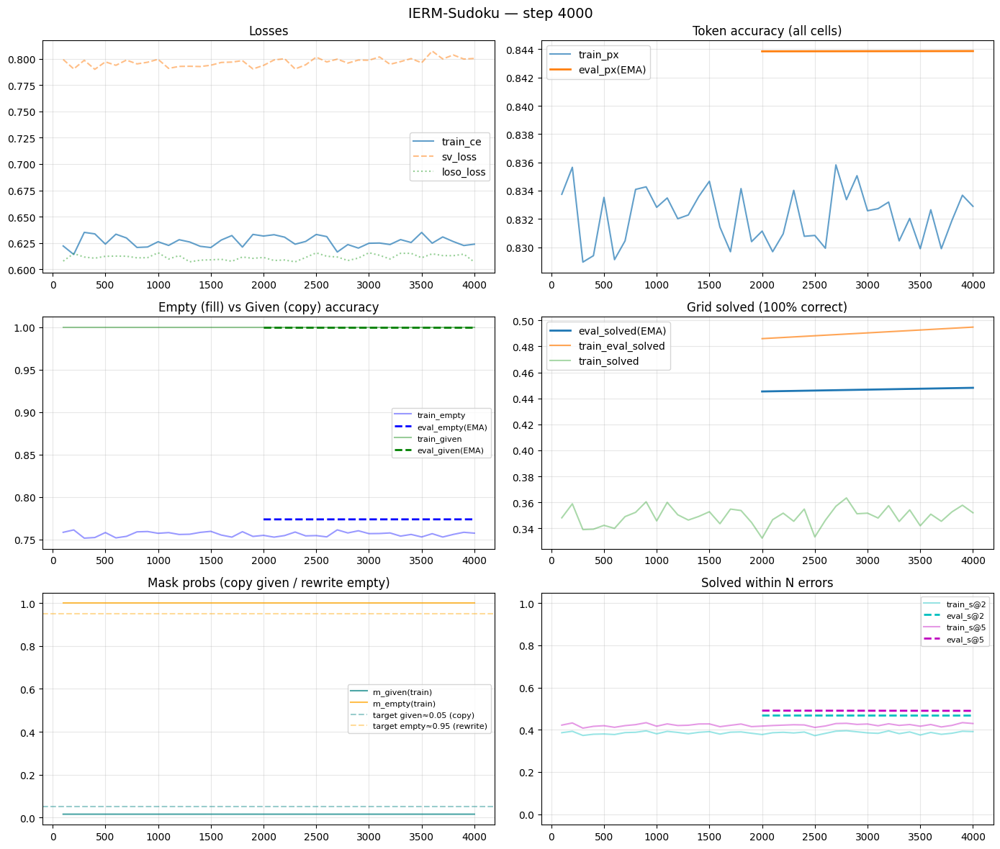

  ★ New best: solved=0.4481  empty=0.7738  px=0.8439
  step    4100/60000 | loss=1.0459 ce=0.6314 cst=0.0037 px=0.831 empty=0.755 sol=0.3434 | lr=2.97e-05 | 1.4it/s ETA=670min
  step    4200/60000 | loss=1.0351 ce=0.6249 cst=0.0037 px=0.833 empty=0.757 sol=0.3519 | lr=2.97e-05 | 1.4it/s ETA=668min
  step    4300/60000 | loss=1.0442 ce=0.6304 cst=0.0037 px=0.831 empty=0.755 sol=0.3531 | lr=2.97e-05 | 1.4it/s ETA=666min
  step    4400/60000 | loss=1.0214 ce=0.6157 cst=0.0040 px=0.837 empty=0.763 sol=0.3494 | lr=2.97e-05 | 1.4it/s ETA=664min
  step    4500/60000 | loss=1.0216 ce=0.6159 cst=0.0037 px=0.836 empty=0.762 sol=0.3625 | lr=2.96e-05 | 1.4it/s ETA=663min
  step    4600/60000 | loss=1.0377 ce=0.6266 cst=0.0036 px=0.832 empty=0.756 sol=0.3531 | lr=2.96e-05 | 1.4it/s ETA=662min
  step    4700/60000 | loss=1.0360 ce=0.6251 cst=0.0037 px=0.833 empty=0.757 sol=0.3475 | lr=2.96e-05 | 1.4it/s ETA=660min
  step    4800/60000 | loss=1.0438 ce=0.6307 cst=0.0037 px=0.831 empty=0.754 sol=0.345

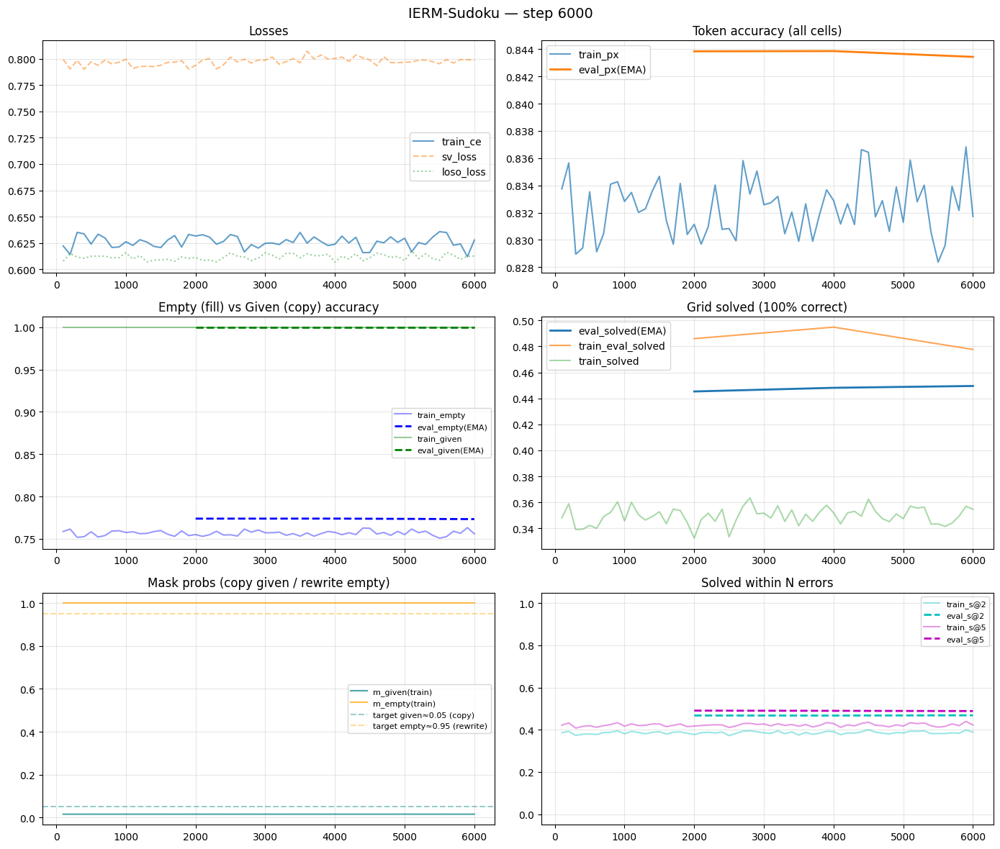

  ★ New best: solved=0.4495  empty=0.7732  px=0.8434
  step    6100/60000 | loss=1.0434 ce=0.6303 cst=0.0039 px=0.830 empty=0.753 sol=0.3492 | lr=2.93e-05 | 1.4it/s ETA=646min
  step    6200/60000 | loss=1.0359 ce=0.6251 cst=0.0037 px=0.833 empty=0.757 sol=0.3609 | lr=2.93e-05 | 1.4it/s ETA=645min
  step    6300/60000 | loss=1.0309 ce=0.6224 cst=0.0036 px=0.834 empty=0.759 sol=0.3569 | lr=2.93e-05 | 1.4it/s ETA=643min
  step    6400/60000 | loss=1.0338 ce=0.6245 cst=0.0037 px=0.833 empty=0.758 sol=0.3567 | lr=2.93e-05 | 1.4it/s ETA=642min
  step    6500/60000 | loss=1.0264 ce=0.6197 cst=0.0037 px=0.834 empty=0.760 sol=0.3536 | lr=2.92e-05 | 1.4it/s ETA=641min
  step    6600/60000 | loss=1.0327 ce=0.6233 cst=0.0038 px=0.833 empty=0.758 sol=0.3613 | lr=2.92e-05 | 1.4it/s ETA=639min
  step    6700/60000 | loss=1.0380 ce=0.6269 cst=0.0037 px=0.832 empty=0.756 sol=0.3414 | lr=2.92e-05 | 1.4it/s ETA=638min
  step    6800/60000 | loss=1.0473 ce=0.6328 cst=0.0037 px=0.830 empty=0.753 sol=0.345

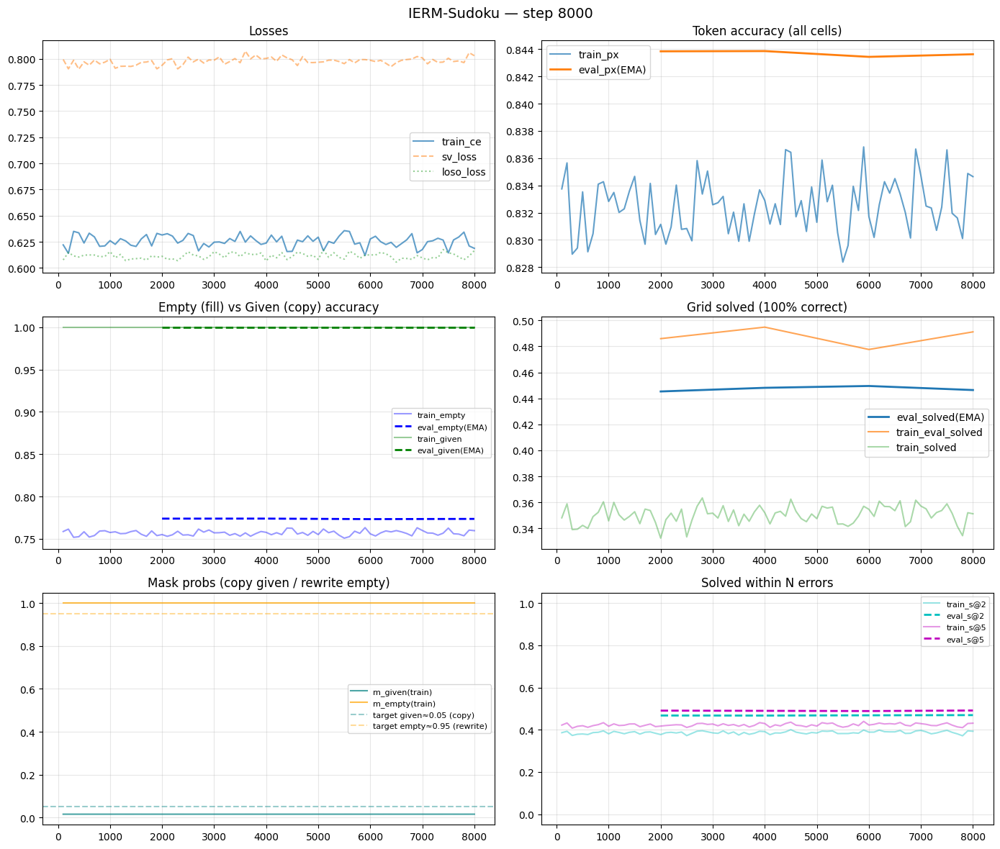

  step    8100/60000 | loss=1.0273 ce=0.6200 cst=0.0038 px=0.835 empty=0.760 sol=0.3538 | lr=2.88e-05 | 1.4it/s ETA=622min
  step    8200/60000 | loss=1.0338 ce=0.6239 cst=0.0037 px=0.833 empty=0.758 sol=0.3538 | lr=2.88e-05 | 1.4it/s ETA=621min
  step    8300/60000 | loss=1.0248 ce=0.6175 cst=0.0037 px=0.835 empty=0.761 sol=0.3605 | lr=2.87e-05 | 1.4it/s ETA=619min
  step    8400/60000 | loss=1.0391 ce=0.6277 cst=0.0036 px=0.831 empty=0.754 sol=0.3544 | lr=2.87e-05 | 1.4it/s ETA=617min
  step    8500/60000 | loss=1.0380 ce=0.6270 cst=0.0041 px=0.833 empty=0.757 sol=0.3384 | lr=2.87e-05 | 1.4it/s ETA=616min
  step    8600/60000 | loss=1.0390 ce=0.6271 cst=0.0038 px=0.832 empty=0.756 sol=0.3508 | lr=2.86e-05 | 1.4it/s ETA=615min
  step    8700/60000 | loss=1.0344 ce=0.6244 cst=0.0037 px=0.833 empty=0.757 sol=0.3509 | lr=2.86e-05 | 1.4it/s ETA=613min
  step    8800/60000 | loss=1.0332 ce=0.6236 cst=0.0037 px=0.834 empty=0.758 sol=0.3494 | lr=2.86e-05 | 1.4it/s ETA=612min
  step    8900/6

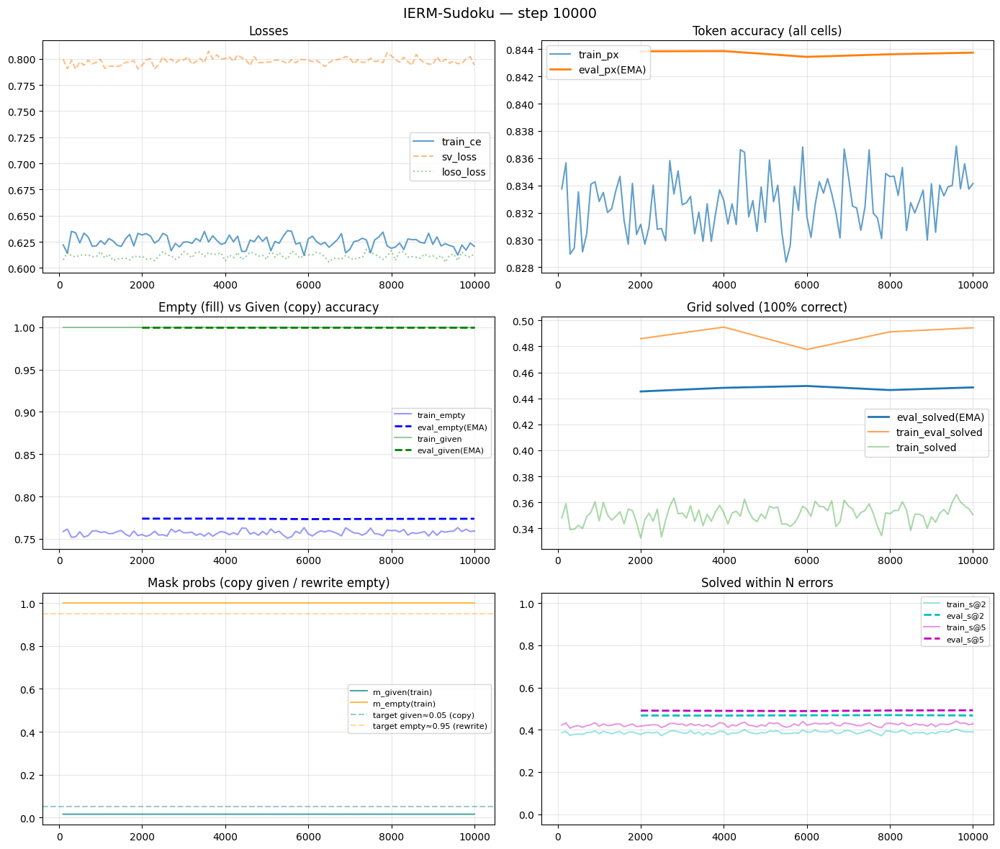

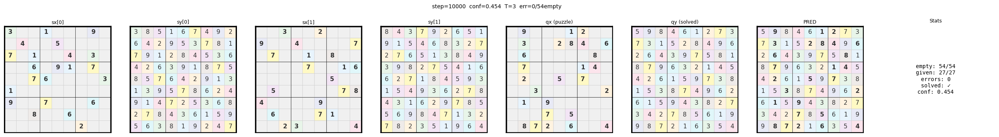

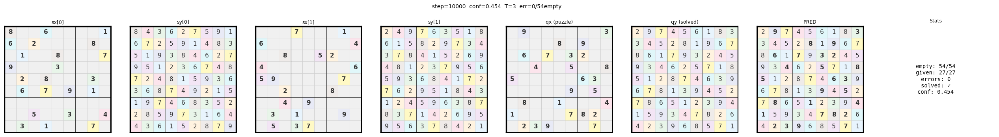

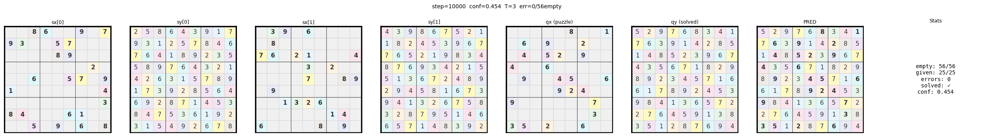

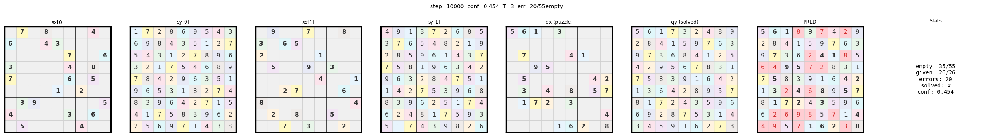

  step   10100/60000 | loss=1.0399 ce=0.6284 cst=0.0037 px=0.832 empty=0.756 sol=0.3509 | lr=2.81e-05 | 1.4it/s ETA=599min
  step   10200/60000 | loss=1.0396 ce=0.6275 cst=0.0039 px=0.832 empty=0.756 sol=0.3461 | lr=2.81e-05 | 1.4it/s ETA=597min
  step   10300/60000 | loss=1.0162 ce=0.6117 cst=0.0040 px=0.838 empty=0.765 sol=0.3675 | lr=2.81e-05 | 1.4it/s ETA=596min
  step   10400/60000 | loss=1.0375 ce=0.6265 cst=0.0039 px=0.832 empty=0.756 sol=0.3469 | lr=2.80e-05 | 1.4it/s ETA=594min
  step   10500/60000 | loss=1.0107 ce=0.6087 cst=0.0038 px=0.839 empty=0.766 sol=0.3716 | lr=2.80e-05 | 1.4it/s ETA=593min
  step   10600/60000 | loss=1.0645 ce=0.6439 cst=0.0039 px=0.826 empty=0.748 sol=0.3325 | lr=2.79e-05 | 1.4it/s ETA=592min
  step   10700/60000 | loss=1.0275 ce=0.6193 cst=0.0040 px=0.836 empty=0.762 sol=0.3489 | lr=2.79e-05 | 1.4it/s ETA=590min
  step   10800/60000 | loss=1.0302 ce=0.6216 cst=0.0039 px=0.834 empty=0.759 sol=0.3495 | lr=2.79e-05 | 1.4it/s ETA=589min
  step   10900/6

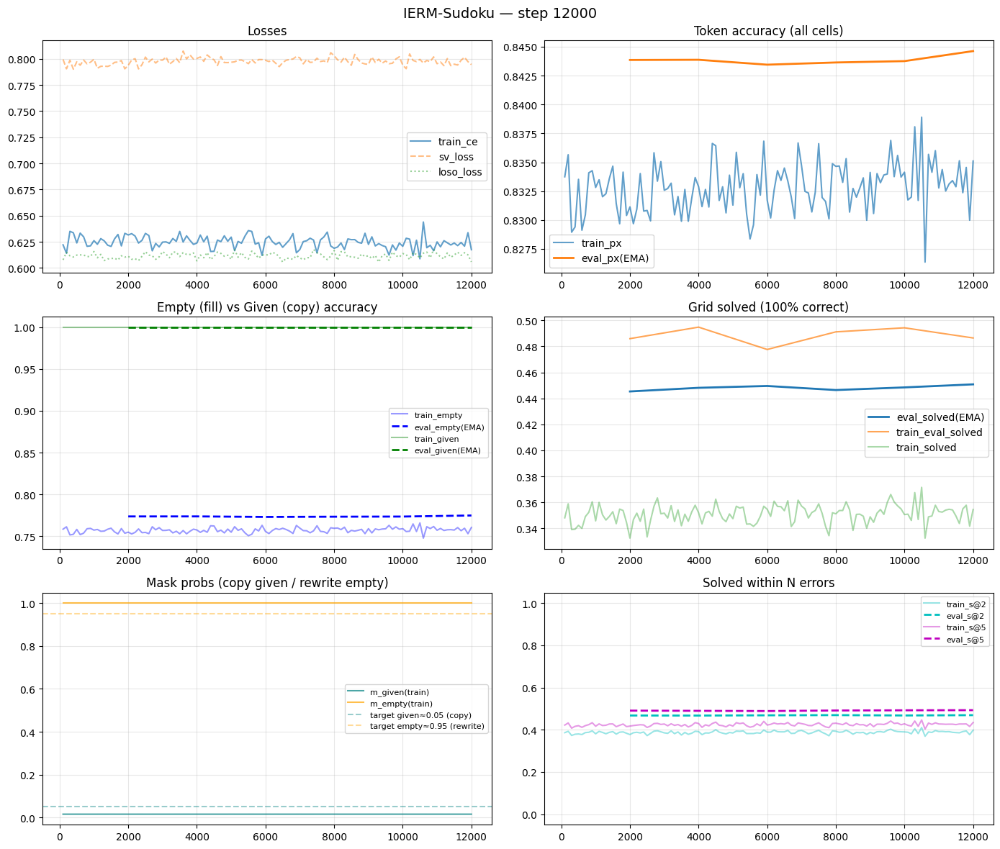

  ★ New best: solved=0.4508  empty=0.7749  px=0.8446
  step   12100/60000 | loss=1.0356 ce=0.6256 cst=0.0039 px=0.833 empty=0.757 sol=0.3586 | lr=2.73e-05 | 1.4it/s ETA=575min
  step   12200/60000 | loss=1.0167 ce=0.6129 cst=0.0039 px=0.837 empty=0.763 sol=0.3644 | lr=2.73e-05 | 1.4it/s ETA=574min
  step   12300/60000 | loss=1.0360 ce=0.6251 cst=0.0038 px=0.834 empty=0.759 sol=0.3484 | lr=2.72e-05 | 1.4it/s ETA=572min
  step   12400/60000 | loss=1.0339 ce=0.6244 cst=0.0039 px=0.833 empty=0.758 sol=0.3553 | lr=2.72e-05 | 1.4it/s ETA=571min
  step   12500/60000 | loss=1.0270 ce=0.6196 cst=0.0036 px=0.834 empty=0.759 sol=0.3623 | lr=2.71e-05 | 1.4it/s ETA=570min
  step   12600/60000 | loss=1.0418 ce=0.6294 cst=0.0037 px=0.831 empty=0.755 sol=0.3506 | lr=2.71e-05 | 1.4it/s ETA=568min
  step   12700/60000 | loss=1.0280 ce=0.6204 cst=0.0038 px=0.834 empty=0.759 sol=0.3548 | lr=2.71e-05 | 1.4it/s ETA=567min
  step   12800/60000 | loss=1.0278 ce=0.6205 cst=0.0037 px=0.833 empty=0.757 sol=0.361

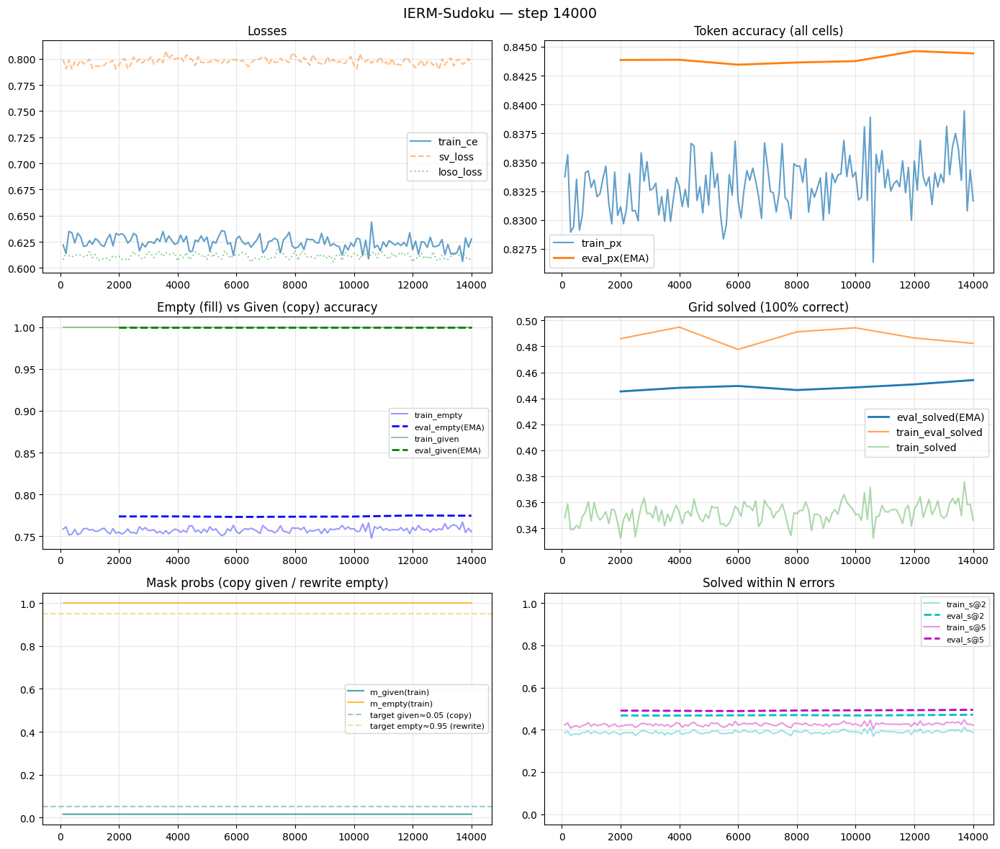

  ★ New best: solved=0.4541  empty=0.7747  px=0.8444
  step   14100/60000 | loss=1.0139 ce=0.6117 cst=0.0036 px=0.838 empty=0.765 sol=0.3661 | lr=2.64e-05 | 1.4it/s ETA=551min
  step   14200/60000 | loss=1.0269 ce=0.6193 cst=0.0038 px=0.835 empty=0.761 sol=0.3583 | lr=2.63e-05 | 1.4it/s ETA=550min
  step   14300/60000 | loss=1.0209 ce=0.6159 cst=0.0037 px=0.836 empty=0.762 sol=0.3631 | lr=2.63e-05 | 1.4it/s ETA=548min
  step   14400/60000 | loss=1.0238 ce=0.6176 cst=0.0037 px=0.834 empty=0.760 sol=0.3627 | lr=2.62e-05 | 1.4it/s ETA=547min
  step   14500/60000 | loss=1.0165 ce=0.6130 cst=0.0037 px=0.836 empty=0.763 sol=0.3609 | lr=2.62e-05 | 1.4it/s ETA=546min
  step   14600/60000 | loss=1.0202 ce=0.6157 cst=0.0037 px=0.835 empty=0.761 sol=0.3605 | lr=2.61e-05 | 1.4it/s ETA=544min
  step   14700/60000 | loss=1.0154 ce=0.6117 cst=0.0039 px=0.838 empty=0.764 sol=0.3619 | lr=2.61e-05 | 1.4it/s ETA=543min
  step   14800/60000 | loss=1.0346 ce=0.6239 cst=0.0040 px=0.834 empty=0.759 sol=0.349

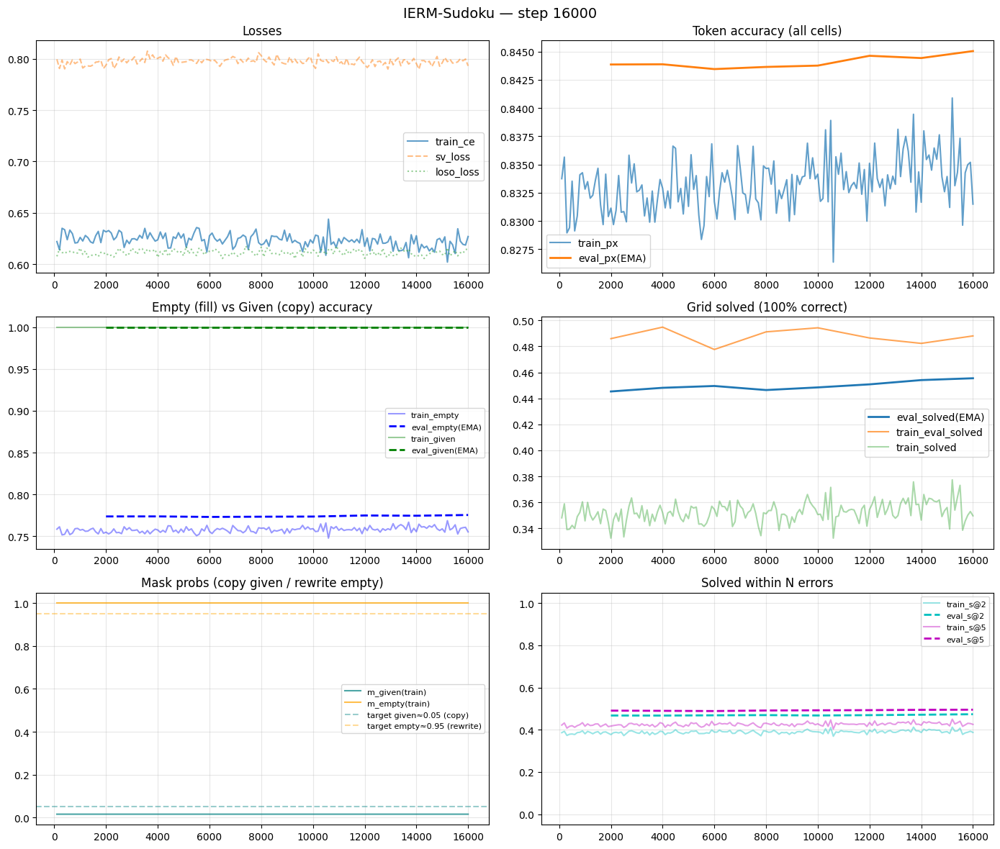

  ★ New best: solved=0.4555  empty=0.7755  px=0.8450
  step   16100/60000 | loss=1.0276 ce=0.6198 cst=0.0037 px=0.835 empty=0.760 sol=0.3583 | lr=2.53e-05 | 1.4it/s ETA=525min
  step   16200/60000 | loss=1.0485 ce=0.6337 cst=0.0037 px=0.829 empty=0.752 sol=0.3488 | lr=2.53e-05 | 1.4it/s ETA=524min
  step   16300/60000 | loss=1.0240 ce=0.6178 cst=0.0038 px=0.836 empty=0.762 sol=0.3572 | lr=2.52e-05 | 1.4it/s ETA=523min
  step   16400/60000 | loss=1.0324 ce=0.6230 cst=0.0038 px=0.833 empty=0.758 sol=0.3500 | lr=2.52e-05 | 1.4it/s ETA=522min
  step   16500/60000 | loss=1.0565 ce=0.6395 cst=0.0037 px=0.828 empty=0.750 sol=0.3403 | lr=2.51e-05 | 1.4it/s ETA=520min
  step   16600/60000 | loss=1.0144 ce=0.6114 cst=0.0040 px=0.837 empty=0.764 sol=0.3570 | lr=2.51e-05 | 1.4it/s ETA=519min
  step   16700/60000 | loss=1.0240 ce=0.6174 cst=0.0038 px=0.836 empty=0.762 sol=0.3589 | lr=2.50e-05 | 1.4it/s ETA=518min
  step   16800/60000 | loss=1.0144 ce=0.6116 cst=0.0038 px=0.838 empty=0.764 sol=0.368

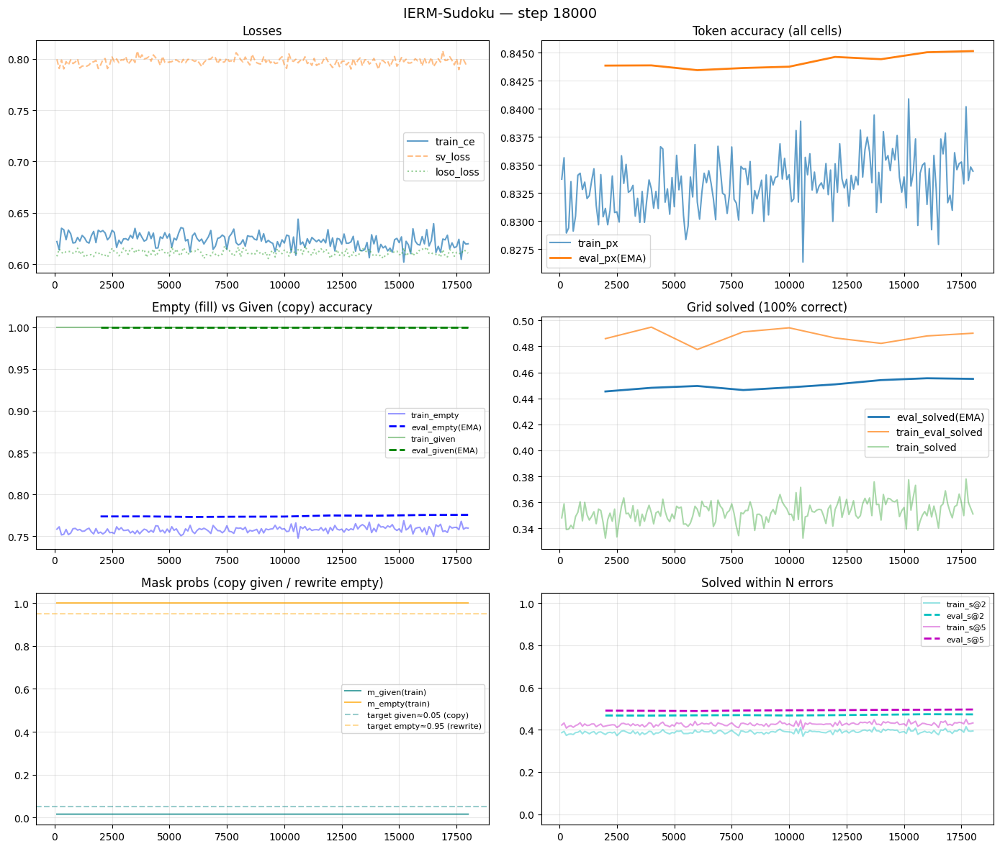

  step   18100/60000 | loss=1.0141 ce=0.6114 cst=0.0036 px=0.837 empty=0.764 sol=0.3680 | lr=2.42e-05 | 1.4it/s ETA=502min
  step   18200/60000 | loss=1.0182 ce=0.6138 cst=0.0037 px=0.836 empty=0.762 sol=0.3631 | lr=2.41e-05 | 1.4it/s ETA=501min
  step   18300/60000 | loss=1.0142 ce=0.6114 cst=0.0036 px=0.837 empty=0.764 sol=0.3683 | lr=2.41e-05 | 1.4it/s ETA=499min
  step   18400/60000 | loss=1.0107 ce=0.6086 cst=0.0037 px=0.839 empty=0.766 sol=0.3694 | lr=2.40e-05 | 1.4it/s ETA=498min
  step   18500/60000 | loss=1.0134 ce=0.6104 cst=0.0039 px=0.838 empty=0.765 sol=0.3709 | lr=2.39e-05 | 1.4it/s ETA=497min
  step   18600/60000 | loss=1.0192 ce=0.6138 cst=0.0037 px=0.836 empty=0.762 sol=0.3672 | lr=2.39e-05 | 1.4it/s ETA=495min
  step   18700/60000 | loss=1.0285 ce=0.6210 cst=0.0037 px=0.834 empty=0.759 sol=0.3578 | lr=2.38e-05 | 1.4it/s ETA=494min
  step   18800/60000 | loss=1.0274 ce=0.6198 cst=0.0040 px=0.835 empty=0.760 sol=0.3502 | lr=2.38e-05 | 1.4it/s ETA=493min
  step   18900/6

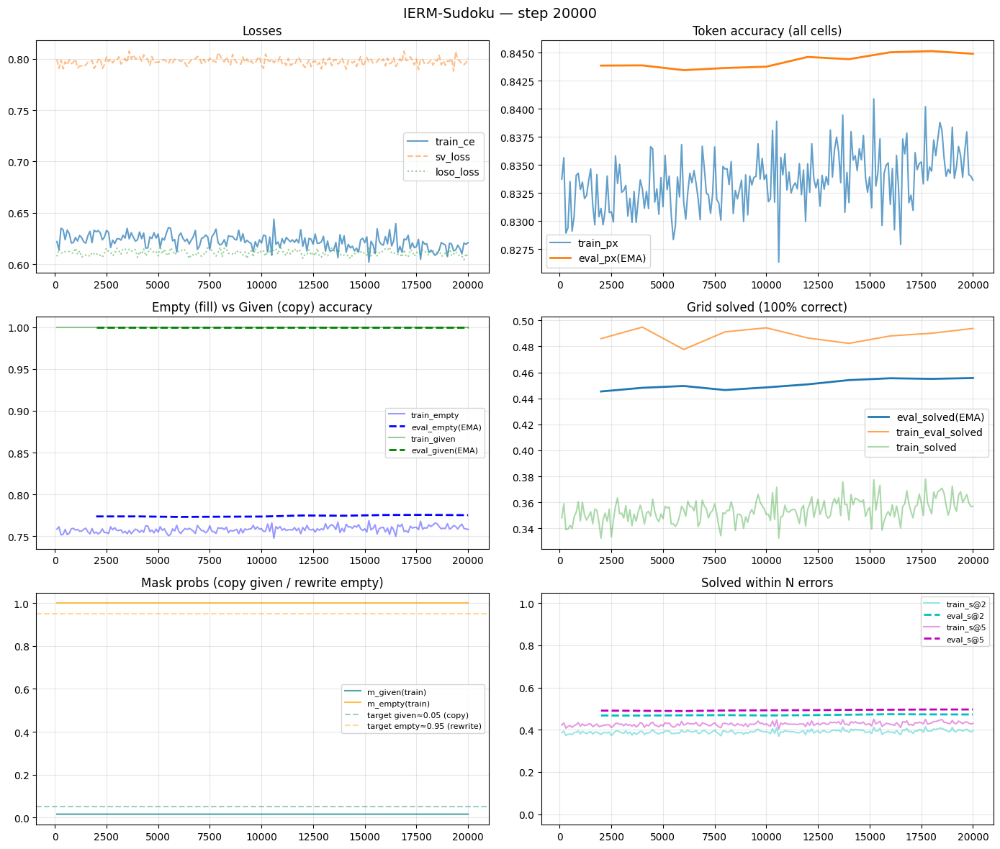

  ★ New best: solved=0.4556  empty=0.7753  px=0.8449


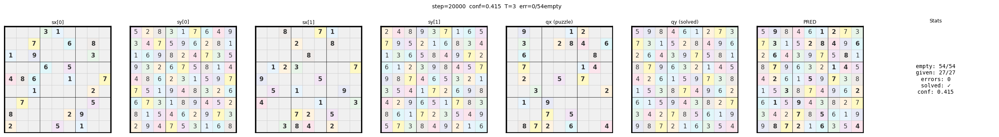

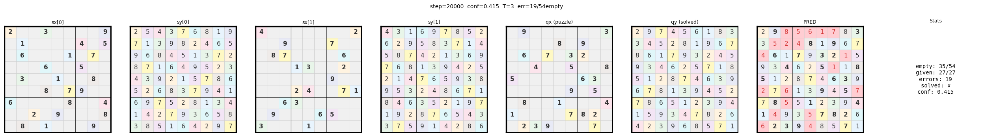

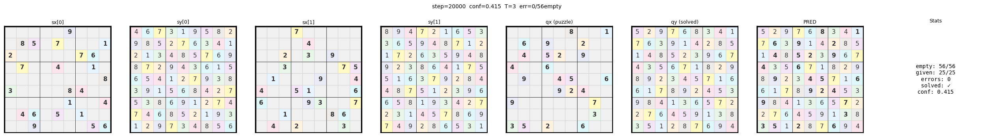

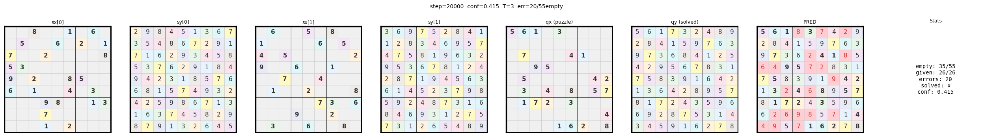

  step   20100/60000 | loss=1.0142 ce=0.6111 cst=0.0039 px=0.837 empty=0.764 sol=0.3661 | lr=2.29e-05 | 1.4it/s ETA=478min
  step   20200/60000 | loss=1.0184 ce=0.6141 cst=0.0039 px=0.836 empty=0.762 sol=0.3603 | lr=2.29e-05 | 1.4it/s ETA=477min
  step   20300/60000 | loss=1.0233 ce=0.6173 cst=0.0037 px=0.835 empty=0.760 sol=0.3550 | lr=2.28e-05 | 1.4it/s ETA=476min
  step   20400/60000 | loss=1.0241 ce=0.6174 cst=0.0037 px=0.836 empty=0.761 sol=0.3658 | lr=2.27e-05 | 1.4it/s ETA=474min
  step   20500/60000 | loss=1.0333 ce=0.6241 cst=0.0036 px=0.832 empty=0.757 sol=0.3530 | lr=2.27e-05 | 1.4it/s ETA=473min
  step   20600/60000 | loss=1.0188 ce=0.6145 cst=0.0038 px=0.837 empty=0.763 sol=0.3691 | lr=2.26e-05 | 1.4it/s ETA=472min
  step   20700/60000 | loss=1.0150 ce=0.6118 cst=0.0037 px=0.838 empty=0.764 sol=0.3619 | lr=2.25e-05 | 1.4it/s ETA=471min
  step   20800/60000 | loss=1.0203 ce=0.6151 cst=0.0037 px=0.836 empty=0.761 sol=0.3616 | lr=2.25e-05 | 1.4it/s ETA=470min
  step   20900/6

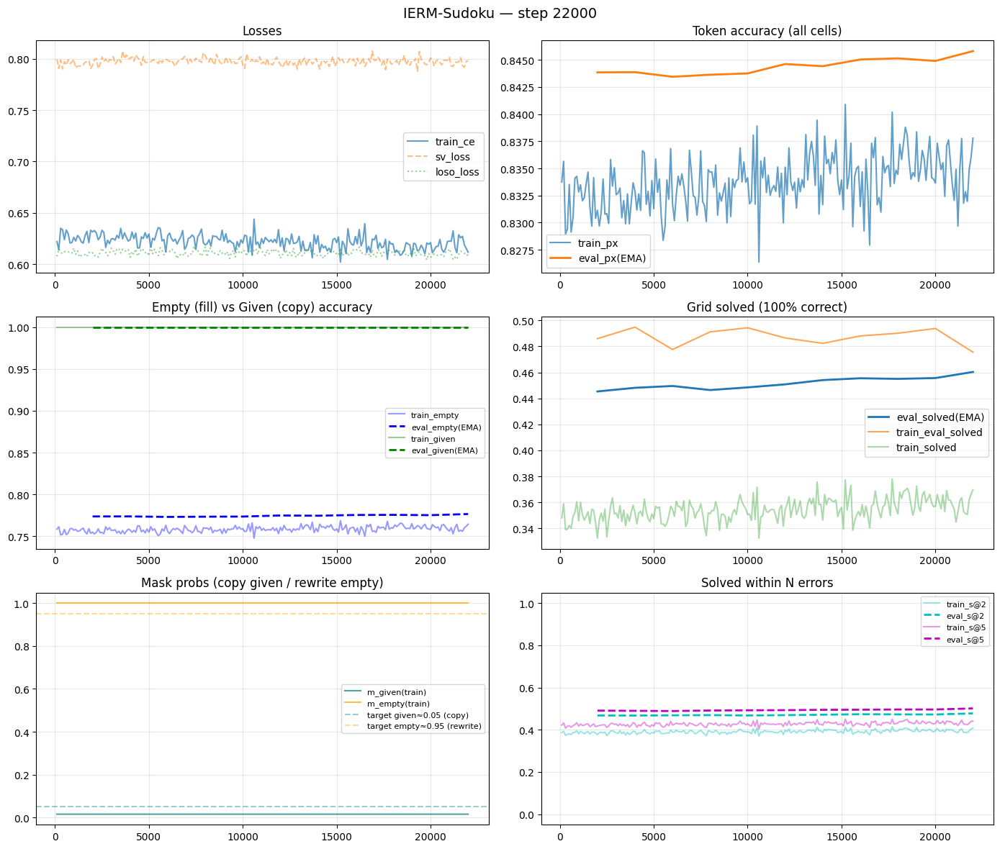

  ★ New best: solved=0.4603  empty=0.7767  px=0.8458
  step   22100/60000 | loss=1.0187 ce=0.6145 cst=0.0038 px=0.836 empty=0.762 sol=0.3681 | lr=2.16e-05 | 1.4it/s ETA=454min
  step   22200/60000 | loss=1.0252 ce=0.6186 cst=0.0038 px=0.835 empty=0.761 sol=0.3572 | lr=2.15e-05 | 1.4it/s ETA=453min
  step   22300/60000 | loss=1.0237 ce=0.6172 cst=0.0037 px=0.835 empty=0.760 sol=0.3652 | lr=2.15e-05 | 1.4it/s ETA=452min
  step   22400/60000 | loss=1.0223 ce=0.6163 cst=0.0037 px=0.835 empty=0.761 sol=0.3670 | lr=2.14e-05 | 1.4it/s ETA=451min
  step   22500/60000 | loss=1.0274 ce=0.6199 cst=0.0037 px=0.834 empty=0.759 sol=0.3572 | lr=2.13e-05 | 1.4it/s ETA=449min
  step   22600/60000 | loss=1.0282 ce=0.6201 cst=0.0038 px=0.834 empty=0.759 sol=0.3583 | lr=2.13e-05 | 1.4it/s ETA=448min
  step   22700/60000 | loss=1.0119 ce=0.6101 cst=0.0037 px=0.838 empty=0.765 sol=0.3705 | lr=2.12e-05 | 1.4it/s ETA=447min
  step   22800/60000 | loss=1.0278 ce=0.6202 cst=0.0039 px=0.834 empty=0.760 sol=0.356

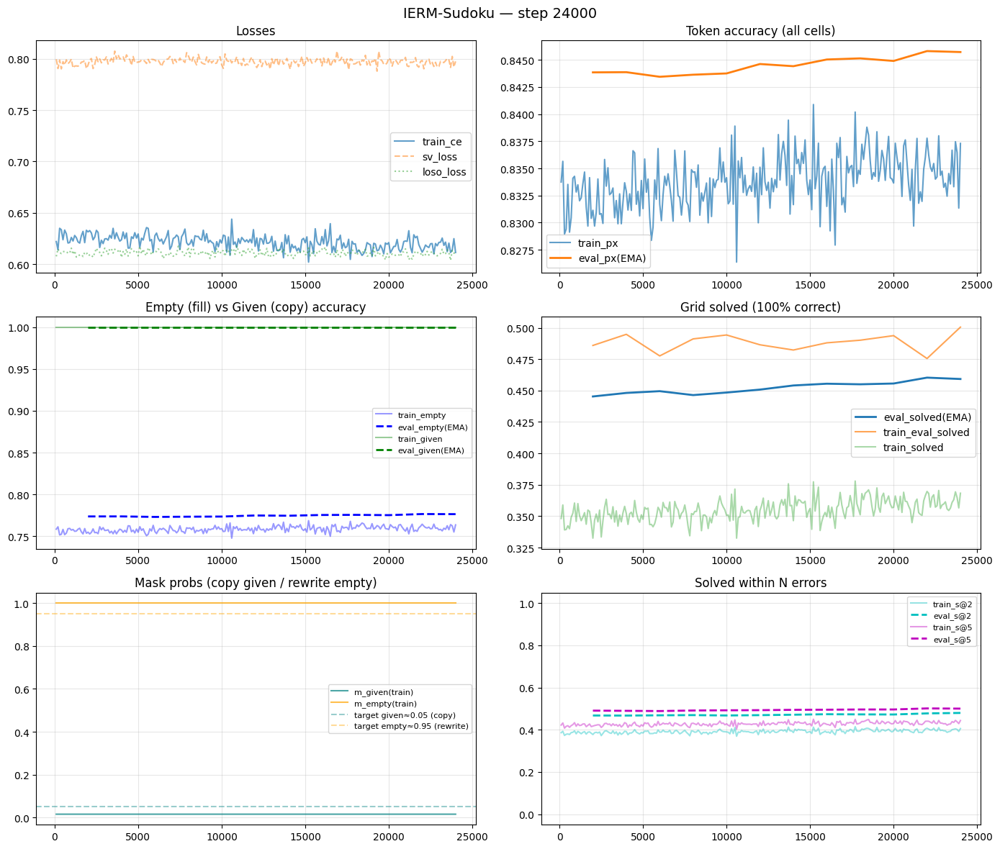

  step   24100/60000 | loss=1.0120 ce=0.6100 cst=0.0036 px=0.838 empty=0.764 sol=0.3688 | lr=2.02e-05 | 1.4it/s ETA=430min
  step   24200/60000 | loss=1.0200 ce=0.6153 cst=0.0038 px=0.836 empty=0.762 sol=0.3570 | lr=2.02e-05 | 1.4it/s ETA=428min
  step   24300/60000 | loss=1.0332 ce=0.6240 cst=0.0038 px=0.833 empty=0.757 sol=0.3567 | lr=2.01e-05 | 1.4it/s ETA=427min
  step   24400/60000 | loss=1.0252 ce=0.6187 cst=0.0036 px=0.835 empty=0.760 sol=0.3681 | lr=2.00e-05 | 1.4it/s ETA=426min
  step   24500/60000 | loss=1.0137 ce=0.6112 cst=0.0036 px=0.836 empty=0.762 sol=0.3670 | lr=1.99e-05 | 1.4it/s ETA=425min
  step   24600/60000 | loss=1.0143 ce=0.6115 cst=0.0038 px=0.837 empty=0.763 sol=0.3647 | lr=1.99e-05 | 1.4it/s ETA=424min
  step   24700/60000 | loss=1.0111 ce=0.6094 cst=0.0038 px=0.838 empty=0.765 sol=0.3681 | lr=1.98e-05 | 1.4it/s ETA=422min
  step   24800/60000 | loss=1.0017 ce=0.6038 cst=0.0037 px=0.841 empty=0.769 sol=0.3762 | lr=1.97e-05 | 1.4it/s ETA=421min
  step   24900/6

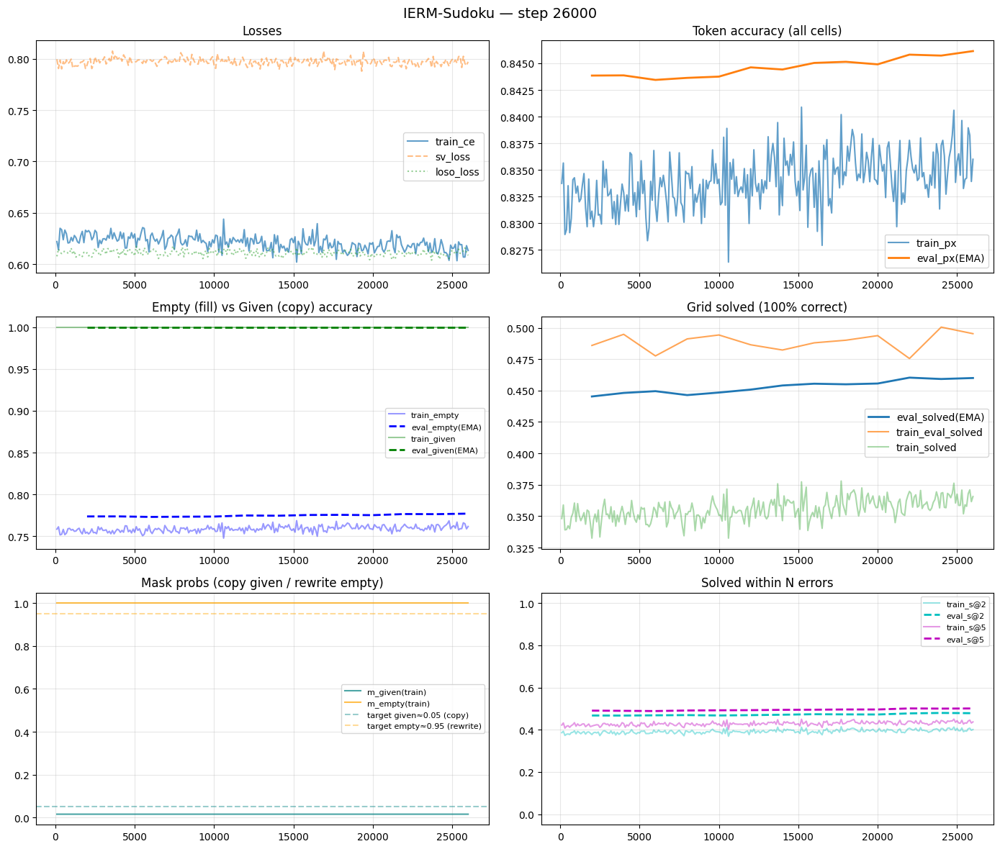

  step   26100/60000 | loss=1.0200 ce=0.6146 cst=0.0039 px=0.837 empty=0.763 sol=0.3575 | lr=1.88e-05 | 1.4it/s ETA=406min
  step   26200/60000 | loss=1.0336 ce=0.6241 cst=0.0038 px=0.833 empty=0.758 sol=0.3528 | lr=1.87e-05 | 1.4it/s ETA=405min
  step   26300/60000 | loss=1.0233 ce=0.6172 cst=0.0037 px=0.835 empty=0.761 sol=0.3655 | lr=1.86e-05 | 1.4it/s ETA=404min
  step   26400/60000 | loss=1.0189 ce=0.6143 cst=0.0037 px=0.837 empty=0.763 sol=0.3631 | lr=1.86e-05 | 1.4it/s ETA=402min
  step   26500/60000 | loss=1.0198 ce=0.6149 cst=0.0039 px=0.836 empty=0.761 sol=0.3603 | lr=1.85e-05 | 1.4it/s ETA=401min
  step   26600/60000 | loss=1.0262 ce=0.6199 cst=0.0036 px=0.834 empty=0.760 sol=0.3695 | lr=1.84e-05 | 1.4it/s ETA=400min
  step   26700/60000 | loss=1.0271 ce=0.6195 cst=0.0036 px=0.833 empty=0.758 sol=0.3631 | lr=1.83e-05 | 1.4it/s ETA=399min
  step   26800/60000 | loss=1.0251 ce=0.6188 cst=0.0039 px=0.834 empty=0.759 sol=0.3520 | lr=1.83e-05 | 1.4it/s ETA=397min
  step   26900/6

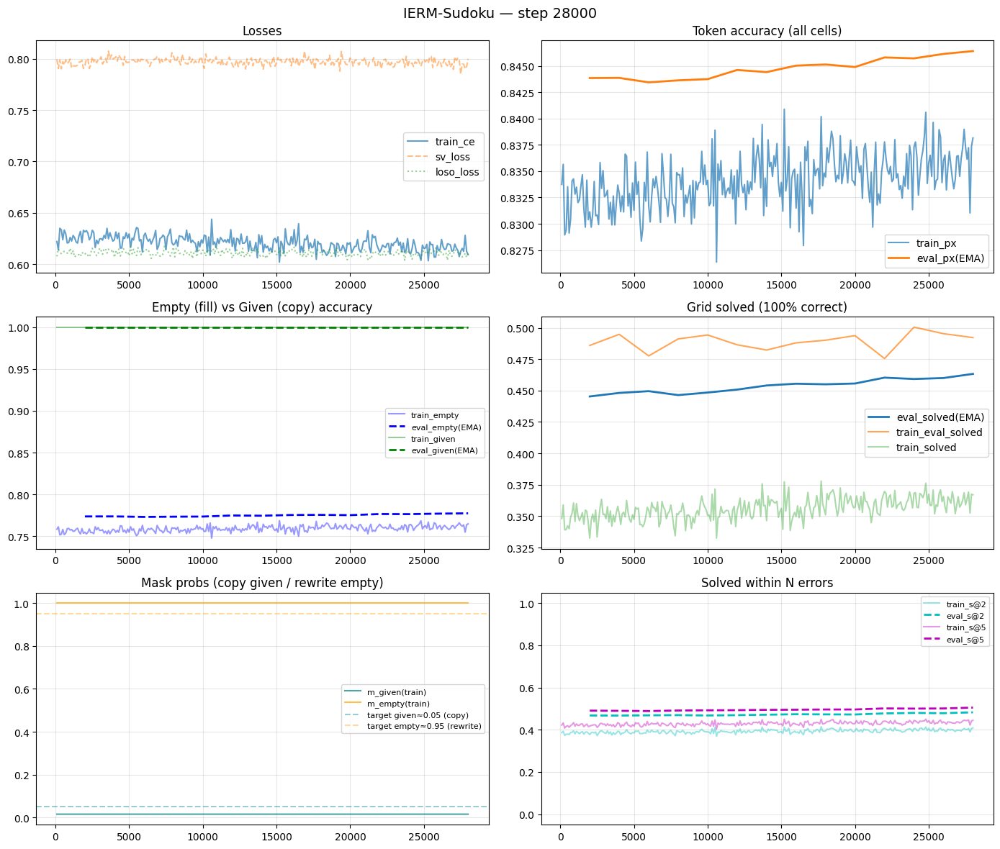

  ★ New best: solved=0.4633  empty=0.7775  px=0.8464
  step   28100/60000 | loss=1.0252 ce=0.6183 cst=0.0038 px=0.835 empty=0.760 sol=0.3606 | lr=1.73e-05 | 1.4it/s ETA=382min
  step   28200/60000 | loss=1.0138 ce=0.6109 cst=0.0036 px=0.837 empty=0.763 sol=0.3714 | lr=1.72e-05 | 1.4it/s ETA=381min
  step   28300/60000 | loss=1.0180 ce=0.6131 cst=0.0038 px=0.836 empty=0.762 sol=0.3608 | lr=1.72e-05 | 1.4it/s ETA=380min
  step   28400/60000 | loss=1.0124 ce=0.6098 cst=0.0040 px=0.838 empty=0.765 sol=0.3680 | lr=1.71e-05 | 1.4it/s ETA=378min
  step   28500/60000 | loss=1.0060 ce=0.6060 cst=0.0038 px=0.839 empty=0.766 sol=0.3736 | lr=1.70e-05 | 1.4it/s ETA=377min
  step   28600/60000 | loss=1.0319 ce=0.6231 cst=0.0038 px=0.833 empty=0.758 sol=0.3552 | lr=1.69e-05 | 1.4it/s ETA=376min
  step   28700/60000 | loss=1.0162 ce=0.6124 cst=0.0038 px=0.836 empty=0.763 sol=0.3663 | lr=1.69e-05 | 1.4it/s ETA=375min
  step   28800/60000 | loss=1.0072 ce=0.6064 cst=0.0039 px=0.839 empty=0.766 sol=0.374

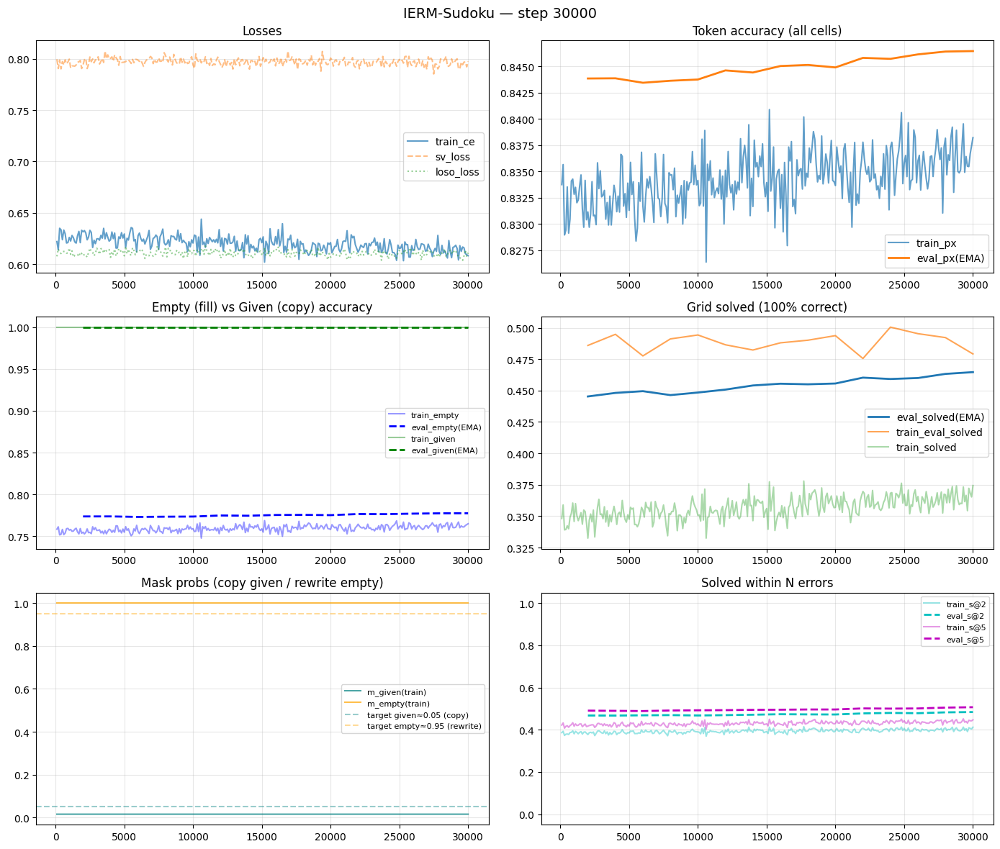

  ★ New best: solved=0.4647  empty=0.7776  px=0.8465


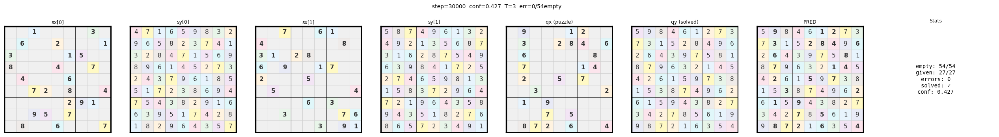

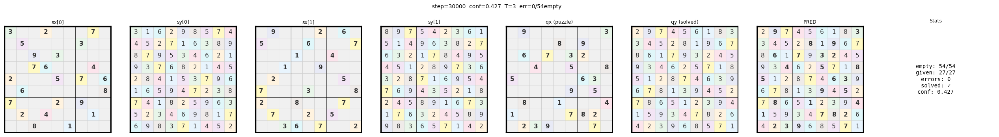

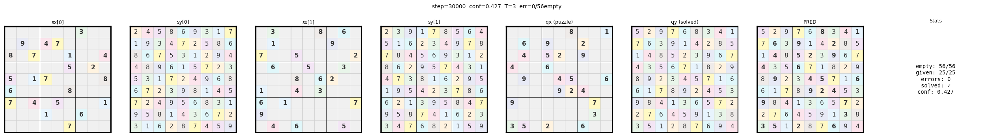

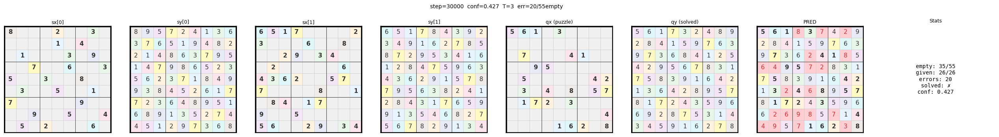

  step   30100/60000 | loss=1.0174 ce=0.6137 cst=0.0038 px=0.837 empty=0.764 sol=0.3702 | lr=1.58e-05 | 1.4it/s ETA=358min
  step   30200/60000 | loss=1.0208 ce=0.6161 cst=0.0038 px=0.836 empty=0.762 sol=0.3636 | lr=1.57e-05 | 1.4it/s ETA=357min
  step   30300/60000 | loss=1.0103 ce=0.6092 cst=0.0036 px=0.837 empty=0.764 sol=0.3678 | lr=1.57e-05 | 1.4it/s ETA=356min
  step   30400/60000 | loss=1.0267 ce=0.6195 cst=0.0039 px=0.834 empty=0.759 sol=0.3569 | lr=1.56e-05 | 1.4it/s ETA=355min
  step   30500/60000 | loss=1.0133 ce=0.6110 cst=0.0037 px=0.838 empty=0.764 sol=0.3691 | lr=1.55e-05 | 1.4it/s ETA=354min
  step   30600/60000 | loss=1.0066 ce=0.6059 cst=0.0039 px=0.840 empty=0.768 sol=0.3691 | lr=1.55e-05 | 1.4it/s ETA=352min
  step   30700/60000 | loss=1.0156 ce=0.6125 cst=0.0036 px=0.836 empty=0.762 sol=0.3630 | lr=1.54e-05 | 1.4it/s ETA=351min
  step   30800/60000 | loss=1.0097 ce=0.6084 cst=0.0039 px=0.838 empty=0.765 sol=0.3692 | lr=1.53e-05 | 1.4it/s ETA=350min
  step   30900/6

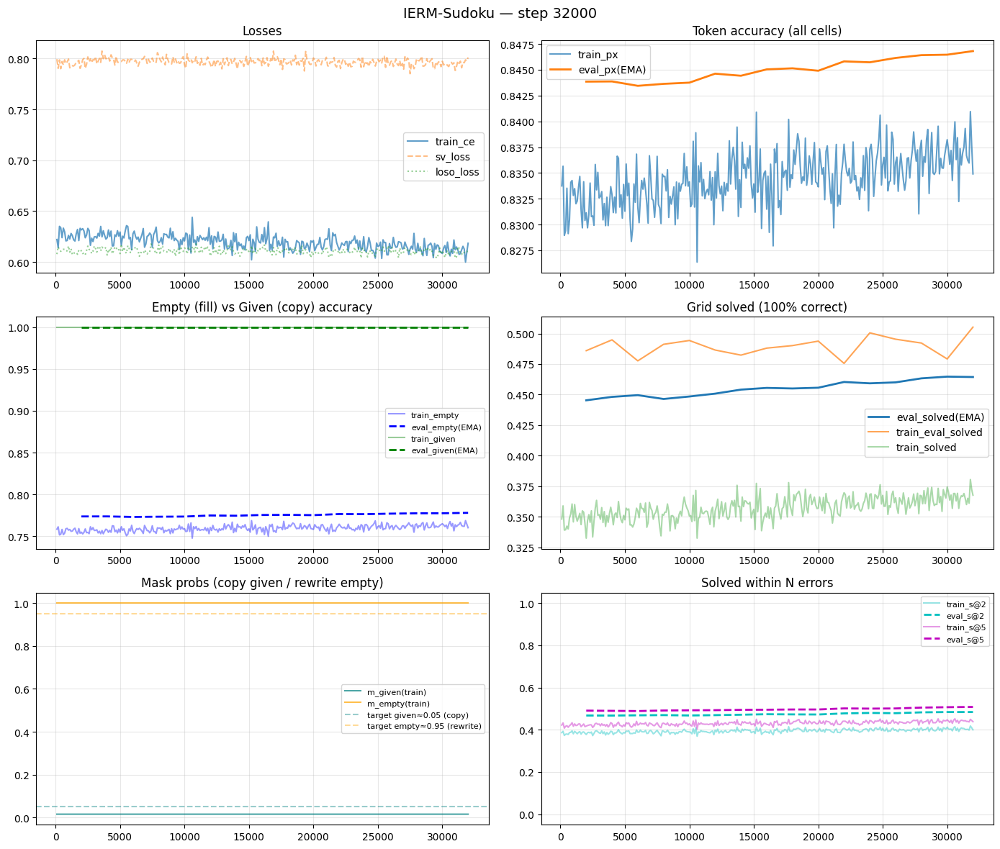

  step   32100/60000 | loss=1.0100 ce=0.6086 cst=0.0036 px=0.837 empty=0.764 sol=0.3705 | lr=1.43e-05 | 1.4it/s ETA=334min
  step   32200/60000 | loss=1.0340 ce=0.6245 cst=0.0036 px=0.831 empty=0.756 sol=0.3598 | lr=1.43e-05 | 1.4it/s ETA=333min
  step   32300/60000 | loss=1.0207 ce=0.6155 cst=0.0037 px=0.836 empty=0.762 sol=0.3663 | lr=1.42e-05 | 1.4it/s ETA=332min
  step   32400/60000 | loss=1.0210 ce=0.6156 cst=0.0038 px=0.835 empty=0.761 sol=0.3661 | lr=1.41e-05 | 1.4it/s ETA=331min
  step   32500/60000 | loss=1.0148 ce=0.6111 cst=0.0037 px=0.838 empty=0.765 sol=0.3708 | lr=1.40e-05 | 1.4it/s ETA=329min
  step   32600/60000 | loss=1.0106 ce=0.6096 cst=0.0036 px=0.838 empty=0.765 sol=0.3723 | lr=1.40e-05 | 1.4it/s ETA=328min
  step   32700/60000 | loss=1.0150 ce=0.6120 cst=0.0038 px=0.838 empty=0.765 sol=0.3620 | lr=1.39e-05 | 1.4it/s ETA=327min
  step   32800/60000 | loss=1.0224 ce=0.6169 cst=0.0037 px=0.835 empty=0.760 sol=0.3623 | lr=1.38e-05 | 1.4it/s ETA=326min
  step   32900/6

In [ ]:
# ════════════════════════════════════════════════════════════════
# CELL — Fine-tuning T=3 depuis best_ema_25pct.pt
# ════════════════════════════════════════════════════════════════

import os, torch, sys

# ── 1. Config ─────────────────────────────────────────────────
CFG_SUDOKU_V2_SAFE = dict(
    vocab_size=10, pad_id=99, eos_id=99,
    d_model=192, d_psi=96, n_heads=6, dropout=0.08,
    T_max=4, n_inner=6,
    n_mem=64, n_prog=24, psi_refine_layers=2,
    z_tokens=8,
    Hmax=9, Wmax=9,
    use_rope_2d=True, use_qk_norm=True,
    use_task_id=False, n_tasks=1, T_psi=2,
)

# ── 2. Build + patches + load ─────────────────────────────────
apply_sudoku_patches_v2(IERM_TRM)

# Fix TTA (si pas déjà fait)
IERM_TRM.predict = predict_sudoku_v2_fixed
IERM_TRM._predict_logits_internal = _predict_logits_internal_fixed

model_v2 = build_model_sudoku_v2(cfg=CFG_SUDOKU_V2_SAFE)

CKPT = "checkpoints_sudoku_v3/best_ema_v2.pt"
assert os.path.exists(CKPT), f"Introuvable : {CKPT}"
ckpt = torch.load(CKPT, map_location=DEVICE, weights_only=False)
old_sd = ckpt.get("model_state_dict", ckpt)
new_sd = model_v2.state_dict()
loaded = 0
for k in new_sd:
    if k in old_sd and old_sd[k].shape == new_sd[k].shape:
        new_sd[k] = old_sd[k]
        loaded += 1
model_v2.load_state_dict(new_sd)
print(f"  ✓ {loaded}/{len(new_sd)} params chargés depuis {CKPT}")

model_v2 = model_v2.to(DEVICE)
model_v2.psi.T_psi = 2

# ── 3. Sanity check ──────────────────────────────────────────
model_v2.eval()
with torch.no_grad():
    sb = next(iter(eval_loader))
    n = min(32, sb["sx"].shape[0])
    pred_s, _, _ = model_v2.predict(
        sb["sx"][:n].to(DEVICE), sb["sy"][:n].to(DEVICE),
        sb["qx"][:n].to(DEVICE),
        s_mask=(sb["s_mask"][:n].to(DEVICE).bool()
                if "s_mask" in sb else None),
        T_max=3, residual_alpha=0.4)
    gt = sb["qy"][:n].reshape(n, -1).long().to(DEVICE)
    px_c = float((pred_s.reshape(n, -1) == gt).float().mean())
    sol_c = float((pred_s.reshape(n, -1) == gt).all(1).float().mean())
    print(f"  ★ Sanity: px={px_c:.4f}  solved={sol_c:.4f}")
    assert px_c > 0.70, f"STOP — px={px_c:.4f}"
    print("  ✓ OK\n")

# ── 4. Désactiver curriculum ──────────────────────────────────
_original_curriculum = apply_curriculum_sudoku_v2

def _noop_curriculum(step, cfg, model=None):
    return cfg

current_module = sys.modules[run_training_sudoku_v2.__module__]
if hasattr(current_module, 'apply_curriculum_sudoku_v2'):
    current_module.apply_curriculum_sudoku_v2 = _noop_curriculum

# ── 5. Training T=3 ──────────────────────────────────────────
model_v2, tracker_v2 = run_training_sudoku_v2(
    train_loader=train_loader,
    eval_loader=eval_loader,
    DEVICE=DEVICE,
    EMA_class=EMA,
    build_scheduler_fn=build_warmup_cosine_restart_scheduler,
    model=model_v2,
    model_cfg=CFG_SUDOKU_V2_SAFE,
    plot_fn=plot_training_curves_sudoku,
    viz_fn=visualize_predictions_sudoku,
    # --- Fine-tuning T=3 ---
    max_steps=60_000,
    lr=3e-5,                        # encore plus bas (T=3 = plus instable)
    warmup_steps=200,
    cosine_period_steps=60_000,
    weight_decay=0.04,
    # --- T=3, n_grad_steps=3 (gradient complet) ---
    T_per_step=3,                   # ← le changement clé
    n_grad_steps=3,                 # gradient sur les 3 steps
    residual_alpha=0.4,
    # --- Losses identiques au run précédent ---
    constraint_lambda=0.10,
    loso_lambda=0.10,
    support_verify_lambda=0.10,     # réduit un peu (T=3 = plus lent)
    sv_max_supports=1,
    focus_exponent=1.0,
    hard_mining_factor=1.0,
    aug_prob=0.85,
    empty_weight=5.0,
    given_weight=1.0,
    mask_loss_weight=0.30,
    val_loss_weight=0.5,
    label_smoothing=0.02,
    # --- Eval à T=3 ---
    eval_T=3,
    eval_every=2000,
    patience=25,
    log_every=100,
)

# ── 6. Restaurer curriculum ──────────────────────────────────
if hasattr(current_module, 'apply_curriculum_sudoku_v2'):
    current_module.apply_curriculum_sudoku_v2 = _original_curriculum

# ── 7. Eval finale avec TTA ──────────────────────────────────
model_v2.eval()
print("\n  ═══ Eval finale T=3 + TTA=16 ═══")
avg_final = evaluate_sudoku_v2(
    model_v2, eval_loader, DEVICE, cfg=CFG_SUDOKU_V2_SAFE,
    max_batches=100, pred_T=3, print_diag=True,
    use_tta=True, n_tta=16)

In [ ]:
1==1

# First RUN

  ✓ IERM_TRM.predict patché (Sudoku)
  ✓ IERM_TRM._augment_supports_inline patché (digit perm)

  [IERM-Sudoku] params: 2,708,684  (d=192, d_psi=96)
  Resumed (211/211 params)

  IERM-Sudoku — step-based training
  max_steps=60,000  eval_every=2000  log_every=100
  train_loader: 119,750 batches/epoch

  step     100/60000 | loss=1.4855 ce=1.0135 px=0.687 empty=0.546 given=1.000 sol=0.0234 m_g=0.012 m_e=1.000 | lr=5.05e-05 | 3.8it/s ETA=259min
  step     200/60000 | loss=1.4053 ce=0.9636 px=0.704 empty=0.571 given=1.000 sol=0.0209 m_g=0.012 m_e=1.000 | lr=1.00e-04 | 3.9it/s ETA=254min
  step     300/60000 | loss=1.3914 ce=0.9546 px=0.707 empty=0.575 given=1.000 sol=0.0244 m_g=0.012 m_e=1.000 | lr=1.00e-04 | 3.9it/s ETA=252min
  step     400/60000 | loss=1.3742 ce=0.9433 px=0.710 empty=0.579 given=1.000 sol=0.0225 m_g=0.012 m_e=1.000 | lr=1.00e-04 | 4.0it/s ETA=251min
  step     500/60000 | loss=1.3682 ce=0.9395 px=0.711 empty=0.581 given=1.000 sol=0.0209 m_g=0.012 m_e=1.000 | lr=1.00e-0

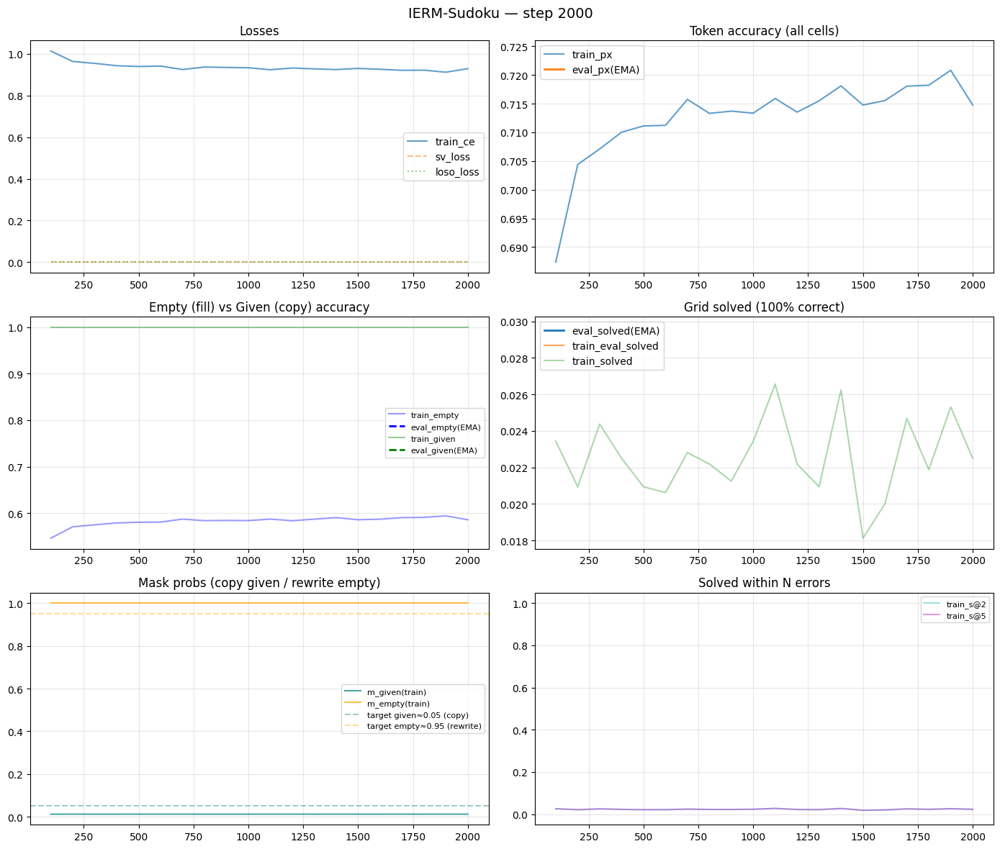

  ★ New best: solved=0.0297  empty=0.5996  px=0.7242
  step    2100/60000 | loss=1.3441 ce=0.9235 px=0.715 empty=0.587 given=1.000 sol=0.0219 m_g=0.012 m_e=1.000 | lr=9.98e-05 | 3.9it/s ETA=245min
  step    2200/60000 | loss=1.3404 ce=0.9212 px=0.717 empty=0.589 given=1.000 sol=0.0206 m_g=0.012 m_e=1.000 | lr=9.97e-05 | 3.9it/s ETA=244min
  step    2300/60000 | loss=1.3335 ce=0.9166 px=0.719 empty=0.592 given=1.000 sol=0.0259 m_g=0.012 m_e=1.000 | lr=9.97e-05 | 3.9it/s ETA=244min
  step    2400/60000 | loss=1.3319 ce=0.9156 px=0.720 empty=0.593 given=1.000 sol=0.0234 m_g=0.012 m_e=1.000 | lr=9.97e-05 | 3.9it/s ETA=243min
  step    2500/60000 | loss=1.3287 ce=0.9135 px=0.720 empty=0.593 given=1.000 sol=0.0234 m_g=0.012 m_e=1.000 | lr=9.97e-05 | 4.0it/s ETA=242min
  step    2600/60000 | loss=1.3492 ce=0.9269 px=0.717 empty=0.589 given=1.000 sol=0.0216 m_g=0.012 m_e=1.000 | lr=9.96e-05 | 4.0it/s ETA=242min
  step    2700/60000 | loss=1.3341 ce=0.9170 px=0.719 empty=0.592 given=1.000 sol=0

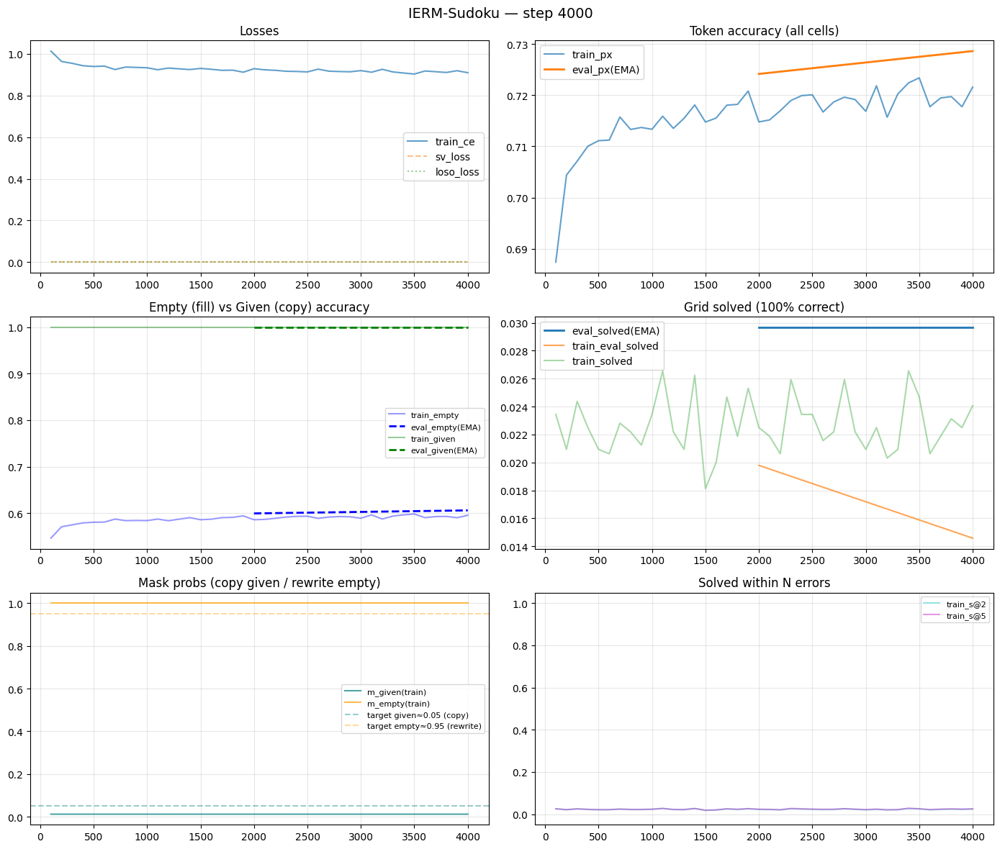

  ★ New best: solved=0.0297  empty=0.6061  px=0.7286
  step    4100/60000 | loss=1.3344 ce=0.9172 px=0.720 empty=0.593 given=1.000 sol=0.0225 m_g=0.012 m_e=1.000 | lr=9.90e-05 | 4.0it/s ETA=235min
  step    4200/60000 | loss=1.3303 ce=0.9144 px=0.721 empty=0.595 given=1.000 sol=0.0250 m_g=0.012 m_e=1.000 | lr=9.90e-05 | 4.0it/s ETA=235min
  step    4300/60000 | loss=1.3136 ce=0.9035 px=0.723 empty=0.598 given=1.000 sol=0.0234 m_g=0.012 m_e=1.000 | lr=9.89e-05 | 4.0it/s ETA=234min
  step    4400/60000 | loss=1.3428 ce=0.9227 px=0.717 empty=0.589 given=1.000 sol=0.0178 m_g=0.012 m_e=1.000 | lr=9.89e-05 | 4.0it/s ETA=233min
  step    4500/60000 | loss=1.3216 ce=0.9088 px=0.721 empty=0.595 given=1.000 sol=0.0228 m_g=0.012 m_e=1.000 | lr=9.88e-05 | 4.0it/s ETA=233min
  step    4600/60000 | loss=1.3232 ce=0.9100 px=0.720 empty=0.594 given=1.000 sol=0.0231 m_g=0.012 m_e=1.000 | lr=9.87e-05 | 4.0it/s ETA=232min
  step    4700/60000 | loss=1.3230 ce=0.9097 px=0.722 empty=0.596 given=1.000 sol=0

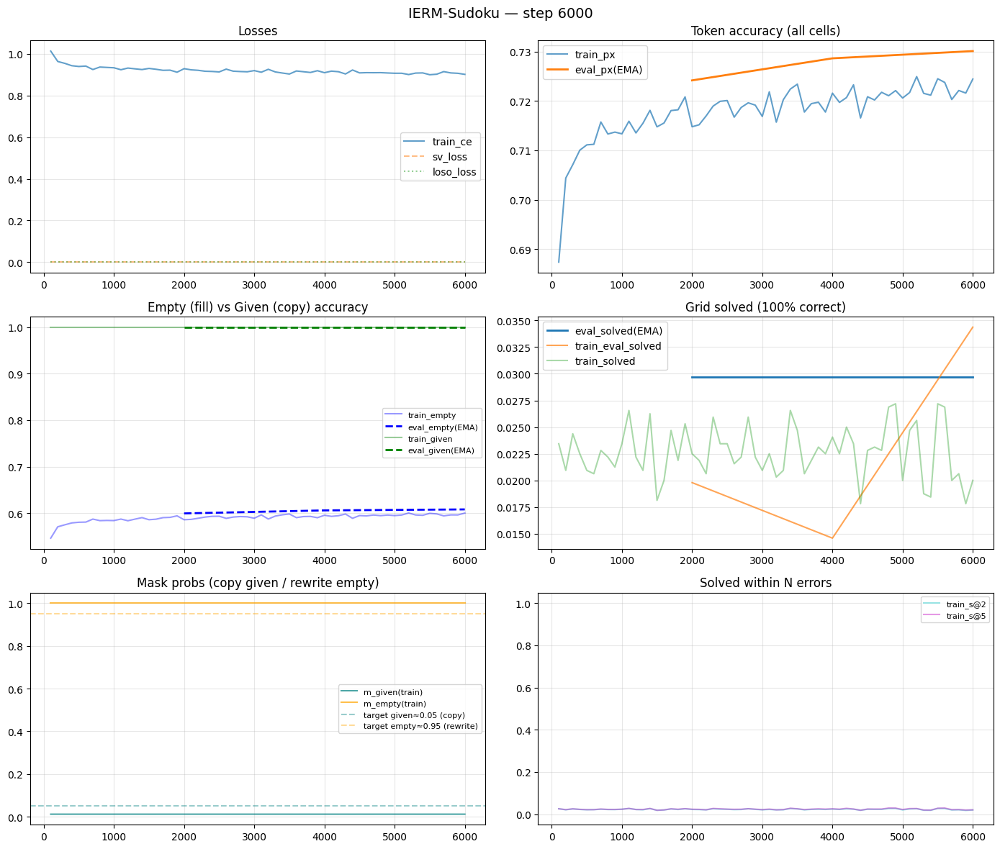

  ★ New best: solved=0.0297  empty=0.6082  px=0.7301
  step    6100/60000 | loss=1.3241 ce=0.9103 px=0.722 empty=0.597 given=1.000 sol=0.0256 m_g=0.012 m_e=1.000 | lr=9.78e-05 | 3.9it/s ETA=233min
  step    6200/60000 | loss=1.3239 ce=0.9103 px=0.721 empty=0.595 given=1.000 sol=0.0187 m_g=0.012 m_e=1.000 | lr=9.77e-05 | 3.8it/s ETA=233min
  step    6300/60000 | loss=1.3153 ce=0.9047 px=0.723 empty=0.598 given=1.000 sol=0.0219 m_g=0.012 m_e=1.000 | lr=9.76e-05 | 3.8it/s ETA=234min
  step    6400/60000 | loss=1.3270 ce=0.9123 px=0.720 empty=0.594 given=1.000 sol=0.0259 m_g=0.012 m_e=1.000 | lr=9.75e-05 | 3.8it/s ETA=234min
  step    6500/60000 | loss=1.3284 ce=0.9132 px=0.721 empty=0.595 given=1.000 sol=0.0213 m_g=0.012 m_e=1.000 | lr=9.74e-05 | 3.8it/s ETA=234min
  step    6600/60000 | loss=1.3204 ce=0.9079 px=0.723 empty=0.597 given=1.000 sol=0.0213 m_g=0.012 m_e=1.000 | lr=9.74e-05 | 3.8it/s ETA=233min
  step    6700/60000 | loss=1.3066 ce=0.8989 px=0.725 empty=0.601 given=1.000 sol=0

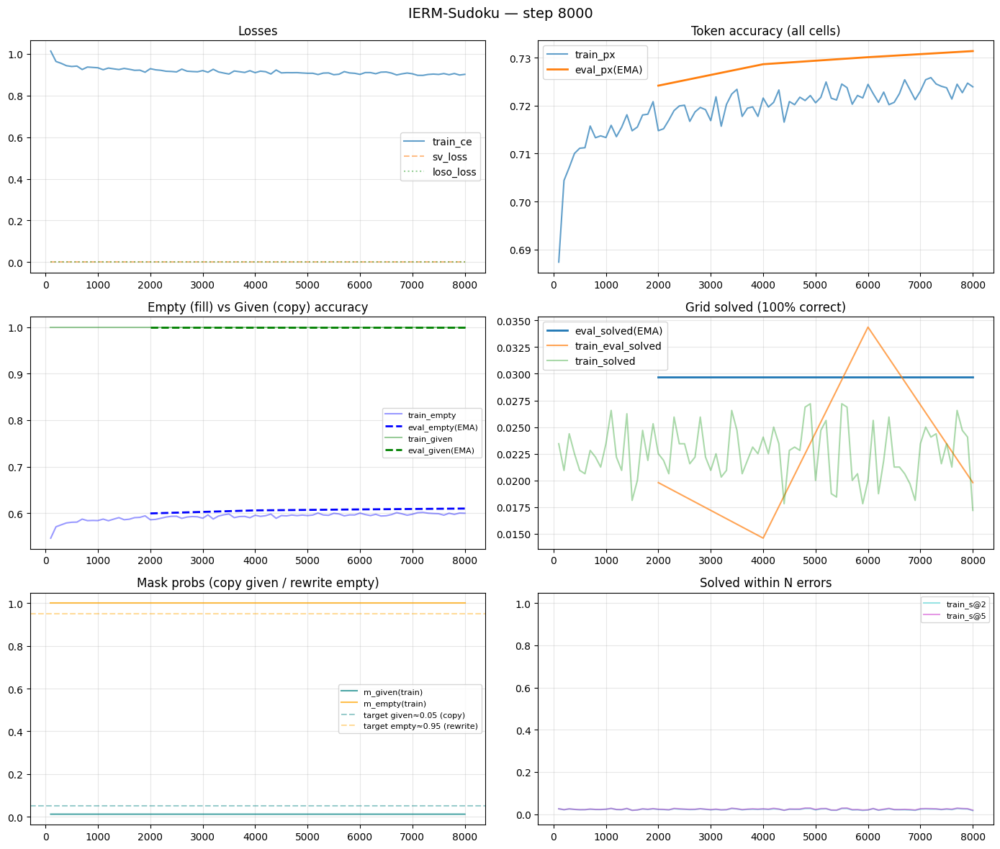

  ★ New best: solved=0.0297  empty=0.6100  px=0.7314
  step    8100/60000 | loss=1.3062 ce=0.8987 px=0.727 empty=0.603 given=1.000 sol=0.0241 m_g=0.012 m_e=1.000 | lr=9.60e-05 | 3.7it/s ETA=234min
  step    8200/60000 | loss=1.3196 ce=0.9074 px=0.723 empty=0.598 given=1.000 sol=0.0259 m_g=0.012 m_e=1.000 | lr=9.59e-05 | 3.7it/s ETA=233min
  step    8300/60000 | loss=1.3079 ce=0.8997 px=0.725 empty=0.601 given=1.000 sol=0.0259 m_g=0.012 m_e=1.000 | lr=9.58e-05 | 3.7it/s ETA=233min
  step    8400/60000 | loss=1.3066 ce=0.8989 px=0.725 empty=0.601 given=1.000 sol=0.0222 m_g=0.012 m_e=1.000 | lr=9.57e-05 | 3.7it/s ETA=233min
  step    8500/60000 | loss=1.3012 ce=0.8955 px=0.727 empty=0.603 given=1.000 sol=0.0222 m_g=0.012 m_e=1.000 | lr=9.56e-05 | 3.7it/s ETA=233min
  step    8600/60000 | loss=1.3188 ce=0.9069 px=0.723 empty=0.597 given=1.000 sol=0.0231 m_g=0.012 m_e=1.000 | lr=9.55e-05 | 3.7it/s ETA=232min
  step    8700/60000 | loss=1.3034 ce=0.8967 px=0.726 empty=0.602 given=1.000 sol=0

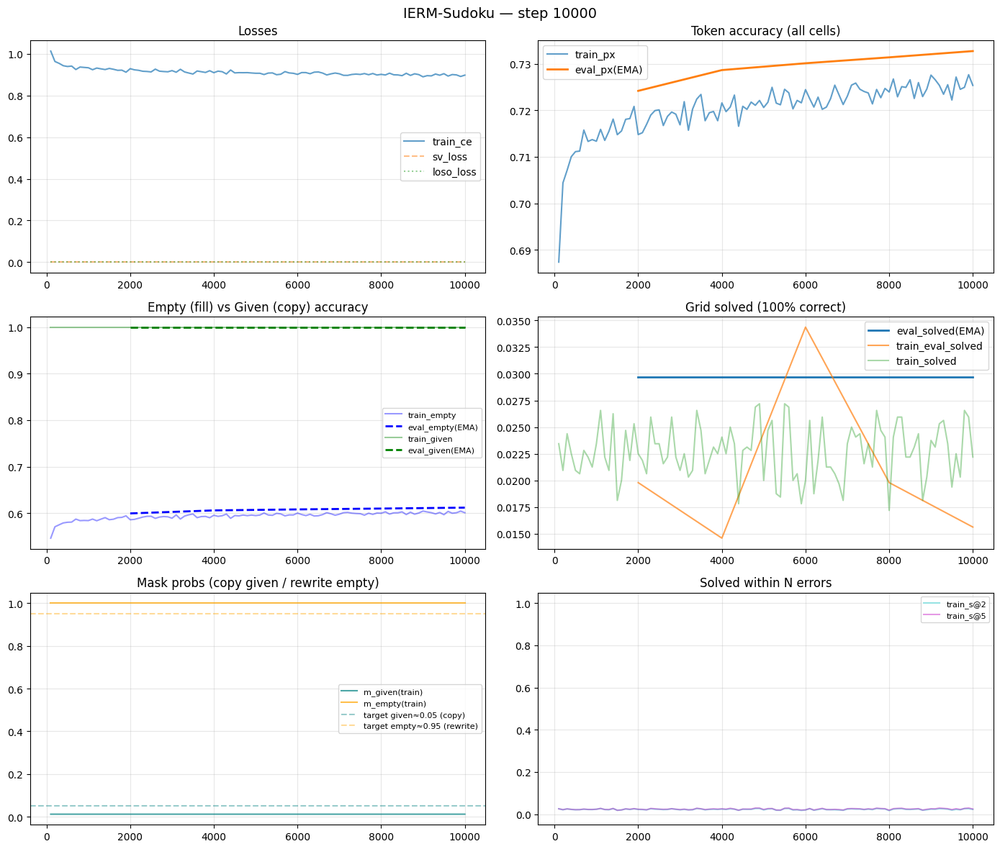

  ★ New best: solved=0.0297  empty=0.6120  px=0.7327


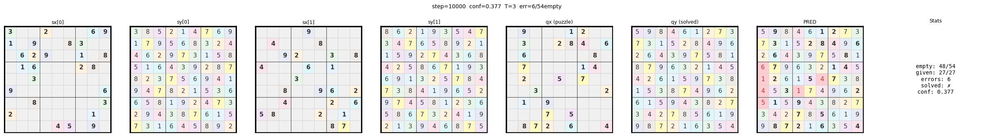

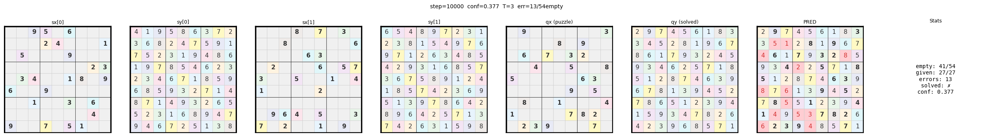

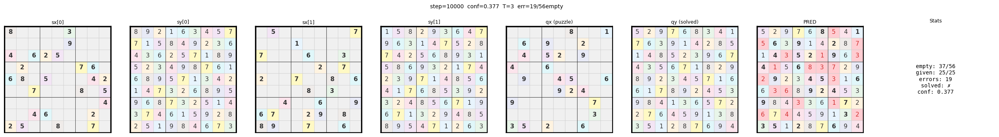

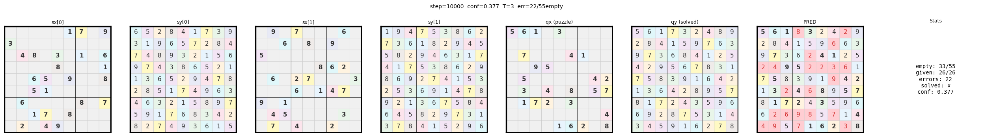

  step   10100/60000 | loss=1.1568 ce=0.7970 px=0.772 empty=0.670 given=1.000 sol=0.0716 m_g=0.012 m_e=1.000 | lr=9.38e-05 | 3.6it/s ETA=231min
  step   10200/60000 | loss=1.1352 ce=0.7832 px=0.777 empty=0.676 given=1.000 sol=0.0762 m_g=0.012 m_e=1.000 | lr=9.36e-05 | 3.6it/s ETA=233min
  step   10300/60000 | loss=1.1088 ce=0.7653 px=0.782 empty=0.683 given=1.000 sol=0.0844 m_g=0.012 m_e=1.000 | lr=9.35e-05 | 3.5it/s ETA=234min
  step   10400/60000 | loss=1.1275 ce=0.7775 px=0.778 empty=0.678 given=1.000 sol=0.0866 m_g=0.012 m_e=1.000 | lr=9.34e-05 | 3.5it/s ETA=235min
  step   10500/60000 | loss=1.1126 ce=0.7677 px=0.782 empty=0.683 given=1.000 sol=0.0856 m_g=0.012 m_e=1.000 | lr=9.33e-05 | 3.5it/s ETA=236min
  step   10600/60000 | loss=1.1169 ce=0.7704 px=0.780 empty=0.681 given=1.000 sol=0.0797 m_g=0.012 m_e=1.000 | lr=9.31e-05 | 3.5it/s ETA=237min
  step   10700/60000 | loss=1.1077 ce=0.7646 px=0.782 empty=0.684 given=1.000 sol=0.0878 m_g=0.012 m_e=1.000 | lr=9.30e-05 | 3.5it/s ETA

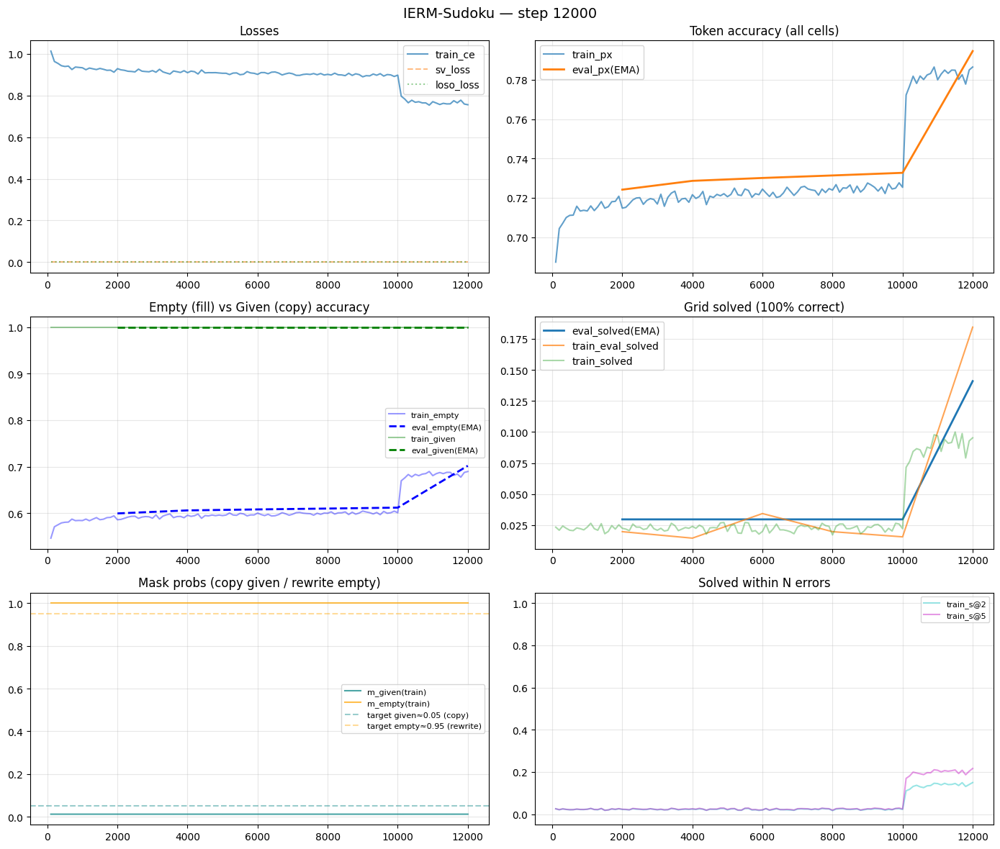

  ★ New best: solved=0.1409  empty=0.7020  px=0.7945
  step   12100/60000 | loss=1.0916 ce=0.7538 px=0.788 empty=0.691 given=1.000 sol=0.0975 m_g=0.012 m_e=1.000 | lr=9.11e-05 | 3.2it/s ETA=248min
  step   12200/60000 | loss=1.0930 ce=0.7544 px=0.786 empty=0.690 given=1.000 sol=0.1025 m_g=0.012 m_e=1.000 | lr=9.09e-05 | 3.2it/s ETA=249min
  step   12300/60000 | loss=1.1227 ce=0.7750 px=0.779 empty=0.679 given=1.000 sol=0.0853 m_g=0.012 m_e=1.000 | lr=9.08e-05 | 3.2it/s ETA=249min
  step   12400/60000 | loss=1.0877 ce=0.7516 px=0.786 empty=0.690 given=1.000 sol=0.0866 m_g=0.012 m_e=1.000 | lr=9.06e-05 | 3.2it/s ETA=249min
  step   12500/60000 | loss=1.0902 ce=0.7530 px=0.786 empty=0.689 given=1.000 sol=0.0944 m_g=0.012 m_e=1.000 | lr=9.05e-05 | 3.2it/s ETA=250min
  step   12600/60000 | loss=1.0997 ce=0.7595 px=0.783 empty=0.686 given=1.000 sol=0.0897 m_g=0.012 m_e=1.000 | lr=9.03e-05 | 3.2it/s ETA=250min
  step   12700/60000 | loss=1.0926 ce=0.7547 px=0.786 empty=0.689 given=1.000 sol=0

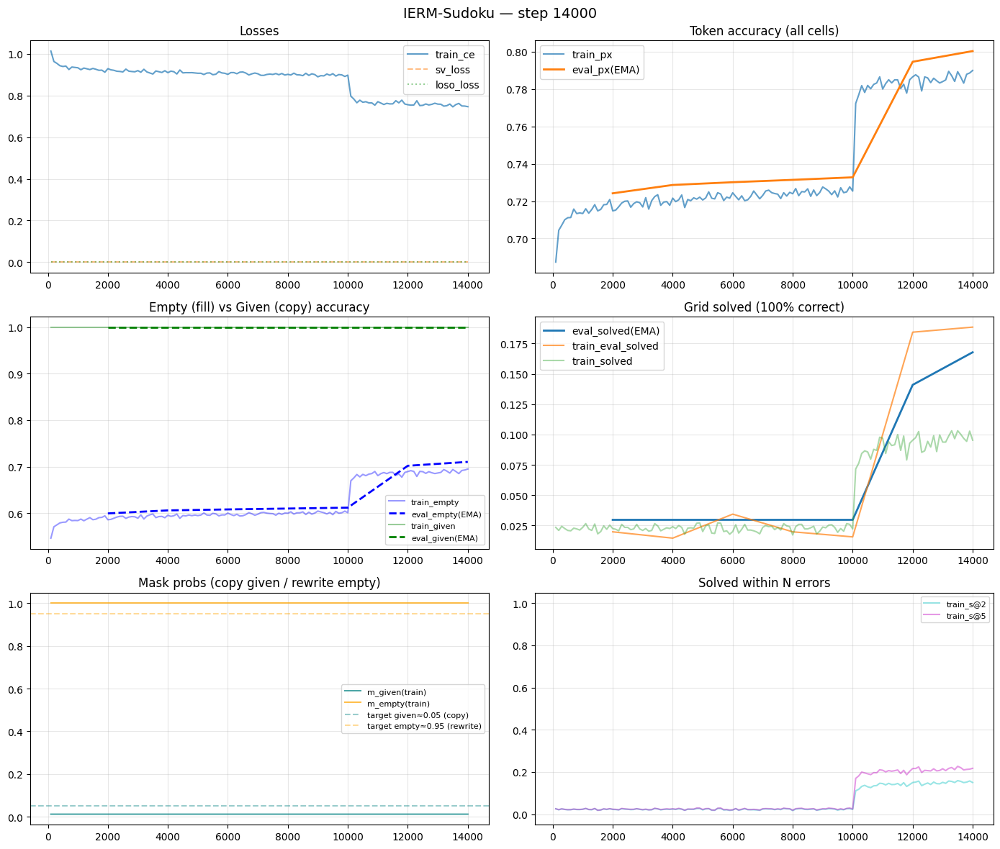

  ★ New best: solved=0.1678  empty=0.7103  px=0.8002
  step   14100/60000 | loss=1.0888 ce=0.7518 px=0.788 empty=0.692 given=1.000 sol=0.1078 m_g=0.012 m_e=1.000 | lr=8.80e-05 | 3.0it/s ETA=255min
  step   14200/60000 | loss=1.1002 ce=0.7599 px=0.783 empty=0.685 given=1.000 sol=0.0956 m_g=0.012 m_e=1.000 | lr=8.78e-05 | 3.0it/s ETA=255min
  step   14300/60000 | loss=1.0933 ce=0.7549 px=0.786 empty=0.689 given=1.000 sol=0.1003 m_g=0.012 m_e=1.000 | lr=8.76e-05 | 3.0it/s ETA=255min
  step   14400/60000 | loss=1.1069 ce=0.7641 px=0.783 empty=0.685 given=1.000 sol=0.0862 m_g=0.012 m_e=1.000 | lr=8.75e-05 | 3.0it/s ETA=255min
  step   14500/60000 | loss=1.1100 ce=0.7666 px=0.782 empty=0.684 given=1.000 sol=0.0828 m_g=0.012 m_e=1.000 | lr=8.73e-05 | 3.0it/s ETA=255min
  step   14600/60000 | loss=1.0853 ce=0.7496 px=0.789 empty=0.694 given=1.000 sol=0.1034 m_g=0.012 m_e=1.000 | lr=8.71e-05 | 3.0it/s ETA=255min
  step   14700/60000 | loss=1.1019 ce=0.7610 px=0.784 empty=0.686 given=1.000 sol=0

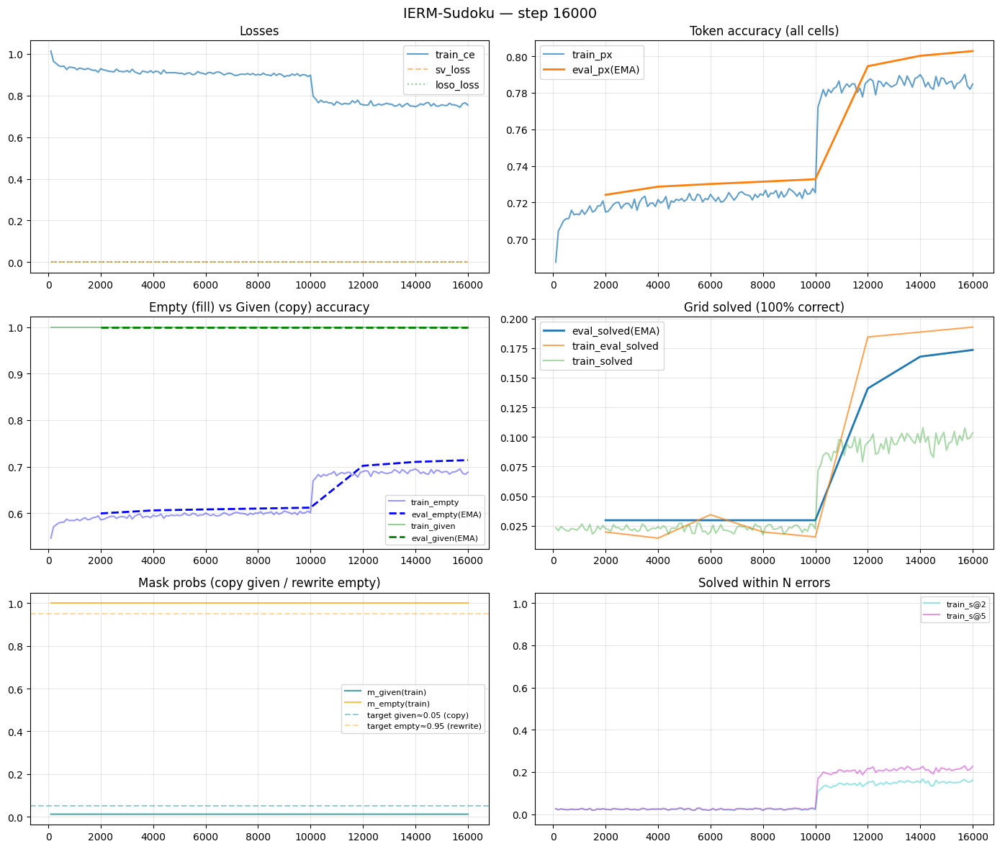

  ★ New best: solved=0.1734  empty=0.7141  px=0.8028
  step   16100/60000 | loss=1.0786 ce=0.7452 px=0.789 empty=0.694 given=1.000 sol=0.1153 m_g=0.012 m_e=1.000 | lr=8.45e-05 | 2.9it/s ETA=255min
  step   16200/60000 | loss=1.0798 ce=0.7461 px=0.789 empty=0.694 given=1.000 sol=0.1072 m_g=0.012 m_e=1.000 | lr=8.43e-05 | 2.9it/s ETA=254min
  step   16300/60000 | loss=1.0908 ce=0.7535 px=0.786 empty=0.690 given=1.000 sol=0.1019 m_g=0.012 m_e=1.000 | lr=8.41e-05 | 2.9it/s ETA=254min
  step   16400/60000 | loss=1.0977 ce=0.7575 px=0.786 empty=0.690 given=1.000 sol=0.0944 m_g=0.012 m_e=1.000 | lr=8.39e-05 | 2.9it/s ETA=254min
  step   16500/60000 | loss=1.0765 ce=0.7435 px=0.789 empty=0.694 given=1.000 sol=0.0969 m_g=0.012 m_e=1.000 | lr=8.37e-05 | 2.9it/s ETA=254min
  step   16600/60000 | loss=1.1013 ce=0.7603 px=0.784 empty=0.686 given=1.000 sol=0.0978 m_g=0.012 m_e=1.000 | lr=8.35e-05 | 2.9it/s ETA=253min
  step   16700/60000 | loss=1.0794 ce=0.7460 px=0.789 empty=0.694 given=1.000 sol=0

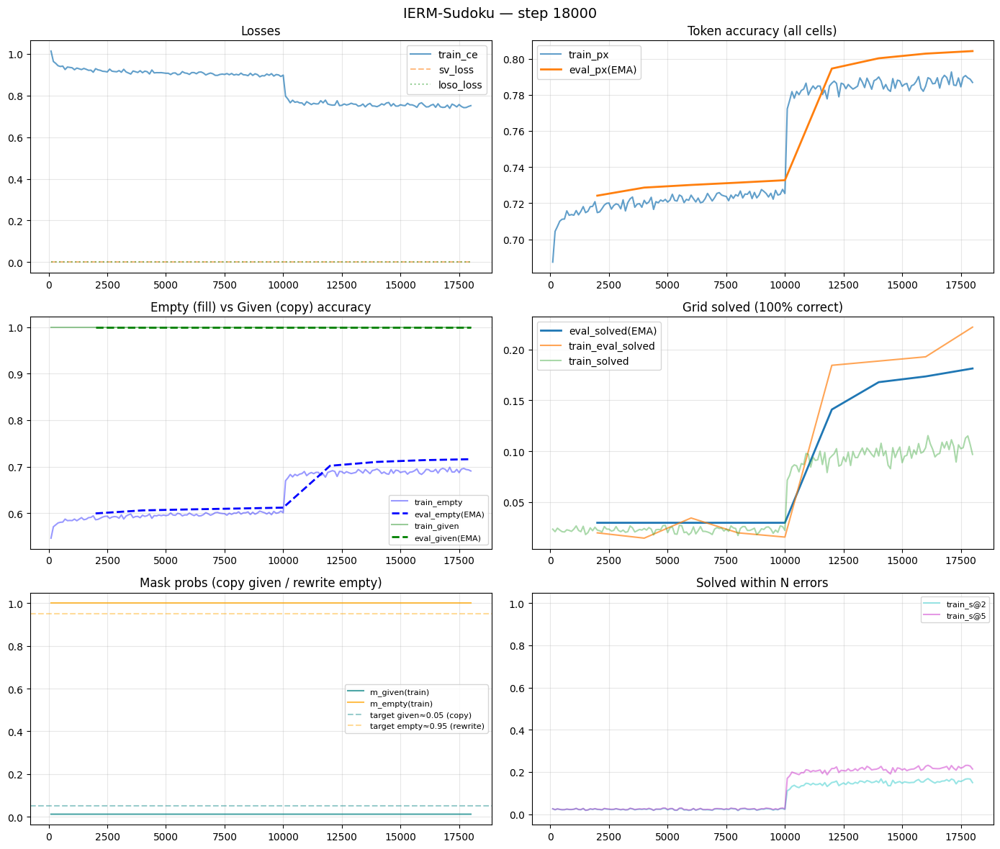

  ★ New best: solved=0.1812  empty=0.7161  px=0.8042
  step   18100/60000 | loss=1.0901 ce=0.7533 px=0.786 empty=0.690 given=1.000 sol=0.0975 m_g=0.012 m_e=1.000 | lr=8.06e-05 | 2.8it/s ETA=248min
  step   18200/60000 | loss=1.0779 ce=0.7447 px=0.790 empty=0.695 given=1.000 sol=0.1097 m_g=0.012 m_e=1.000 | lr=8.04e-05 | 2.8it/s ETA=248min
  step   18300/60000 | loss=1.0764 ce=0.7442 px=0.791 empty=0.696 given=1.000 sol=0.0972 m_g=0.012 m_e=1.000 | lr=8.02e-05 | 2.8it/s ETA=248min
  step   18400/60000 | loss=1.0834 ce=0.7484 px=0.788 empty=0.693 given=1.000 sol=0.1059 m_g=0.012 m_e=1.000 | lr=8.00e-05 | 2.8it/s ETA=248min
  step   18500/60000 | loss=1.0941 ce=0.7557 px=0.786 empty=0.690 given=1.000 sol=0.0978 m_g=0.012 m_e=1.000 | lr=7.98e-05 | 2.8it/s ETA=247min
  step   18600/60000 | loss=1.0845 ce=0.7495 px=0.787 empty=0.690 given=1.000 sol=0.1016 m_g=0.012 m_e=1.000 | lr=7.96e-05 | 2.8it/s ETA=247min
  step   18700/60000 | loss=1.0740 ce=0.7426 px=0.790 empty=0.696 given=1.000 sol=0

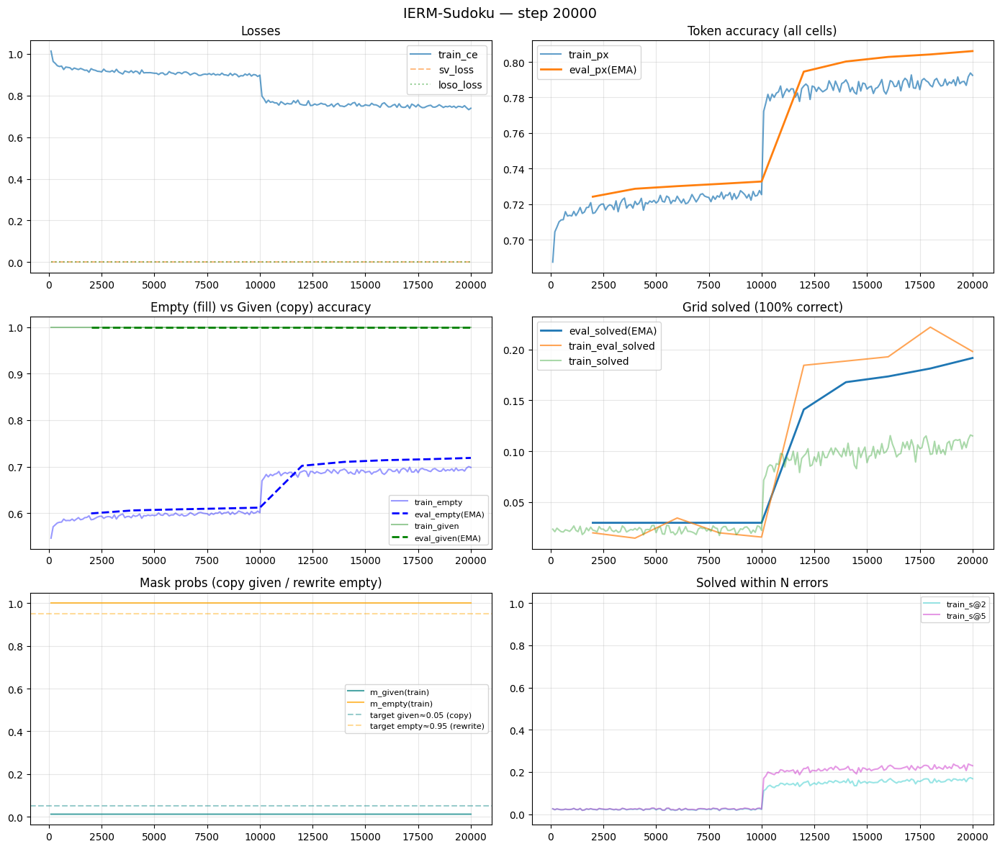

  ★ New best: solved=0.1916  empty=0.7189  px=0.8061


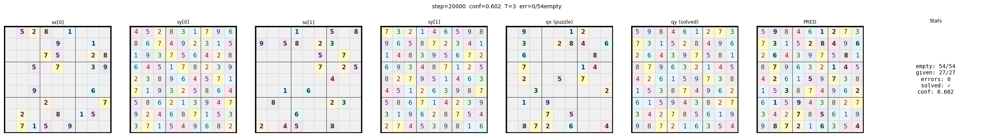

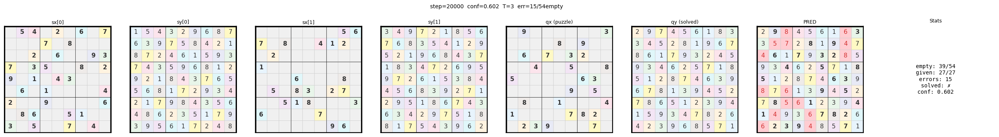

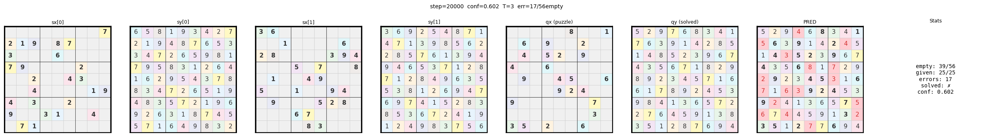

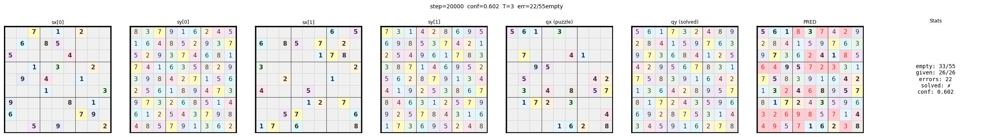

  step   20100/60000 | loss=1.0962 ce=0.7570 px=0.784 empty=0.687 given=1.000 sol=0.1034 m_g=0.012 m_e=1.000 | lr=7.65e-05 | 2.7it/s ETA=242min
  step   20200/60000 | loss=1.0872 ce=0.7513 px=0.787 empty=0.690 given=1.000 sol=0.1062 m_g=0.012 m_e=1.000 | lr=7.62e-05 | 2.7it/s ETA=242min
  step   20300/60000 | loss=1.0793 ce=0.7460 px=0.788 empty=0.693 given=1.000 sol=0.1147 m_g=0.012 m_e=1.000 | lr=7.60e-05 | 2.7it/s ETA=241min
  step   20400/60000 | loss=1.0648 ce=0.7363 px=0.793 empty=0.699 given=1.000 sol=0.1122 m_g=0.012 m_e=1.000 | lr=7.58e-05 | 2.7it/s ETA=241min
  step   20500/60000 | loss=1.0540 ce=0.7293 px=0.793 empty=0.700 given=1.000 sol=0.1181 m_g=0.012 m_e=1.000 | lr=7.56e-05 | 2.7it/s ETA=241min
  step   20600/60000 | loss=1.0725 ce=0.7415 px=0.790 empty=0.695 given=1.000 sol=0.1066 m_g=0.012 m_e=1.000 | lr=7.54e-05 | 2.7it/s ETA=240min
  step   20700/60000 | loss=1.0831 ce=0.7486 px=0.787 empty=0.691 given=1.000 sol=0.1097 m_g=0.012 m_e=1.000 | lr=7.52e-05 | 2.7it/s ETA

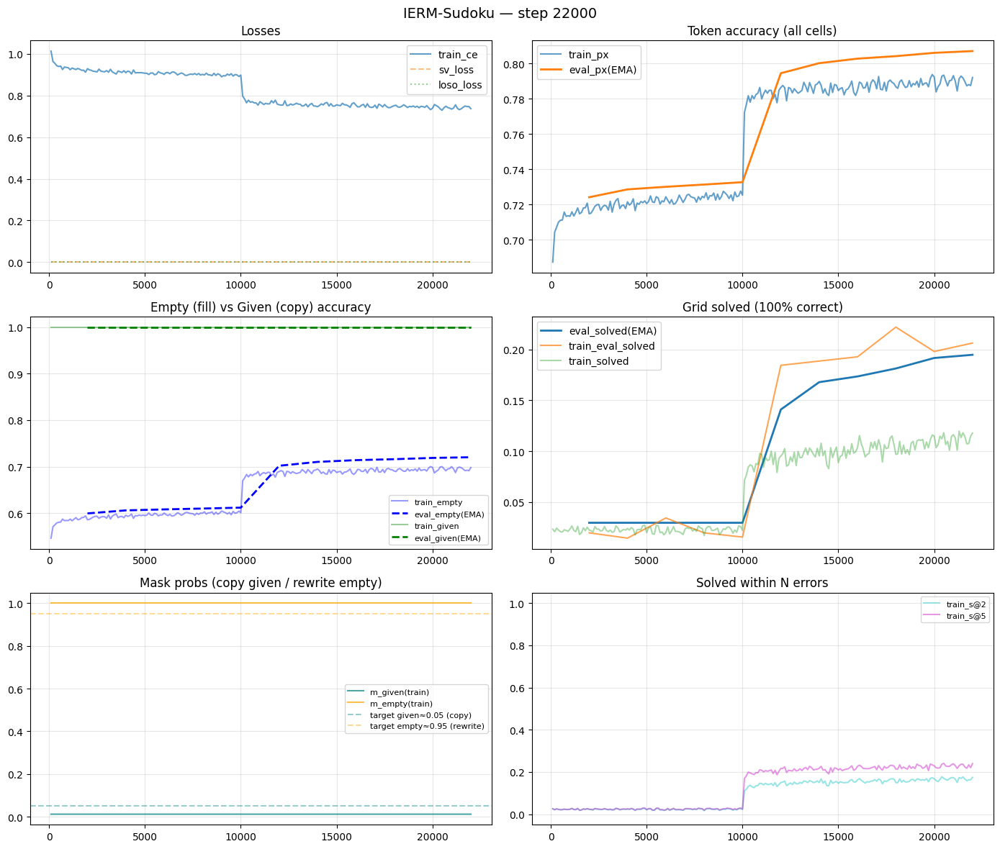

  ★ New best: solved=0.1947  empty=0.7203  px=0.8071
  step   22100/60000 | loss=1.0863 ce=0.7502 px=0.788 empty=0.692 given=1.000 sol=0.1241 m_g=0.012 m_e=1.000 | lr=7.20e-05 | 2.7it/s ETA=234min
  step   22200/60000 | loss=1.0588 ce=0.7323 px=0.794 empty=0.700 given=1.000 sol=0.1103 m_g=0.012 m_e=1.000 | lr=7.18e-05 | 2.7it/s ETA=234min
  step   22300/60000 | loss=1.0630 ce=0.7353 px=0.793 empty=0.700 given=1.000 sol=0.1253 m_g=0.012 m_e=1.000 | lr=7.16e-05 | 2.7it/s ETA=233min
  step   22400/60000 | loss=1.0777 ce=0.7449 px=0.789 empty=0.694 given=1.000 sol=0.1103 m_g=0.012 m_e=1.000 | lr=7.14e-05 | 2.7it/s ETA=233min
  step   22500/60000 | loss=1.0798 ce=0.7465 px=0.789 empty=0.694 given=1.000 sol=0.1047 m_g=0.012 m_e=1.000 | lr=7.11e-05 | 2.7it/s ETA=232min
  step   22600/60000 | loss=1.0720 ce=0.7410 px=0.790 empty=0.696 given=1.000 sol=0.1062 m_g=0.012 m_e=1.000 | lr=7.09e-05 | 2.7it/s ETA=232min
  step   22700/60000 | loss=1.0825 ce=0.7482 px=0.788 empty=0.692 given=1.000 sol=0

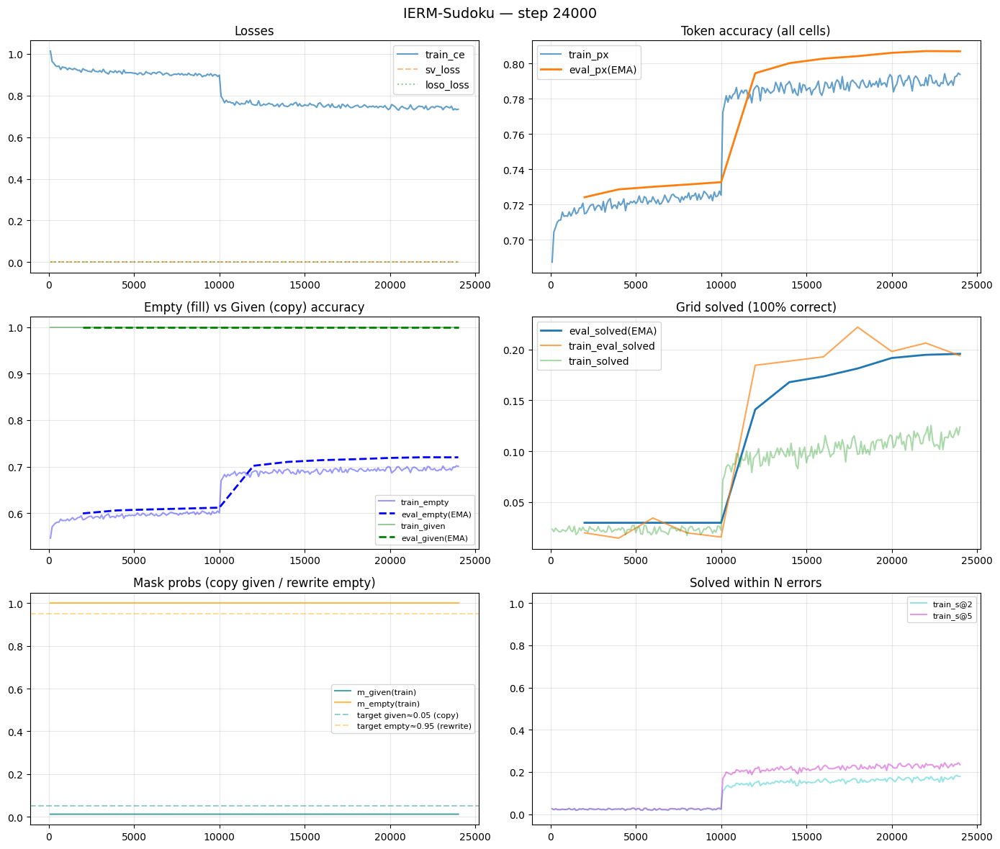

  ★ New best: solved=0.1956  empty=0.7201  px=0.8070
  step   24100/60000 | loss=1.0385 ce=0.7187 px=0.801 empty=0.710 given=1.000 sol=0.1353 m_g=0.012 m_e=1.000 | lr=6.74e-05 | 2.7it/s ETA=225min
  step   24200/60000 | loss=1.0757 ce=0.7437 px=0.790 empty=0.695 given=1.000 sol=0.1134 m_g=0.012 m_e=1.000 | lr=6.72e-05 | 2.7it/s ETA=224min
  step   24300/60000 | loss=1.0600 ce=0.7333 px=0.793 empty=0.699 given=1.000 sol=0.1109 m_g=0.012 m_e=1.000 | lr=6.69e-05 | 2.7it/s ETA=224min
  step   24400/60000 | loss=1.0788 ce=0.7456 px=0.789 empty=0.694 given=1.000 sol=0.1200 m_g=0.012 m_e=1.000 | lr=6.67e-05 | 2.7it/s ETA=223min
  step   24500/60000 | loss=1.0694 ce=0.7393 px=0.792 empty=0.698 given=1.000 sol=0.1206 m_g=0.012 m_e=1.000 | lr=6.65e-05 | 2.7it/s ETA=223min
  step   24600/60000 | loss=1.0703 ce=0.7399 px=0.790 empty=0.695 given=1.000 sol=0.1109 m_g=0.012 m_e=1.000 | lr=6.62e-05 | 2.7it/s ETA=222min
  step   24700/60000 | loss=1.0734 ce=0.7421 px=0.790 empty=0.695 given=1.000 sol=0

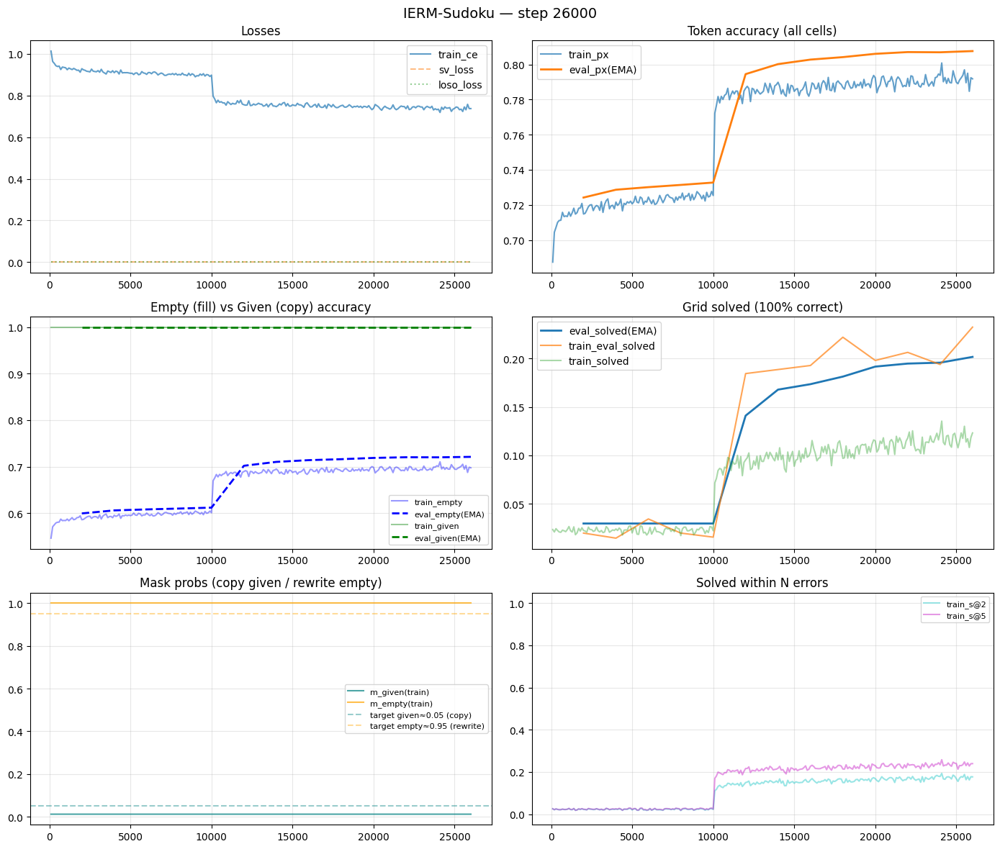

  ★ New best: solved=0.2016  empty=0.7211  px=0.8077
  step   26100/60000 | loss=1.0645 ce=0.7362 px=0.793 empty=0.701 given=1.000 sol=0.1169 m_g=0.012 m_e=1.000 | lr=6.26e-05 | 2.6it/s ETA=215min
  step   26200/60000 | loss=1.0607 ce=0.7333 px=0.794 empty=0.701 given=1.000 sol=0.1244 m_g=0.012 m_e=1.000 | lr=6.24e-05 | 2.6it/s ETA=214min
  step   26300/60000 | loss=1.0571 ce=0.7310 px=0.795 empty=0.702 given=1.000 sol=0.1169 m_g=0.012 m_e=1.000 | lr=6.21e-05 | 2.6it/s ETA=213min
  step   26400/60000 | loss=1.0639 ce=0.7354 px=0.793 empty=0.700 given=1.000 sol=0.1206 m_g=0.012 m_e=1.000 | lr=6.19e-05 | 2.6it/s ETA=213min
  step   26500/60000 | loss=1.0596 ce=0.7334 px=0.793 empty=0.700 given=1.000 sol=0.1247 m_g=0.012 m_e=1.000 | lr=6.16e-05 | 2.6it/s ETA=212min
  step   26600/60000 | loss=1.0579 ce=0.7319 px=0.792 empty=0.698 given=1.000 sol=0.1237 m_g=0.012 m_e=1.000 | lr=6.14e-05 | 2.6it/s ETA=212min
  step   26700/60000 | loss=1.0671 ce=0.7378 px=0.792 empty=0.698 given=1.000 sol=0

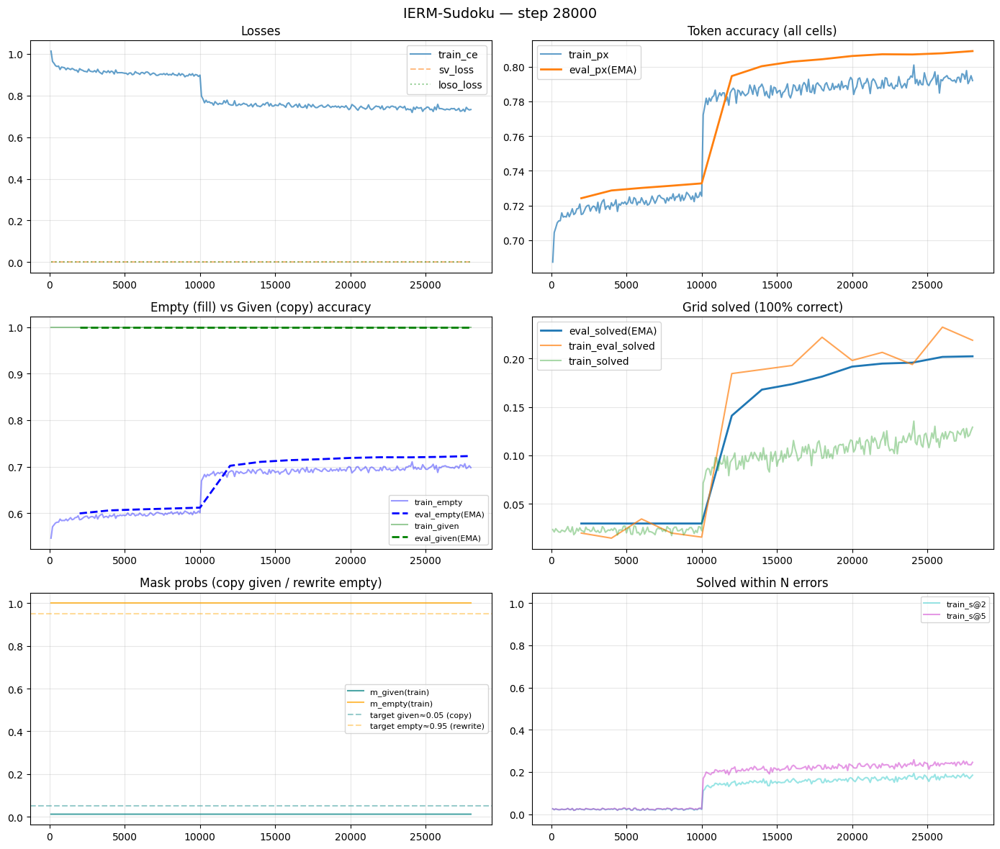

  ★ New best: solved=0.2022  empty=0.7230  px=0.8089
  step   28100/60000 | loss=1.0653 ce=0.7365 px=0.792 empty=0.698 given=1.000 sol=0.1228 m_g=0.012 m_e=1.000 | lr=5.77e-05 | 2.6it/s ETA=204min
  step   28200/60000 | loss=1.0596 ce=0.7324 px=0.795 empty=0.702 given=1.000 sol=0.1272 m_g=0.012 m_e=1.000 | lr=5.75e-05 | 2.6it/s ETA=203min
  step   28300/60000 | loss=1.0414 ce=0.7205 px=0.798 empty=0.706 given=1.000 sol=0.1412 m_g=0.012 m_e=1.000 | lr=5.72e-05 | 2.6it/s ETA=203min
  step   28400/60000 | loss=1.0455 ce=0.7234 px=0.797 empty=0.704 given=1.000 sol=0.1316 m_g=0.012 m_e=1.000 | lr=5.70e-05 | 2.6it/s ETA=202min
  step   28500/60000 | loss=1.0697 ce=0.7398 px=0.792 empty=0.698 given=1.000 sol=0.1153 m_g=0.012 m_e=1.000 | lr=5.67e-05 | 2.6it/s ETA=201min
  step   28600/60000 | loss=1.0611 ce=0.7339 px=0.792 empty=0.699 given=1.000 sol=0.1106 m_g=0.012 m_e=1.000 | lr=5.65e-05 | 2.6it/s ETA=201min
  step   28700/60000 | loss=1.0561 ce=0.7304 px=0.795 empty=0.702 given=1.000 sol=0

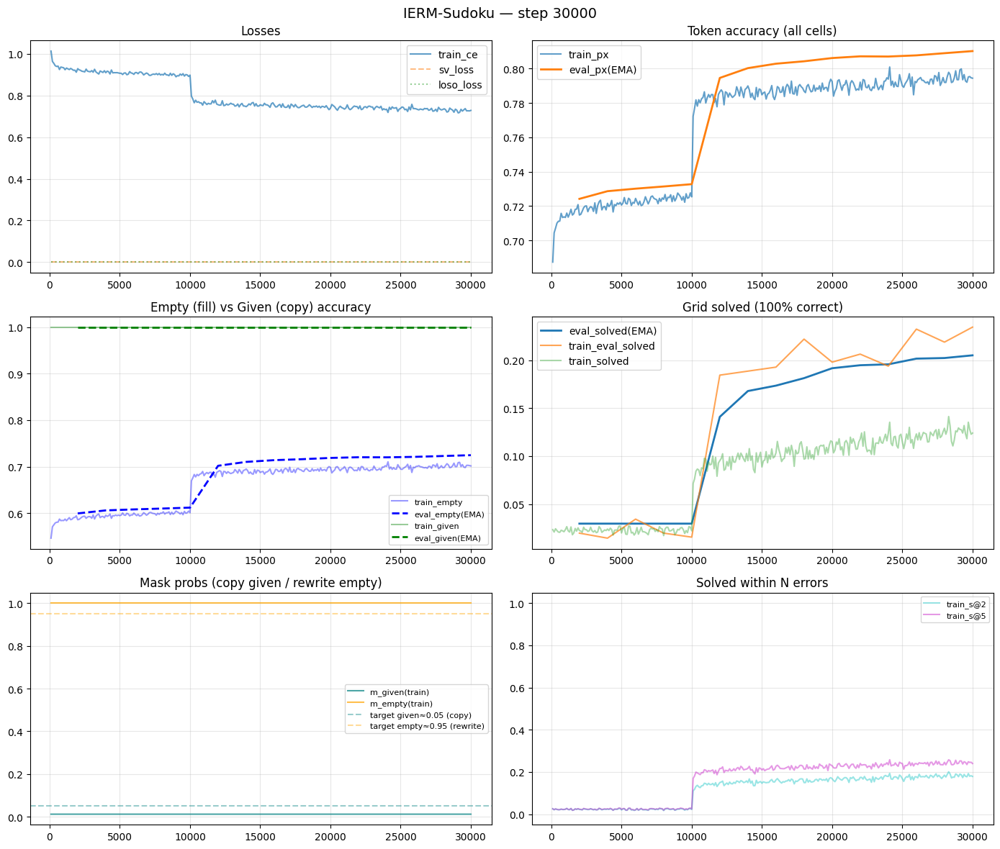

  ★ New best: solved=0.2050  empty=0.7247  px=0.8101


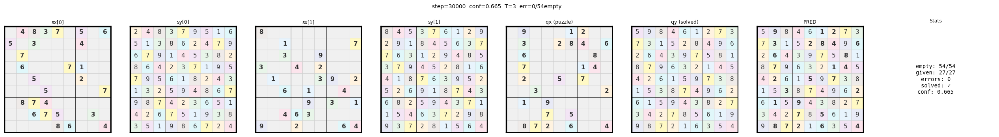

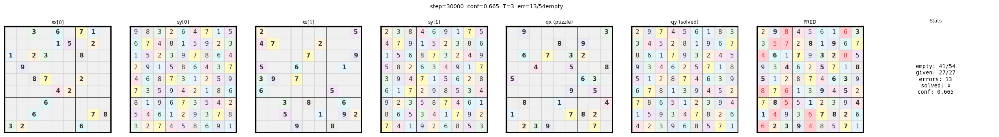

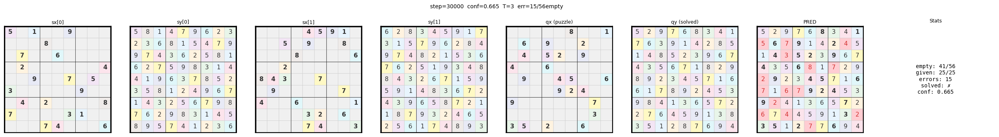

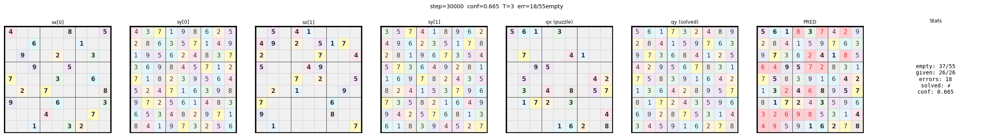

  step   30100/60000 | loss=1.1161 ce=0.7699 px=0.799 empty=0.707 given=1.000 sol=0.1431 m_g=0.011 m_e=1.000 | lr=5.27e-05 | 2.6it/s ETA=193min
  step   30200/60000 | loss=1.1193 ce=0.7720 px=0.797 empty=0.705 given=1.000 sol=0.1334 m_g=0.011 m_e=1.000 | lr=5.25e-05 | 2.6it/s ETA=192min
  step   30300/60000 | loss=1.1259 ce=0.7768 px=0.793 empty=0.700 given=1.000 sol=0.1222 m_g=0.011 m_e=1.000 | lr=5.23e-05 | 2.6it/s ETA=191min
  step   30400/60000 | loss=1.1309 ce=0.7796 px=0.795 empty=0.702 given=1.000 sol=0.1241 m_g=0.011 m_e=1.000 | lr=5.20e-05 | 2.6it/s ETA=191min
  step   30500/60000 | loss=1.1166 ce=0.7705 px=0.797 empty=0.705 given=1.000 sol=0.1216 m_g=0.011 m_e=1.000 | lr=5.18e-05 | 2.6it/s ETA=190min
  step   30600/60000 | loss=1.1248 ce=0.7759 px=0.796 empty=0.704 given=1.000 sol=0.1347 m_g=0.011 m_e=1.000 | lr=5.15e-05 | 2.6it/s ETA=190min
  step   30700/60000 | loss=1.1251 ce=0.7760 px=0.794 empty=0.700 given=1.000 sol=0.1237 m_g=0.011 m_e=1.000 | lr=5.13e-05 | 2.6it/s ETA

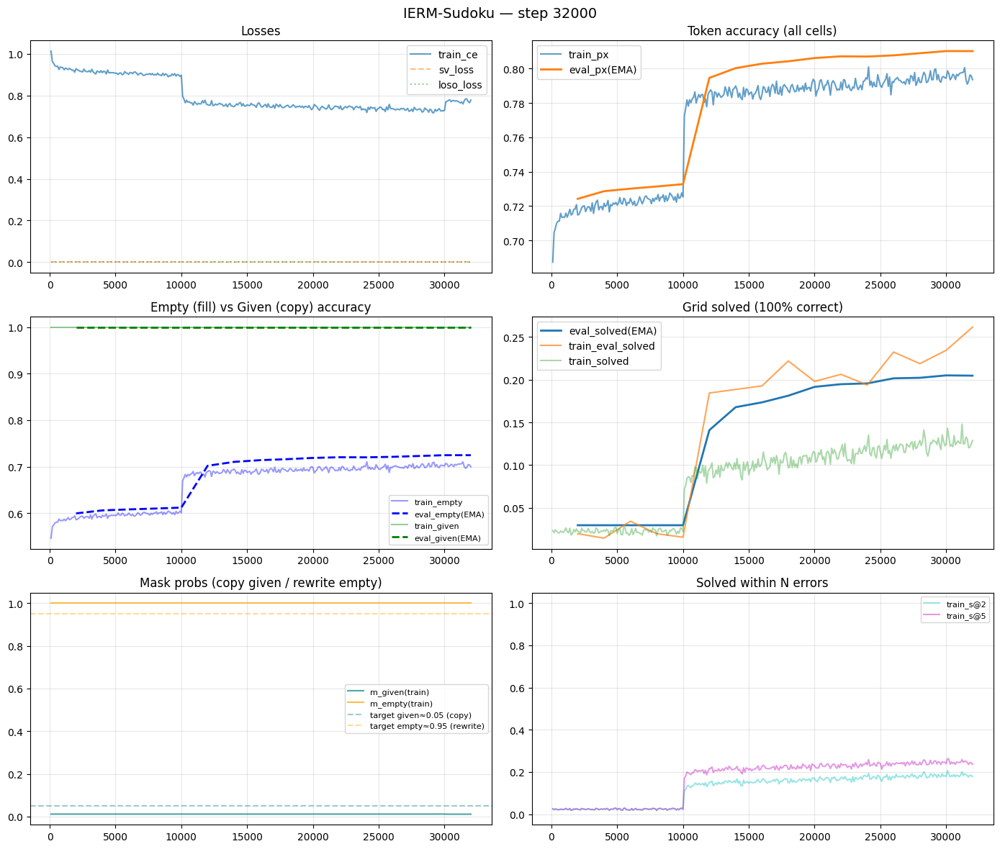

  step   32100/60000 | loss=1.1305 ce=0.7800 px=0.792 empty=0.698 given=1.000 sol=0.1200 m_g=0.011 m_e=1.000 | lr=4.78e-05 | 2.6it/s ETA=181min
  step   32200/60000 | loss=1.1227 ce=0.7742 px=0.794 empty=0.701 given=1.000 sol=0.1359 m_g=0.011 m_e=1.000 | lr=4.75e-05 | 2.6it/s ETA=181min
  step   32300/60000 | loss=1.1186 ce=0.7718 px=0.797 empty=0.705 given=1.000 sol=0.1303 m_g=0.011 m_e=1.000 | lr=4.73e-05 | 2.6it/s ETA=180min
  step   32400/60000 | loss=1.1304 ce=0.7795 px=0.794 empty=0.701 given=1.000 sol=0.1263 m_g=0.011 m_e=1.000 | lr=4.70e-05 | 2.6it/s ETA=179min
  step   32500/60000 | loss=1.1250 ce=0.7765 px=0.794 empty=0.700 given=1.000 sol=0.1316 m_g=0.011 m_e=1.000 | lr=4.68e-05 | 2.6it/s ETA=179min
  step   32600/60000 | loss=1.1225 ce=0.7747 px=0.794 empty=0.702 given=1.000 sol=0.1284 m_g=0.011 m_e=1.000 | lr=4.65e-05 | 2.6it/s ETA=178min
  step   32700/60000 | loss=1.1043 ce=0.7625 px=0.799 empty=0.708 given=1.000 sol=0.1356 m_g=0.011 m_e=1.000 | lr=4.63e-05 | 2.6it/s ETA

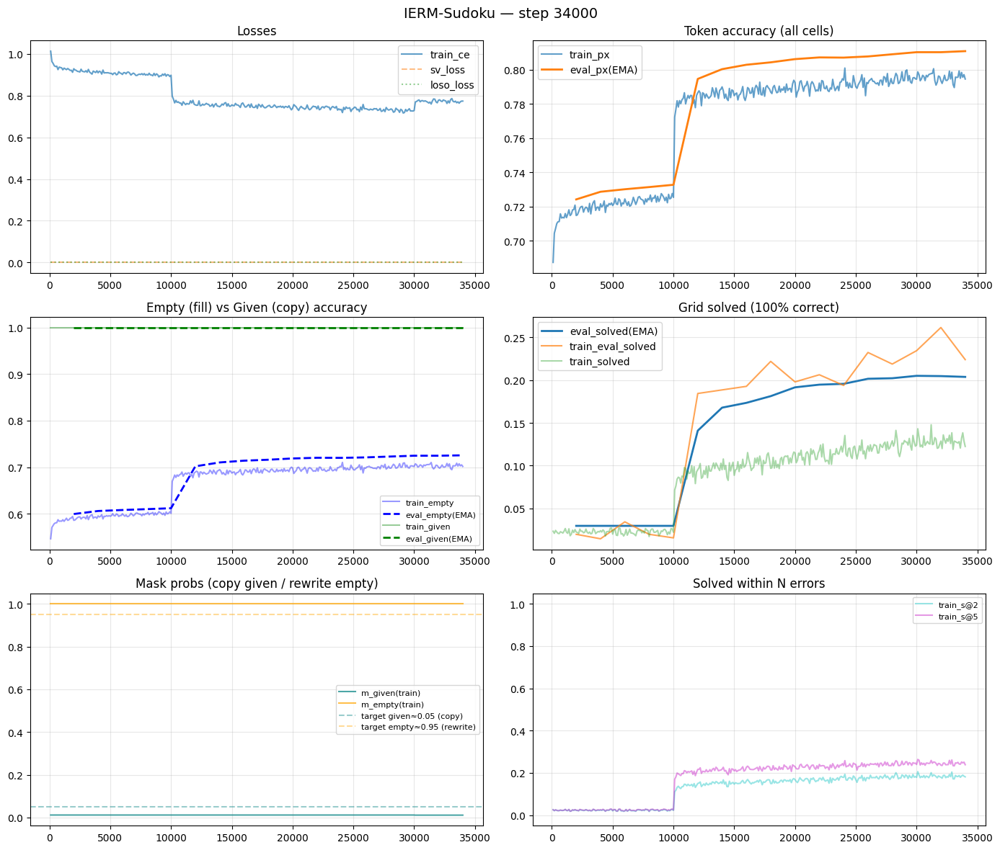

  step   34100/60000 | loss=1.1148 ce=0.7693 px=0.796 empty=0.704 given=1.000 sol=0.1187 m_g=0.011 m_e=1.000 | lr=4.29e-05 | 2.6it/s ETA=169min
  step   34200/60000 | loss=1.1275 ce=0.7776 px=0.795 empty=0.702 given=1.000 sol=0.1187 m_g=0.011 m_e=1.000 | lr=4.26e-05 | 2.6it/s ETA=169min
  step   34300/60000 | loss=1.1202 ce=0.7728 px=0.796 empty=0.704 given=1.000 sol=0.1313 m_g=0.011 m_e=1.000 | lr=4.24e-05 | 2.6it/s ETA=168min
  step   34400/60000 | loss=1.1061 ce=0.7637 px=0.798 empty=0.706 given=1.000 sol=0.1388 m_g=0.011 m_e=1.000 | lr=4.21e-05 | 2.6it/s ETA=167min
  step   34500/60000 | loss=1.1037 ce=0.7619 px=0.800 empty=0.710 given=1.000 sol=0.1372 m_g=0.011 m_e=1.000 | lr=4.19e-05 | 2.6it/s ETA=167min
  step   34600/60000 | loss=1.1276 ce=0.7781 px=0.791 empty=0.697 given=1.000 sol=0.1212 m_g=0.011 m_e=1.000 | lr=4.17e-05 | 2.5it/s ETA=166min
  step   34700/60000 | loss=1.1120 ce=0.7676 px=0.798 empty=0.706 given=1.000 sol=0.1297 m_g=0.011 m_e=1.000 | lr=4.14e-05 | 2.5it/s ETA

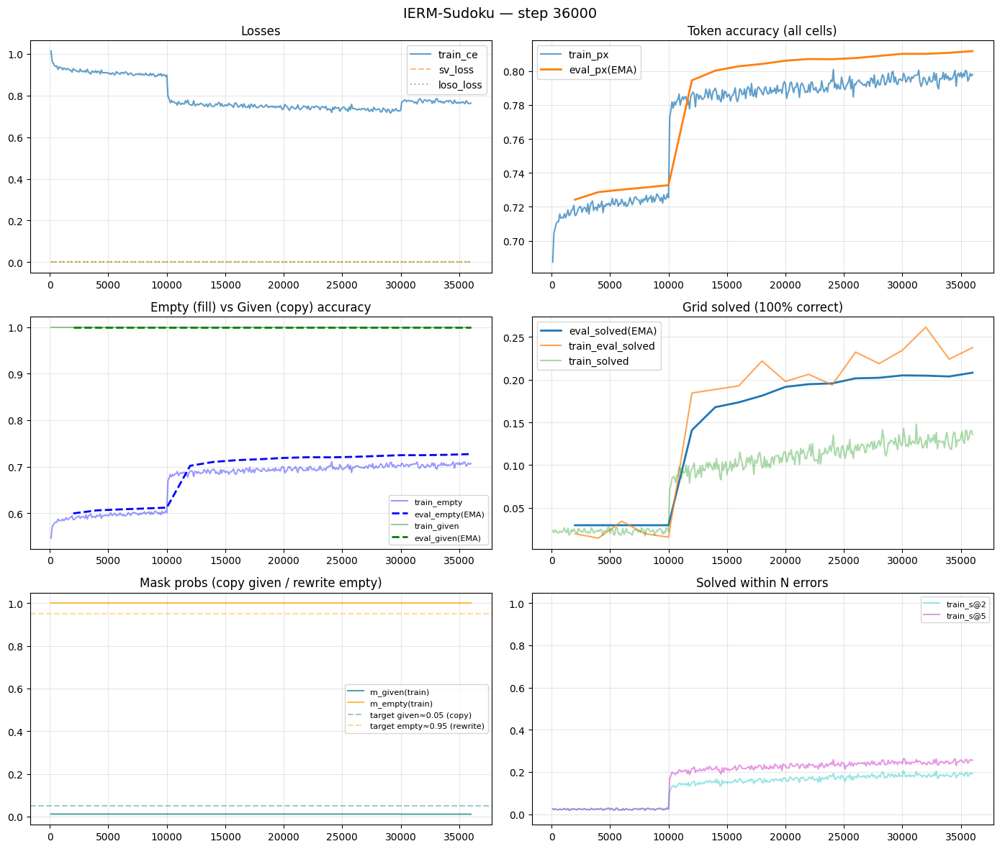

  ★ New best: solved=0.2081  empty=0.7271  px=0.8118
  step   36100/60000 | loss=1.1226 ce=0.7748 px=0.793 empty=0.700 given=1.000 sol=0.1291 m_g=0.011 m_e=1.000 | lr=3.81e-05 | 2.5it/s ETA=157min
  step   36200/60000 | loss=1.1100 ce=0.7658 px=0.797 empty=0.705 given=1.000 sol=0.1353 m_g=0.011 m_e=1.000 | lr=3.78e-05 | 2.5it/s ETA=156min
  step   36300/60000 | loss=1.0959 ce=0.7565 px=0.801 empty=0.711 given=1.000 sol=0.1416 m_g=0.011 m_e=1.000 | lr=3.76e-05 | 2.5it/s ETA=156min
  step   36400/60000 | loss=1.0916 ce=0.7540 px=0.801 empty=0.711 given=1.000 sol=0.1431 m_g=0.011 m_e=1.000 | lr=3.73e-05 | 2.5it/s ETA=155min
  step   36500/60000 | loss=1.1167 ce=0.7711 px=0.797 empty=0.705 given=1.000 sol=0.1325 m_g=0.011 m_e=1.000 | lr=3.71e-05 | 2.5it/s ETA=154min
  step   36600/60000 | loss=1.1135 ce=0.7687 px=0.797 empty=0.705 given=1.000 sol=0.1375 m_g=0.011 m_e=1.000 | lr=3.69e-05 | 2.5it/s ETA=154min
  step   36700/60000 | loss=1.1189 ce=0.7721 px=0.797 empty=0.704 given=1.000 sol=0

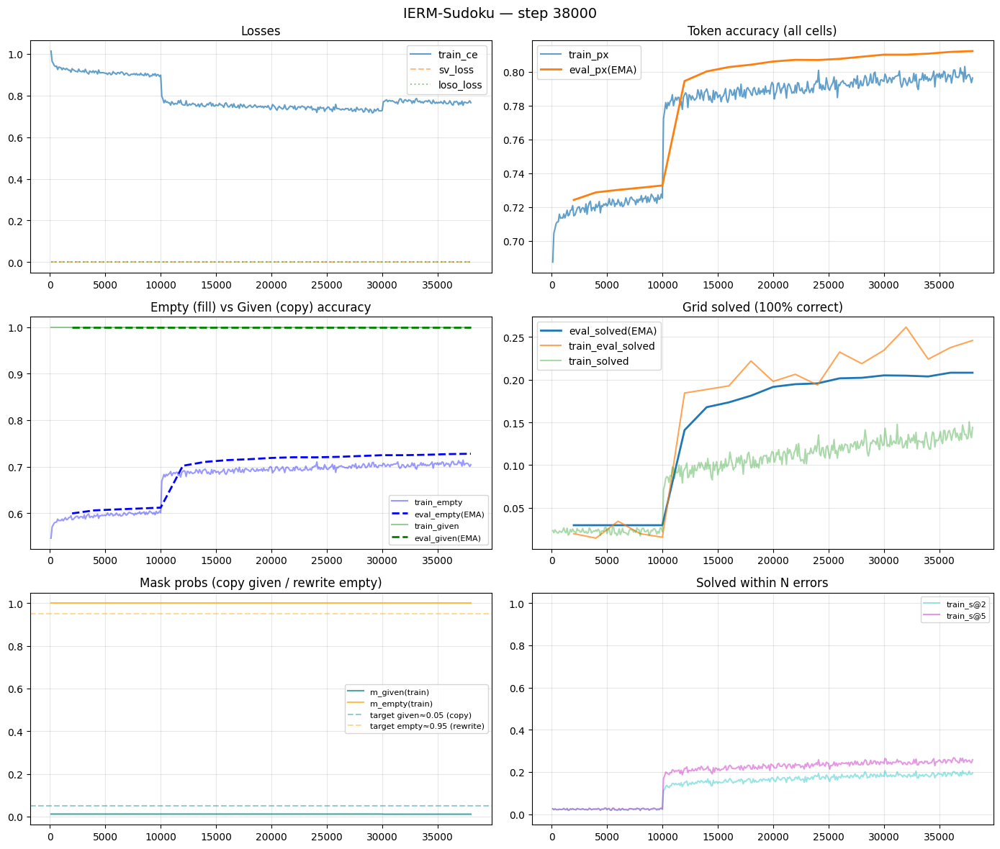

  ★ New best: solved=0.2081  empty=0.7278  px=0.8123
  step   38100/60000 | loss=1.1125 ce=0.7679 px=0.797 empty=0.705 given=1.000 sol=0.1425 m_g=0.011 m_e=1.000 | lr=3.34e-05 | 2.5it/s ETA=145min
  step   38200/60000 | loss=1.1007 ce=0.7602 px=0.800 empty=0.709 given=1.000 sol=0.1353 m_g=0.011 m_e=1.000 | lr=3.32e-05 | 2.5it/s ETA=144min
  step   38300/60000 | loss=1.1117 ce=0.7671 px=0.797 empty=0.705 given=1.000 sol=0.1409 m_g=0.011 m_e=1.000 | lr=3.30e-05 | 2.5it/s ETA=143min
  step   38400/60000 | loss=1.1063 ce=0.7640 px=0.798 empty=0.707 given=1.000 sol=0.1441 m_g=0.011 m_e=1.000 | lr=3.27e-05 | 2.5it/s ETA=143min
  step   38500/60000 | loss=1.1049 ce=0.7629 px=0.799 empty=0.708 given=1.000 sol=0.1350 m_g=0.011 m_e=1.000 | lr=3.25e-05 | 2.5it/s ETA=142min
  step   38600/60000 | loss=1.0970 ce=0.7578 px=0.801 empty=0.710 given=1.000 sol=0.1384 m_g=0.011 m_e=1.000 | lr=3.23e-05 | 2.5it/s ETA=141min
  step   38700/60000 | loss=1.0968 ce=0.7574 px=0.800 empty=0.710 given=1.000 sol=0

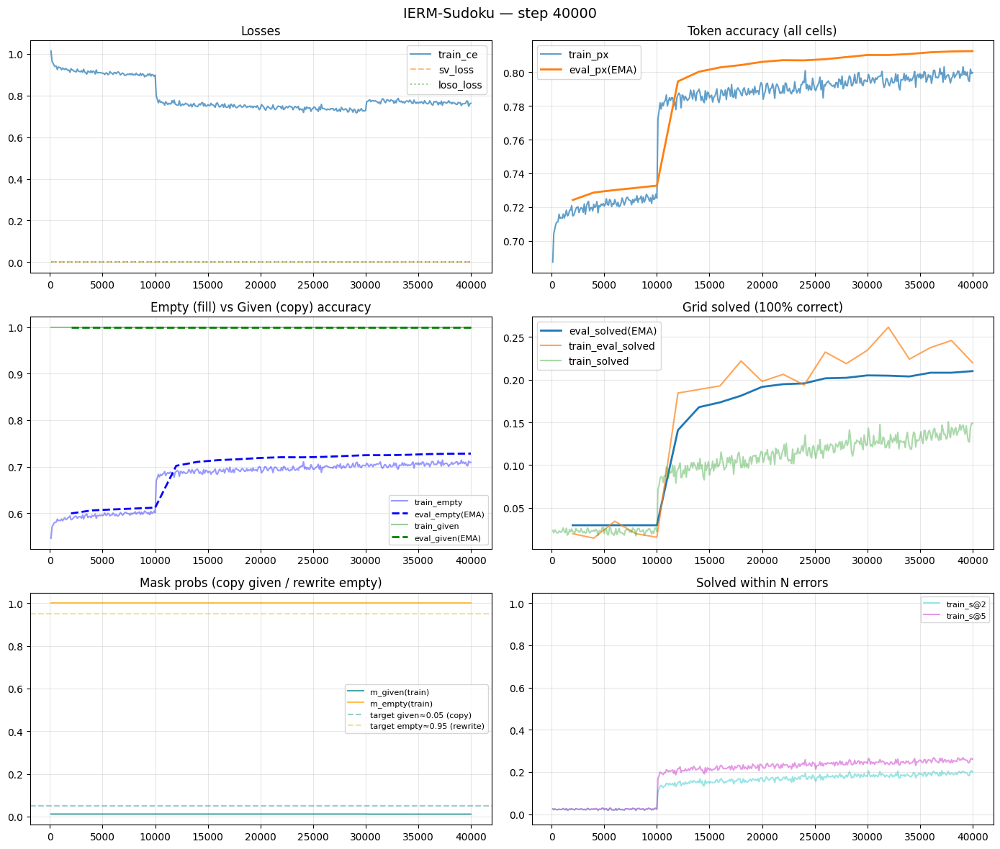

  ★ New best: solved=0.2100  empty=0.7281  px=0.8125


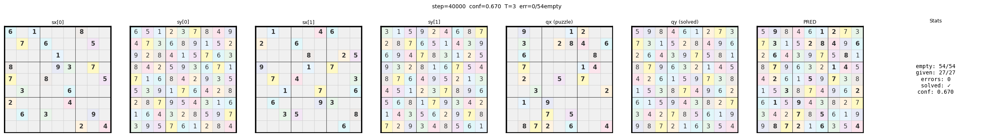

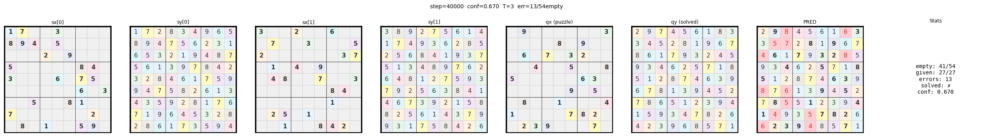

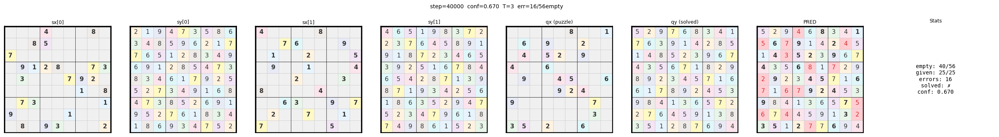

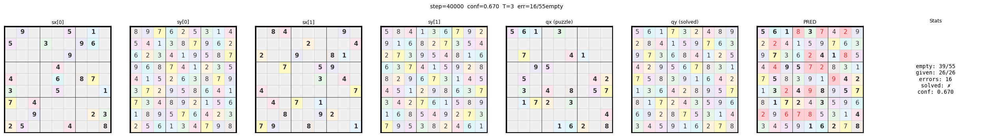

  step   40100/60000 | loss=1.1005 ce=0.7601 px=0.799 empty=0.708 given=1.000 sol=0.1400 m_g=0.011 m_e=1.000 | lr=2.90e-05 | 2.5it/s ETA=132min
  step   40200/60000 | loss=1.0940 ce=0.7556 px=0.803 empty=0.713 given=1.000 sol=0.1431 m_g=0.011 m_e=1.000 | lr=2.88e-05 | 2.5it/s ETA=131min
  step   40300/60000 | loss=1.1015 ce=0.7603 px=0.800 empty=0.710 given=1.000 sol=0.1437 m_g=0.011 m_e=1.000 | lr=2.85e-05 | 2.5it/s ETA=131min
  step   40400/60000 | loss=1.1028 ce=0.7616 px=0.800 empty=0.709 given=1.000 sol=0.1447 m_g=0.011 m_e=1.000 | lr=2.83e-05 | 2.5it/s ETA=130min
  step   40500/60000 | loss=1.0977 ce=0.7580 px=0.800 empty=0.710 given=1.000 sol=0.1506 m_g=0.011 m_e=1.000 | lr=2.81e-05 | 2.5it/s ETA=130min
  step   40600/60000 | loss=1.0978 ce=0.7582 px=0.801 empty=0.711 given=1.000 sol=0.1353 m_g=0.011 m_e=1.000 | lr=2.79e-05 | 2.5it/s ETA=129min
  step   40700/60000 | loss=1.0684 ce=0.7388 px=0.807 empty=0.720 given=1.000 sol=0.1531 m_g=0.011 m_e=1.000 | lr=2.77e-05 | 2.5it/s ETA

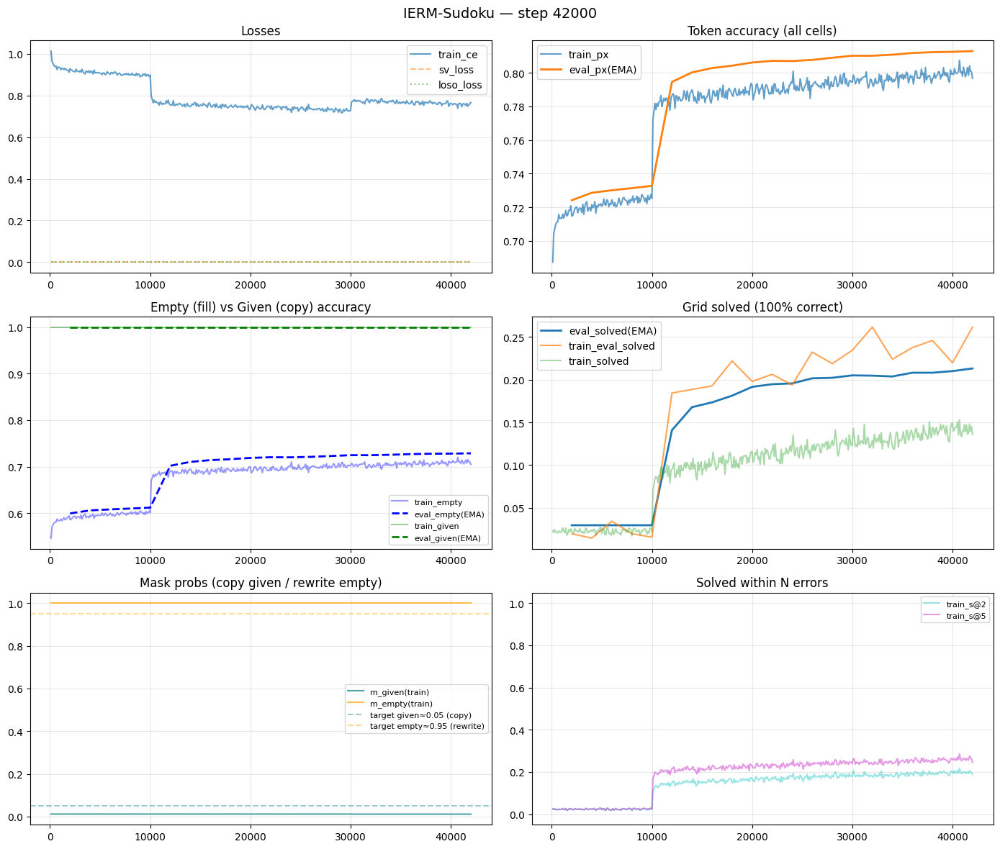

  ★ New best: solved=0.2131  empty=0.7287  px=0.8129
  step   42100/60000 | loss=1.0926 ce=0.7550 px=0.800 empty=0.710 given=1.000 sol=0.1316 m_g=0.011 m_e=1.000 | lr=2.48e-05 | 2.5it/s ETA=119min
  step   42200/60000 | loss=1.1057 ce=0.7633 px=0.798 empty=0.706 given=1.000 sol=0.1509 m_g=0.011 m_e=1.000 | lr=2.46e-05 | 2.5it/s ETA=118min
  step   42300/60000 | loss=1.0909 ce=0.7539 px=0.801 empty=0.712 given=1.000 sol=0.1338 m_g=0.011 m_e=1.000 | lr=2.44e-05 | 2.5it/s ETA=117min
  step   42400/60000 | loss=1.0949 ce=0.7561 px=0.802 empty=0.713 given=1.000 sol=0.1416 m_g=0.011 m_e=1.000 | lr=2.42e-05 | 2.5it/s ETA=117min
  step   42500/60000 | loss=1.1020 ce=0.7610 px=0.797 empty=0.706 given=1.000 sol=0.1388 m_g=0.011 m_e=1.000 | lr=2.40e-05 | 2.5it/s ETA=116min
  step   42600/60000 | loss=1.0890 ce=0.7523 px=0.803 empty=0.714 given=1.000 sol=0.1472 m_g=0.011 m_e=1.000 | lr=2.38e-05 | 2.5it/s ETA=115min
  step   42700/60000 | loss=1.1003 ce=0.7599 px=0.799 empty=0.708 given=1.000 sol=0

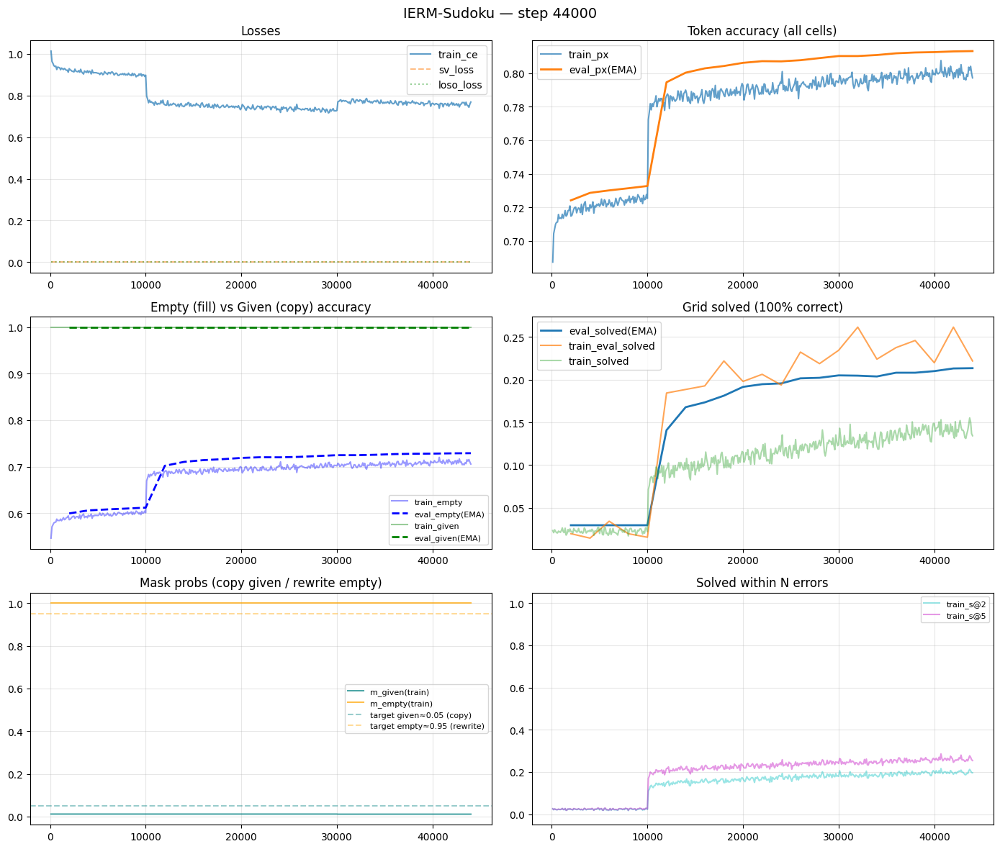

  ★ New best: solved=0.2134  empty=0.7290  px=0.8131
  step   44100/60000 | loss=1.0997 ce=0.7598 px=0.799 empty=0.708 given=1.000 sol=0.1456 m_g=0.011 m_e=1.000 | lr=2.09e-05 | 2.5it/s ETA=105min
  step   44200/60000 | loss=1.0937 ce=0.7558 px=0.801 empty=0.711 given=1.000 sol=0.1419 m_g=0.011 m_e=1.000 | lr=2.07e-05 | 2.5it/s ETA=105min
  step   44300/60000 | loss=1.0927 ce=0.7548 px=0.802 empty=0.712 given=1.000 sol=0.1528 m_g=0.011 m_e=1.000 | lr=2.05e-05 | 2.5it/s ETA=104min
  step   44400/60000 | loss=1.0825 ce=0.7480 px=0.804 empty=0.715 given=1.000 sol=0.1541 m_g=0.011 m_e=1.000 | lr=2.03e-05 | 2.5it/s ETA=103min
  step   44500/60000 | loss=1.0987 ce=0.7586 px=0.800 empty=0.710 given=1.000 sol=0.1528 m_g=0.011 m_e=1.000 | lr=2.02e-05 | 2.5it/s ETA=103min
  step   44600/60000 | loss=1.0994 ce=0.7594 px=0.800 empty=0.710 given=1.000 sol=0.1441 m_g=0.011 m_e=1.000 | lr=2.00e-05 | 2.5it/s ETA=102min
  step   44700/60000 | loss=1.0882 ce=0.7521 px=0.802 empty=0.712 given=1.000 sol=0

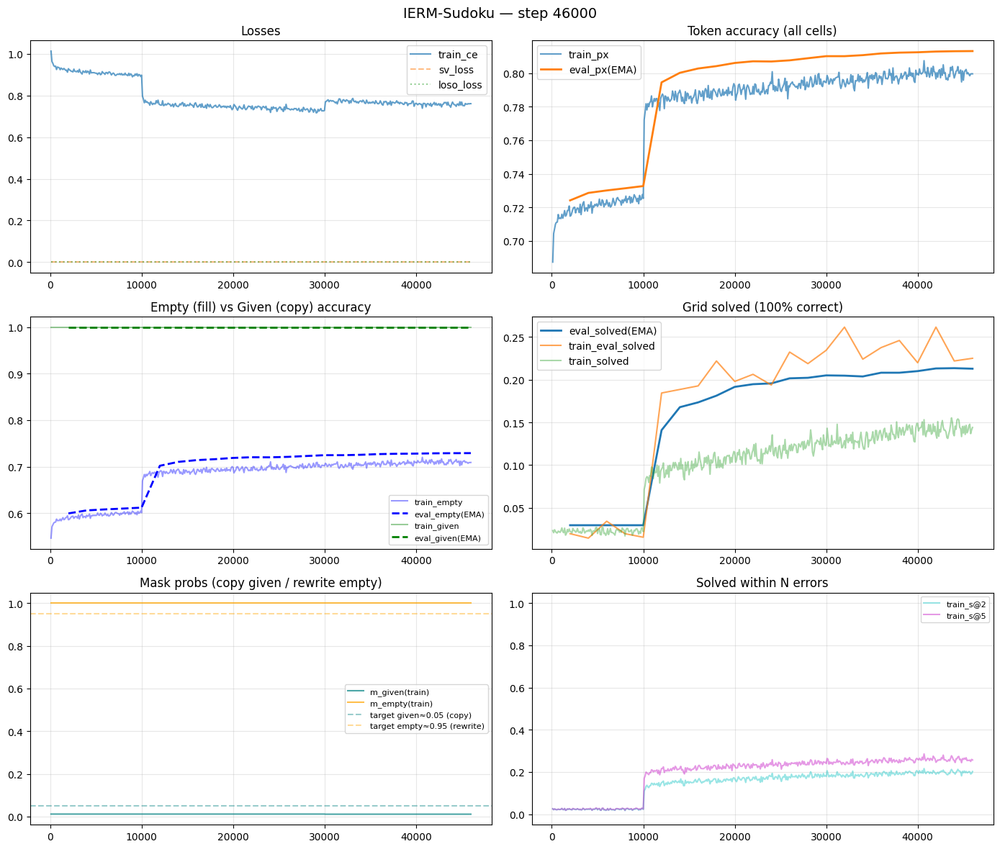

  step   46100/60000 | loss=1.1031 ce=0.7618 px=0.798 empty=0.706 given=1.000 sol=0.1441 m_g=0.011 m_e=1.000 | lr=1.74e-05 | 2.5it/s ETA=92min
  step   46200/60000 | loss=1.1022 ce=0.7613 px=0.798 empty=0.707 given=1.000 sol=0.1403 m_g=0.011 m_e=1.000 | lr=1.72e-05 | 2.5it/s ETA=91min
  step   46300/60000 | loss=1.1000 ce=0.7598 px=0.798 empty=0.708 given=1.000 sol=0.1400 m_g=0.011 m_e=1.000 | lr=1.70e-05 | 2.5it/s ETA=91min
  step   46400/60000 | loss=1.0886 ce=0.7521 px=0.801 empty=0.711 given=1.000 sol=0.1584 m_g=0.011 m_e=1.000 | lr=1.69e-05 | 2.5it/s ETA=90min
  step   46500/60000 | loss=1.0646 ce=0.7362 px=0.809 empty=0.722 given=1.000 sol=0.1603 m_g=0.011 m_e=1.000 | lr=1.67e-05 | 2.5it/s ETA=90min
  step   46600/60000 | loss=1.0863 ce=0.7506 px=0.802 empty=0.712 given=1.000 sol=0.1400 m_g=0.011 m_e=1.000 | lr=1.65e-05 | 2.5it/s ETA=89min
  step   46700/60000 | loss=1.0928 ce=0.7553 px=0.800 empty=0.710 given=1.000 sol=0.1422 m_g=0.011 m_e=1.000 | lr=1.64e-05 | 2.5it/s ETA=88min

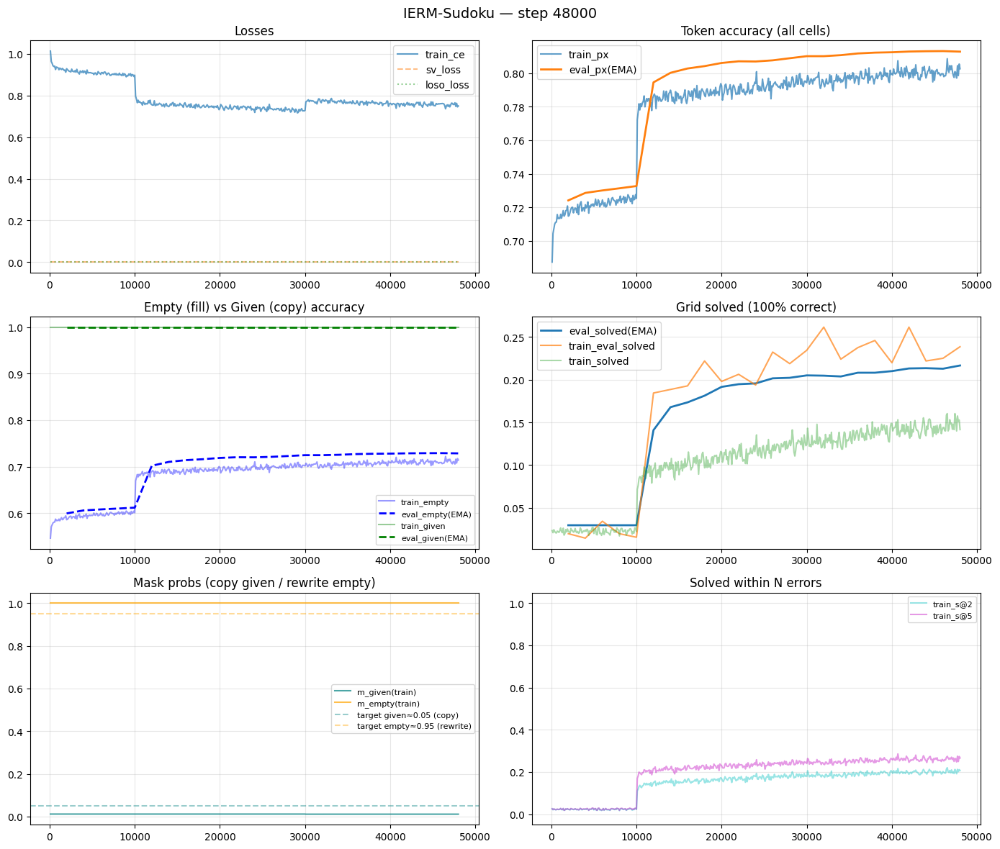

  ★ New best: solved=0.2166  empty=0.7287  px=0.8128
  step   48100/60000 | loss=1.1015 ce=0.7610 px=0.800 empty=0.709 given=1.000 sol=0.1406 m_g=0.011 m_e=1.000 | lr=1.42e-05 | 2.5it/s ETA=79min
  step   48200/60000 | loss=1.0821 ce=0.7479 px=0.804 empty=0.716 given=1.000 sol=0.1481 m_g=0.011 m_e=1.000 | lr=1.41e-05 | 2.5it/s ETA=78min
  step   48300/60000 | loss=1.0850 ce=0.7496 px=0.804 empty=0.715 given=1.000 sol=0.1525 m_g=0.011 m_e=1.000 | lr=1.39e-05 | 2.5it/s ETA=78min
  step   48400/60000 | loss=1.1001 ce=0.7599 px=0.798 empty=0.707 given=1.000 sol=0.1419 m_g=0.011 m_e=1.000 | lr=1.38e-05 | 2.5it/s ETA=77min
  step   48500/60000 | loss=1.0907 ce=0.7534 px=0.801 empty=0.712 given=1.000 sol=0.1544 m_g=0.011 m_e=1.000 | lr=1.36e-05 | 2.5it/s ETA=76min
  step   48600/60000 | loss=1.0778 ce=0.7449 px=0.804 empty=0.715 given=1.000 sol=0.1503 m_g=0.011 m_e=1.000 | lr=1.35e-05 | 2.5it/s ETA=76min
  step   48700/60000 | loss=1.0823 ce=0.7477 px=0.804 empty=0.716 given=1.000 sol=0.1425 

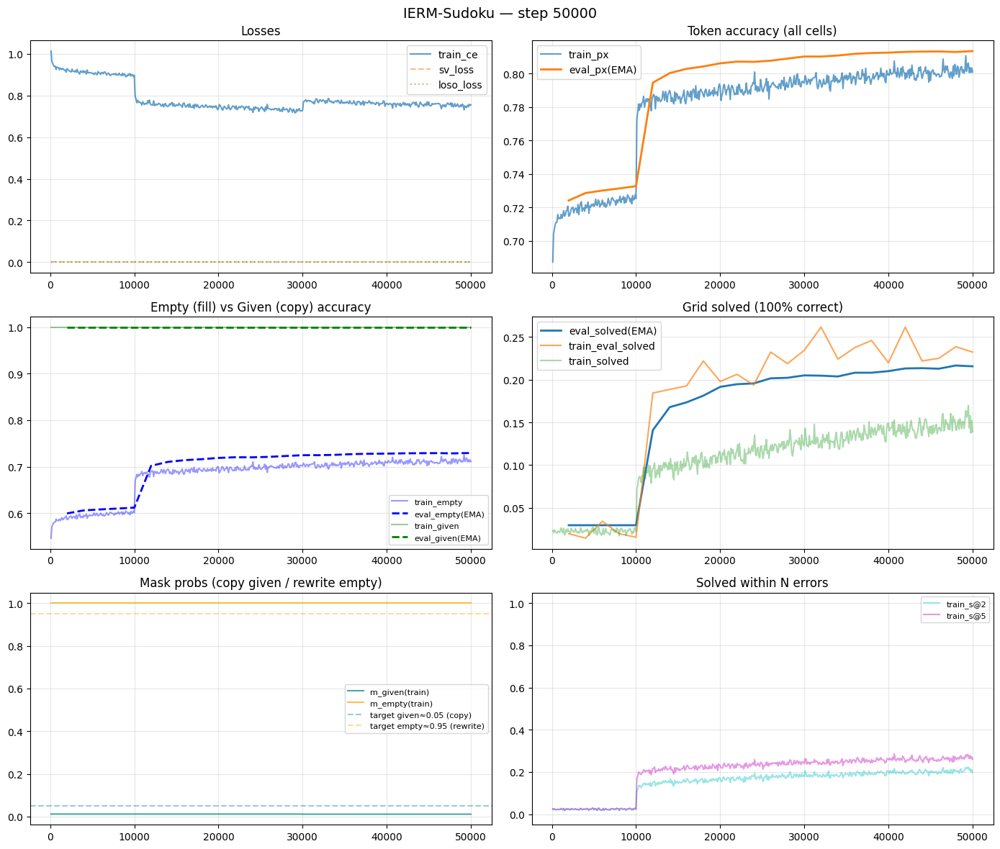

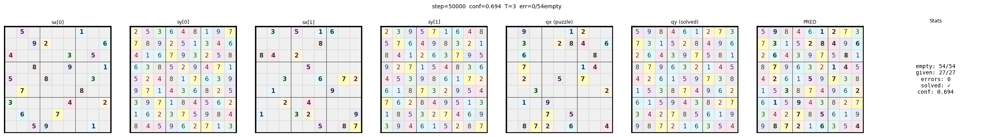

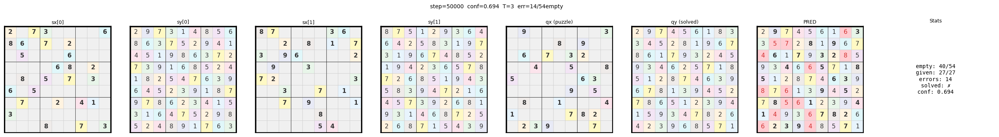

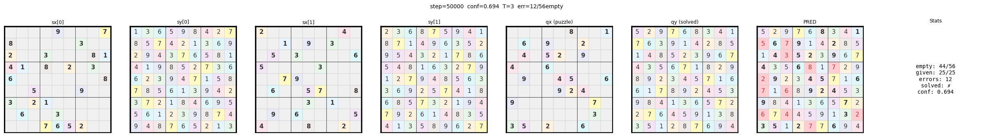

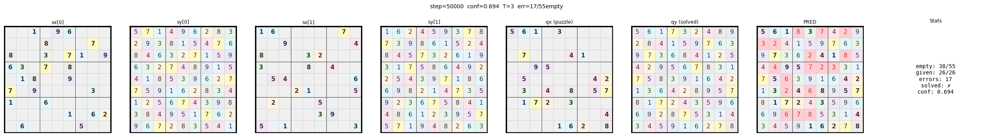

  step   50100/60000 | loss=1.0774 ce=0.7448 px=0.804 empty=0.715 given=1.000 sol=0.1656 m_g=0.011 m_e=1.000 | lr=1.15e-05 | 2.5it/s ETA=66min
  step   50200/60000 | loss=1.0733 ce=0.7422 px=0.805 empty=0.716 given=1.000 sol=0.1528 m_g=0.011 m_e=1.000 | lr=1.14e-05 | 2.5it/s ETA=65min
  step   50300/60000 | loss=1.0830 ce=0.7486 px=0.802 empty=0.713 given=1.000 sol=0.1487 m_g=0.011 m_e=1.000 | lr=1.12e-05 | 2.5it/s ETA=65min
  step   50400/60000 | loss=1.0911 ce=0.7539 px=0.801 empty=0.711 given=1.000 sol=0.1462 m_g=0.011 m_e=1.000 | lr=1.11e-05 | 2.5it/s ETA=64min
  step   50500/60000 | loss=1.0872 ce=0.7512 px=0.802 empty=0.712 given=1.000 sol=0.1478 m_g=0.011 m_e=1.000 | lr=1.10e-05 | 2.5it/s ETA=63min
  step   50600/60000 | loss=1.0842 ce=0.7495 px=0.803 empty=0.714 given=1.000 sol=0.1481 m_g=0.011 m_e=1.000 | lr=1.09e-05 | 2.5it/s ETA=63min
  step   50700/60000 | loss=1.0837 ce=0.7489 px=0.803 empty=0.714 given=1.000 sol=0.1434 m_g=0.011 m_e=1.000 | lr=1.08e-05 | 2.5it/s ETA=62min

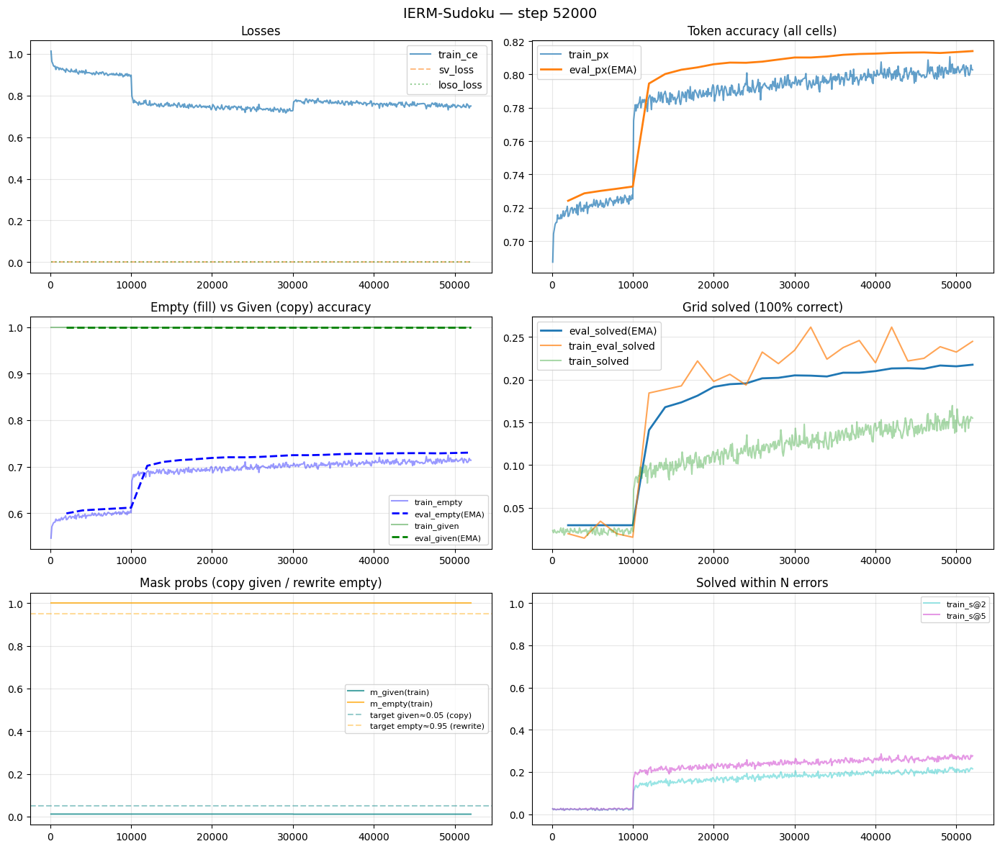

  ★ New best: solved=0.2175  empty=0.7303  px=0.8140
  step   52100/60000 | loss=1.0995 ce=0.7596 px=0.799 empty=0.709 given=1.000 sol=0.1444 m_g=0.011 m_e=1.000 | lr=9.21e-06 | 2.5it/s ETA=53min
  step   52200/60000 | loss=1.0854 ce=0.7501 px=0.803 empty=0.715 given=1.000 sol=0.1453 m_g=0.011 m_e=1.000 | lr=9.11e-06 | 2.5it/s ETA=52min
  step   52300/60000 | loss=1.0843 ce=0.7493 px=0.802 empty=0.713 given=1.000 sol=0.1469 m_g=0.011 m_e=1.000 | lr=9.01e-06 | 2.5it/s ETA=52min
  step   52400/60000 | loss=1.1055 ce=0.7631 px=0.799 empty=0.708 given=1.000 sol=0.1469 m_g=0.011 m_e=1.000 | lr=8.91e-06 | 2.5it/s ETA=51min
  step   52500/60000 | loss=1.0784 ce=0.7454 px=0.804 empty=0.716 given=1.000 sol=0.1547 m_g=0.011 m_e=1.000 | lr=8.81e-06 | 2.5it/s ETA=50min
  step   52600/60000 | loss=1.0699 ce=0.7392 px=0.807 empty=0.719 given=1.000 sol=0.1631 m_g=0.011 m_e=1.000 | lr=8.71e-06 | 2.5it/s ETA=50min
  step   52700/60000 | loss=1.0924 ce=0.7549 px=0.801 empty=0.710 given=1.000 sol=0.1588 

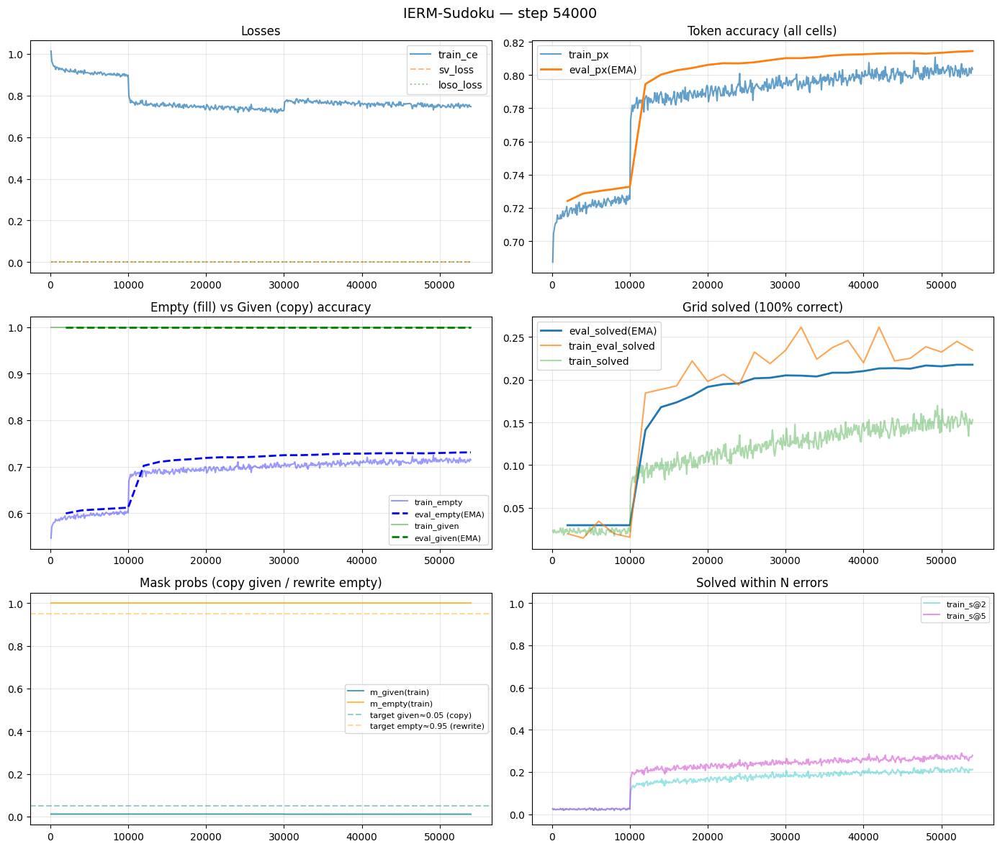

  ★ New best: solved=0.2175  empty=0.7309  px=0.8144
  step   54100/60000 | loss=1.0772 ce=0.7452 px=0.803 empty=0.714 given=1.000 sol=0.1437 m_g=0.011 m_e=1.000 | lr=7.40e-06 | 2.5it/s ETA=40min
  step   54200/60000 | loss=1.0805 ce=0.7472 px=0.805 empty=0.717 given=1.000 sol=0.1575 m_g=0.011 m_e=1.000 | lr=7.32e-06 | 2.5it/s ETA=39min
  step   54300/60000 | loss=1.0933 ce=0.7551 px=0.801 empty=0.712 given=1.000 sol=0.1503 m_g=0.011 m_e=1.000 | lr=7.25e-06 | 2.5it/s ETA=38min
  step   54400/60000 | loss=1.0937 ce=0.7558 px=0.801 empty=0.711 given=1.000 sol=0.1519 m_g=0.011 m_e=1.000 | lr=7.17e-06 | 2.5it/s ETA=38min
  step   54500/60000 | loss=1.1019 ce=0.7609 px=0.799 empty=0.708 given=1.000 sol=0.1553 m_g=0.011 m_e=1.000 | lr=7.10e-06 | 2.5it/s ETA=37min
  step   54600/60000 | loss=1.0935 ce=0.7553 px=0.800 empty=0.710 given=1.000 sol=0.1444 m_g=0.011 m_e=1.000 | lr=7.03e-06 | 2.5it/s ETA=36min
  step   54700/60000 | loss=1.0805 ce=0.7465 px=0.804 empty=0.715 given=1.000 sol=0.1572 

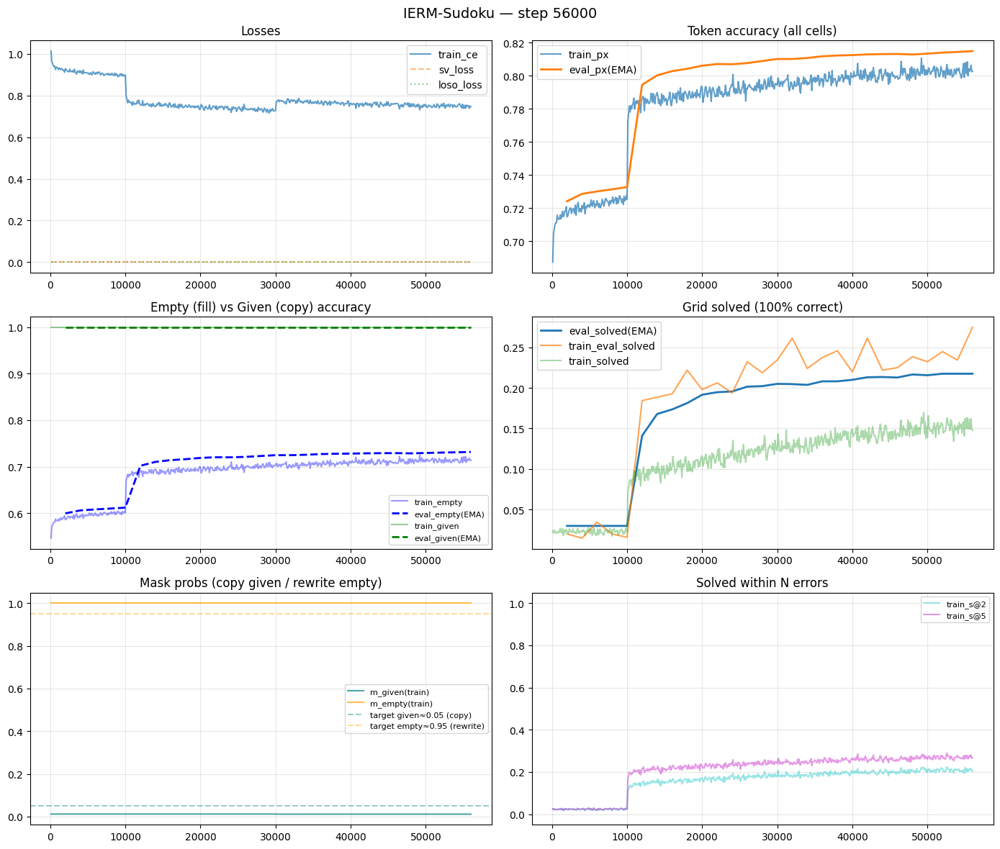

  ★ New best: solved=0.2175  empty=0.7317  px=0.8149
  step   56100/60000 | loss=1.0909 ce=0.7538 px=0.801 empty=0.711 given=1.000 sol=0.1428 m_g=0.011 m_e=1.000 | lr=6.09e-06 | 2.5it/s ETA=26min
  step   56200/60000 | loss=1.0887 ce=0.7519 px=0.802 empty=0.712 given=1.000 sol=0.1575 m_g=0.011 m_e=1.000 | lr=6.04e-06 | 2.5it/s ETA=26min
  step   56300/60000 | loss=1.0895 ce=0.7530 px=0.801 empty=0.712 given=1.000 sol=0.1491 m_g=0.011 m_e=1.000 | lr=5.99e-06 | 2.5it/s ETA=25min
  step   56400/60000 | loss=1.0640 ce=0.7358 px=0.808 empty=0.721 given=1.000 sol=0.1641 m_g=0.011 m_e=1.000 | lr=5.94e-06 | 2.5it/s ETA=24min
  step   56500/60000 | loss=1.0800 ce=0.7465 px=0.804 empty=0.716 given=1.000 sol=0.1663 m_g=0.011 m_e=1.000 | lr=5.89e-06 | 2.5it/s ETA=24min
  step   56600/60000 | loss=1.0907 ce=0.7536 px=0.803 empty=0.714 given=1.000 sol=0.1475 m_g=0.011 m_e=1.000 | lr=5.84e-06 | 2.5it/s ETA=23min
  step   56700/60000 | loss=1.0821 ce=0.7479 px=0.803 empty=0.714 given=1.000 sol=0.1469 

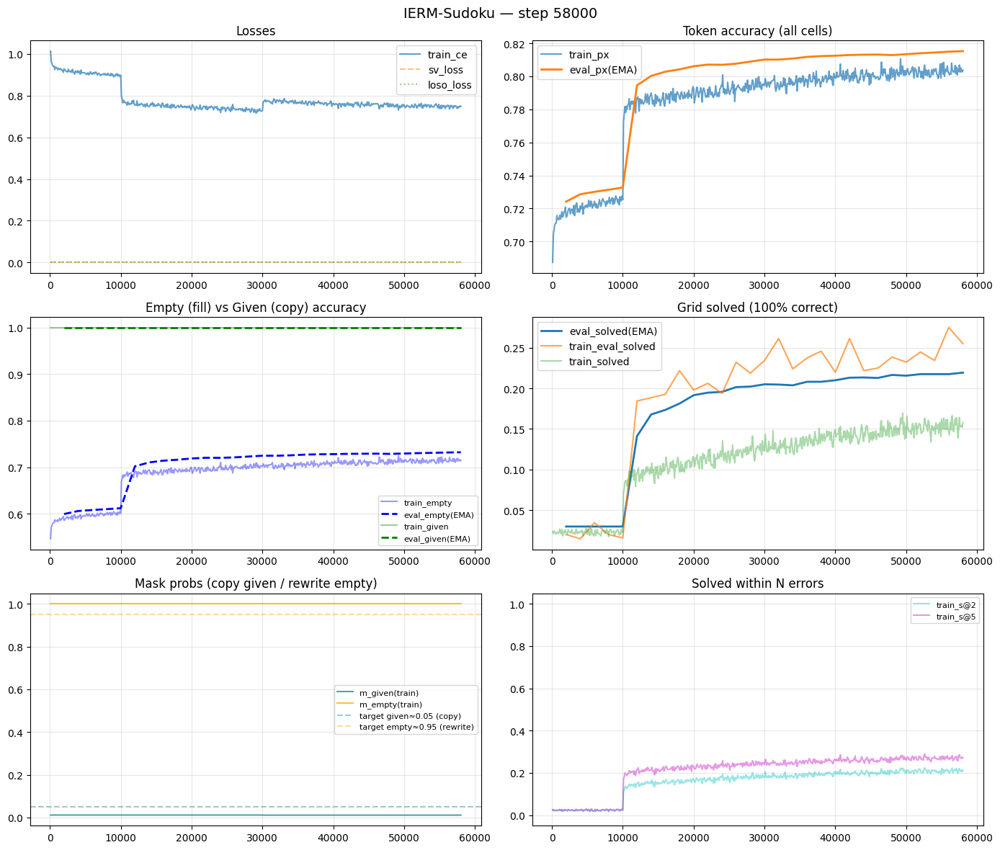

  ★ New best: solved=0.2194  empty=0.7321  px=0.8152
  step   58100/60000 | loss=1.0852 ce=0.7497 px=0.804 empty=0.715 given=1.000 sol=0.1556 m_g=0.011 m_e=1.000 | lr=5.29e-06 | 2.5it/s ETA=13min
  step   58200/60000 | loss=1.0663 ce=0.7376 px=0.806 empty=0.718 given=1.000 sol=0.1603 m_g=0.011 m_e=1.000 | lr=5.26e-06 | 2.5it/s ETA=12min
  step   58300/60000 | loss=1.0743 ce=0.7425 px=0.805 empty=0.717 given=1.000 sol=0.1600 m_g=0.011 m_e=1.000 | lr=5.23e-06 | 2.5it/s ETA=11min
  step   58400/60000 | loss=1.0770 ce=0.7445 px=0.806 empty=0.718 given=1.000 sol=0.1547 m_g=0.011 m_e=1.000 | lr=5.21e-06 | 2.5it/s ETA=11min
  step   58500/60000 | loss=1.0885 ce=0.7523 px=0.803 empty=0.715 given=1.000 sol=0.1541 m_g=0.011 m_e=1.000 | lr=5.19e-06 | 2.5it/s ETA=10min
  step   58600/60000 | loss=1.0962 ce=0.7572 px=0.802 empty=0.712 given=1.000 sol=0.1487 m_g=0.011 m_e=1.000 | lr=5.17e-06 | 2.5it/s ETA=9min
  step   58700/60000 | loss=1.0901 ce=0.7532 px=0.801 empty=0.711 given=1.000 sol=0.1537 m

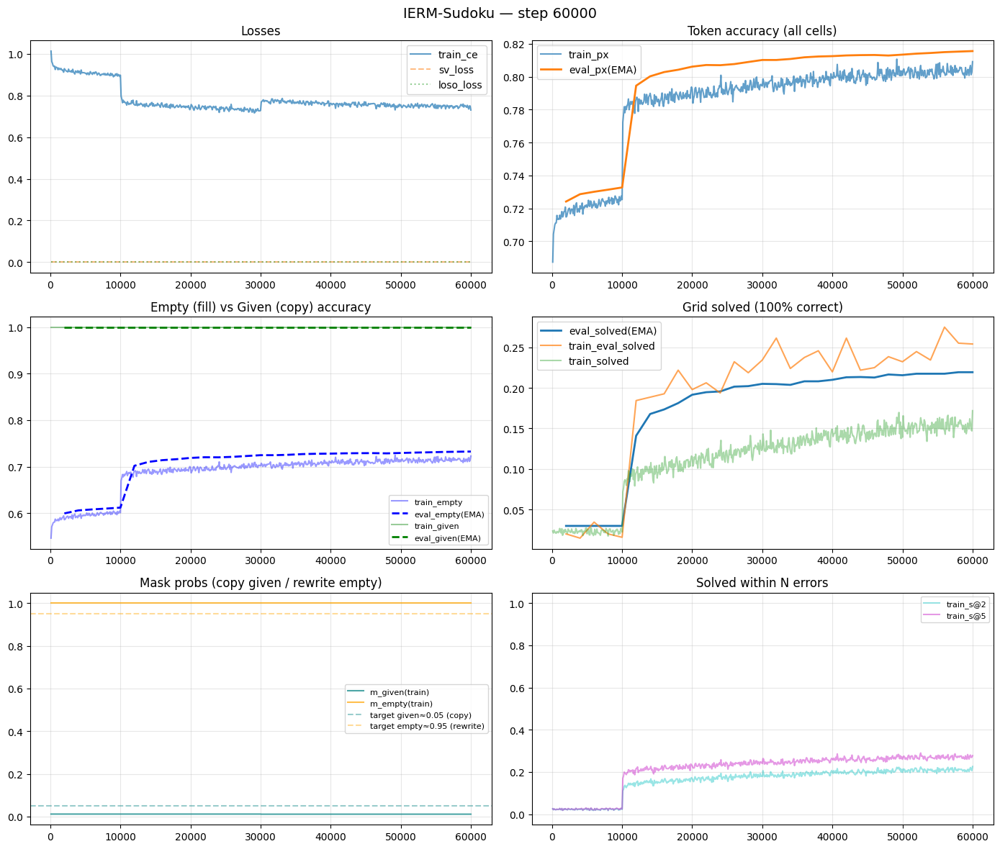

  ★ New best: solved=0.2194  empty=0.7326  px=0.8155


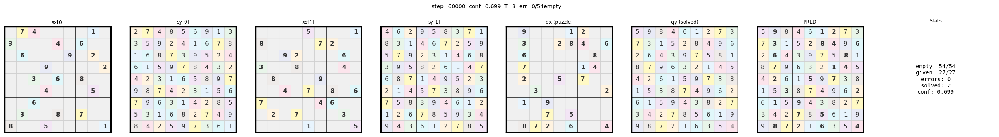

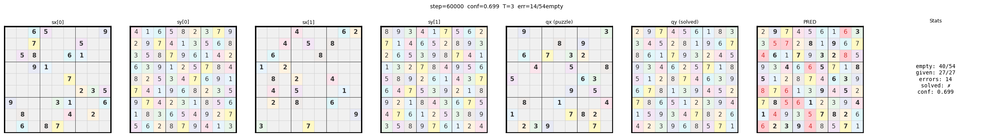

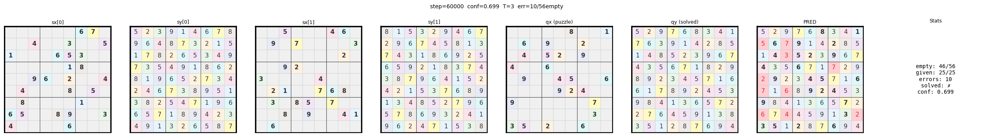

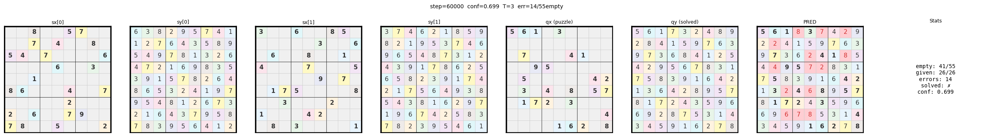


Done in 404.9 min  (60,000 steps)
Best solved=0.2194  empty=0.7326  px=0.8155


In [14]:
model_sudoku, tracker_sudoku = run_training_sudoku(
    train_loader=train_loader,
    eval_loader=eval_loader,
    DEVICE=DEVICE,
    EMA_class=EMA,
    build_scheduler_fn=build_warmup_cosine_restart_scheduler,
    plot_fn=plot_training_curves_sudoku,
    viz_fn=visualize_predictions_sudoku,
    loso_lambda=0.0,
    support_verify_lambda=0.0,
    max_steps=60_000,
    lr=1e-4,                       # 3e-4 → 1e-4 (fine-tuning)
    warmup_steps=200,
    cosine_period_steps=60_000,    # 1 seul cycle = pas de restart brutal
    resume_from="checkpoints_sudoku/best_ema.pt",
)

In [11]:
# 4. Eval complète
model_v2.eval()
for T_eval in [3,4, 8]:
    print(f"\n  ═══ Eval T={T_eval} ═══")
    avg = evaluate_sudoku_v2(
        model_v2, eval_loader, DEVICE, cfg=CFG_SUDOKU_V2_SAFE,
        max_batches=100, pred_T=T_eval, print_diag=True,
        use_tta=False)


  ═══ Eval T=3 ═══
  ┌─ EVAL SUDOKU (3200 samples, no-TTA ) ──
  │ px=0.8566  solved=0.4925
  │ empty_acc=0.7921  given_acc=1.0000
  │ solved@2=0.5122  solved@5=0.5344  conf=0.505
  │ avg_empty=55.8  violations=9.3
  └───────────────────────────────────────────────

  ═══ Eval T=4 ═══
  ┌─ EVAL SUDOKU (3200 samples, no-TTA ) ──
  │ px=0.8618  solved=0.5184
  │ empty_acc=0.7997  given_acc=1.0000
  │ solved@2=0.5381  solved@5=0.5619  conf=0.657
  │ avg_empty=55.8  violations=8.4
  └───────────────────────────────────────────────

  ═══ Eval T=8 ═══
  ┌─ EVAL SUDOKU (3200 samples, no-TTA ) ──
  │ px=0.3942  solved=0.0000
  │ empty_acc=0.1199  given_acc=1.0000
  │ solved@2=0.0000  solved@5=0.0000  conf=0.914
  │ avg_empty=55.8  violations=146.5
  └───────────────────────────────────────────────


In [13]:
# 4. Eval complète
model_v2.eval()
for T_eval in [1,2,3, 4, 5]:
    print(f"\n  ═══ Eval T={T_eval} ═══")
    avg = evaluate_sudoku_v2(
        model_v2, eval_loader, DEVICE, cfg=CFG_SUDOKU_V2_SAFE,
        max_batches=100, pred_T=T_eval, print_diag=True,
        use_tta=False)


  ═══ Eval T=3 ═══
  ┌─ EVAL SUDOKU (3200 samples, TTA=8 ) ──
  │ px=0.5038  solved=0.0047
  │ empty_acc=0.4627  given_acc=0.5958
  │ solved@2=0.0094  solved@5=0.0175  conf=0.495
  │ avg_empty=55.8  violations=63.3
  └───────────────────────────────────────────────

  ═══ Eval T=4 ═══
  ┌─ EVAL SUDOKU (3200 samples, TTA=8 ) ──
  │ px=0.5075  solved=0.0091
  │ empty_acc=0.4669  given_acc=0.5977
  │ solved@2=0.0103  solved@5=0.0119  conf=0.687
  │ avg_empty=55.8  violations=60.9
  └───────────────────────────────────────────────

  ═══ Eval T=8 ═══
  ┌─ EVAL SUDOKU (3200 samples, TTA=8 ) ──
  │ px=0.2586  solved=0.0000
  │ empty_acc=0.1232  given_acc=0.5578
  │ solved@2=0.0000  solved@5=0.0000  conf=0.951
  │ avg_empty=55.8  violations=154.7
  └───────────────────────────────────────────────


In [23]:
for n_tta in [1,2,3]:
    avg = evaluate_sudoku_v2(
        model_v2, eval_loader, DEVICE, cfg=CFG_SUDOKU_V2_SAFE,
        max_batches=100, pred_T=4, print_diag=False,
        use_tta=(n_tta > 1), n_tta=n_tta)
    print(f"  TTA={n_tta:2d}  solved={avg['grid_solved']:.4f}  "
          f"px={avg['px']:.4f}  viol={avg['violations']:.1f}")

  TTA= 1  solved=0.4847  px=0.8487  viol=10.9
  TTA= 2  solved=0.0044  px=0.5032  viol=60.6
  TTA= 3  solved=0.0028  px=0.4911  viol=61.6


In [20]:
for n_tta in [1,2,3,4]:
    avg = evaluate_sudoku_v2(
        model_v2, eval_loader, DEVICE, cfg=CFG_SUDOKU_V2_SAFE,
        max_batches=100, pred_T=4, print_diag=False,
        use_tta=(n_tta > 1), n_tta=n_tta)
    print(f"  TTA={n_tta:2d}  solved={avg['grid_solved']:.4f}  "
          f"px={avg['px']:.4f}  viol={avg['violations']:.1f}")

  TTA= 1  solved=0.4844  px=0.8487  viol=11.0
  TTA= 2  solved=0.0037  px=0.4755  viol=62.8
  TTA= 3  solved=0.0059  px=0.4913  viol=61.2
  TTA= 4  solved=0.0022  px=0.5128  viol=60.0


In [22]:
model_v2.eval()
for T_eval in [1,2,3,4,5,6]:
    print(f"\n  ═══ Eval T={T_eval} ═══")
    avg = evaluate_sudoku_v2(
        model_v2, eval_loader, DEVICE, cfg=CFG_SUDOKU_V2_SAFE,
        max_batches=100, pred_T=T_eval, print_diag=True,
        use_tta=False)


  ═══ Eval T=1 ═══
  ┌─ EVAL SUDOKU (3200 samples, no-TTA ) ──
  │ px=0.7372  solved=0.0297
  │ empty_acc=0.6186  given_acc=1.0000
  │ solved@2=0.0297  solved@5=0.0331  conf=0.029
  │ avg_empty=55.8  violations=28.0
  └───────────────────────────────────────────────

  ═══ Eval T=2 ═══
  ┌─ EVAL SUDOKU (3200 samples, no-TTA ) ──
  │ px=0.8174  solved=0.1844
  │ empty_acc=0.7353  given_acc=1.0000
  │ solved@2=0.2522  solved@5=0.3247  conf=0.059
  │ avg_empty=55.8  violations=14.8
  └───────────────────────────────────────────────

  ═══ Eval T=3 ═══
  ┌─ EVAL SUDOKU (3200 samples, no-TTA ) ──
  │ px=0.8525  solved=0.4813
  │ empty_acc=0.7862  given_acc=1.0000
  │ solved@2=0.4975  solved@5=0.5216  conf=0.495
  │ avg_empty=55.8  violations=9.3
  └───────────────────────────────────────────────

  ═══ Eval T=4 ═══
  ┌─ EVAL SUDOKU (3200 samples, no-TTA ) ──
  │ px=0.8486  solved=0.4847
  │ empty_acc=0.7805  given_acc=1.0000
  │ solved@2=0.5028  solved@5=0.5250  conf=0.687
  │ avg_empty=55

In [15]:
# ── Re-appliquer le fix TTA ──────────────────────────────────
IERM_TRM.predict = predict_sudoku_v2_fixed
IERM_TRM._predict_logits_internal = _predict_logits_internal_fixed
print("  ✓ TTA fix ré-appliqué")

# ── Test ──────────────────────────────────────────────────────
model_v2.eval()
for T_eval in [3, 4]:
    for n_tta in [1, 8, 16]:
        avg = evaluate_sudoku_v2(
            model_v2, eval_loader, DEVICE, cfg=CFG_SUDOKU_V2_SAFE,
            max_batches=100, pred_T=T_eval, print_diag=False,
            use_tta=(n_tta > 1), n_tta=n_tta)
        tag = f"TTA={n_tta}" if n_tta > 1 else "no-TTA"
        print(f"  T={T_eval} {tag:8s}  solved={avg['grid_solved']:.4f}  "
              f"px={avg['px']:.4f}  viol={avg['violations']:.1f}")

  ✓ TTA fix ré-appliqué
  T=3 no-TTA    solved=0.4925  px=0.8566  viol=9.3
  T=3 TTA=8     solved=0.5312  px=0.8678  viol=8.8
  T=3 TTA=16    solved=0.5334  px=0.8685  viol=8.8
  T=4 no-TTA    solved=0.5181  px=0.8619  viol=8.4
  T=4 TTA=8     solved=0.5722  px=0.8752  viol=7.6
  T=4 TTA=16    solved=0.5703  px=0.8749  viol=7.5


# Deep supervision

In [41]:
# ════════════════════════════════════════════════════════════════
# CELL — Deep Supervision pour IERM-Sudoku
#
# Principe : au lieu de superviser SEULEMENT la sortie finale (step T),
# on supervise à CHAQUE step t ∈ {1..T}.
# C'est ce que fait TRM et c'est probablement leur avantage principal.
#
# Poids : linearly increasing → step t reçoit poids (t/T)
# Le dernier step a poids 1.0, le premier a poids 1/T.
# ════════════════════════════════════════════════════════════════

import os, sys, torch
import torch.nn as nn
import torch.nn.functional as F
from collections import defaultdict

# ══════════════════════════════════════════════════════════════
# 1. Patch deep_recursion pour retourner les logits intermédiaires
# ══════════════════════════════════════════════════════════════

def deep_recursion_supervised(self, x_embed, y, ctx, *,
                               ctx_keep=None, x_keep=None, y_keep=None,
                               grid_hw=None, T=None,
                               z_prev=None, z_keep_prev=None,
                               x_ids=None,
                               detach_state=True,
                               n_grad_steps=2,
                               residual_alpha=0.4):
    """
    Comme deep_recursion mais retourne les logits à CHAQUE step T.
    
    Returns:
        state: (y_det, z_det)
        all_logits: list of T tensors [B, L, V] — logits à chaque step
        q_hat, q_logit, m_logits, v_logits — du dernier step
    """
    T      = int(T or self.T_max)
    device = y.device
    B      = y.shape[0]
    
    if ctx_keep is None and ctx is not None:
        ctx_keep = torch.ones(ctx.shape[:2], device=device, dtype=torch.bool)
    if x_keep is None:
        x_keep = torch.ones(x_embed.shape[:2], device=device, dtype=torch.bool)
    if y_keep is None:
        y_keep = torch.ones(y.shape[:2], device=device, dtype=torch.bool)

    ctx_phi = self.ctx_norm(self.ctx_proj(ctx)) if ctx is not None else None

    if z_prev is None:
        z, z_keep = self.init_z(B, device, y.dtype)
    else:
        z      = z_prev
        z_keep = (z_keep_prev if z_keep_prev is not None
                  else torch.ones(z_prev.shape[:2], device=device, dtype=torch.bool))

    alpha = float(residual_alpha)
    all_logits = []

    # Avec deep supervision, on a besoin du gradient à chaque step
    # → on réduit le no_grad aux T - n_grad_steps premiers
    n_nograd = max(0, T - n_grad_steps)
    
    for t in range(T):
        in_nograd = (t < n_nograd)
        
        if in_nograd:
            with torch.no_grad():
                y_new, z_new = self.latent_recursion(
                    x_embed, y, z, ctx_phi,
                    x_keep=x_keep, y_keep=y_keep, z_keep=z_keep,
                    ctx_keep=ctx_keep, grid_hw=grid_hw)
                y = (1.0 - alpha) * y + alpha * y_new
                z = z_new
            y = y.detach().requires_grad_(True)
            z = z.detach().requires_grad_(True)
        else:
            y_new, z_new = self.latent_recursion(
                x_embed, y, z, ctx_phi,
                x_keep=x_keep, y_keep=y_keep, z_keep=z_keep,
                ctx_keep=ctx_keep, grid_hw=grid_hw)
            y = (1.0 - alpha) * y + alpha * y_new
            z = z_new

        # Compute logits at this step (always, for supervision)
        if in_nograd:
            with torch.no_grad():
                logits_t, _, _, _, _ = self._output_heads(y, y_keep, x_embed, x_ids)
            all_logits.append(logits_t.detach())
        else:
            logits_t, q_hat_t, q_logit_t, m_logits_t, v_logits_t = \
                self._output_heads(y, y_keep, x_embed, x_ids)
            all_logits.append(logits_t)

    # Les valeurs finales (dernier step avec gradient)
    state = (y.detach(), z.detach()) if detach_state else (y, z)
    return state, all_logits, q_hat_t, q_logit_t, m_logits_t, v_logits_t


# ══════════════════════════════════════════════════════════════
# 2. Nouveau _run_decoder avec deep supervision
# ══════════════════════════════════════════════════════════════

def _run_decoder_supervised(self, qx, ctx, ctx_keep, *, T=None,
                             y_prev=None, z_prev=None, z_keep=None,
                             task_id=None):
    B, H, W         = qx.shape
    x_embed, x_keep = self._embed_query(qx, task_id=task_id)
    x_ids           = qx.reshape(B, H * W)
    y               = y_prev if y_prev is not None else x_embed

    (y_det, z_det), all_logits, q_hat, q_logit, m_logits, v_logits = \
        self.phi.deep_recursion_supervised(
            x_embed, y, ctx,
            ctx_keep=ctx_keep, x_keep=x_keep,
            y_keep=x_keep, grid_hw=(H, W), T=T,
            z_prev=z_prev, z_keep_prev=z_keep,
            x_ids=x_ids,
            residual_alpha=getattr(self, '_residual_alpha', 0.4),
            n_grad_steps=getattr(self, '_n_grad_steps', 3))

    return y_det, z_det, all_logits, q_hat, q_logit, m_logits, v_logits, x_embed, x_keep


# ══════════════════════════════════════════════════════════════
# 3. Train step avec deep supervision
# ══════════════════════════════════════════════════════════════

def train_step_sudoku_ds(
    batch, model, optimizer, *,
    scheduler=None, T_per_step=3,
    empty_weight=5.0, given_weight=1.0,
    constraint_lambda=0.10,
    grad_clip=0.5,
    n_grad_steps=3,
    augment=True, aug_prob=0.85,
    use_amp=True, scaler=None, amp_dtype="bf16",
    loso_lambda=0.10,
    support_verify_lambda=0.10,
    sv_max_supports=1,
    label_smoothing=0.02,
    mask_loss_weight=0.30,
    val_loss_weight=0.5,
    mask_temp=3.0,
    global_step=0,
    residual_alpha=0.4,
    hard_mining_factor=1.0,
    # Deep supervision params
    ds_weight=0.5,              # poids total de la deep supervision loss
    ds_schedule="linear",       # "linear" = t/T, "equal" = 1/T
    **_extra,
):
    model.train()
    device = next(model.parameters()).device
    pad_id = int(model.pad_id)
    V      = int(model.vocab_size)
    EMPTY  = 0

    sx = batch["sx"].to(device)
    sy = batch["sy"].to(device)
    qx = batch["qx"].to(device)
    qy = batch["qy"].to(device)
    s_mask = batch.get("s_mask")
    if s_mask is not None:
        s_mask = s_mask.to(device).bool()
    task_id = batch.get("task_id")
    if isinstance(task_id, torch.Tensor):
        task_id = task_id.to(device)

    B, H, W = qx.shape
    L = H * W
    T = int(T_per_step) if T_per_step > 0 else int(model.T_max)

    if augment and aug_prob > 0:
        sx, sy, qx, qy = augment_sudoku_digits_fast(
            sx, sy, qx, qy, aug_prob=float(aug_prob))

    gt_flat = qy.reshape(B, L).long()
    qx_flat = qx.reshape(B, L).long()
    mask_empty = (qx_flat == EMPTY)
    mask_given = ~mask_empty

    token_weight = torch.full((B, L), float(given_weight), device=device)
    token_weight[mask_empty] = float(empty_weight)

    # Hard mining
    hmf = float(hard_mining_factor)

    amp_dt = torch.bfloat16 if amp_dtype == "bf16" else torch.float16
    optimizer.zero_grad(set_to_none=True)
    model._residual_alpha = float(residual_alpha)
    model._n_grad_steps = int(n_grad_steps)

    with torch.amp.autocast("cuda", enabled=use_amp, dtype=amp_dt):
        psi_out, loso_loss = model.encode_supports(
            sx, sy, s_mask=s_mask, task_id=task_id)

        # Support verify
        sv_loss = torch.tensor(0.0, device=device)
        if float(support_verify_lambda) > 0:
            S = sx.shape[1]
            sv_n = min(int(sv_max_supports), S)
            if sv_n < S:
                sv_idx = torch.randperm(S, device=device)[:sv_n]
                sx_sv, sy_sv = sx[:, sv_idx], sy[:, sv_idx]
                sm_sv = s_mask[:, sv_idx] if s_mask is not None else None
            else:
                sx_sv, sy_sv, sm_sv = sx, sy, s_mask
            sv_loss = model._support_verify_loss(
                sx_sv, sy_sv, sm_sv, psi_out, task_id=task_id, T=1)

        # ── Forward avec deep supervision ─────────────────────
        ctx      = psi_out["ctx"]
        ctx_keep = psi_out["ctx_keep"]

        y_det, z_det, all_logits, q_hat, q_logit, m_logits, v_logits, x_embed, x_keep = \
            model._run_decoder_supervised(
                qx, ctx, ctx_keep, T=T, task_id=task_id)

        # ── CE sur le dernier step (loss principale) ──────────
        logits_final = all_logits[-1]

        def _compute_ce(logits, gt, tw):
            if label_smoothing > 0:
                smooth = float(label_smoothing)
                onehot = F.one_hot(gt.clamp(0, V - 1), V).float()
                onehot = onehot * (1.0 - smooth) + smooth / V
                return -(onehot * logits.float()).sum(-1)
            else:
                return F.nll_loss(
                    logits.float().reshape(-1, V),
                    gt.clamp(0, V - 1).reshape(-1),
                    reduction="none").reshape(gt.shape)

        ce_final = _compute_ce(logits_final, gt_flat, token_weight)

        # Hard mining sur le dernier step
        if hmf > 1.0:
            with torch.no_grad():
                pred_ids   = logits_final.argmax(-1)
                conf_max   = logits_final.float().exp().max(-1).values
                is_conf_wr = ((pred_ids != gt_flat) & mask_empty & (conf_max > 0.4))
            tw_final = token_weight.clone()
            tw_final[is_conf_wr] *= hmf
        else:
            tw_final = token_weight

        w_sum    = tw_final.sum().clamp_min(1.0)
        loss_ce  = (ce_final * tw_final).sum() / w_sum

        # ── Deep supervision : CE sur les steps intermédiaires ─
        loss_ds = torch.tensor(0.0, device=device)
        if float(ds_weight) > 0 and T > 1:
            ds_total = torch.tensor(0.0, device=device)
            ds_count = 0
            for t, logits_t in enumerate(all_logits[:-1]):  # exclure le dernier
                if not logits_t.requires_grad:
                    continue  # skip no_grad steps (pas de signal utile)
                # Poids du step : linear = (t+1)/T, equal = 1/T
                if ds_schedule == "linear":
                    w_t = (t + 1) / T
                else:
                    w_t = 1.0 / T
                ce_t = _compute_ce(logits_t, gt_flat, token_weight)
                ds_total = ds_total + w_t * (ce_t * token_weight).sum() / w_sum
                ds_count += 1
            if ds_count > 0:
                loss_ds = ds_total / ds_count

        # ── Constraint loss ───────────────────────────────────
        loss_cst = torch.tensor(0.0, device=device)
        if float(constraint_lambda) > 0:
            loss_cst = sudoku_constraint_loss(logits_final, H=H, W=W)

        # ── Total loss ────────────────────────────────────────
        loss = (loss_ce
                + float(ds_weight) * loss_ds
                + float(loso_lambda) * loso_loss
                + float(support_verify_lambda) * sv_loss
                + float(constraint_lambda) * loss_cst)

        # q_loss
        pred_train    = logits_final.argmax(-1)
        solved_target = (pred_train == gt_flat).all(1).float()
        loss_q = torch.tensor(0.0, device=device)
        if q_logit is not None:
            loss_q = F.binary_cross_entropy_with_logits(q_logit.float(), solved_target)
            loss = loss + 0.05 * loss_q

        # mask loss
        MASK_TEMP = float(mask_temp)
        loss_mask = torch.tensor(0.0, device=device)
        if m_logits is not None and mask_loss_weight > 0:
            mask_target = torch.zeros_like(m_logits.float())
            mask_target[mask_empty] = 1.0
            loss_mask = F.binary_cross_entropy_with_logits(
                m_logits.float() * MASK_TEMP, mask_target, reduction="mean")
            loss = loss + float(mask_loss_weight) * loss_mask

        # val_head loss
        loss_val = torch.tensor(0.0, device=device)
        if float(val_loss_weight) > 0 and v_logits is not None:
            val_ce = F.cross_entropy(
                v_logits.float().reshape(-1, V),
                gt_flat.clamp(0, V - 1).reshape(-1),
                reduction="none").reshape(B, L)
            loss_val = (val_ce * token_weight).sum() / w_sum
            loss = loss + float(val_loss_weight) * loss_val

    # Backward
    if use_amp and amp_dtype == "fp16" and scaler is not None:
        scaler.scale(loss).backward()
        scaler.unscale_(optimizer)
        torch.nn.utils.clip_grad_norm_(model.parameters(), float(grad_clip))
        scaler.step(optimizer)
        scaler.update()
    else:
        loss.backward()
        torch.nn.utils.clip_grad_norm_(model.parameters(), float(grad_clip))
        optimizer.step()

    if scheduler is not None:
        scheduler.step()

    # Métriques
    with torch.no_grad():
        pm = logits_final.argmax(-1)
        px = float((pm == gt_flat).float().mean())
        d_empty = mask_empty.float().sum().clamp_min(1)
        d_given = mask_given.float().sum().clamp_min(1)
        empty_acc = float(((pm == gt_flat) & mask_empty).float().sum() / d_empty)
        given_acc = float(((pm == gt_flat) & mask_given).float().sum() / d_given)
        solved    = float((pm == gt_flat).all(1).float().mean())
        err       = (pm != gt_flat).sum(1)
        s2 = float((err <= 2).float().mean())
        s5 = float((err <= 5).float().mean())
        m_given, m_empty = float("nan"), float("nan")
        if m_logits is not None:
            m = torch.sigmoid(m_logits.float() * MASK_TEMP)
            if mask_given.any(): m_given = float(m[mask_given].mean())
            if mask_empty.any(): m_empty = float(m[mask_empty].mean())
        n_empty = float(mask_empty.float().sum(1).mean())

    return {
        "loss": float(loss.item()),
        "ce_loss": float(loss_ce.item()),
        "ds_loss": float(loss_ds.item()),
        "sv_loss": float(sv_loss.item()),
        "loso_loss": float(loso_loss.item()),
        "cst_loss": float(loss_cst.item()),
        "val_loss": float(loss_val.item()),
        "px_acc": px,
        "empty_acc": empty_acc,
        "given_acc": given_acc,
        "solved_strict": solved,
        "solved_at_2": s2,
        "solved_at_5": s5,
        "m_prob_given": m_given,
        "m_prob_empty": m_empty,
        "n_empty": n_empty,
        "confidence": float(q_hat.mean().item()),
        "q_loss": float(loss_q.item()),
        "mask_loss": float(loss_mask.item()),
    }


# ══════════════════════════════════════════════════════════════
# 4. Appliquer les patches + lancer
# ══════════════════════════════════════════════════════════════

# Patcher le modèle
PhiTRM.deep_recursion_supervised = deep_recursion_supervised
IERM_TRM._run_decoder_supervised = _run_decoder_supervised
print("  ✓ Deep supervision patches appliqués")

# ── Build + load ──────────────────────────────────────────────
CFG_SUDOKU_V2_SAFE = dict(
    vocab_size=10, pad_id=99, eos_id=99,
    d_model=192, d_psi=96, n_heads=6, dropout=0.08,
    T_max=4, n_inner=6,
    n_mem=64, n_prog=24, psi_refine_layers=2,
    z_tokens=8,
    Hmax=9, Wmax=9,
    use_rope_2d=True, use_qk_norm=True,
    use_task_id=False, n_tasks=1, T_psi=2,
)

apply_sudoku_patches_v2(IERM_TRM)
IERM_TRM.predict = predict_sudoku_v2_fixed
IERM_TRM._predict_logits_internal = _predict_logits_internal_fixed

model_ds = build_model_sudoku_v2(cfg=CFG_SUDOKU_V2_SAFE)

CKPT = "checkpoints_sudoku_v2/best_ema_v2.pt"
assert os.path.exists(CKPT)
ckpt = torch.load(CKPT, map_location=DEVICE, weights_only=False)
old_sd = ckpt.get("model_state_dict", ckpt)
new_sd = model_ds.state_dict()
loaded = 0
for k in new_sd:
    if k in old_sd and old_sd[k].shape == new_sd[k].shape:
        new_sd[k] = old_sd[k]
        loaded += 1
model_ds.load_state_dict(new_sd)
print(f"  ✓ {loaded}/{len(new_sd)} params chargés")
model_ds = model_ds.to(DEVICE)
model_ds.psi.T_psi = 2

# Sanity check
model_ds.eval()
with torch.no_grad():
    sb = next(iter(eval_loader))
    n = min(32, sb["sx"].shape[0])
    pred_s, _, _ = model_ds.predict(
        sb["sx"][:n].to(DEVICE), sb["sy"][:n].to(DEVICE),
        sb["qx"][:n].to(DEVICE),
        s_mask=(sb["s_mask"][:n].to(DEVICE).bool() if "s_mask" in sb else None),
        T_max=3, residual_alpha=0.4)
    gt = sb["qy"][:n].reshape(n, -1).long().to(DEVICE)
    px_c = float((pred_s.reshape(n, -1) == gt).float().mean())
    print(f"  ★ Sanity: px={px_c:.4f}")
    assert px_c > 0.70, f"STOP — px={px_c:.4f}"
    print("  ✓ OK\n")

# ── Désactiver curriculum ─────────────────────────────────────
_original_curriculum = apply_curriculum_sudoku_v2
def _noop_curriculum(step, cfg, model=None):
    return cfg
current_module = sys.modules[run_training_sudoku_v2.__module__]
if hasattr(current_module, 'apply_curriculum_sudoku_v2'):
    current_module.apply_curriculum_sudoku_v2 = _noop_curriculum

# ── Training loop custom (deep supervision) ───────────────────
import time

SAVE_DIR = Path("checkpoints_sudoku_ds")
SAVE_DIR.mkdir(exist_ok=True)

max_steps      = 40_000
lr             = 3e-5
warmup_steps   = 200
eval_every     = 2000
log_every      = 100
patience_max   = 20

# Optimizer
decay_p, nodecay_p = [], []
for name, param in model_ds.named_parameters():
    if not param.requires_grad: continue
    if any(nd in name for nd in ["bias", "scale", "norm", "emb_"]):
        nodecay_p.append(param)
    else:
        decay_p.append(param)

optimizer = torch.optim.AdamW([
    {"params": decay_p,   "weight_decay": 0.04},
    {"params": nodecay_p, "weight_decay": 0.0},
], lr=lr, betas=(0.9, 0.98))

scheduler = build_warmup_cosine_restart_scheduler(
    optimizer, warmup_updates=warmup_steps,
    cycle_updates=max_steps, min_lr_ratio=0.05)

ema = EMA(model_ds, decay=0.999)
tracker = defaultdict(list)
best_solved = -1.0
patience_ctr = 0
start_time = time.time()

def _infinite(loader):
    while True:
        for b in loader:
            yield b

train_iter = _infinite(train_loader)
running = defaultdict(float)
running_n = 0

print(f"\n{'='*60}")
print(f"  IERM-Sudoku — Deep Supervision Training")
print(f"  T=3, n_grad_steps=3, ds_weight=0.5")
print(f"  max_steps={max_steps}, lr={lr}")
print(f"{'='*60}\n")

for global_step in range(1, max_steps + 1):
    model_ds.loso_lambda = 0.10
    model_ds.loso_max_holds = 1
    model_ds.support_verify_lambda = 0.10
    model_ds.aug_supports_prob = 0.0

    batch = next(train_iter)
    batch = {k: (v.to(DEVICE) if isinstance(v, torch.Tensor) else v)
             for k, v in batch.items()}

    model_ds.train()
    metrics = train_step_sudoku_ds(
        batch, model_ds, optimizer,
        scheduler=scheduler,
        T_per_step=3,
        n_grad_steps=3,
        residual_alpha=0.4,
        constraint_lambda=0.10,
        loso_lambda=0.10,
        support_verify_lambda=0.10,
        sv_max_supports=1,
        aug_prob=0.85,
        empty_weight=5.0,
        given_weight=1.0,
        mask_loss_weight=0.30,
        val_loss_weight=0.5,
        label_smoothing=0.02,
        hard_mining_factor=1.0,
        ds_weight=0.5,
        ds_schedule="linear",
        global_step=global_step,
    )

    ema.update(model_ds)

    for k, v in metrics.items():
        if isinstance(v, (int, float)):
            running[k] += float(v)
    running_n += 1

    if global_step % log_every == 0:
        avg = {k: v / max(running_n, 1) for k, v in running.items()}
        lr_now = float(optimizer.param_groups[0]["lr"])
        elapsed = time.time() - start_time
        sps = global_step / max(elapsed, 1)
        eta = (max_steps - global_step) / max(sps, 1) / 60
        print(
            f"  step {global_step:6d}/{max_steps} | "
            f"loss={avg.get('loss',0):.4f} "
            f"ce={avg.get('ce_loss',0):.4f} "
            f"ds={avg.get('ds_loss',0):.4f} "
            f"cst={avg.get('cst_loss',0):.4f} "
            f"px={avg.get('px_acc',0):.3f} "
            f"empty={avg.get('empty_acc',0):.3f} "
            f"sol={avg.get('solved_strict',0):.4f} "
            f"| lr={lr_now:.2e} | {sps:.1f}it/s ETA={eta:.0f}min"
        )
        tracker["train_step"].append(global_step)
        for key in ["loss", "ce_loss", "ds_loss", "px_acc", "empty_acc",
                     "solved_strict", "solved_at_2", "solved_at_5"]:
            tracker[f"train_{key}"].append(float(avg.get(key, 0)))
        running.clear()
        running_n = 0

    if global_step % eval_every == 0:
        ema.apply(model_ds)
        model_ds.eval()
        eval_avg = evaluate_sudoku_v2(
            model_ds, eval_loader, DEVICE, cfg=CFG_SUDOKU_V2_SAFE,
            max_batches=100, pred_T=3, print_diag=True, use_tta=False)
        ema.restore(model_ds)

        tracker["eval_step"].append(global_step)
        tracker["eval_solved"].append(eval_avg["grid_solved"])
        tracker["eval_px"].append(eval_avg["px"])

        if eval_avg["grid_solved"] > best_solved + 1e-9:
            best_solved = eval_avg["grid_solved"]
            patience_ctr = 0
            ema.apply(model_ds)
            torch.save({
                "step": global_step,
                "model_state_dict": model_ds.state_dict(),
                "metrics": {"eval": eval_avg},
            }, str(SAVE_DIR / "best_ema_ds.pt"))
            ema.restore(model_ds)
            print(f"  ★ New best: solved={best_solved:.4f}")
        else:
            patience_ctr += 1
        if patience_ctr >= patience_max:
            print(f"  ★ Early stopping at step {global_step}")
            break

# ── Eval finale ───────────────────────────────────────────────
print("\n  ═══ Eval finale T=3 ═══")
ema.apply(model_ds)
model_ds.eval()
evaluate_sudoku_v2(model_ds, eval_loader, DEVICE, cfg=CFG_SUDOKU_V2_SAFE,
                   max_batches=100, pred_T=3, print_diag=True, use_tta=False)

print("\n  ═══ Eval finale T=4 ═══")
evaluate_sudoku_v2(model_ds, eval_loader, DEVICE, cfg=CFG_SUDOKU_V2_SAFE,
                   max_batches=100, pred_T=4, print_diag=True, use_tta=False)

print("\n  ═══ Eval finale T=3 + TTA=16 ═══")
evaluate_sudoku_v2(model_ds, eval_loader, DEVICE, cfg=CFG_SUDOKU_V2_SAFE,
                   max_batches=100, pred_T=3, print_diag=True,
                   use_tta=True, n_tta=16)

print("\n  ═══ Eval finale T=4 + TTA=16 ═══")
evaluate_sudoku_v2(model_ds, eval_loader, DEVICE, cfg=CFG_SUDOKU_V2_SAFE,
                   max_batches=100, pred_T=4, print_diag=True,
                   use_tta=True, n_tta=16)

ema.restore(model_ds)

total_time = time.time() - start_time
print(f"\nDone in {total_time/60:.1f}min  best_solved={best_solved:.4f}")

# Restaurer curriculum
if hasattr(current_module, 'apply_curriculum_sudoku_v2'):
    current_module.apply_curriculum_sudoku_v2 = _original_curriculum

  ✓ Deep supervision patches appliqués
  ✓ Patches Sudoku v2 appliqués :
    - predict avec TTA + itératif
    - _predict_logits_internal
    - _augment_supports_inline vectorisé
    - _support_verify_loss (type_id fix)
  ✓ Patches Sudoku v2 appliqués :
    - predict avec TTA + itératif
    - _predict_logits_internal
    - _augment_supports_inline vectorisé
    - _support_verify_loss (type_id fix)
  ★ Training FROM SCRATCH  (2,711,564 params)
  ✓ 217/217 params chargés
  ★ Sanity: px=0.9051
  ✓ OK


  IERM-Sudoku — Deep Supervision Training
  T=3, n_grad_steps=3, ds_weight=0.5
  max_steps=40000, lr=3e-05

  step    100/40000 | loss=1.2269 ce=0.6185 ds=0.4045 cst=0.0037 px=0.834 empty=0.759 sol=0.3491 | lr=1.52e-05 | 1.2it/s ETA=562min
  step    200/40000 | loss=1.2407 ce=0.6253 ds=0.4061 cst=0.0039 px=0.832 empty=0.756 sol=0.3434 | lr=3.00e-05 | 1.2it/s ETA=553min
  step    300/40000 | loss=1.2333 ce=0.6223 ds=0.4009 cst=0.0037 px=0.832 empty=0.756 sol=0.3534 | lr=3.00e-05 | 1.2it/s ET

KeyboardInterrupt: 

In [ ]:
# ════════════════════════════════════════════════════════════════
# CELL — 3 évaluations finales pour le papier
# ════════════════════════════════════════════════════════════════

import os, torch
import torch.nn.functional as F

# ══════════════════════════════════════════════════════════════
# 0. Charger le best model Sudoku (si pas déjà en mémoire)
# ══════════════════════════════════════════════════════════════

# Décommenter si besoin de recharger :
# CFG_SUDOKU_V2_SAFE = dict(
#     vocab_size=10, pad_id=99, eos_id=99,
#     d_model=192, d_psi=96, n_heads=6, dropout=0.08,
#     T_max=4, n_inner=6,
#     n_mem=64, n_prog=24, psi_refine_layers=2,
#     z_tokens=8, Hmax=9, Wmax=9,
#     use_rope_2d=True, use_qk_norm=True,
#     use_task_id=False, n_tasks=1, T_psi=2,
# )
# apply_sudoku_patches_v2(IERM_TRM)
# IERM_TRM.predict = predict_sudoku_v2_fixed
# IERM_TRM._predict_logits_internal = _predict_logits_internal_fixed
# model_v2 = build_model_sudoku_v2(cfg=CFG_SUDOKU_V2_SAFE)
# CKPT = "checkpoints_sudoku_v2/best_ema_v2.pt"
# ckpt = torch.load(CKPT, map_location=DEVICE, weights_only=False)
# old_sd = ckpt.get("model_state_dict", ckpt)
# new_sd = model_v2.state_dict()
# for k in new_sd:
#     if k in old_sd and old_sd[k].shape == new_sd[k].shape:
#         new_sd[k] = old_sd[k]
# model_v2.load_state_dict(new_sd)
# model_v2 = model_v2.to(DEVICE)
# model_v2.psi.T_psi = 2

# ══════════════════════════════════════════════════════════════
# 1. ABLATION : avec vs sans supports
# ══════════════════════════════════════════════════════════════

print("=" * 60)
print("  ABLATION 1 : Supports vs No Supports")
print("=" * 60)

model_v2.eval()

# On utilise le même modèle, juste on masque les supports
results_ablation = {}

for supp_mode in ["with_supports", "no_supports"]:
    total_px, total_empty, total_solved, total_s2, total_s5 = 0, 0, 0, 0, 0
    total_given, n_samples = 0, 0

    for i, batch in enumerate(eval_loader):
        if i >= 100:  # 100 batches pour l'ablation
            break

        sx = batch["sx"].to(DEVICE)
        sy = batch["sy"].to(DEVICE)
        qx = batch["qx"].to(DEVICE)
        qy = batch["qy"].to(DEVICE)
        B, H, W = qx.shape
        L = H * W

        if supp_mode == "no_supports":
            s_mask = torch.zeros(B, sx.shape[1], device=DEVICE, dtype=torch.bool)
        else:
            s_mask = batch.get("s_mask")
            if s_mask is not None:
                s_mask = s_mask.to(DEVICE).bool()
            else:
                s_mask = torch.ones(B, sx.shape[1], device=DEVICE, dtype=torch.bool)

        with torch.no_grad():
            pred, conf, _ = model_v2.predict(
                sx, sy, qx, s_mask=s_mask,
                T_max=3, residual_alpha=0.4)

        pred_flat = pred.reshape(B, L)
        gt_flat = qy.reshape(B, L).long().to(DEVICE)
        qx_flat = qx.reshape(B, L).long()
        mask_empty = (qx_flat == 0)

        correct = (pred_flat == gt_flat)
        total_px += float(correct.float().mean()) * B
        d_empty = mask_empty.float().sum().clamp_min(1)
        d_given = (~mask_empty).float().sum().clamp_min(1)
        total_empty += float((correct & mask_empty).float().sum() / d_empty) * B
        total_given += float((correct & ~mask_empty).float().sum() / d_given) * B
        total_solved += float(correct.all(1).float().sum())
        err = (~correct).sum(1)
        total_s2 += float((err <= 2).float().sum())
        total_s5 += float((err <= 5).float().sum())
        n_samples += B

    n = max(n_samples, 1)
    results_ablation[supp_mode] = {
        "px": total_px / n,
        "empty_acc": total_empty / n,
        "given_acc": total_given / n,
        "solved": total_solved / n,
        "solved@2": total_s2 / n,
        "solved@5": total_s5 / n,
    }

    print(f"\n  {supp_mode:20s} ({n_samples} samples)")
    print(f"    px={total_px/n:.4f}  empty={total_empty/n:.4f}  "
          f"given={total_given/n:.4f}")
    print(f"    solved={total_solved/n:.4f}  "
          f"solved@2={total_s2/n:.4f}  solved@5={total_s5/n:.4f}")

r_with = results_ablation["with_supports"]
r_without = results_ablation["no_supports"]
delta_solved = r_with["solved"] - r_without["solved"]
print(f"\n  ──────────────────────────────────────────")
print(f"  Δ solved = {delta_solved:+.4f}  "
      f"({'supports aident' if delta_solved > 0.02 else 'supports inutiles (~internalisé)'})")
print(f"  Δ empty  = {r_with['empty_acc'] - r_without['empty_acc']:+.4f}")


# ══════════════════════════════════════════════════════════════
# 2. EVAL COMPLÈTE sur tout le eval dataset
# ══════════════════════════════════════════════════════════════

print(f"\n\n{'=' * 60}")
print("  EVAL COMPLÈTE — tout le eval dataset")
print("=" * 60)

for T_eval in [3, 4]:
    for n_tta in [1, 16]:
        use_tta = (n_tta > 1)
        avg = evaluate_sudoku_v2(
            model_v2, eval_loader, DEVICE, cfg=CFG_SUDOKU_V2_SAFE,
            max_batches=None,       # ← TOUT le dataset
            pred_T=T_eval,
            print_diag=False,
            use_tta=use_tta, n_tta=n_tta)
        tag = f"TTA={n_tta}" if use_tta else "no-TTA"
        n_total = len(eval_loader.dataset)
        print(f"  T={T_eval} {tag:8s} | "
              f"solved={avg['grid_solved']:.4f}  "
              f"px={avg['px']:.4f}  "
              f"empty={avg['empty_acc']:.4f}  "
              f"viol={avg['violations']:.1f}  "
              f"solved@2={avg['solved_at_2']:.4f}  "
              f"solved@5={avg['solved_at_5']:.4f}  "
              f"({n_total} samples)")

print("\n  → Utiliser ces chiffres dans le papier (eval complète)\n")


# ══════════════════════════════════════════════════════════════
# 3. PATCH TTA POUR ARC-AGI
# ══════════════════════════════════════════════════════════════

print(f"\n{'=' * 60}")
print("  PATCH TTA POUR ARC-AGI")
print("=" * 60)


def _predict_logits_internal_arc(self, sx, sy, qx, *, s_mask=None,
                                  task_id=None, T_max=None,
                                  residual_alpha=0.4):
    """
    Retourne les logits bruts [B, L, V] pour ARC.
    Identique à la version Sudoku.
    """
    device = qx.device
    B, H, W = qx.shape

    if s_mask is None:
        content = (((sx != self.pad_id) & (sx != self.eos_id)) |
                   ((sy != self.pad_id) & (sy != self.eos_id)))
        s_mask = content.any(dim=(-2, -1))
    s_mask = s_mask.to(device).bool()

    _aug = self.aug_supports_prob
    self.aug_supports_prob = 0.0

    psi_out, _ = self.encode_supports(sx, sy, s_mask=s_mask, task_id=task_id)
    ctx      = psi_out["ctx"]
    ctx_keep = psi_out.get("ctx_keep")

    T     = int(T_max or self.T_max)
    alpha = float(residual_alpha)

    x_embed, x_keep = self._embed_query(qx, task_id=task_id)
    x_ids = qx.reshape(B, H * W)
    y     = x_embed
    z, zk = self.phi.init_z(B, device, x_embed.dtype)
    ctx_phi = self.phi.ctx_norm(self.phi.ctx_proj(ctx))

    for t in range(T):
        y_new, z = self.phi.latent_recursion(
            x_embed, y, z, ctx_phi,
            x_keep=x_keep, y_keep=x_keep,
            z_keep=zk, ctx_keep=ctx_keep, grid_hw=(H, W))
        y = (1.0 - alpha) * y + alpha * y_new

    logits, q_hat, _, _, _ = self.phi._output_heads(y, x_keep, x_embed, x_ids)
    self.aug_supports_prob = _aug
    return logits, float(q_hat.mean().item())


@torch.no_grad()
def predict_arc_tta(self, sx, sy, qx, *, s_mask=None, task_id=None,
                    T_max=None, n_tta=8, residual_alpha=0.4,
                    confidence_threshold=0.95):
    """
    Predict pour ARC avec TTA par permutation de couleurs.

    Permute les couleurs 1-9 (le 0 = background reste fixe).
    Les règles ARC sont spatiales → invariantes par couleur.

    Compatible avec le format de retour standard de predict().
    """
    self.eval()
    _aug = self.aug_supports_prob
    self.aug_supports_prob = 0.0
    device = qx.device
    B, H, W = qx.shape
    V = self.vocab_size

    if s_mask is None:
        content = (((sx != self.pad_id) & (sx != self.eos_id)) |
                   ((sy != self.pad_id) & (sy != self.eos_id)))
        s_mask = content.any(dim=(-2, -1))
    s_mask = s_mask.to(device).bool()

    T = int(T_max or self.T_max)

    if n_tta <= 1:
        # Mode standard sans TTA
        logits, conf = self._predict_logits_internal(
            sx, sy, qx, s_mask=s_mask, task_id=task_id,
            T_max=T, residual_alpha=residual_alpha)
        self.aug_supports_prob = _aug
        return logits.argmax(-1).reshape(B, H, W), conf, T

    # ── TTA : color permutation + vote ────────────────────────
    logits_sum = torch.zeros(B, H * W, V, device=device)

    # Pass original
    logits_orig, conf = self._predict_logits_internal(
        sx, sy, qx, s_mask=s_mask, task_id=task_id,
        T_max=T, residual_alpha=residual_alpha)
    logits_sum += logits_orig

    # Nombre de couleurs à permuter (ARC utilise 0-9, mais certaines
    # tâches n'utilisent pas toutes les couleurs)
    n_colors = min(V, 10)

    for _ in range(n_tta):
        remap = torch.arange(V, device=device, dtype=torch.long)
        # Permuter 1..9, garder 0 fixe (background)
        if n_colors > 1:
            remap[1:n_colors] = torch.randperm(n_colors - 1, device=device) + 1

        # Appliquer la permutation aux grilles
        sx_a = remap[sx.clamp(0, V - 1).long()]
        sy_a = remap[sy.clamp(0, V - 1).long()]
        qx_a = remap[qx.clamp(0, V - 1).long()]

        logits_a, _ = self._predict_logits_internal(
            sx_a, sy_a, qx_a, s_mask=s_mask, task_id=task_id,
            T_max=T, residual_alpha=residual_alpha)

        # Dé-permuter : logits_unperm[:,:,d] = logits_a[:,:,remap[d]]
        logits_sum += logits_a[:, :, remap]

    avg_logits = logits_sum / (1 + n_tta)
    pred = avg_logits.argmax(-1).reshape(B, H, W)

    self.aug_supports_prob = _aug
    return pred, conf, T


# ── Afficher le code pour appliquer sur ARC ───────────────────
print("""
  Pour appliquer TTA sur votre modèle ARC :

  # 1. Patcher le modèle ARC
  IERM_TRM._predict_logits_internal = _predict_logits_internal_arc
  IERM_TRM.predict = predict_arc_tta

  # 2. Predict avec TTA
  pred, conf, steps = model_arc.predict(
      sx, sy, qx,
      s_mask=s_mask,
      T_max=3,
      n_tta=16,           # nombre de permutations couleur
      residual_alpha=0.4,
  )

  # 3. Predict SANS TTA (mode standard)
  pred, conf, steps = model_arc.predict(
      sx, sy, qx,
      s_mask=s_mask,
      T_max=3,
      n_tta=1,            # désactive TTA
      residual_alpha=0.4,
  )

  NOTE : Les fonctions predict_arc_tta et _predict_logits_internal_arc
         sont déjà définies dans le namespace. Il suffit de les
         patcher sur le modèle ARC.
""")

print("  ✓ Fonctions TTA ARC prêtes")
print("  ✓ _predict_logits_internal_arc définie")
print("  ✓ predict_arc_tta définie")

  ABLATION 1 : Supports vs No Supports

  with_supports        (3200 samples)
    px=0.8566  empty=0.7921  given=1.0000
    solved=0.4925  solved@2=0.5125  solved@5=0.5341

  no_supports          (3200 samples)
    px=0.8561  empty=0.7914  given=1.0000
    solved=0.4888  solved@2=0.5069  solved@5=0.5319

  ──────────────────────────────────────────
  Δ solved = +0.0037  (supports inutiles (~internalisé))
  Δ empty  = +0.0007


  EVAL COMPLÈTE — tout le eval dataset


In [41]:
CFG_SUDOKU_V2_SAFE = dict(
    vocab_size=10, pad_id=99, eos_id=99,
    d_model=192, d_psi=120, n_heads=6, dropout=0.1,
    T_max=4, n_inner=6,
    n_mem=64, n_prog=32, psi_refine_layers=2,
    z_tokens=8, Hmax=9, Wmax=9,
    use_rope_2d=True, use_qk_norm=True,
    use_task_id=False, n_tasks=1, T_psi=2,
)

# ── Patches ───────────────────────────────────────────────────
apply_sudoku_patches_v2(IERM_TRM)
IERM_TRM.predict = predict_sudoku_v2_fixed
IERM_TRM._predict_logits_internal = _predict_logits_internal_fixed

# ── Build model ───────────────────────────────────────────────
model_mixer = build_model_sudoku_v2(cfg=CFG_SUDOKU_V2_SAFE)

# ── Charger le best checkpoint (48.5% / T=4) ─────────────────
CKPT = "sudoku_mlp_62pct.pt"
load_checkpoint(CKPT, model_mixer, device="cuda", strict=True)
print(f"  ✓ {loaded}/{len(new_sd)} params chargés depu")

  ✓ Patches Sudoku v2 appliqués :
    - predict avec TTA + itératif
    - _predict_logits_internal
    - _augment_supports_inline vectorisé
    - _support_verify_loss (type_id fix)
  ✓ Patches Sudoku v2 appliqués :
    - predict avec TTA + itératif
    - _predict_logits_internal
    - _augment_supports_inline vectorisé
    - _support_verify_loss (type_id fix)
  ★ Training FROM SCRATCH  (3,004,796 params)


RuntimeError: Error(s) in loading state_dict for IERM_TRM:
	Missing key(s) in state_dict: "phi.y_sa.qkv.weight", "phi.y_sa.qkv.bias", "phi.y_sa.out.weight", "phi.y_sa.out.bias", "phi.y_sa.q_norm.weight", "phi.y_sa.k_norm.weight". 
	Unexpected key(s) in state_dict: "phi._original_y_sa.qkv.weight", "phi._original_y_sa.qkv.bias", "phi._original_y_sa.out.weight", "phi._original_y_sa.out.bias", "phi._original_y_sa.q_norm.weight", "phi._original_y_sa.k_norm.weight", "phi.y_sa.fc1.weight", "phi.y_sa.fc1.bias", "phi.y_sa.fc2.weight", "phi.y_sa.fc2.bias". 

In [42]:
model_mixer = build_model_sudoku_v2(cfg=CFG_SUDOKU_V2_SAFE)

# si le checkpoint vient d'une arch patchée, il faut patcher l'INSTANCE
apply_sudoku_patches_v2(model_mixer)

# patches non structurels ensuite si besoin
model_mixer.predict = predict_sudoku_v2_fixed.__get__(model_mixer, model_mixer.__class__)
model_mixer._predict_logits_internal = _predict_logits_internal_fixed.__get__(model_mixer, model_mixer.__class__)

load_checkpoint(CKPT, model_mixer, device="cuda", strict=True)

  ✓ Patches Sudoku v2 appliqués :
    - predict avec TTA + itératif
    - _predict_logits_internal
    - _augment_supports_inline vectorisé
    - _support_verify_loss (type_id fix)
  ★ Training FROM SCRATCH  (3,004,796 params)
  ✓ Patches Sudoku v2 appliqués :
    - predict avec TTA + itératif
    - _predict_logits_internal
    - _augment_supports_inline vectorisé
    - _support_verify_loss (type_id fix)


RuntimeError: Error(s) in loading state_dict for IERM_TRM:
	Missing key(s) in state_dict: "phi.y_sa.qkv.weight", "phi.y_sa.qkv.bias", "phi.y_sa.out.weight", "phi.y_sa.out.bias", "phi.y_sa.q_norm.weight", "phi.y_sa.k_norm.weight". 
	Unexpected key(s) in state_dict: "phi._original_y_sa.qkv.weight", "phi._original_y_sa.qkv.bias", "phi._original_y_sa.out.weight", "phi._original_y_sa.out.bias", "phi._original_y_sa.q_norm.weight", "phi._original_y_sa.k_norm.weight", "phi.y_sa.fc1.weight", "phi.y_sa.fc1.bias", "phi.y_sa.fc2.weight", "phi.y_sa.fc2.bias". 

In [2]:
import torch
ckpt = torch.load("sudoku_mlp_62pct.pt", map_location="cpu", weights_only=False)
sd = ckpt.get("model_state_dict", ckpt)
phi_keys = [k for k in sd.keys() if k.startswith("phi.") and not k.startswith("phi._original")]
for k in sorted(phi_keys):
    print(f"{k:60s} {tuple(sd[k].shape)}")